In [1]:
#mounting on drive
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
#importing required library,packages

import networkx as nx
%matplotlib inline
import matplotlib

import pandas as pd
import numpy as np

from __future__ import print_function
from matplotlib import pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn import preprocessing

In [6]:
#----Loading WISDM dataset----#

def read_data(file_path):

    column_names = ['user-id',
                    'activity',
                    'timestamp',
                    'x-axis',
                    'y-axis',
                    'z-axis']
    df = pd.read_csv(file_path,
                     header=None,
                     names=column_names)
    # Last column has a ";" character which must be removed ...
    df['z-axis'].replace(regex=True,
      inplace=True,
      to_replace=r';',
      value=r'')
    # ... and then this column must be transformed to float explicitly
    df['x-axis'] = df['x-axis'].apply(convert_to_float)
    df['y-axis'] = df['y-axis'].apply(convert_to_float)
    df['z-axis'] = df['z-axis'].apply(convert_to_float)
    # This is very important otherwise the model will not fit and loss
    # will show up as NAN
    df.dropna(axis=0, how='any', inplace=True)

    return df

def convert_to_float(x):
    try:
        return np.float(x)
    except:
        return np.nan
 
def show_basic_dataframe_info(dataframe):

    # Shape and how many rows and columns
    print('Number of columns in the dataframe: %i' % (dataframe.shape[1]))
    print('Number of rows in the dataframe: %i\n' % (dataframe.shape[0]))

# Load data set containing all the data from csv
datasetpath='/content/drive/My Drive/DeepLearningProject/WISDM_ar_v1.1/WISDM_ar_v1.1_raw.txt'
df = read_data(datasetpath)
print("\n---Loadeded data----\n")
print(df.head(50))

#adding a new encoded activity column to the dataframe
le=preprocessing.LabelEncoder()
df['encoded-activity']=le.fit_transform(df['activity'])
print("\n---Added encoded activity number---\n")
print(df)


---Loadeded data----

    user-id activity       timestamp     x-axis     y-axis     z-axis
0        33  Jogging  49105962326000  -0.694638  12.680544   0.503953
1        33  Jogging  49106062271000   5.012288  11.264028   0.953424
2        33  Jogging  49106112167000   4.903325  10.882658  -0.081722
3        33  Jogging  49106222305000  -0.612916  18.496431   3.023717
4        33  Jogging  49106332290000  -1.184970  12.108489   7.205164
5        33  Jogging  49106442306000   1.375655  -2.492524  -6.510526
6        33  Jogging  49106542312000  -0.612916  10.569390   5.706926
7        33  Jogging  49106652389000  -0.503953  13.947236   7.055340
8        33  Jogging  49106762313000  -8.430995  11.413852   5.134871
9        33  Jogging  49106872299000   0.953424   1.375655   1.648062
10       33  Jogging  49106982315000  -8.199450  19.572440   2.724070
11       33  Jogging  49107092330000   1.416516   5.788648   2.982856
12       33  Jogging  49107202316000  -1.879608  -2.982856  -0.2996

In [7]:
TIME_STEPS=128
FEATURES=3
NUM_CLASSES=6

In [8]:
#defining function for normalizing data -column
def feature_normalize(arr):
  mu=np.mean(arr)
  sigma=np.std(arr)
  return (arr-mu)/sigma

In [9]:
#defining function to return the window segments alongside labels and user-id
def segment_labeling_overall(dataframe,time_step,steps,features):
  segments=[]
  labels=[]
  node_names=[]
  n_features=3
  
  print("---Normalizing raw data---")
  dataframe['x-axis']=feature_normalize(dataframe['x-axis'])
  dataframe['y-axis']=feature_normalize(dataframe['y-axis'])
  dataframe['z-axis']=feature_normalize(dataframe['z-axis'])

  print("----Processing data into windows----")

  cnt=0
  
  for i in range(0,len(dataframe)-time_step,steps):
    #slicing normalized data into windows of size time_step and moving steps forward by each unit#
    acc_x=dataframe['x-axis'].values[i:i+time_step]
    acc_y=dataframe['y-axis'].values[i:i+time_step]
    acc_z=dataframe['z-axis'].values[i:i+time_step]

    #replacing all the samples under a window by their mean for each feature#
    x_=np.mean(acc_x)
    y_=np.mean(acc_y)
    z_=np.mean(acc_z)

    label=stats.mode(dataframe['encoded-activity'].values[i:i+time_step])[0][0] #since labels are same for each window 
    node_name=stats.mode(dataframe['user-id'].values[i:i+time_step])[0][0] #since user-id same for each window
    segments.append([x_,y_,z_])
    labels.append(label)
    node_names.append(node_name)
    cnt+=1
    
  print("Done---> Total "+str(cnt)+" nodes formed")
  segments=np.asarray(segments)
  labels=np.asarray(labels)
  node_names=np.asarray(node_names)
  return segments,labels,node_names

In [10]:
node_id=1
graph_id=1
node_map={}
graph_id_map={}
segments_map={}
list_of_nodes=[]
list_of_edges=[]
attr_list=[]
node_label_list=[]
graph_label_list=[]

In [11]:
#Creating one graph from given segments
def create_graph(labels,segments,colors):
  global graph_id,node_id,node_map,graph_id_map,segments_map,list_of_nodes,list_of_edges,attr_list,node_label_list
  node_colors=[]
  edge_colors=[]
  edge_list=[]
  node_list=[]
  vertices_by_activity=[]
  edges_by_color=[]
  black_edges=[]
  for i in range (NUM_CLASSES):
    empty_list=list()
    vertices_by_activity.append(empty_list)

  for i in range (NUM_CLASSES):
    empty_list=list()
    edges_by_color.append(empty_list)

  #print(vertices_by_activity)
  no_of_nodes=labels.shape[0]
  print("Total nodes present in the graph are-->"+str(no_of_nodes))

  for i in range (no_of_nodes):
    print("Label:")
    label=labels[i]
    
    print("Label of node-->"+str(label))

    node_colors.append(colors[label])
    attr_list.append(segments)
    node_label_list.append(label)
    
    node_name=str(graph_id)+'-'+colors[label]+':'+str(i)

    list_of_nodes.append(node_name)
    node_list.append(node_name)
    #print(vertices_by_activity[label])
    vertices_by_activity[label].append(node_name)
    node_map[node_name]=node_id
    segments_map[node_name]=segments[i]
    node_id+=1
  
  for i in range (NUM_CLASSES):
    list_=vertices_by_activity[i]
    #print
    if(len(list_)>0):
      for k in range(len(list_)-1):
        node1=list_[k] #  str(i)+str(v) or str(class_name)+str(v) or str(colorname)+str(v)
        node2=list_[k+1]
        #print(node1)
        #print(type(node1))
        #for j in list_:
        #  v1=int(v.split(':')[-1])
        #  j_=int(j.split(':')[-1])
        #  if v1!=j_ and v1<j_:
        # node2=j
        edge=(node1,node2)
        edge_list.append(edge)
        edges_by_color[i].append((node1,node2))
        list_of_edges.append(edge)
        edge_colors.append(colors[i])
  
            #edge_list.append([node2,node1])
      # node1=list_[i][0] 
      # for j in range (1,len(list_)):
      #   node2=list_[i][j]
      #   edge_list.append([node1,node2])

  
  for i in range (NUM_CLASSES):
    list1=vertices_by_activity[i]
    if(len(list1)>0):
      node1=list1[0]
      for j in range (i):
        list2=vertices_by_activity[j]
        if(len(list2)>0):
          node2=list2[0]
          edge=(node1,node2)
          edge_list.append(edge)
          black_edges.append((node1,node2))
          list_of_edges.append(edge)
          
  
  
  

  G=nx.Graph()
  G.add_nodes_from(node_list)
  G.add_edges_from(edge_list)
  #print(G.degree(node_list))
  #print(len(edge_list),len(edge_colors))
  print("Nodes of the graphs are: ",G.nodes())
  print("Edges of the graphs are: ",G.edges())
  
  
  pos=nx.spring_layout(G)
  #print(pos)
  
  fig, ax = plt.subplots()
  ax.axis("off")
  plt.figure(figsize=(15,15))

  for i in range(NUM_CLASSES):
    colored_node_list=[]
    vi_list=vertices_by_activity[i]
    for v in vi_list:
      colored_node_list.append(v.split(':')[1])
    if(len(colored_node_list)>0): nx.draw_networkx_nodes(G,pos,vi_list,node_color=colors[i],node_size=550)

  
  for i in range(NUM_CLASSES):
    colored_edge_list=edges_by_color[i]
    print(colored_edge_list)
    if(len(colored_edge_list)>0):
      nx.draw_networkx_edges(G,pos,colored_edge_list,edge_color=colors[i])
  
  if(len(black_edges)>0):  nx.draw_networkx_edges(G,pos,black_edges,edge_color='black')

  #nx.draw_networkx_labels(G,pos=pos,font_size=10)

  plt.show()
  
  graph_id_map[graph_id]=G
  
  
  graph_id+=1

  return G

In [12]:
colors=['red','blue','green','yellow','pink','grey','orange','violet','brown','cyan','magenta','lime','silver']

In [13]:
def create_map_from_list(list_obj):
  map_obj=dict()
  for i in range(len(list_obj)):
    map_obj[list_obj[i]]=i
  return map_obj

In [14]:
color_map=create_map_from_list(colors)
print(color_map)

{'red': 0, 'blue': 1, 'green': 2, 'yellow': 3, 'pink': 4, 'grey': 5, 'orange': 6, 'violet': 7, 'brown': 8, 'cyan': 9, 'magenta': 10, 'lime': 11, 'silver': 12}


---Normalizing raw data---
----Processing data into windows----
Done---> Total 23 nodes formed
---User#:33 Activity#:1-----
Total nodes present in the graph are-->23
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Nodes of the graphs are:  ['1-blue:0', '1-blue:1', '1-blue:2', '1-blue:3', '1-blue:4', '1-blue:5', '1-blue:6', '1-blue:7', '1-blue:8', '1-blue:9', '1-blue:10', '1-blue:11', '1-blue:12', '1-blue:13', '1-blue:14', '1-blue:15', '1-blue:16', '1-blue:17', '1-blue:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

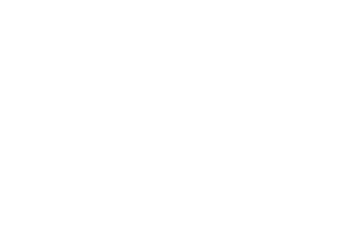

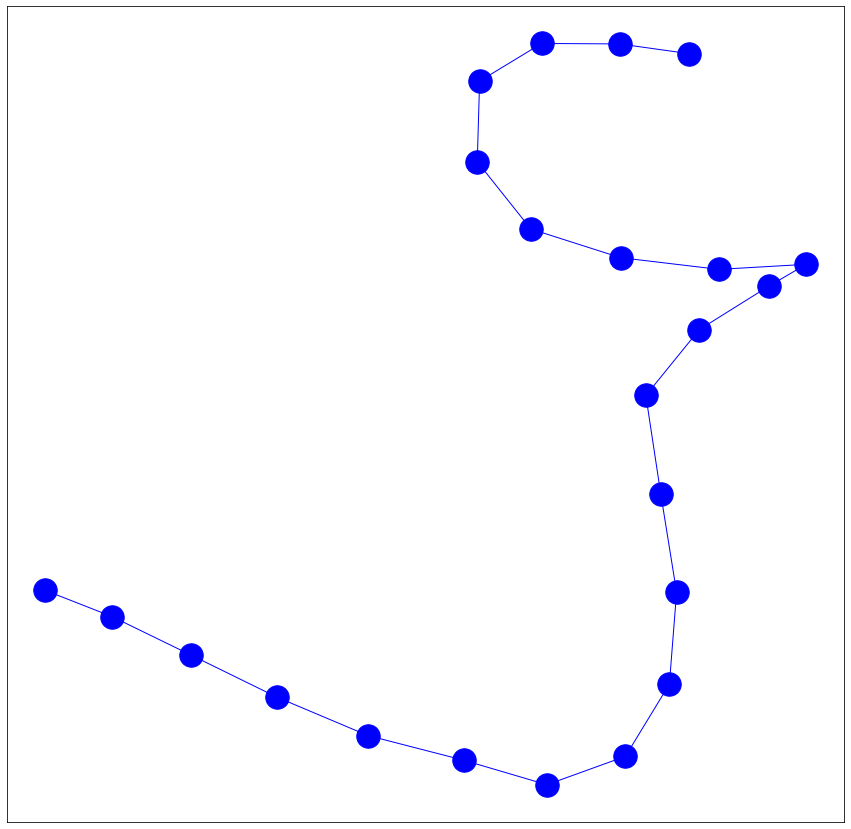

---Normalizing raw data---
----Processing data into windows----
Done---> Total 116 nodes formed
---User#:33 Activity#:5-----
Total nodes present in the graph are-->116
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


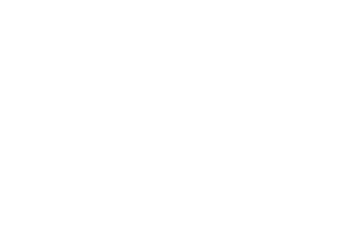

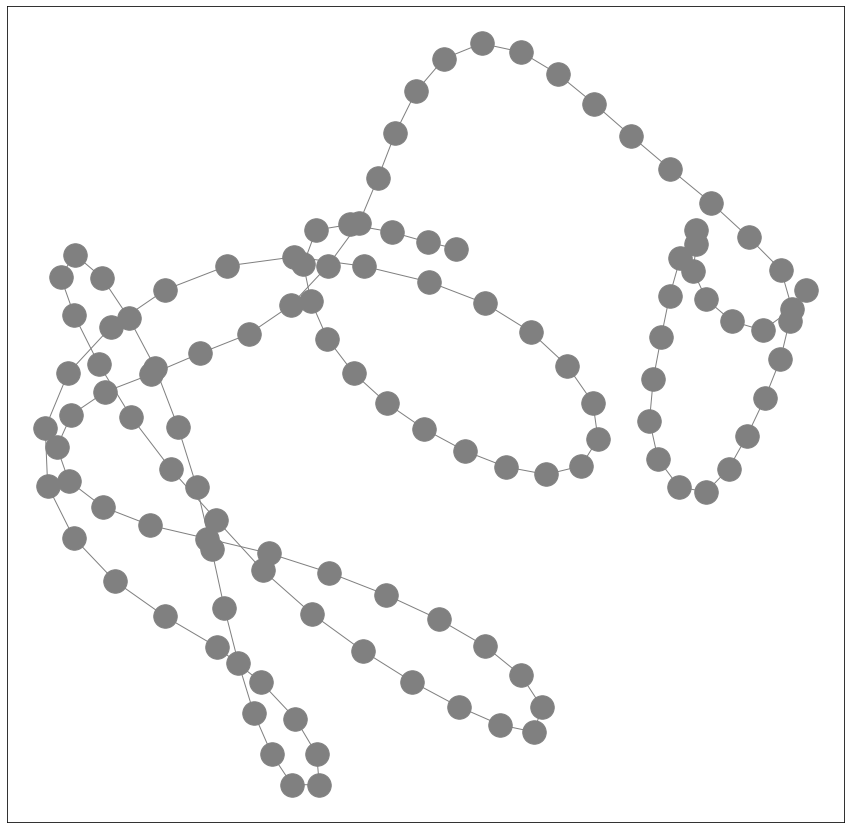

---Normalizing raw data---
----Processing data into windows----
Done---> Total 17 nodes formed
---User#:33 Activity#:4-----
Total nodes present in the graph are-->17
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['3-pink:0', '3-pink:1', '3-pink:2', '3-pink:3', '3-pink:4', '3-pink:5', '3-pink:6', '3-pink:7', '3-pink:8', '3-pink:9', '3-pink:10', '3-pink:11', '3-pink:12', '3-pink:13', '3-pink:14', '3-pink:15', '3-pink:16']
Edges of the graphs are:  [('3-pink:0', '3-pink:1'), ('3-pink:1', '3-pink:2'), ('3-pink:2', '3-pink:3'), ('3-pink:3', '3-pink:4'), ('3-pink:4', '3-pink:5'), ('3-pink:5', '

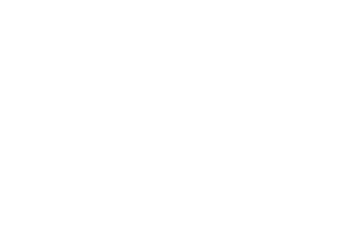

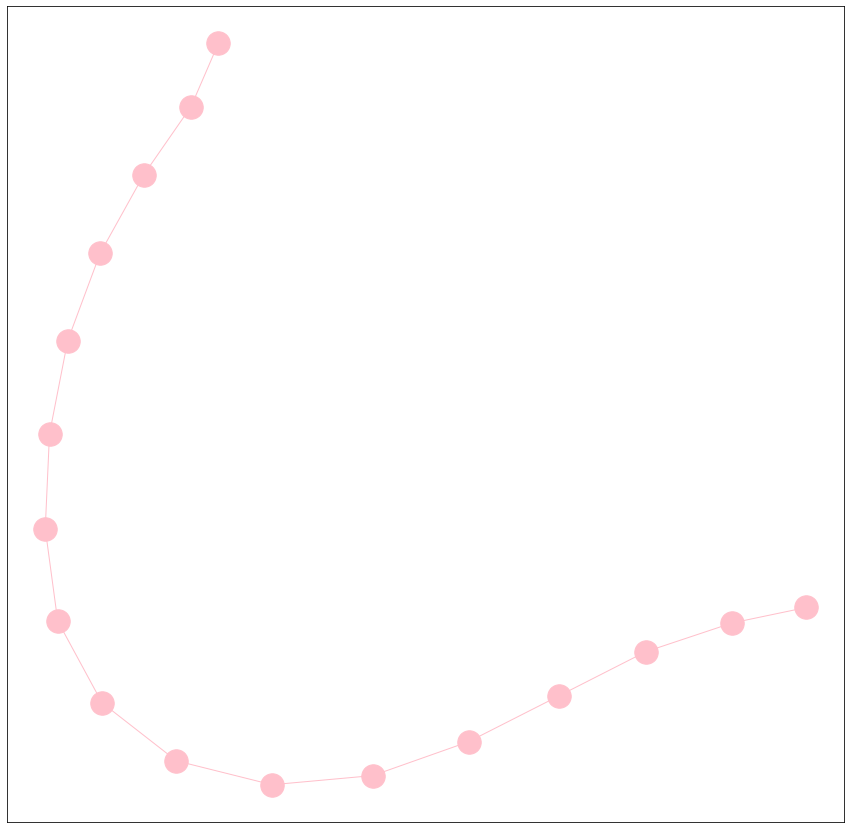

---Normalizing raw data---
----Processing data into windows----
Done---> Total 35 nodes formed
---User#:33 Activity#:0-----
Total nodes present in the graph are-->35
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
La

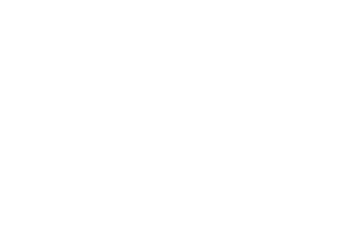

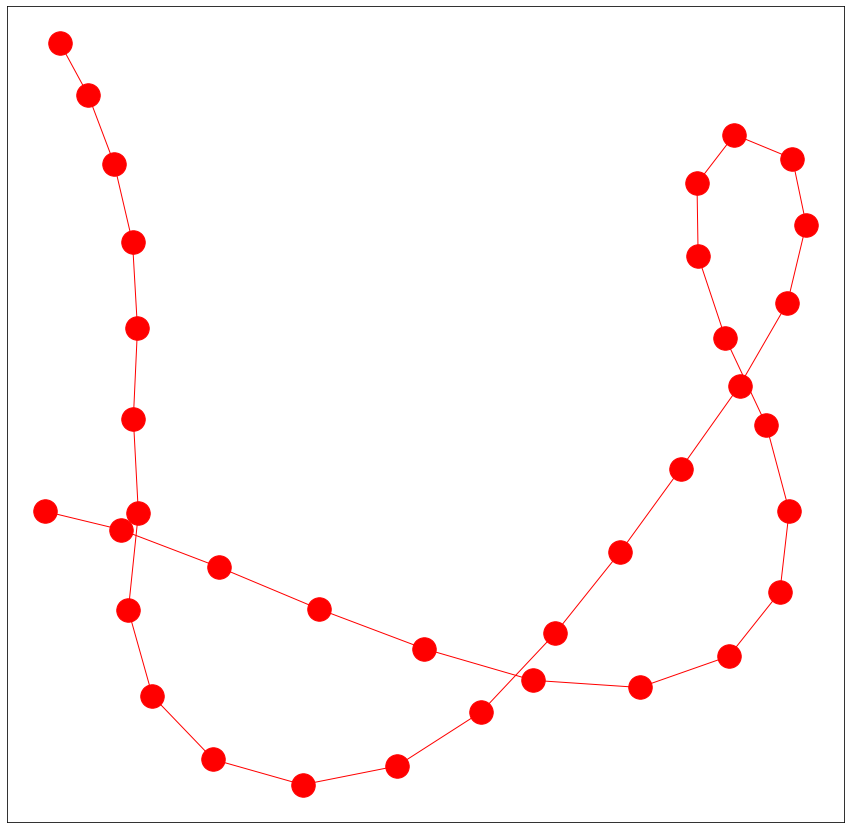

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:33 Activity#:3-----
Total nodes present in the graph are-->12
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['5-yellow:0', '5-yellow:1', '5-yellow:2', '5-yellow:3', '5-yellow:4', '5-yellow:5', '5-yellow:6', '5-yellow:7', '5-yellow:8', '5-yellow:9', '5-yellow:10', '5-yellow:11']
Edges of the graphs are:  [('5-yellow:0', '5-yellow:1'), ('5-yellow:1', '5-yellow:2'), ('5-yellow:2', '5-yellow:3'), ('5-yellow:3', '5-yellow:4'), ('5-yellow:4', '5-yellow:5'), ('5-yellow:5', '5-yellow:6'), ('5-yellow:6', '5-yellow:7'), ('5-yellow:7', '5-yellow:8'), ('5-yellow:8', '5-yellow:9'), ('5-yellow:9', '5-yellow:10'), ('5-yello

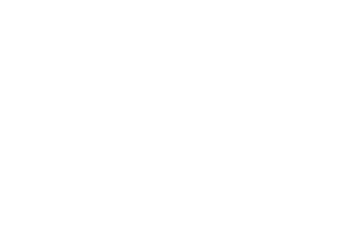

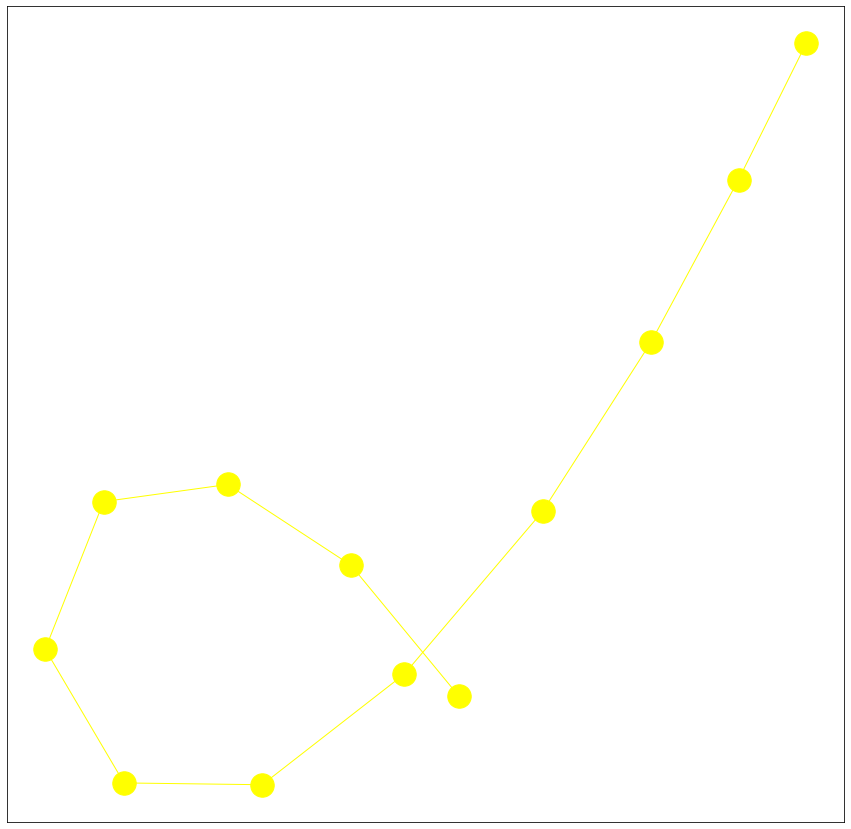

---Normalizing raw data---
----Processing data into windows----
Done---> Total 25 nodes formed
---User#:33 Activity#:2-----
Total nodes present in the graph are-->25
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['6-green:0', '6-green:1', '6-green:2', '6-green:3', '6-green:4', '6-green:5', '6-green:6', '6-green:7', '6-green:8', '6-green:9', '6-green:10', '6-green:11', '6-green:12', '6-green:1

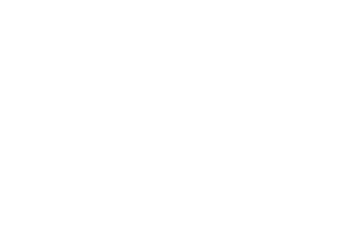

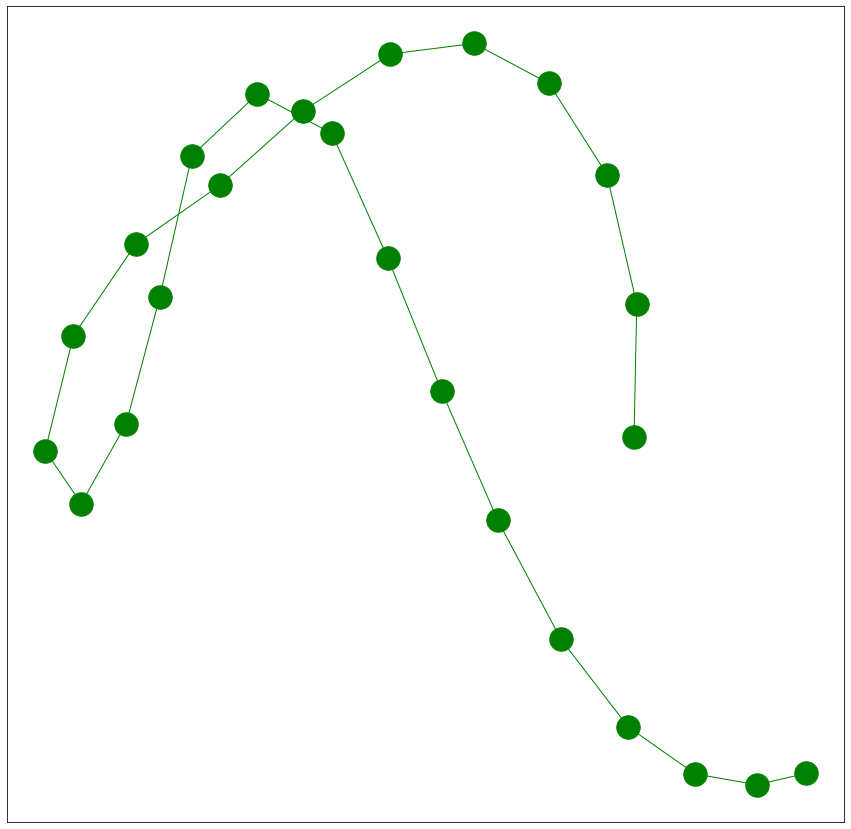

---Normalizing raw data---
----Processing data into windows----
Done---> Total 75 nodes formed
---User#:17 Activity#:5-----
Total nodes present in the graph are-->75
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

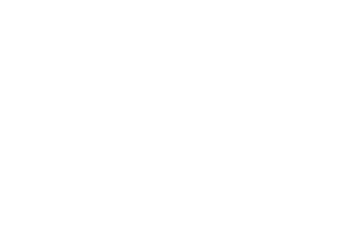

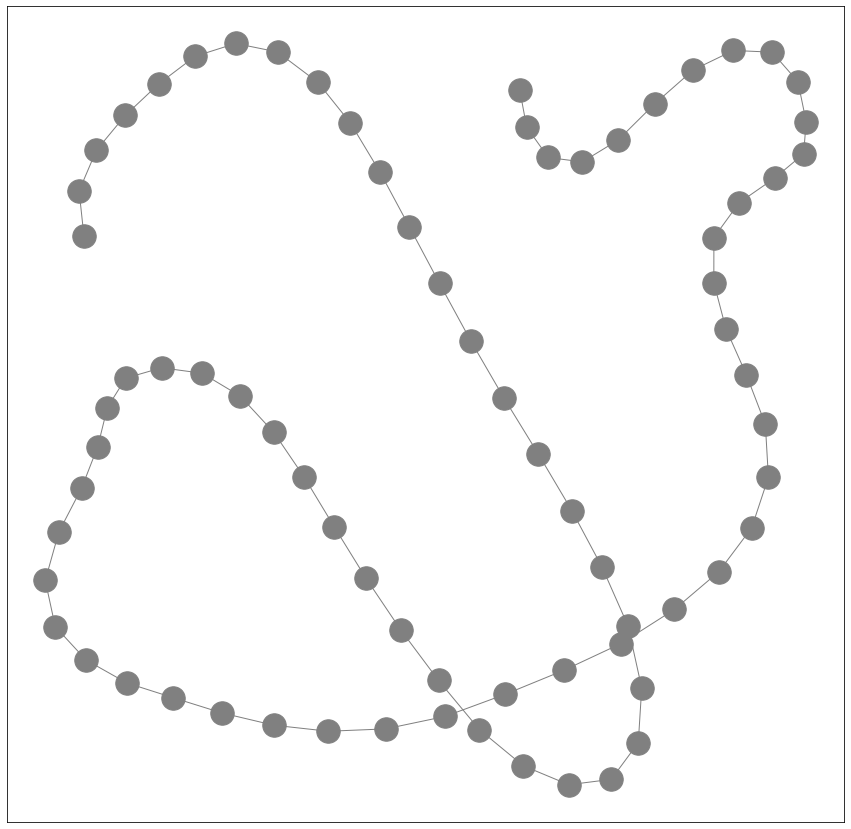

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:17 Activity#:1-----
Total nodes present in the graph are-->22
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Nodes of the graphs are:  ['8-blue:0', '8-blue:1', '8-blue:2', '8-blue:3', '8-blue:4', '8-blue:5', '8-blue:6', '8-blue:7', '8-blue:8', '8-blue:9', '8-blue:10', '8-blue:11', '8-blue:12', '8-blue:13', '8-blue:14', '8-blue:15', '8-blue:16', '8-blue:17', '8-blue:18', '8-blue:19', '8-blue

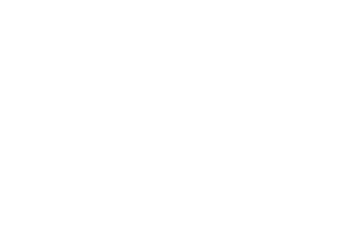

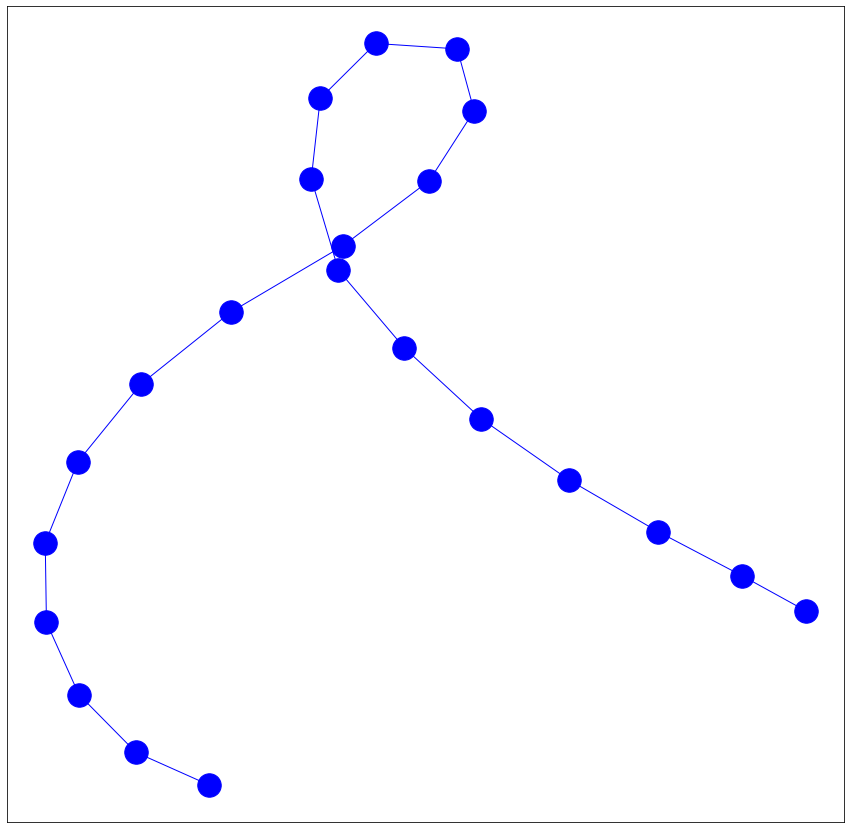

---Normalizing raw data---
----Processing data into windows----
Done---> Total 44 nodes formed
---User#:17 Activity#:4-----
Total nodes present in the graph are-->44
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

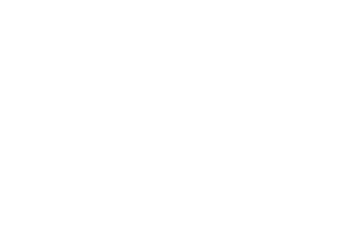

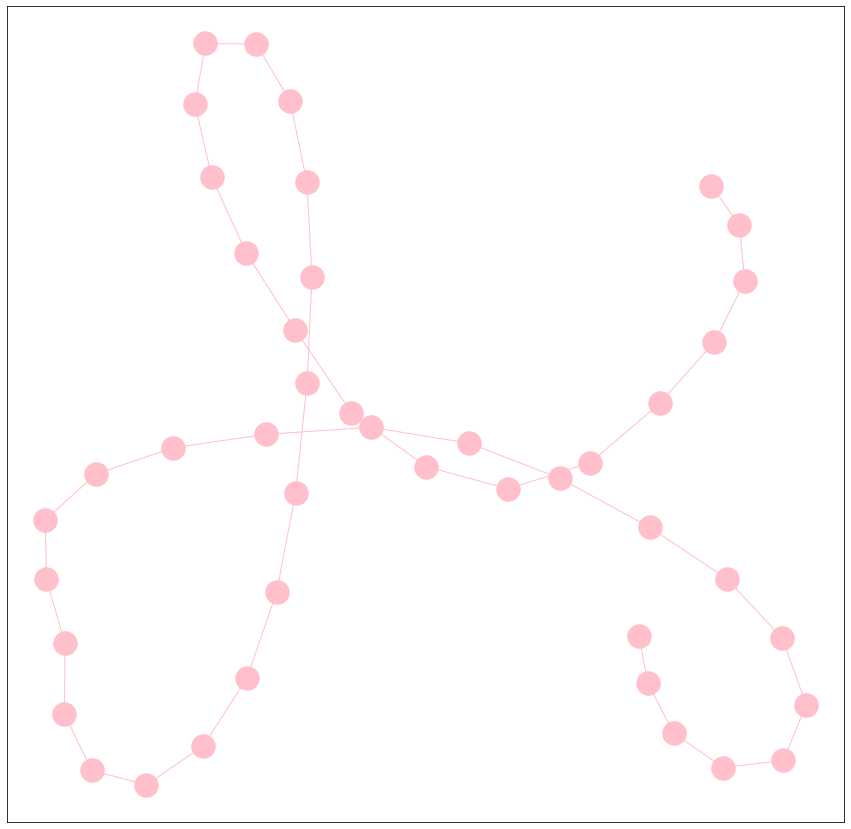

---Normalizing raw data---
----Processing data into windows----
Done---> Total 29 nodes formed
---User#:17 Activity#:0-----
Total nodes present in the graph are-->29
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['10-red:0', '10-red:1', '10-red:2', '10-red:3', '10-red:4', '10-red:5', '10-red:6'

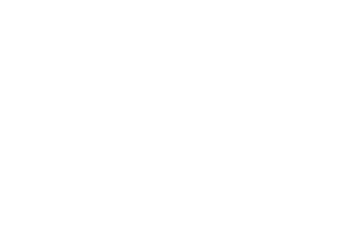

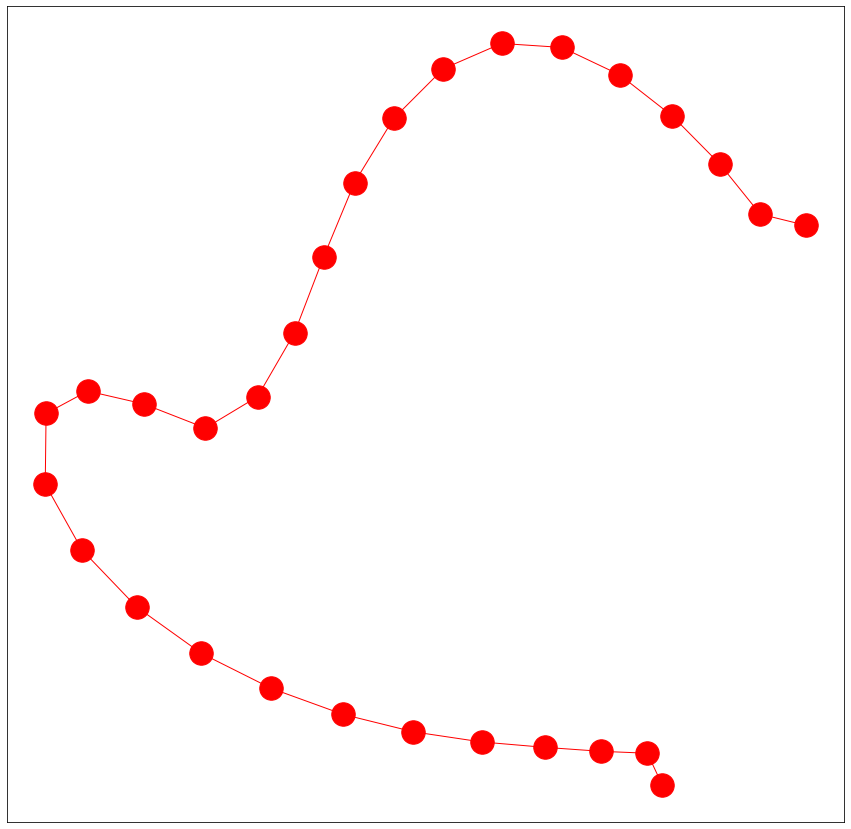

---Normalizing raw data---
----Processing data into windows----
Done---> Total 102 nodes formed
---User#:20 Activity#:5-----
Total nodes present in the graph are-->102
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


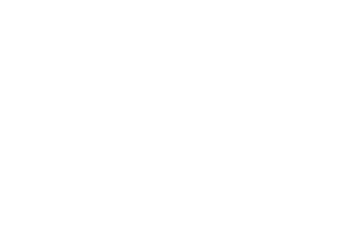

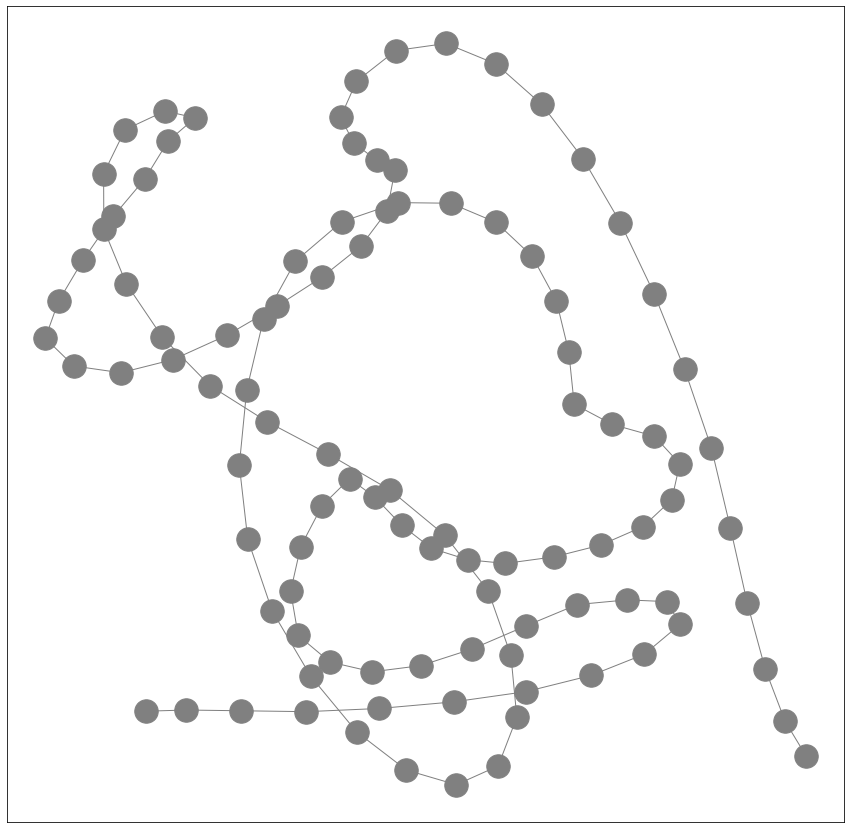

---Normalizing raw data---
----Processing data into windows----
Done---> Total 101 nodes formed
---User#:20 Activity#:1-----
Total nodes present in the graph are-->101
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:


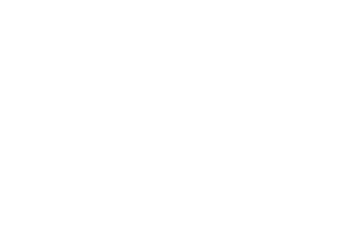

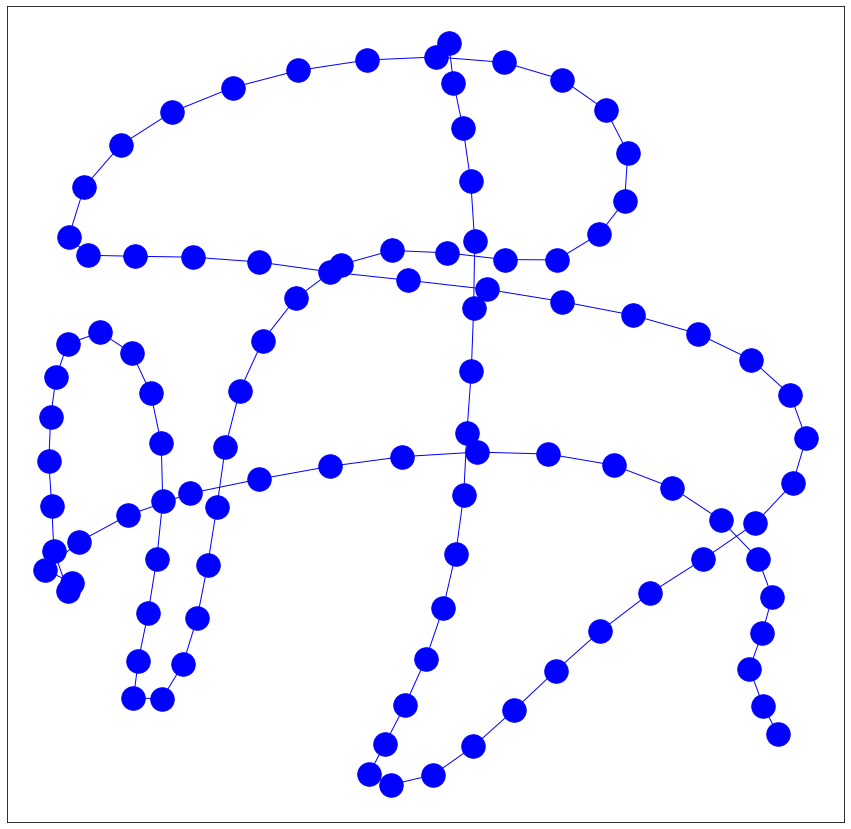

---Normalizing raw data---
----Processing data into windows----
Done---> Total 37 nodes formed
---User#:20 Activity#:4-----
Total nodes present in the graph are-->37
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

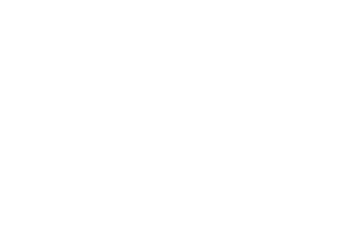

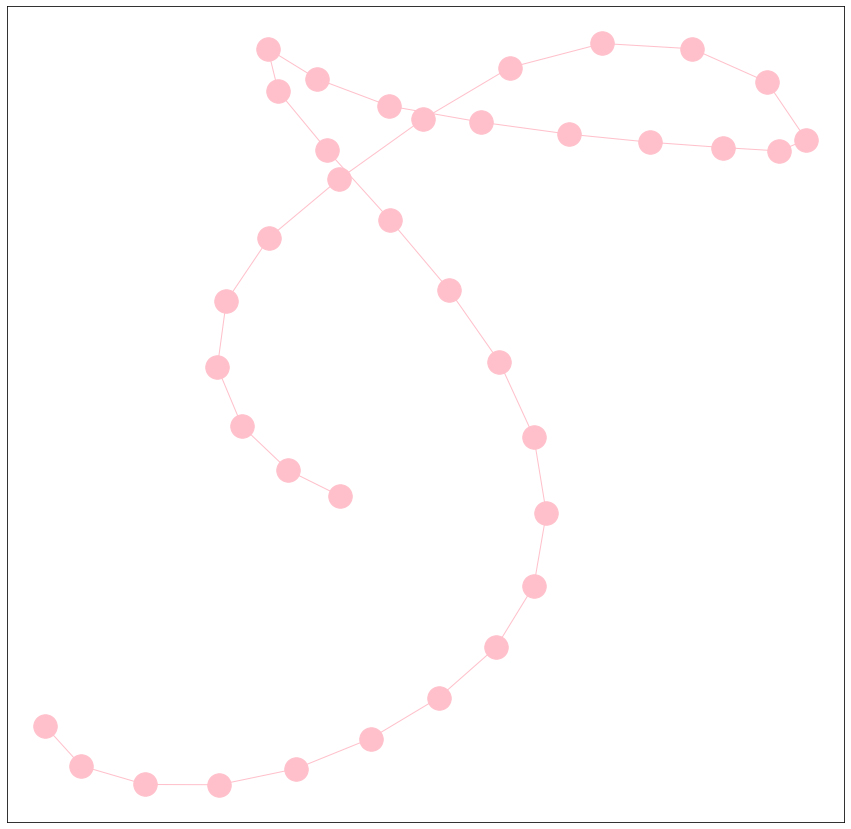

---Normalizing raw data---
----Processing data into windows----
Done---> Total 36 nodes formed
---User#:20 Activity#:0-----
Total nodes present in the graph are-->36
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
La

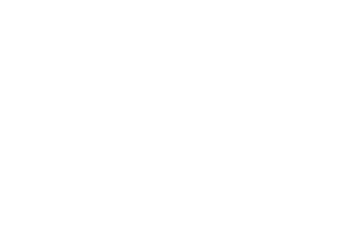

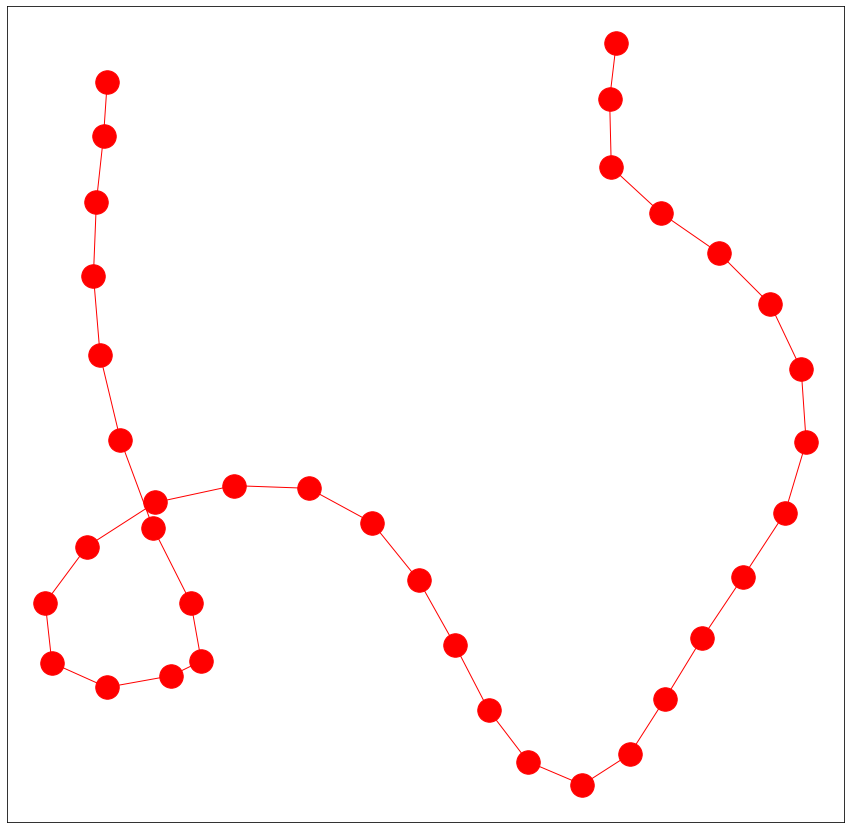

---Normalizing raw data---
----Processing data into windows----
Done---> Total 122 nodes formed
---User#:20 Activity#:2-----
Total nodes present in the graph are-->122
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:


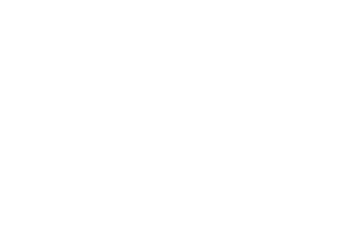

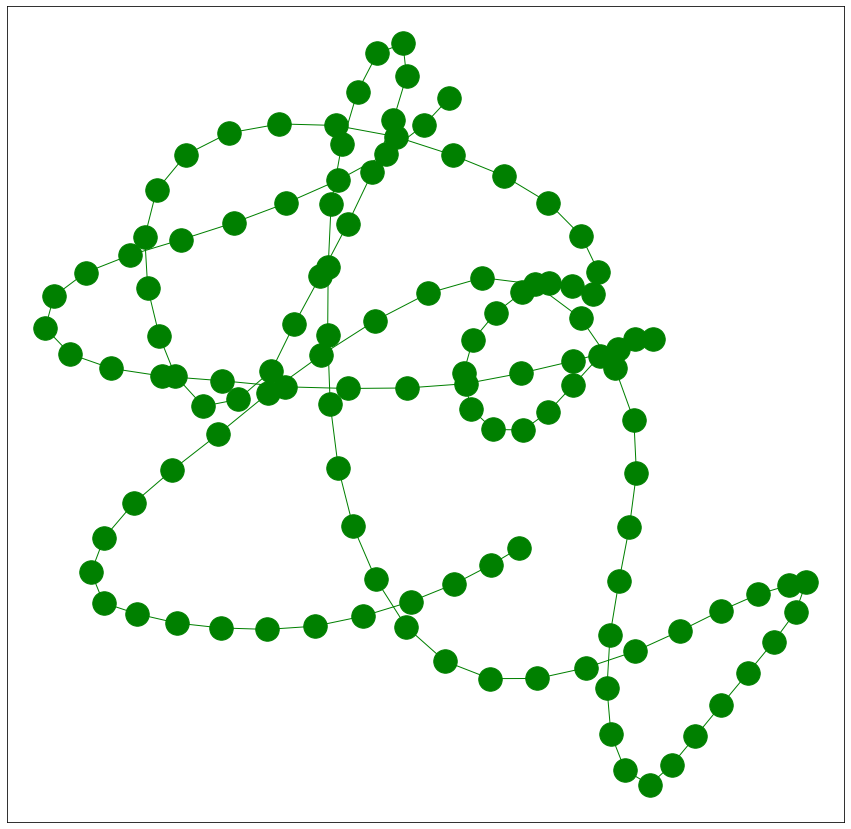

---Normalizing raw data---
----Processing data into windows----
Done---> Total 42 nodes formed
---User#:20 Activity#:3-----
Total nodes present in the graph are-->42
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
La

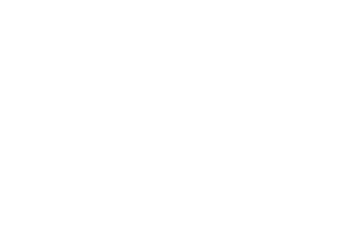

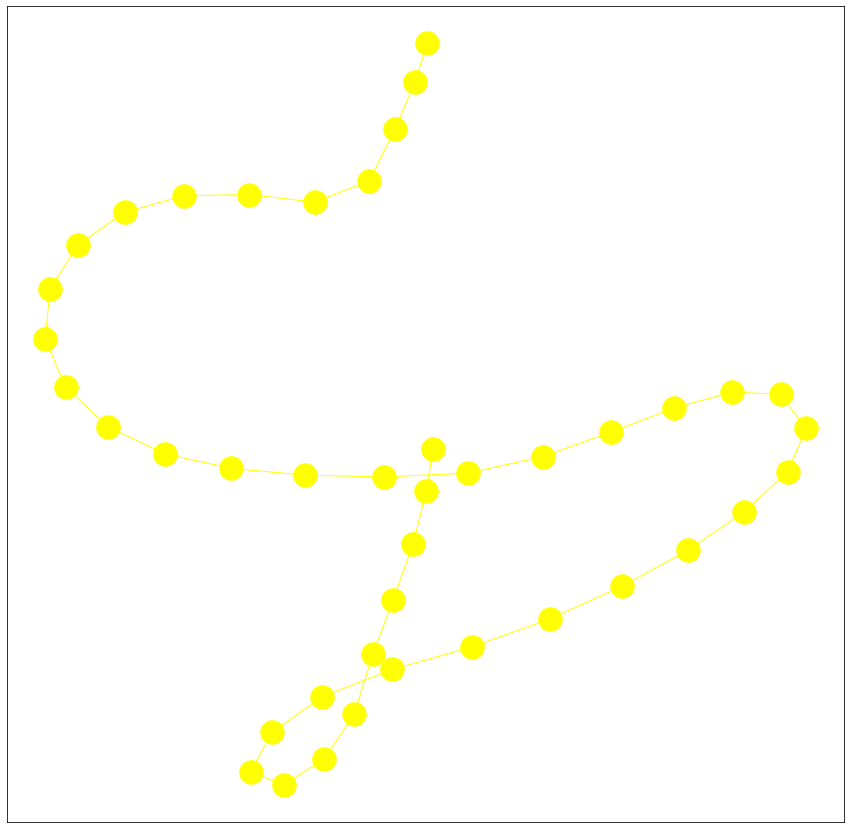

---Normalizing raw data---
----Processing data into windows----
Done---> Total 97 nodes formed
---User#:29 Activity#:5-----
Total nodes present in the graph are-->97
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

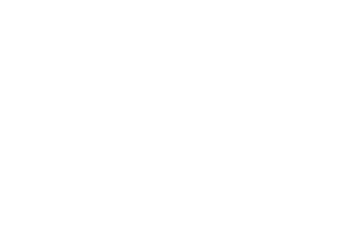

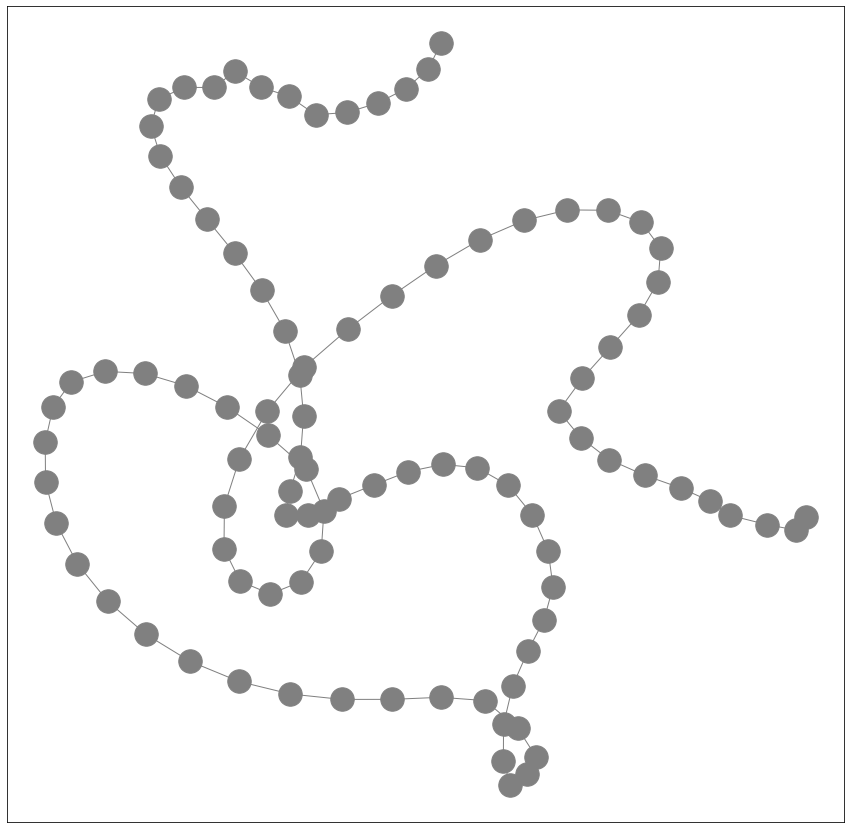

---Normalizing raw data---
----Processing data into windows----
Done---> Total 99 nodes formed
---User#:29 Activity#:1-----
Total nodes present in the graph are-->99
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

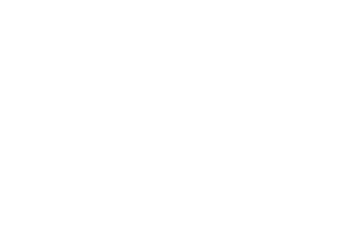

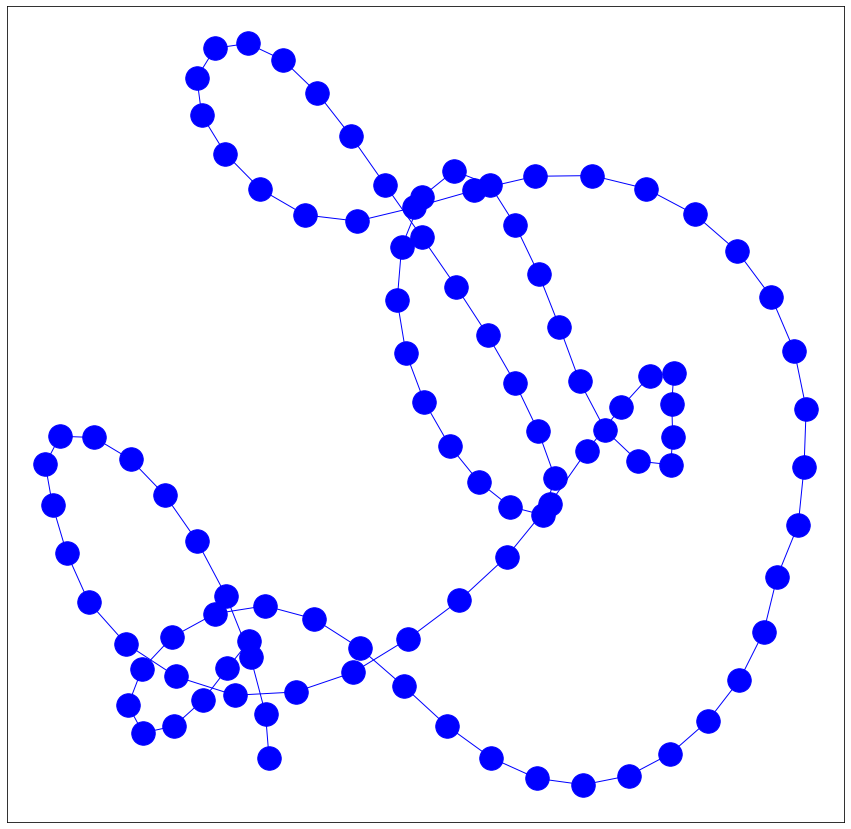

---Normalizing raw data---
----Processing data into windows----
Done---> Total 37 nodes formed
---User#:29 Activity#:4-----
Total nodes present in the graph are-->37
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

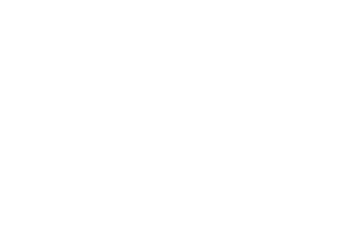

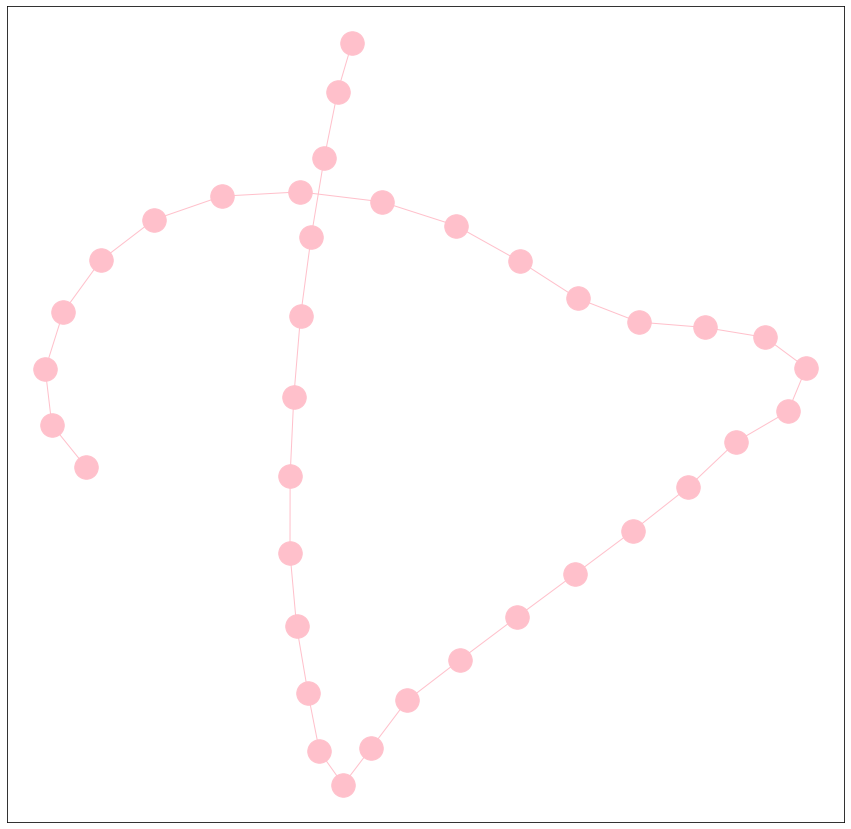

---Normalizing raw data---
----Processing data into windows----
Done---> Total 33 nodes formed
---User#:29 Activity#:0-----
Total nodes present in the graph are-->33
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of 

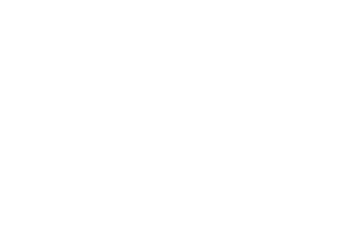

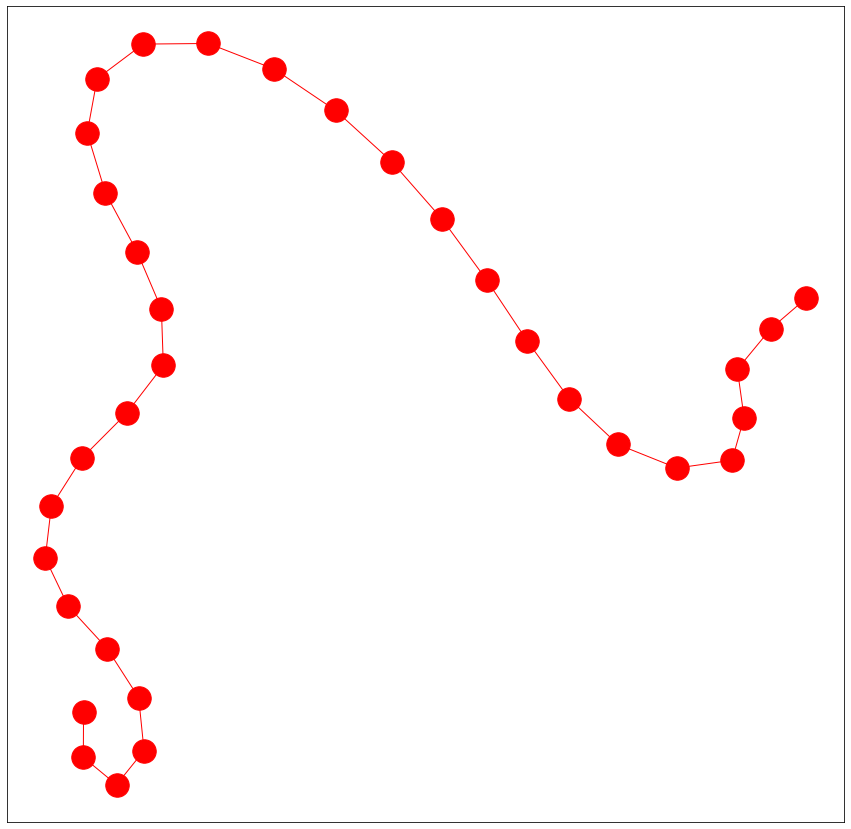

---Normalizing raw data---
----Processing data into windows----
Done---> Total 18 nodes formed
---User#:29 Activity#:2-----
Total nodes present in the graph are-->18
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['21-green:0', '21-green:1', '21-green:2', '21-green:3', '21-green:4', '21-green:5', '21-green:6', '21-green:7', '21-green:8', '21-green:9', '21-green:10', '21-green:11', '21-green:12', '21-green:13', '21-green:14', '21-green:15', '21-green:16', '21-green:17']
Edges of the graphs are:  [('21-green:0', '21-green:1'), ('21-green:1', '21-green:2'), ('21-green

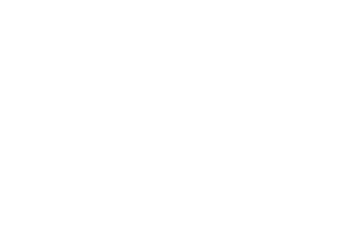

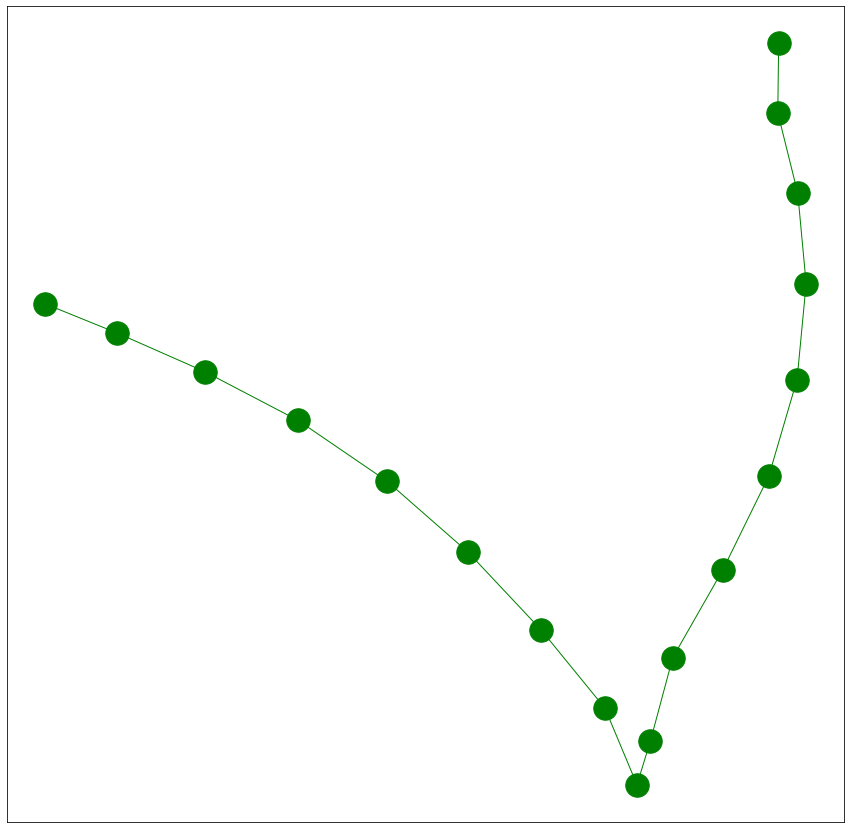

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:29 Activity#:3-----
Total nodes present in the graph are-->12
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['22-yellow:0', '22-yellow:1', '22-yellow:2', '22-yellow:3', '22-yellow:4', '22-yellow:5', '22-yellow:6', '22-yellow:7', '22-yellow:8', '22-yellow:9', '22-yellow:10', '22-yellow:11']
Edges of the graphs are:  [('22-yellow:0', '22-yellow:1'), ('22-yellow:1', '22-yellow:2'), ('22-yellow:2', '22-yellow:3'), ('22-yellow:3', '22-yellow:4'), ('22-yellow:4', '22-yellow:5'), ('22-yellow:5', '22-yellow:6'), ('22-yellow:6', '22-yellow:7'), ('22-yellow:7', '22-yellow:8'), ('22-yellow:8', '22-yellow:9'), ('22-yello

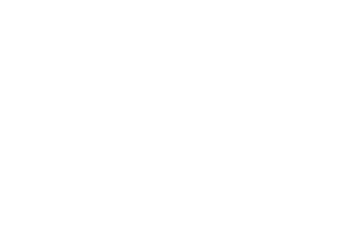

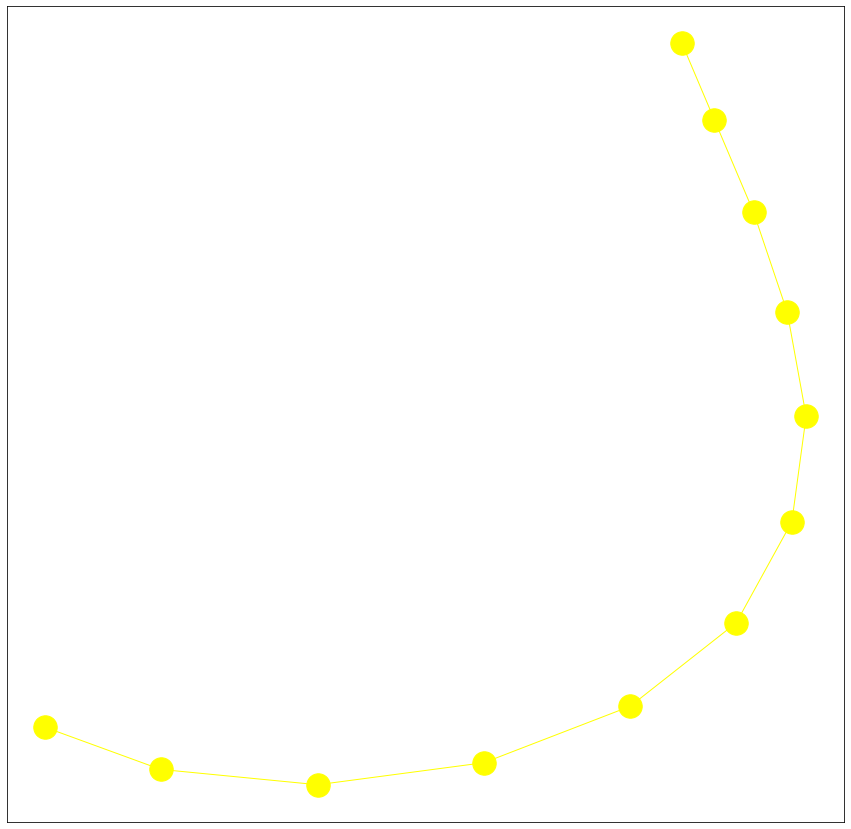

---Normalizing raw data---
----Processing data into windows----
Done---> Total 101 nodes formed
---User#:13 Activity#:5-----
Total nodes present in the graph are-->101
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


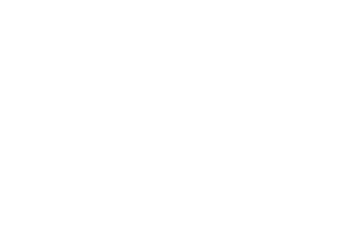

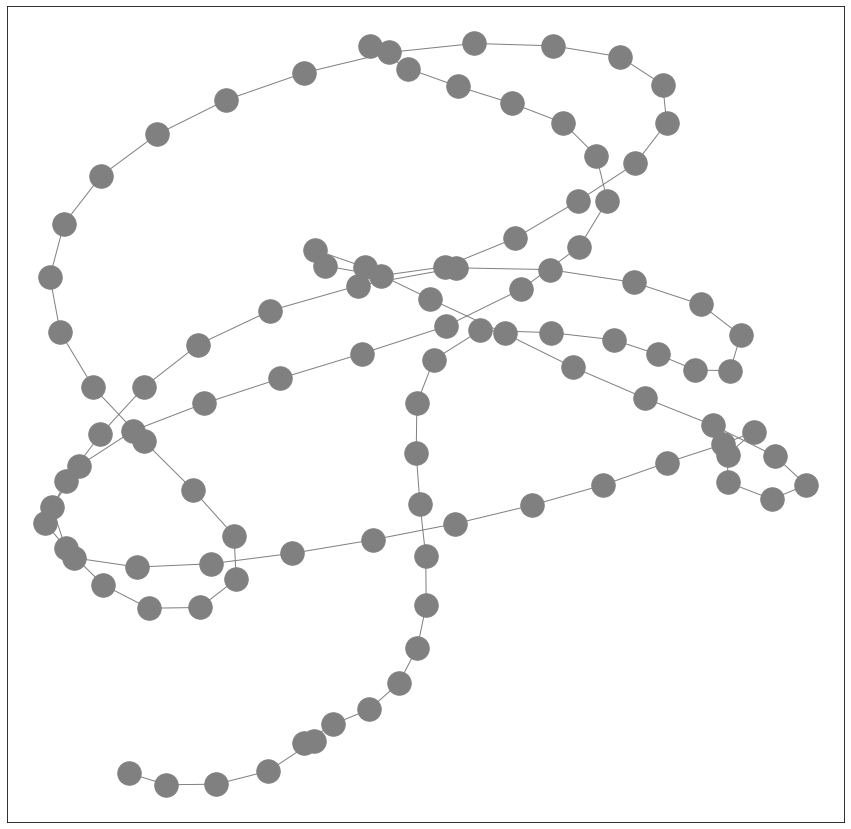

---Normalizing raw data---
----Processing data into windows----
Done---> Total 96 nodes formed
---User#:13 Activity#:1-----
Total nodes present in the graph are-->96
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

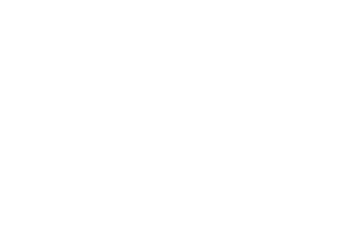

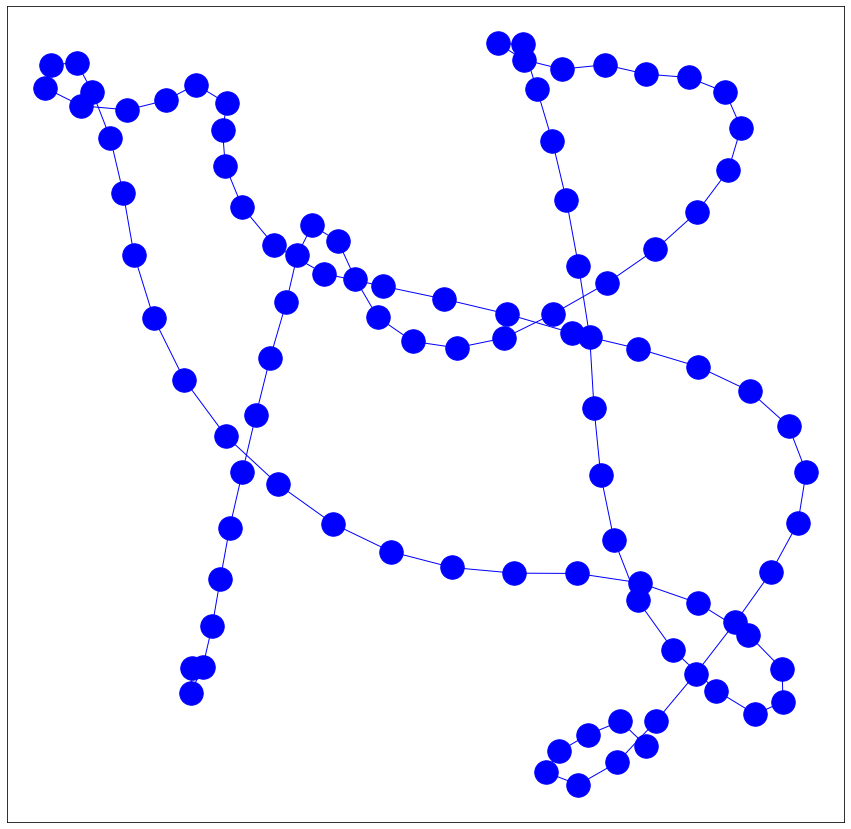

---Normalizing raw data---
----Processing data into windows----
Done---> Total 36 nodes formed
---User#:13 Activity#:4-----
Total nodes present in the graph are-->36
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

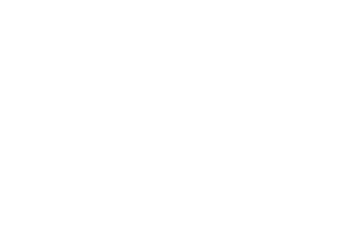

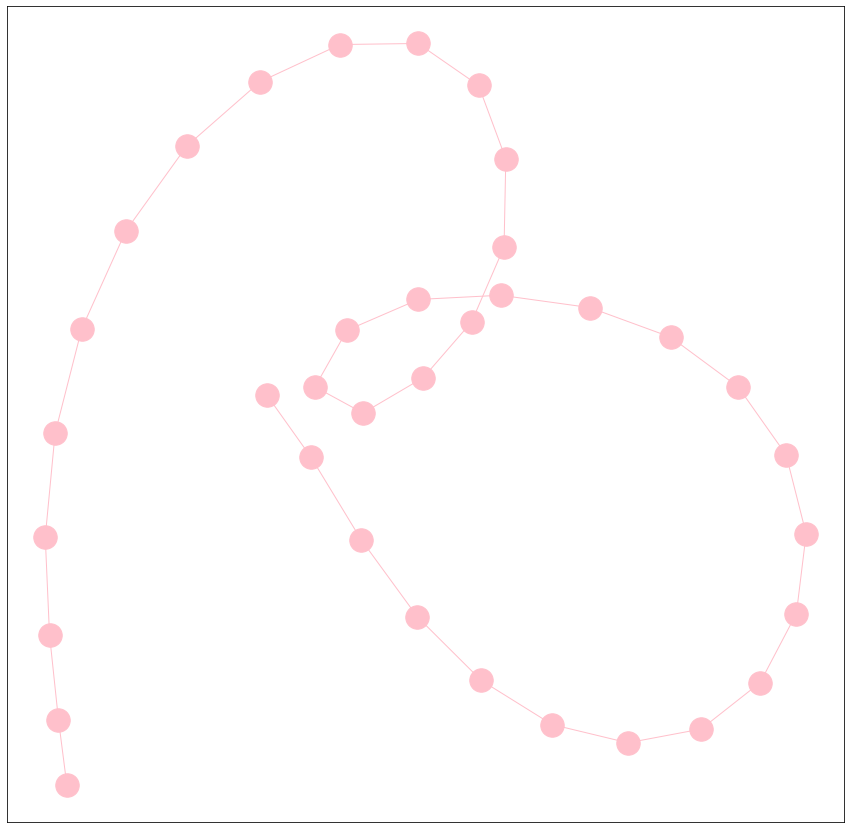

---Normalizing raw data---
----Processing data into windows----
Done---> Total 33 nodes formed
---User#:13 Activity#:0-----
Total nodes present in the graph are-->33
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of 

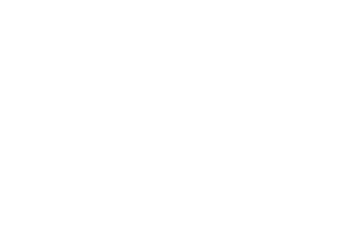

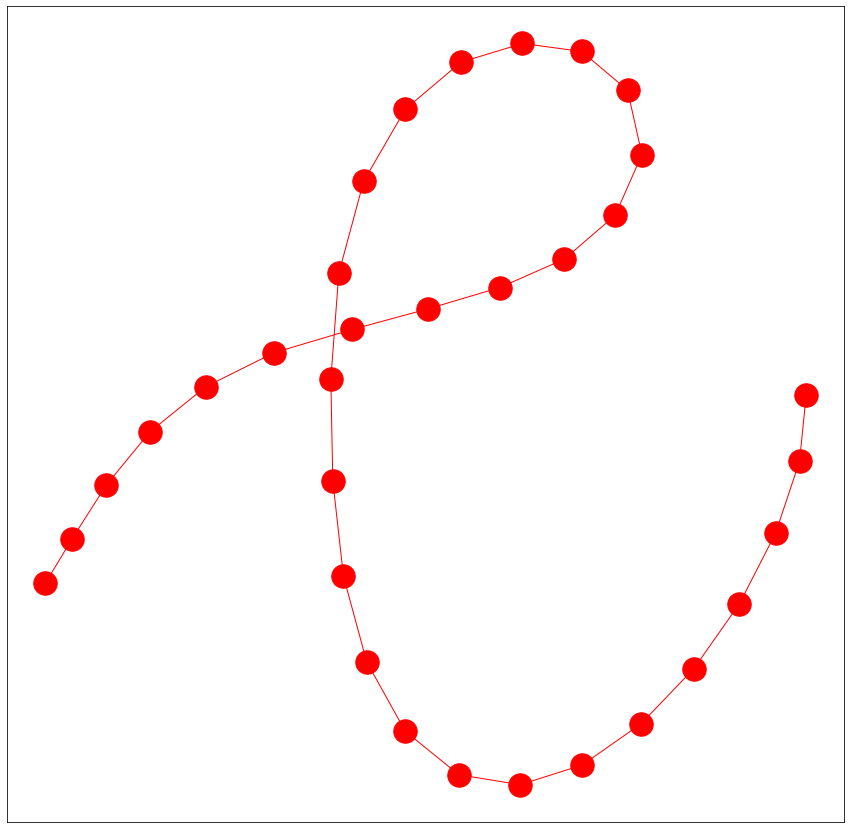

---Normalizing raw data---
----Processing data into windows----
Done---> Total 9 nodes formed
---User#:13 Activity#:2-----
Total nodes present in the graph are-->9
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['27-green:0', '27-green:1', '27-green:2', '27-green:3', '27-green:4', '27-green:5', '27-green:6', '27-green:7', '27-green:8']
Edges of the graphs are:  [('27-green:0', '27-green:1'), ('27-green:1', '27-green:2'), ('27-green:2', '27-green:3'), ('27-green:3', '27-green:4'), ('27-green:4', '27-green:5'), ('27-green:5', '27-green:6'), ('27-green:6', '27-green:7'), ('27-green:7', '27-green:8')]
[]
[]
[('27-green:0', '27-green:1'), ('27-green:1', '27-green:2'), ('27-green:2', '27-green:3'), ('27-green:3', '27-green:4'), ('27-green:4', '27-green:5'), ('27-green:5', '27-green:6'), ('27

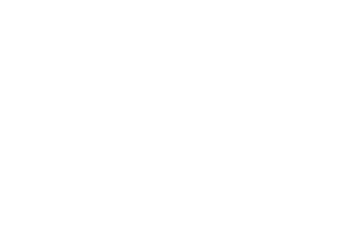

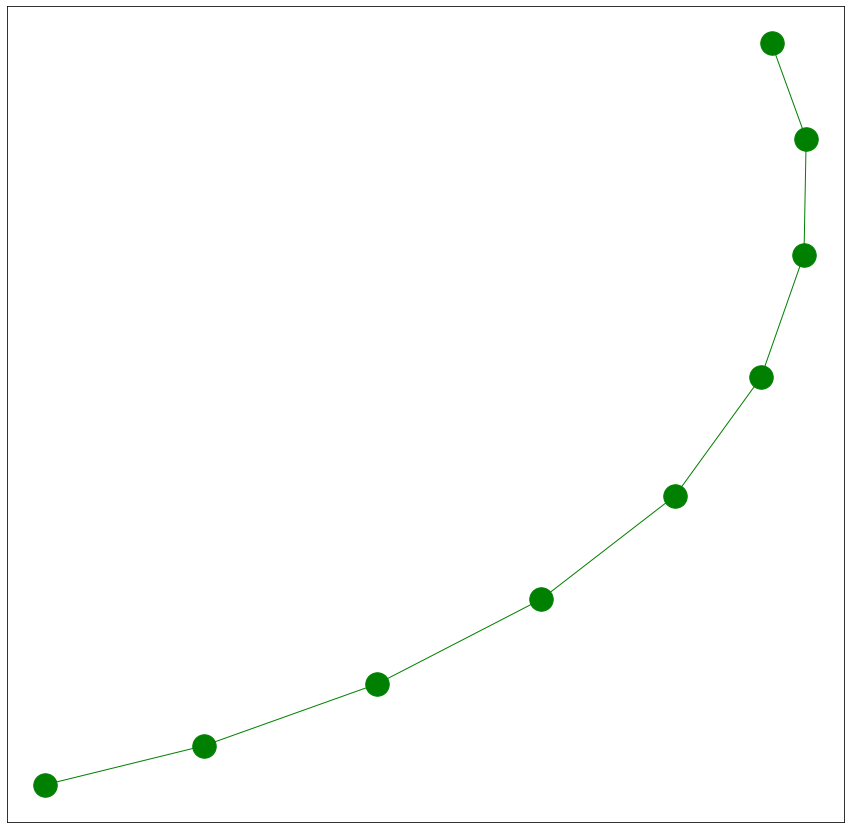

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:13 Activity#:3-----
Total nodes present in the graph are-->12
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['28-yellow:0', '28-yellow:1', '28-yellow:2', '28-yellow:3', '28-yellow:4', '28-yellow:5', '28-yellow:6', '28-yellow:7', '28-yellow:8', '28-yellow:9', '28-yellow:10', '28-yellow:11']
Edges of the graphs are:  [('28-yellow:0', '28-yellow:1'), ('28-yellow:1', '28-yellow:2'), ('28-yellow:2', '28-yellow:3'), ('28-yellow:3', '28-yellow:4'), ('28-yellow:4', '28-yellow:5'), ('28-yellow:5', '28-yellow:6'), ('28-yellow:6', '28-yellow:7'), ('28-yellow:7', '28-yellow:8'), ('28-yellow:8', '28-yellow:9'), ('28-yello

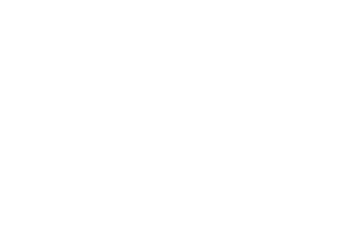

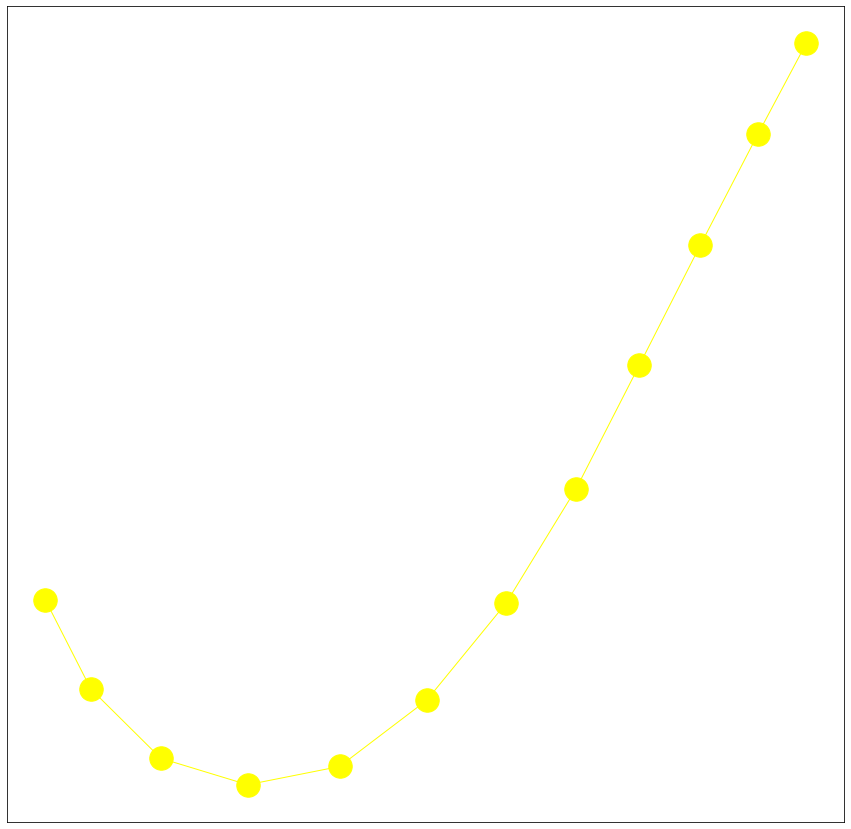

---Normalizing raw data---
----Processing data into windows----
Done---> Total 99 nodes formed
---User#:15 Activity#:1-----
Total nodes present in the graph are-->99
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

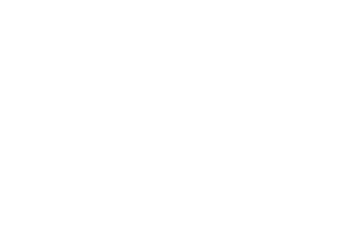

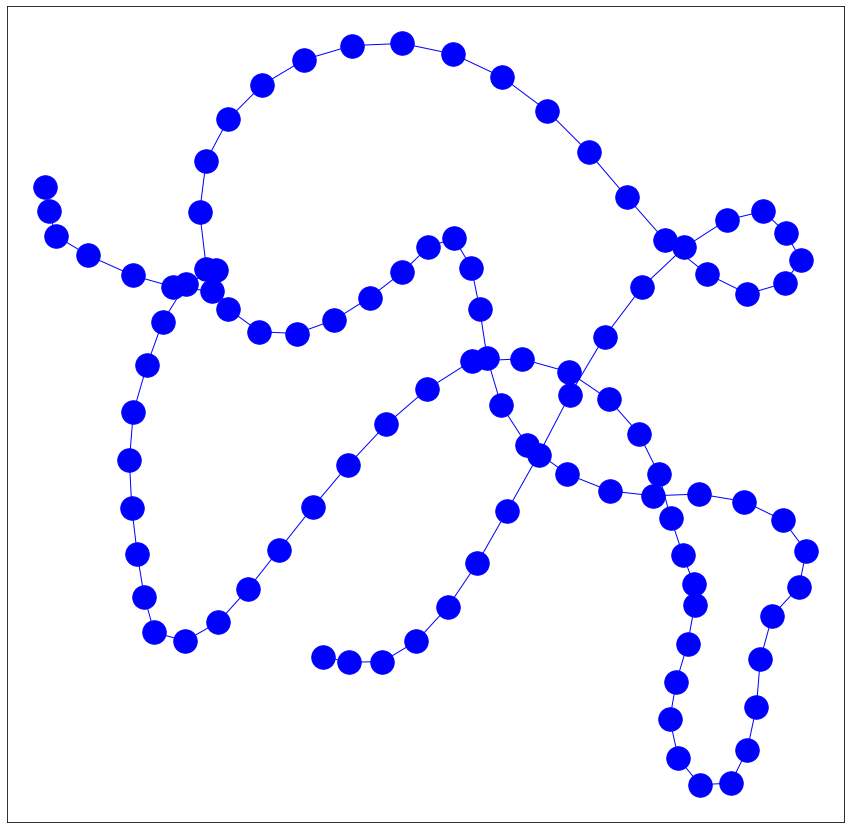

---Normalizing raw data---
----Processing data into windows----
Done---> Total 90 nodes formed
---User#:15 Activity#:5-----
Total nodes present in the graph are-->90
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

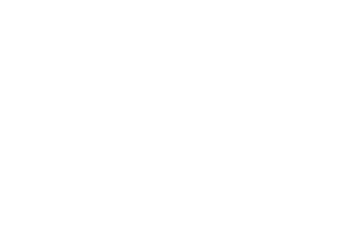

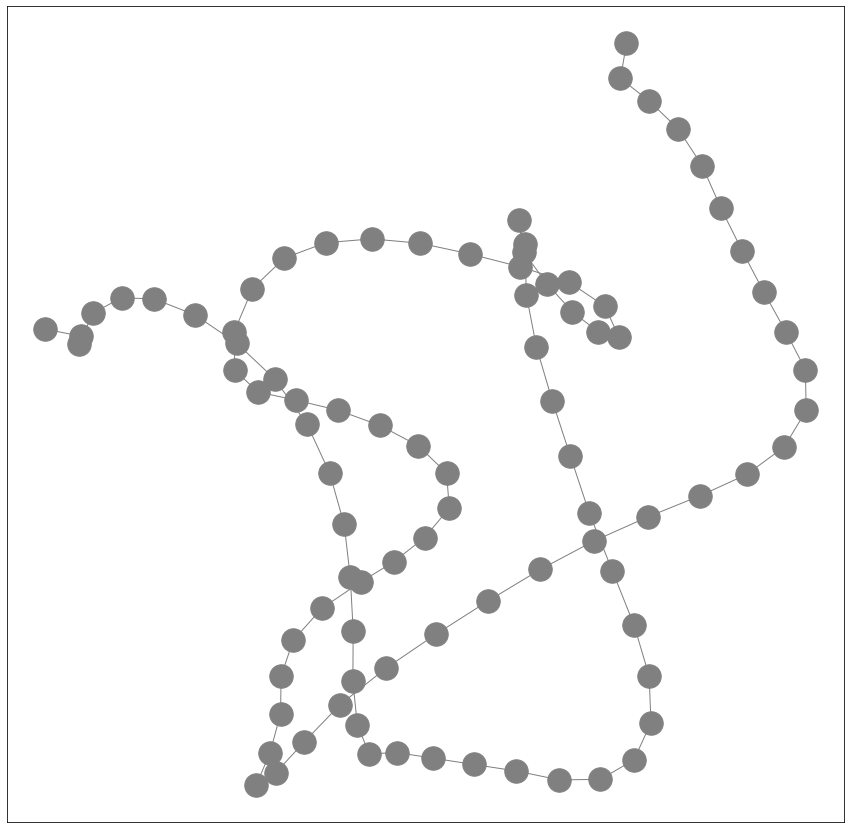

---Normalizing raw data---
----Processing data into windows----
Done---> Total 16 nodes formed
---User#:15 Activity#:4-----
Total nodes present in the graph are-->16
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['31-pink:0', '31-pink:1', '31-pink:2', '31-pink:3', '31-pink:4', '31-pink:5', '31-pink:6', '31-pink:7', '31-pink:8', '31-pink:9', '31-pink:10', '31-pink:11', '31-pink:12', '31-pink:13', '31-pink:14', '31-pink:15']
Edges of the graphs are:  [('31-pink:0', '31-pink:1'), ('31-pink:1', '31-pink:2'), ('31-pink:2', '31-pink:3'), ('31-pink:3', '31-pink:4'), ('31-pink:4', '31-pink:5'), ('31-pink:5', '31-pink:6')

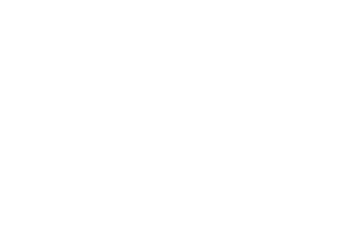

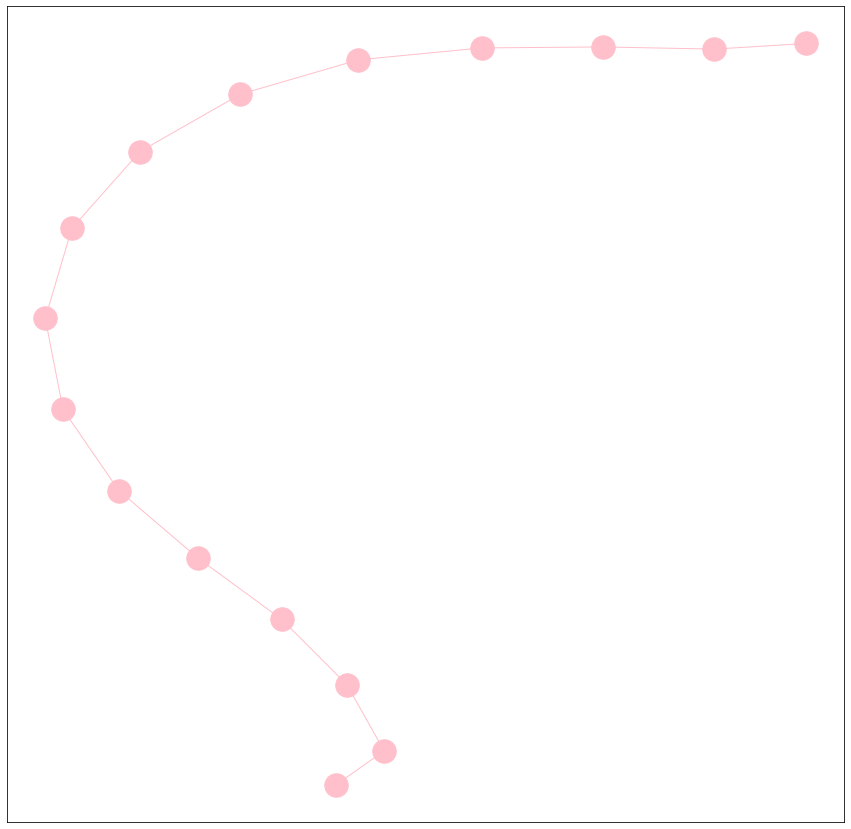

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:15 Activity#:0-----
Total nodes present in the graph are-->13
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['32-red:0', '32-red:1', '32-red:2', '32-red:3', '32-red:4', '32-red:5', '32-red:6', '32-red:7', '32-red:8', '32-red:9', '32-red:10', '32-red:11', '32-red:12']
Edges of the graphs are:  [('32-red:0', '32-red:1'), ('32-red:1', '32-red:2'), ('32-red:2', '32-red:3'), ('32-red:3', '32-red:4'), ('32-red:4', '32-red:5'), ('32-red:5', '32-red:6'), ('32-red:6', '32-red:7'), ('32-red:7', '32-red:8'), ('32-red:8', '32-red:9'), ('32-red:9', '32-red:10'), ('32-red:10', '32-red:11'), ('32-re

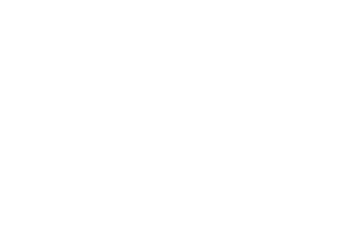

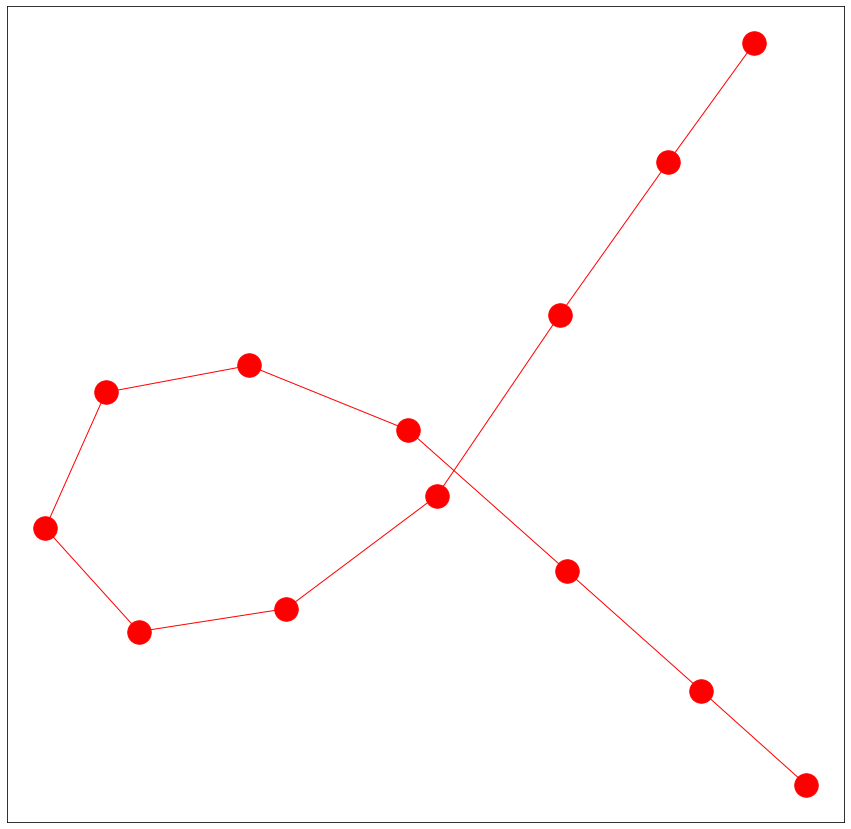

---Normalizing raw data---
----Processing data into windows----
Done---> Total 92 nodes formed
---User#:6 Activity#:1-----
Total nodes present in the graph are-->92
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

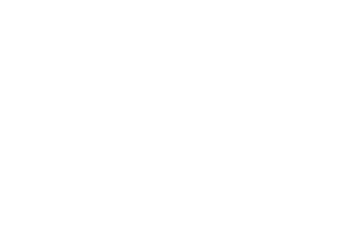

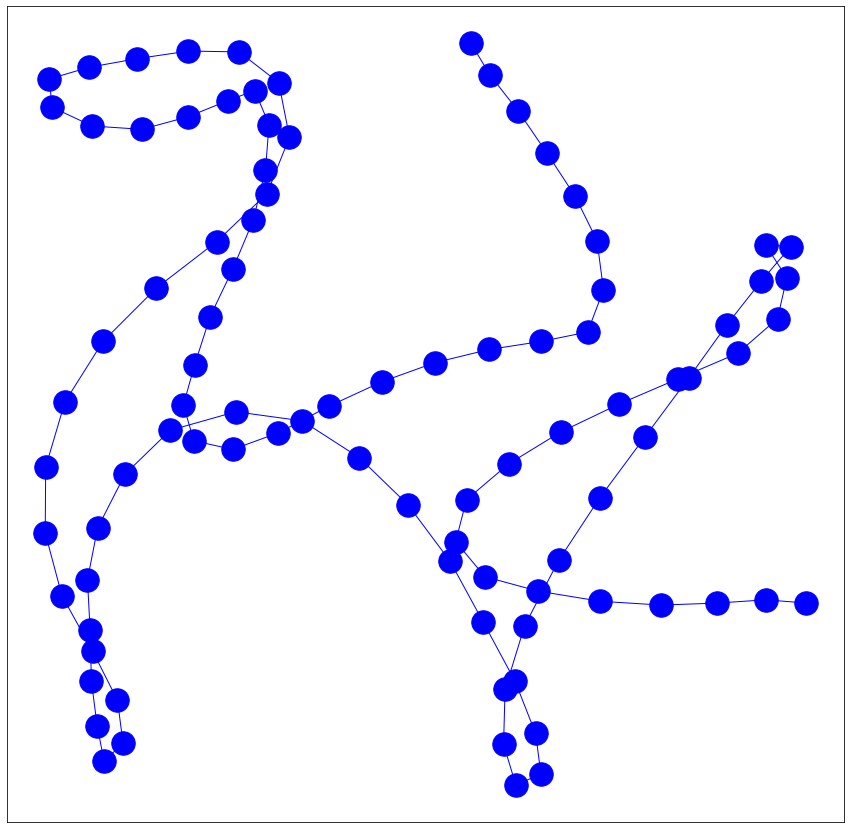

---Normalizing raw data---
----Processing data into windows----
Done---> Total 96 nodes formed
---User#:6 Activity#:5-----
Total nodes present in the graph are-->96
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Lab

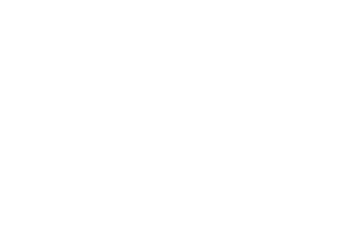

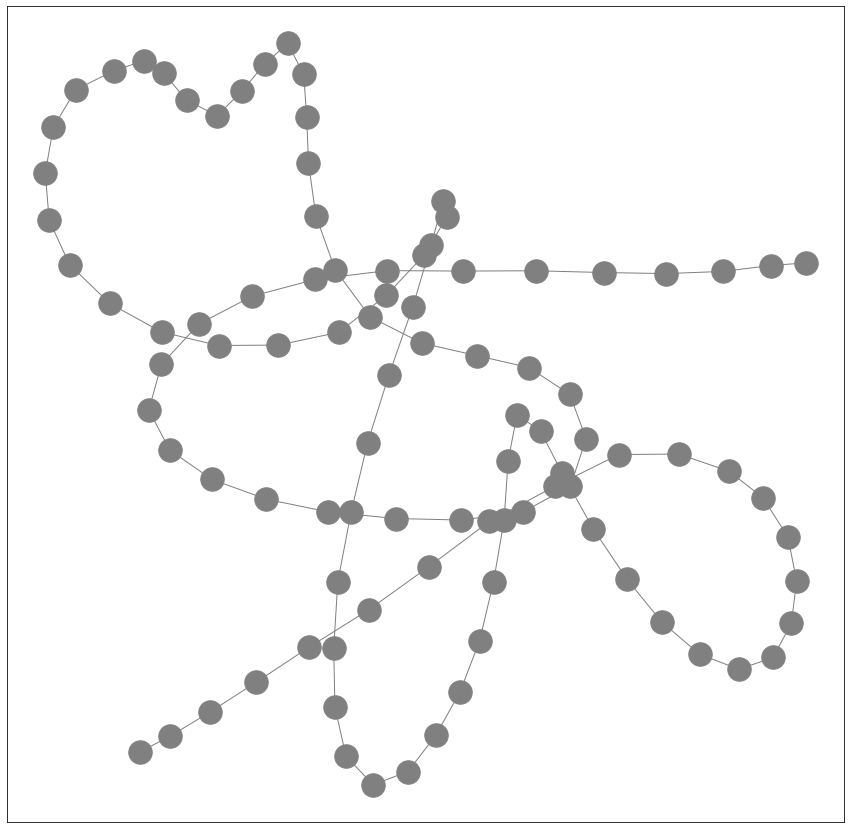

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:6 Activity#:4-----
Total nodes present in the graph are-->13
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['35-pink:0', '35-pink:1', '35-pink:2', '35-pink:3', '35-pink:4', '35-pink:5', '35-pink:6', '35-pink:7', '35-pink:8', '35-pink:9', '35-pink:10', '35-pink:11', '35-pink:12']
Edges of the graphs are:  [('35-pink:0', '35-pink:1'), ('35-pink:1', '35-pink:2'), ('35-pink:2', '35-pink:3'), ('35-pink:3', '35-pink:4'), ('35-pink:4', '35-pink:5'), ('35-pink:5', '35-pink:6'), ('35-pink:6', '35-pink:7'), ('35-pink:7', '35-pink:8'), ('35-pink:8', '35-pink:9'), ('35-pink:9', '35-pink:10'), ('3

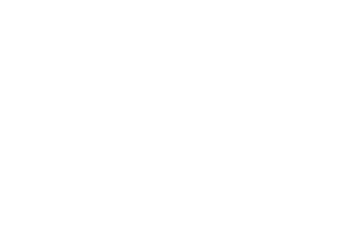

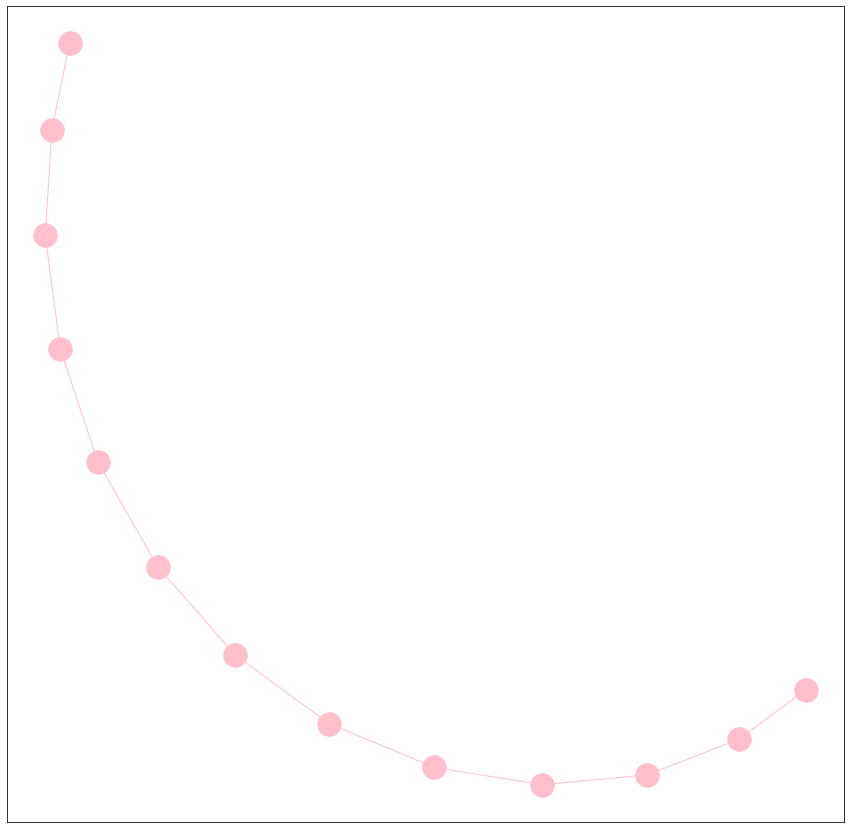

---Normalizing raw data---
----Processing data into windows----
Done---> Total 11 nodes formed
---User#:6 Activity#:0-----
Total nodes present in the graph are-->11
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['36-red:0', '36-red:1', '36-red:2', '36-red:3', '36-red:4', '36-red:5', '36-red:6', '36-red:7', '36-red:8', '36-red:9', '36-red:10']
Edges of the graphs are:  [('36-red:0', '36-red:1'), ('36-red:1', '36-red:2'), ('36-red:2', '36-red:3'), ('36-red:3', '36-red:4'), ('36-red:4', '36-red:5'), ('36-red:5', '36-red:6'), ('36-red:6', '36-red:7'), ('36-red:7', '36-red:8'), ('36-red:8', '36-red:9'), ('36-red:9', '36-red:10')]
[('36-red:0', '36-red:1'), ('36-red:1', '36-red:2'), ('36-red:2', '36-red:3'), ('36-red:3', '36-red:4'), ('36-re

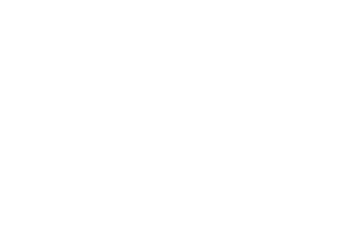

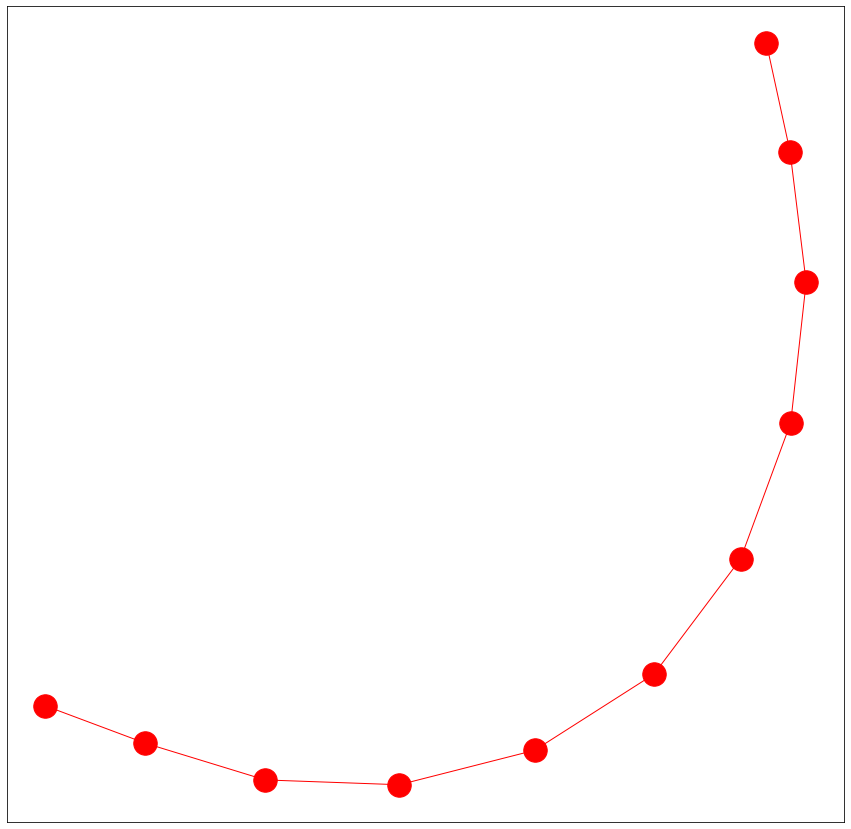

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:6 Activity#:2-----
Total nodes present in the graph are-->13
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['37-green:0', '37-green:1', '37-green:2', '37-green:3', '37-green:4', '37-green:5', '37-green:6', '37-green:7', '37-green:8', '37-green:9', '37-green:10', '37-green:11', '37-green:12']
Edges of the graphs are:  [('37-green:0', '37-green:1'), ('37-green:1', '37-green:2'), ('37-green:2', '37-green:3'), ('37-green:3', '37-green:4'), ('37-green:4', '37-green:5'), ('37-green:5', '37-green:6'), ('37-green:6', '37-green:7'), ('37-green:7', '37-green:8'), ('37-green:8', '37-green:9'), (

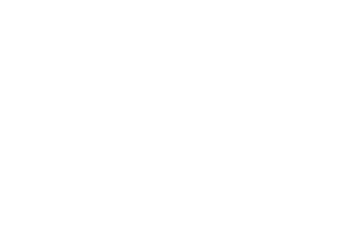

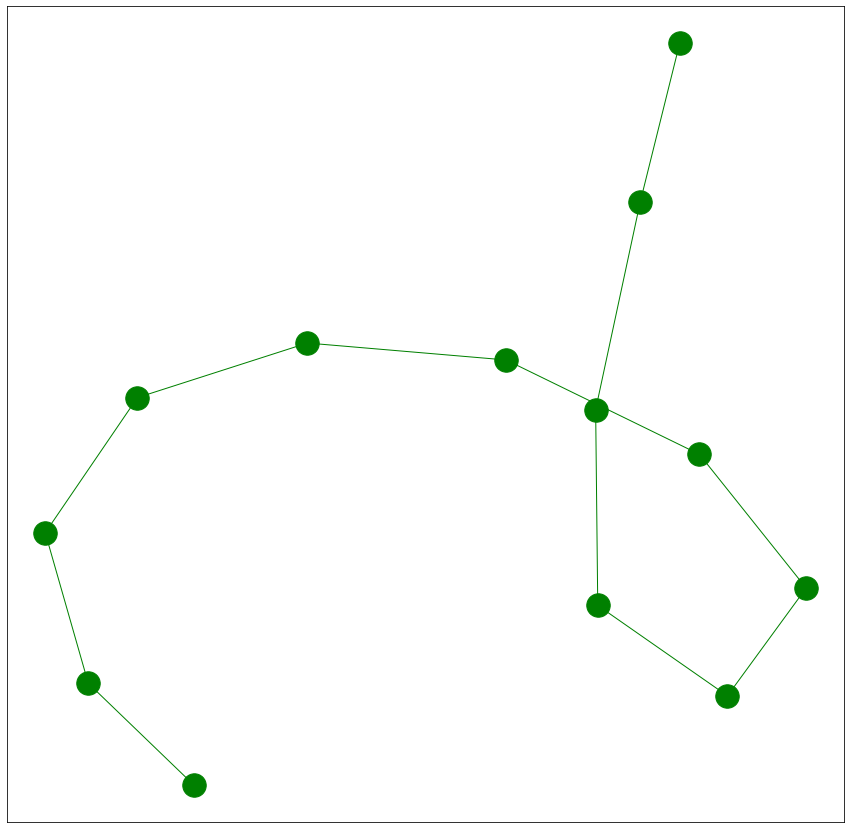

---Normalizing raw data---
----Processing data into windows----
Done---> Total 5 nodes formed
---User#:6 Activity#:3-----
Total nodes present in the graph are-->5
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['38-yellow:0', '38-yellow:1', '38-yellow:2', '38-yellow:3', '38-yellow:4']
Edges of the graphs are:  [('38-yellow:0', '38-yellow:1'), ('38-yellow:1', '38-yellow:2'), ('38-yellow:2', '38-yellow:3'), ('38-yellow:3', '38-yellow:4')]
[]
[]
[]
[('38-yellow:0', '38-yellow:1'), ('38-yellow:1', '38-yellow:2'), ('38-yellow:2', '38-yellow:3'), ('38-yellow:3', '38-yellow:4')]
[]
[]


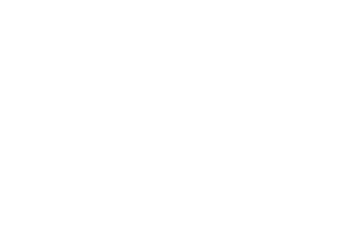

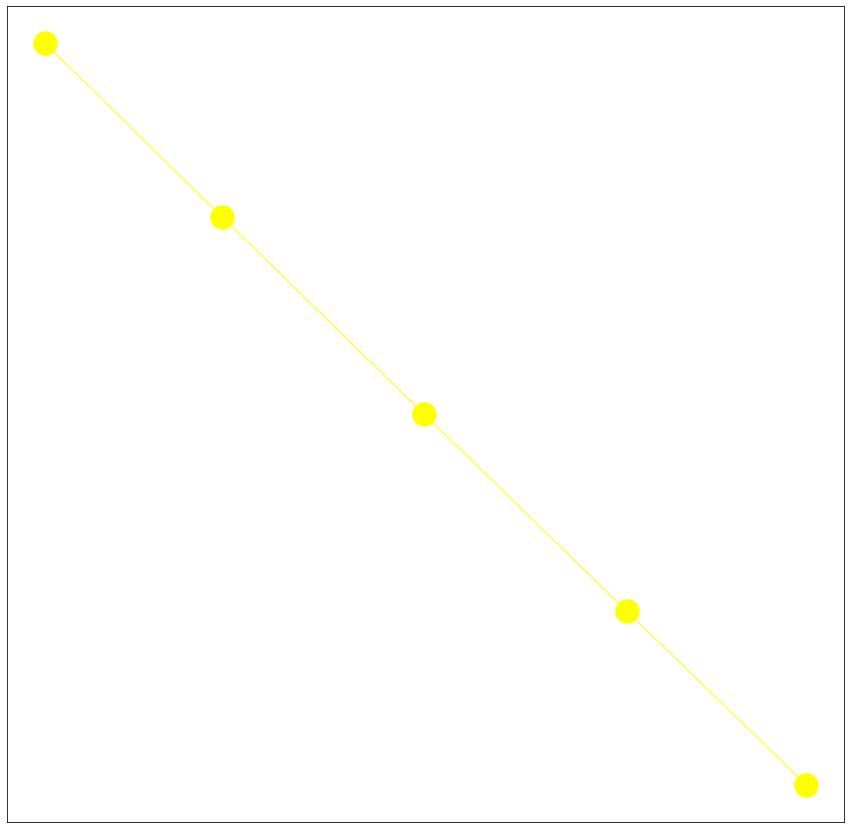

---Normalizing raw data---
----Processing data into windows----
Done---> Total 97 nodes formed
---User#:27 Activity#:5-----
Total nodes present in the graph are-->97
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

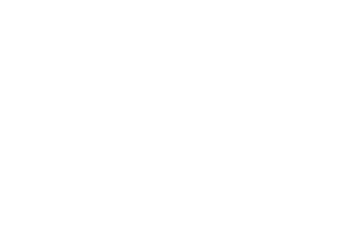

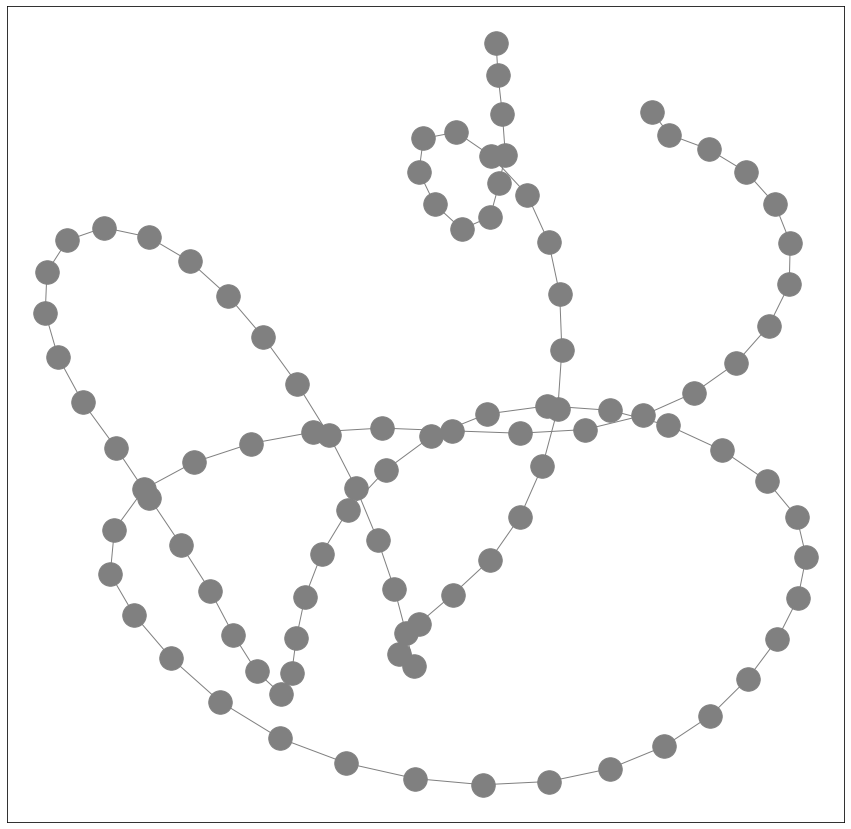

---Normalizing raw data---
----Processing data into windows----
Done---> Total 94 nodes formed
---User#:27 Activity#:1-----
Total nodes present in the graph are-->94
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

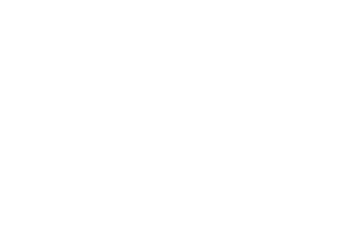

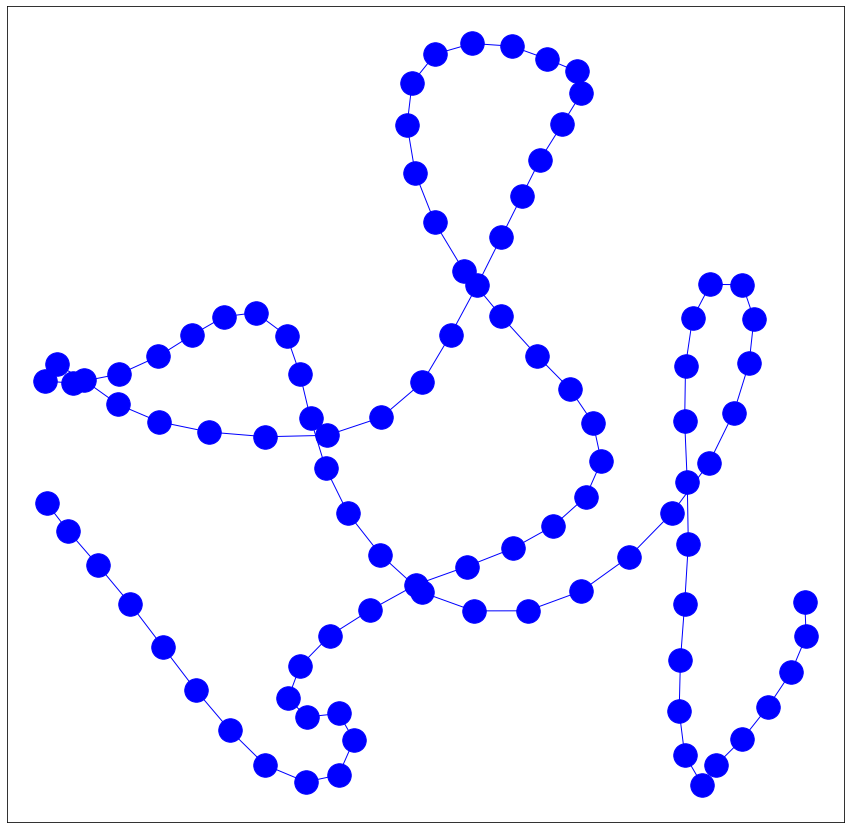

---Normalizing raw data---
----Processing data into windows----
Done---> Total 25 nodes formed
---User#:27 Activity#:4-----
Total nodes present in the graph are-->25
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['41-pink:0', '41-pink:1', '41-pink:2', '41-pink:3', '41-pink:4', '41-pink:5', '41-pink:6', '41-pink:7', '41-pink:8', '41-pink:9', '41-pink:10', '41-pink:11', '41-pink:12', '41-pink:1

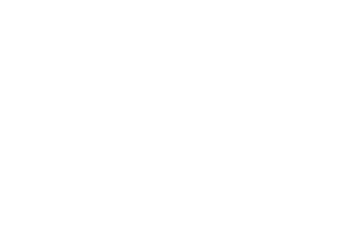

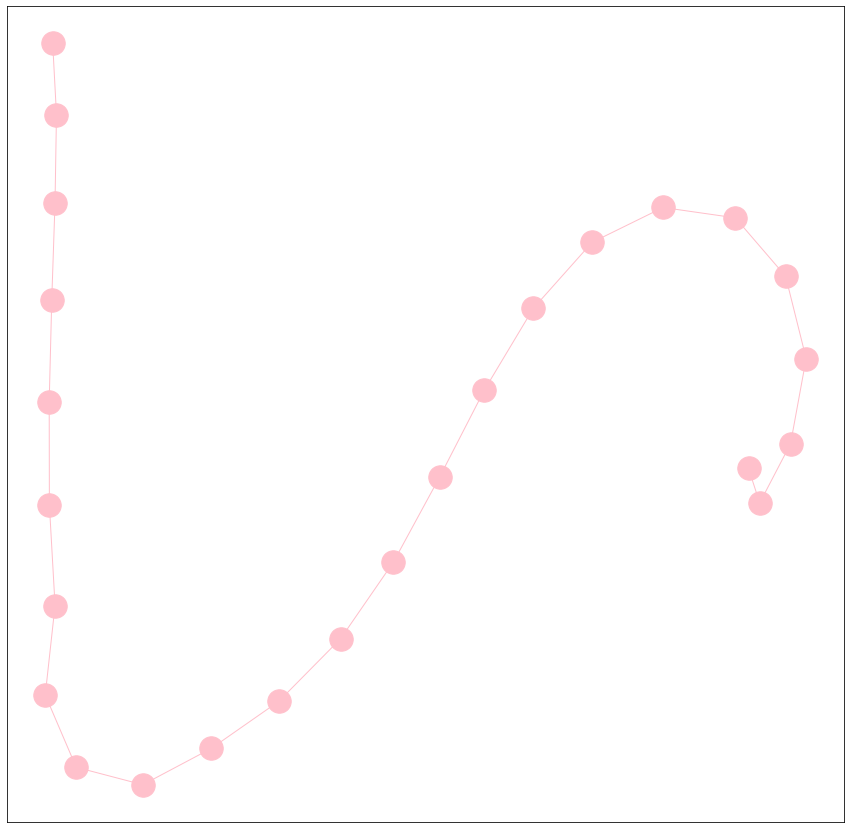

---Normalizing raw data---
----Processing data into windows----
Done---> Total 27 nodes formed
---User#:27 Activity#:0-----
Total nodes present in the graph are-->27
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['42-red:0', '42-red:1', '42-red:2', '42-red:3', '42-red:4', '42-red:5', '42-red:6', '42-red:7', '42-red:8', '42-red:9', '42-red:10',

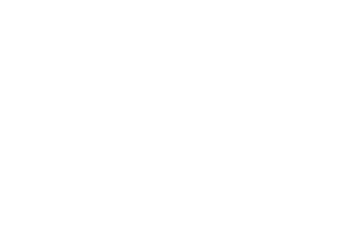

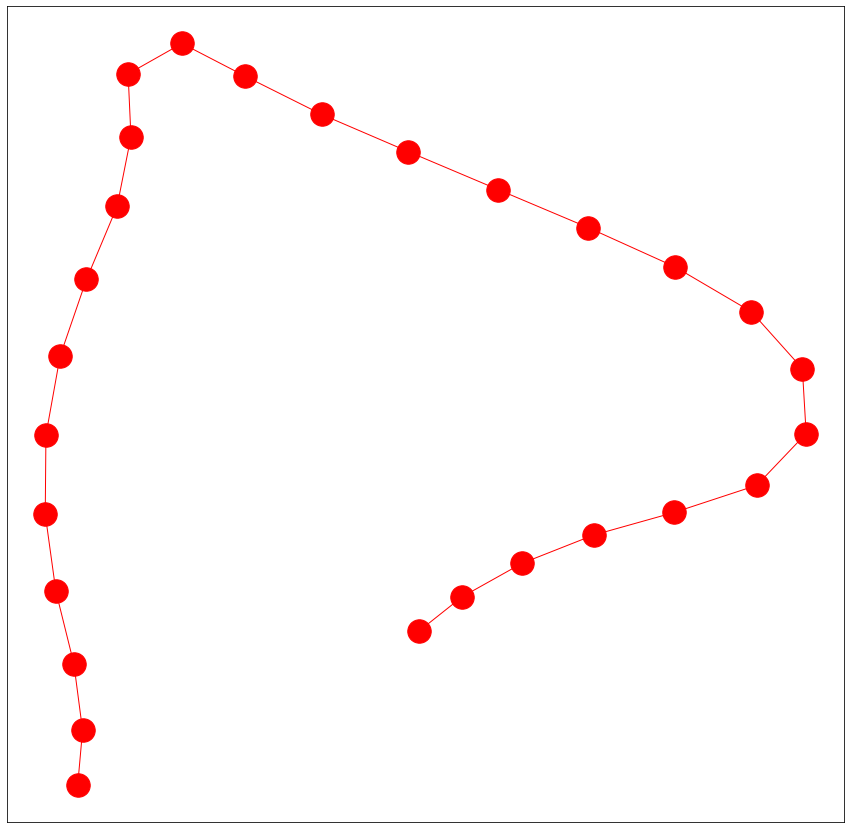

---Normalizing raw data---
----Processing data into windows----
Done---> Total 16 nodes formed
---User#:27 Activity#:2-----
Total nodes present in the graph are-->16
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['43-green:0', '43-green:1', '43-green:2', '43-green:3', '43-green:4', '43-green:5', '43-green:6', '43-green:7', '43-green:8', '43-green:9', '43-green:10', '43-green:11', '43-green:12', '43-green:13', '43-green:14', '43-green:15']
Edges of the graphs are:  [('43-green:0', '43-green:1'), ('43-green:1', '43-green:2'), ('43-green:2', '43-green:3'), ('43-green:3', '43-green:4'), ('43-green:4', '43-green:5'), 

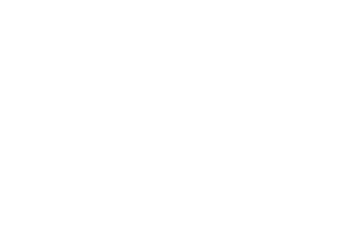

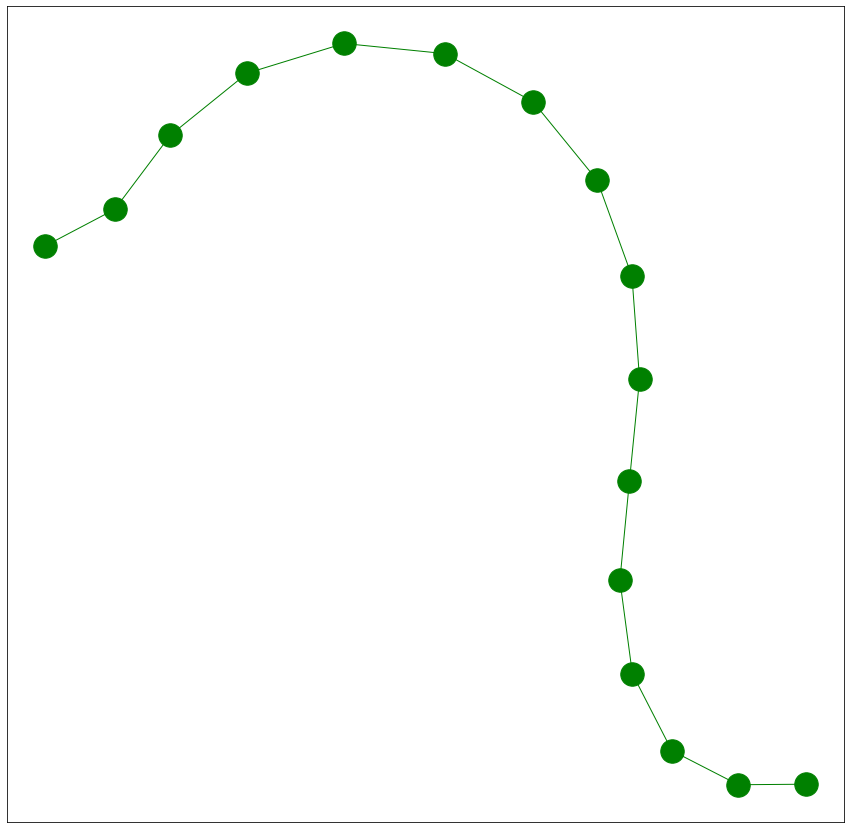

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:27 Activity#:3-----
Total nodes present in the graph are-->12
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['44-yellow:0', '44-yellow:1', '44-yellow:2', '44-yellow:3', '44-yellow:4', '44-yellow:5', '44-yellow:6', '44-yellow:7', '44-yellow:8', '44-yellow:9', '44-yellow:10', '44-yellow:11']
Edges of the graphs are:  [('44-yellow:0', '44-yellow:1'), ('44-yellow:1', '44-yellow:2'), ('44-yellow:2', '44-yellow:3'), ('44-yellow:3', '44-yellow:4'), ('44-yellow:4', '44-yellow:5'), ('44-yellow:5', '44-yellow:6'), ('44-yellow:6', '44-yellow:7'), ('44-yellow:7', '44-yellow:8'), ('44-yellow:8', '44-yellow:9'), ('44-yello

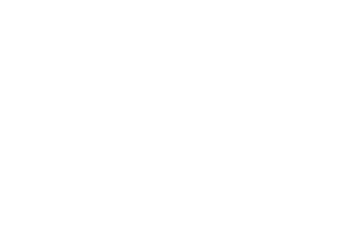

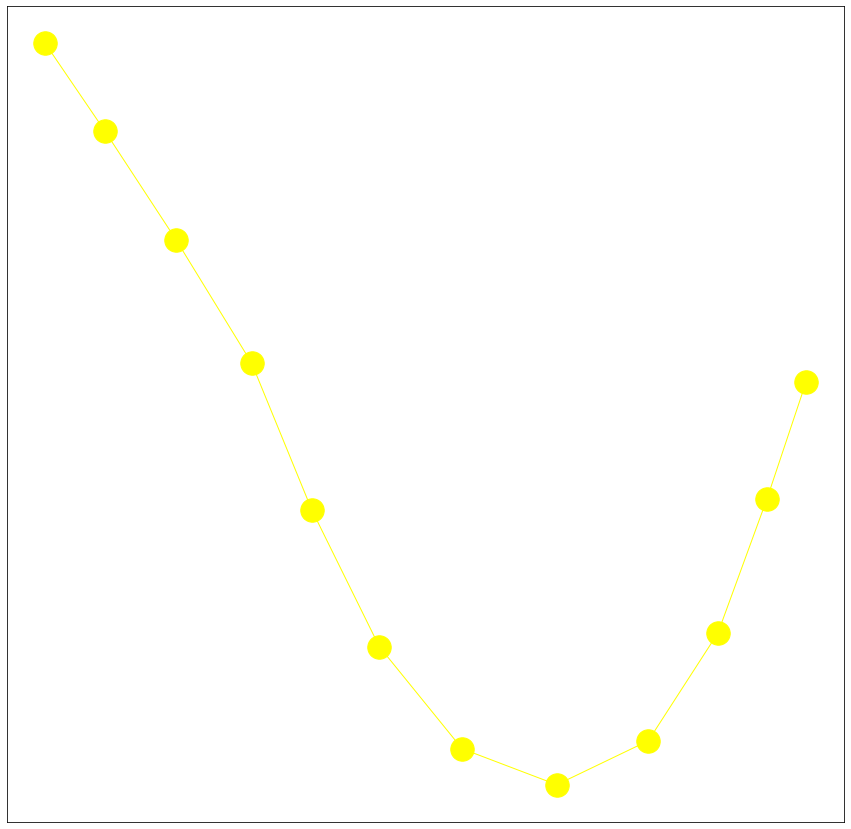

---Normalizing raw data---
----Processing data into windows----
Done---> Total 48 nodes formed
---User#:36 Activity#:5-----
Total nodes present in the graph are-->48
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

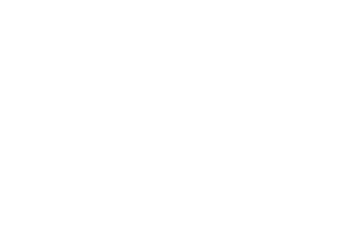

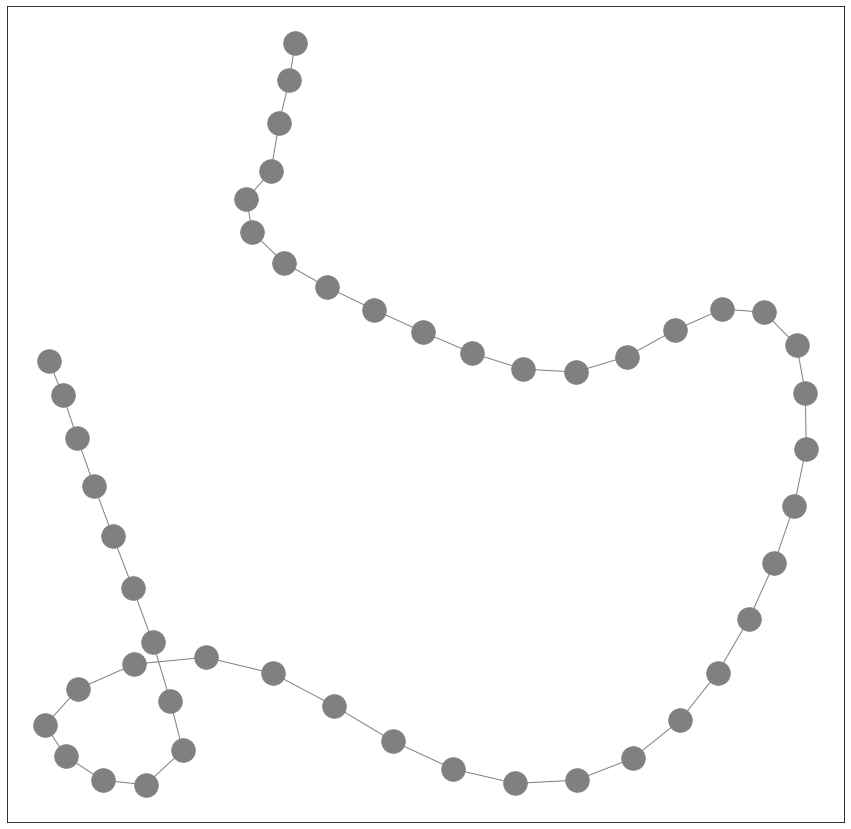

---Normalizing raw data---
----Processing data into windows----
Done---> Total 94 nodes formed
---User#:36 Activity#:1-----
Total nodes present in the graph are-->94
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

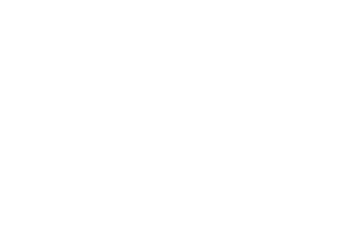

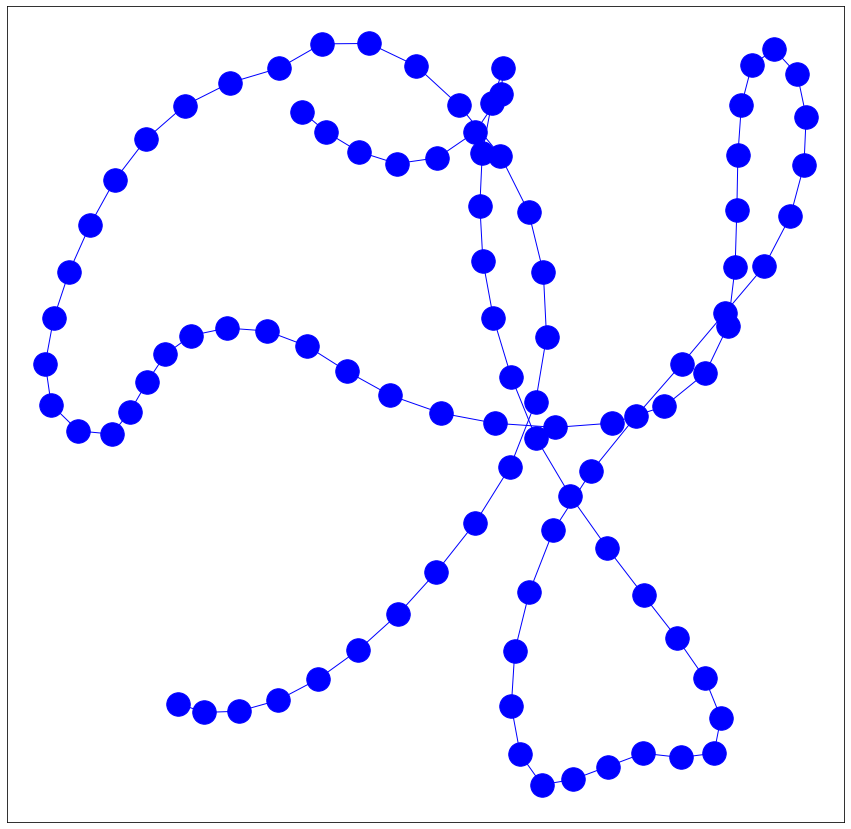

---Normalizing raw data---
----Processing data into windows----
Done---> Total 42 nodes formed
---User#:36 Activity#:4-----
Total nodes present in the graph are-->42
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

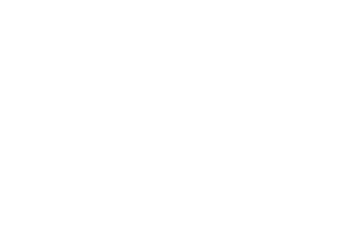

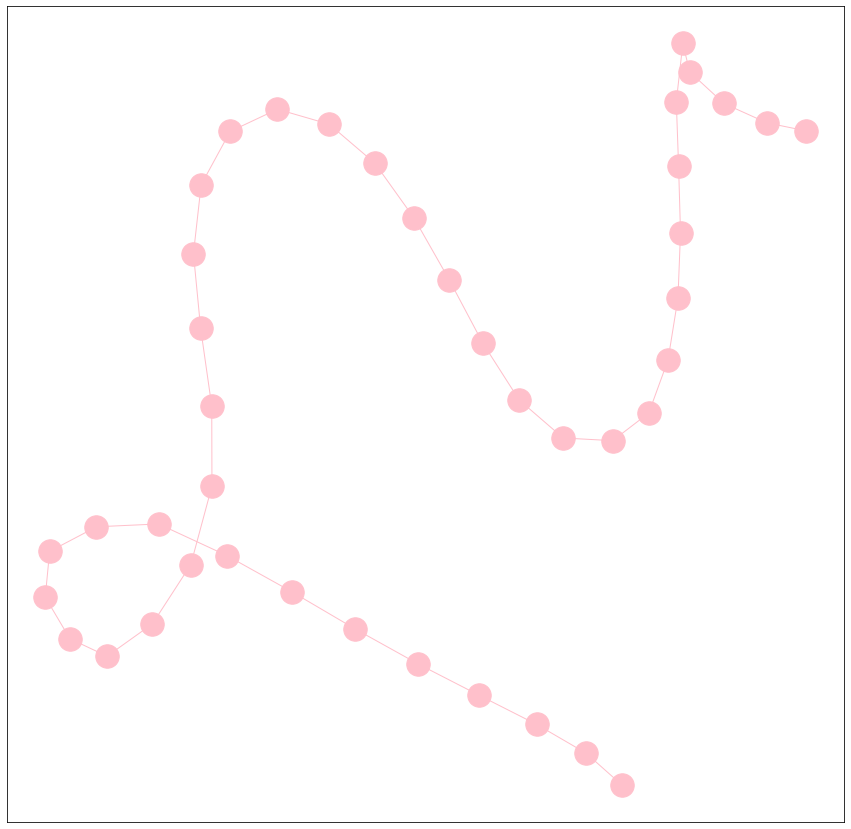

---Normalizing raw data---
----Processing data into windows----
Done---> Total 32 nodes formed
---User#:36 Activity#:0-----
Total nodes present in the graph are-->32
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['48-red

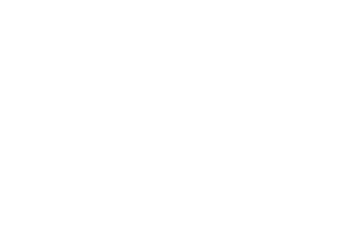

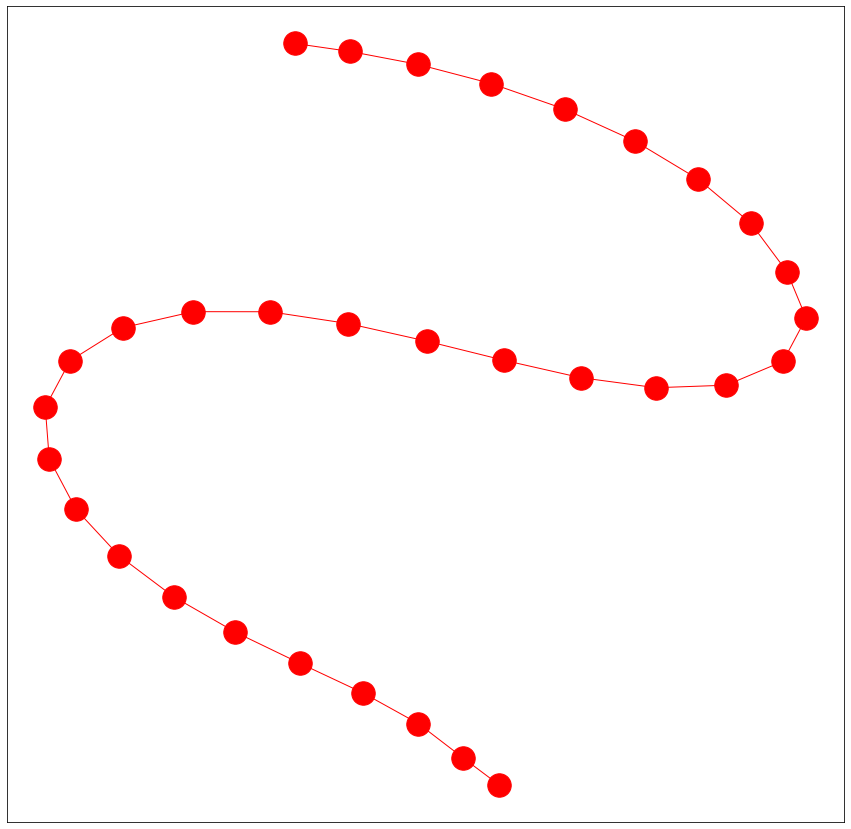

---Normalizing raw data---
----Processing data into windows----
Done---> Total 19 nodes formed
---User#:36 Activity#:2-----
Total nodes present in the graph are-->19
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['49-green:0', '49-green:1', '49-green:2', '49-green:3', '49-green:4', '49-green:5', '49-green:6', '49-green:7', '49-green:8', '49-green:9', '49-green:10', '49-green:11', '49-green:12', '49-green:13', '49-green:14', '49-green:15', '49-green:16', '49-green:17', '49-green:18']
Edges of the graphs are:  [('49-green:0', '49-green:1'), 

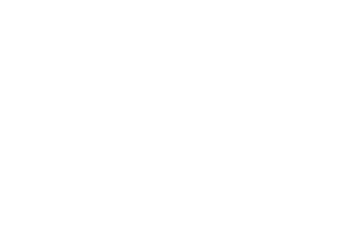

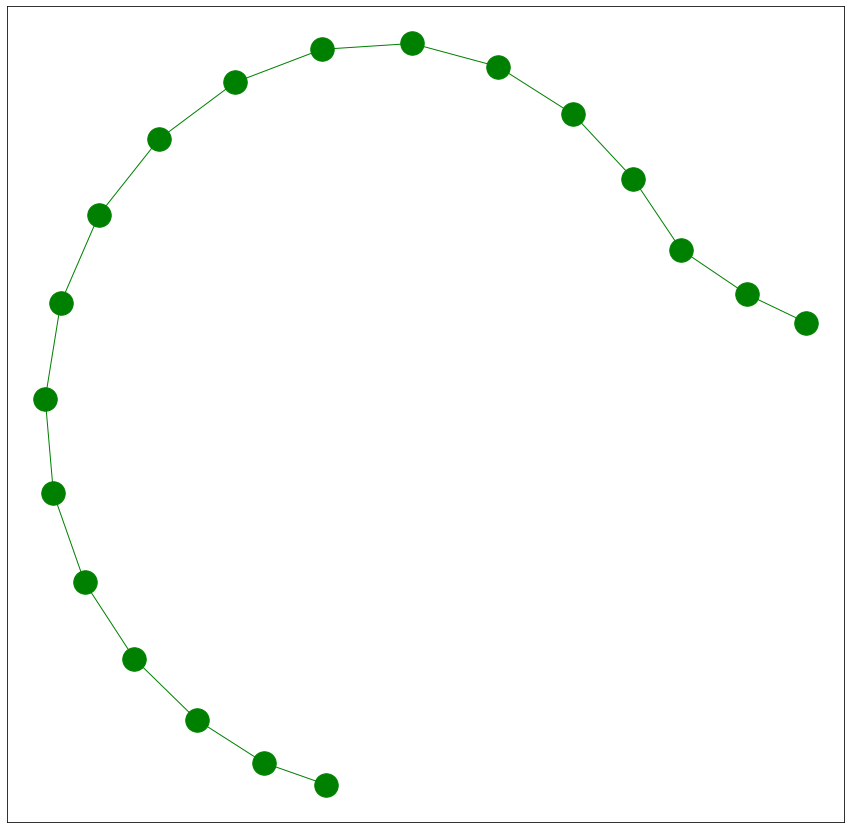

---Normalizing raw data---
----Processing data into windows----
Done---> Total 15 nodes formed
---User#:36 Activity#:3-----
Total nodes present in the graph are-->15
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['50-yellow:0', '50-yellow:1', '50-yellow:2', '50-yellow:3', '50-yellow:4', '50-yellow:5', '50-yellow:6', '50-yellow:7', '50-yellow:8', '50-yellow:9', '50-yellow:10', '50-yellow:11', '50-yellow:12', '50-yellow:13', '50-yellow:14']
Edges of the graphs are:  [('50-yellow:0', '50-yellow:1'), ('50-yellow:1', '50-yellow:2'), ('50-yellow:2', '50-yellow:3'), ('50-yellow:3', '50-yellow:4'), ('50-yellow:4', '50-yellow:5'), ('50-yellow:5',

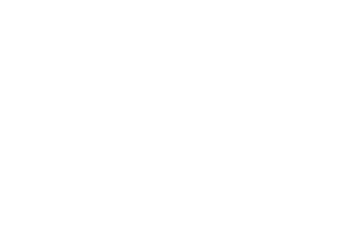

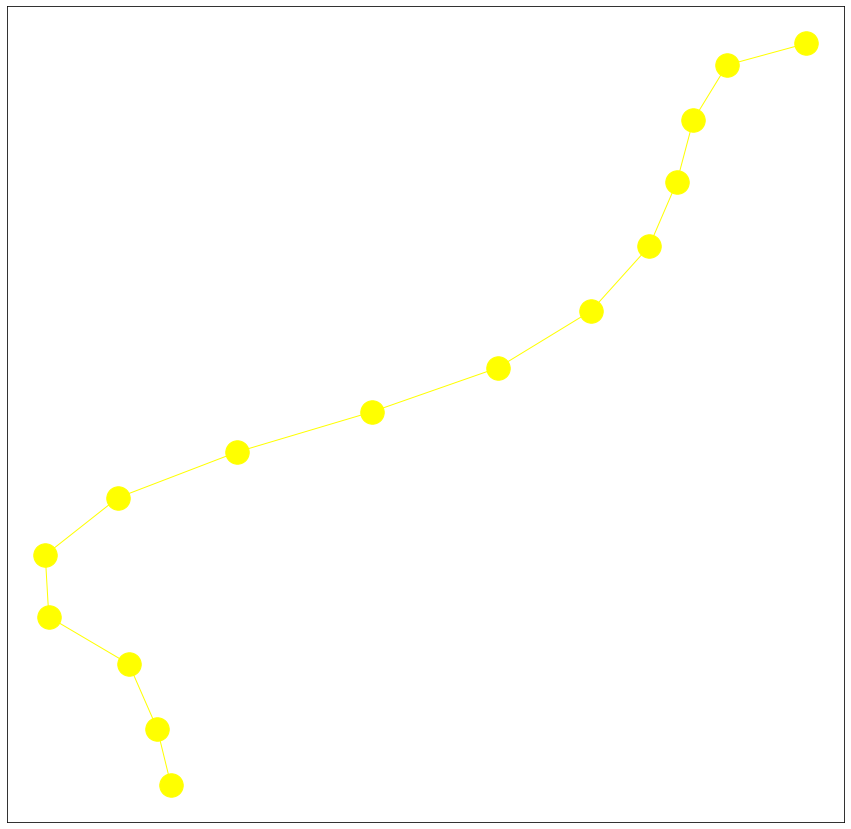

---Normalizing raw data---
----Processing data into windows----
Done---> Total 93 nodes formed
---User#:18 Activity#:1-----
Total nodes present in the graph are-->93
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

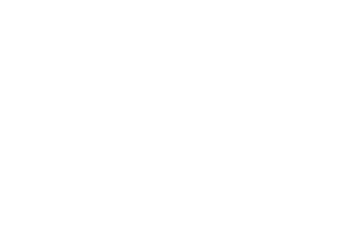

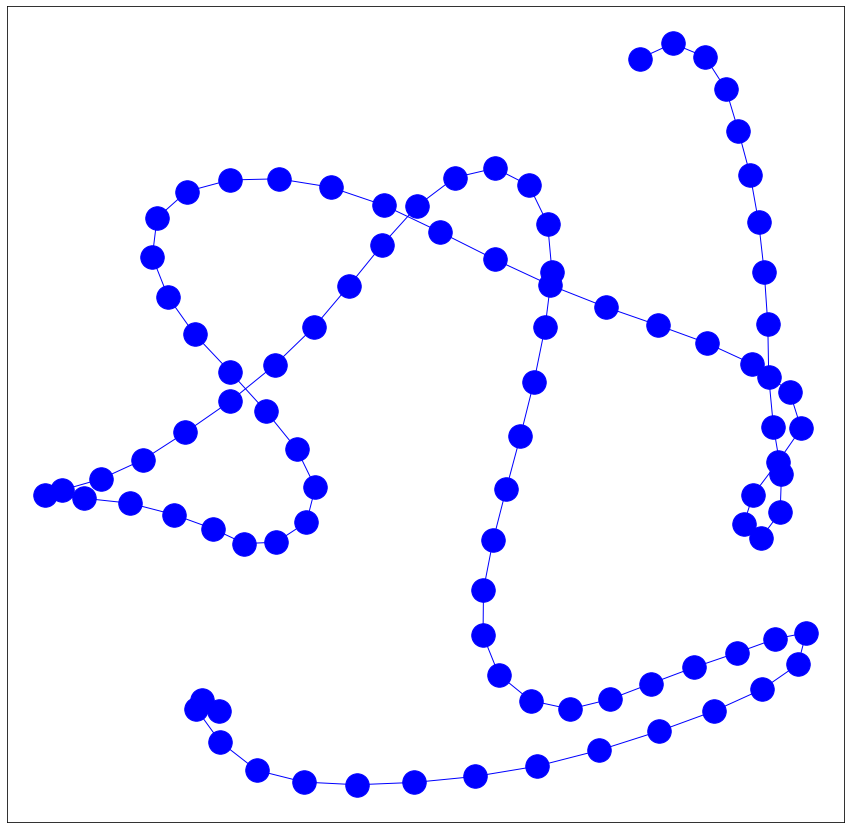

---Normalizing raw data---
----Processing data into windows----
Done---> Total 98 nodes formed
---User#:18 Activity#:5-----
Total nodes present in the graph are-->98
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

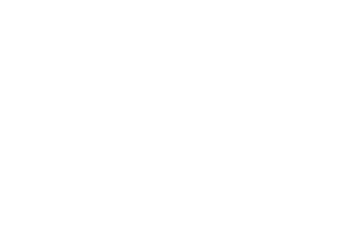

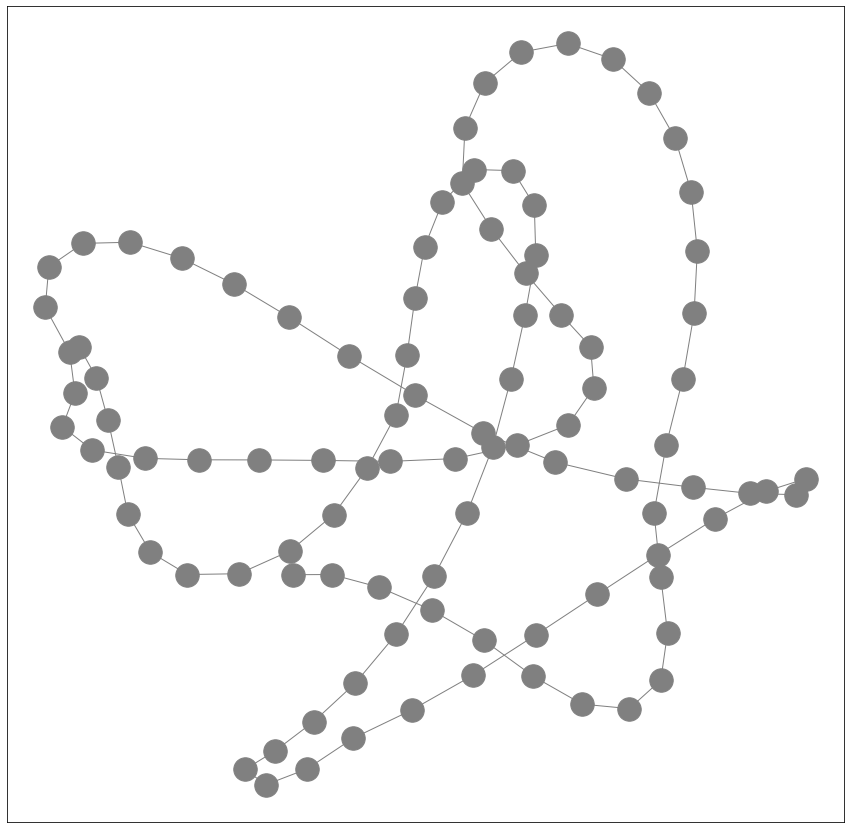

---Normalizing raw data---
----Processing data into windows----
Done---> Total 18 nodes formed
---User#:18 Activity#:0-----
Total nodes present in the graph are-->18
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['53-red:0', '53-red:1', '53-red:2', '53-red:3', '53-red:4', '53-red:5', '53-red:6', '53-red:7', '53-red:8', '53-red:9', '53-red:10', '53-red:11', '53-red:12', '53-red:13', '53-red:14', '53-red:15', '53-red:16', '53-red:17']
Edges of the graphs are:  [('53-red:0', '53-red:1'), ('53-red:1', '53-red:2'), ('53-red:2', '53-red:3'), ('53-red:3', '53-red:4'), ('

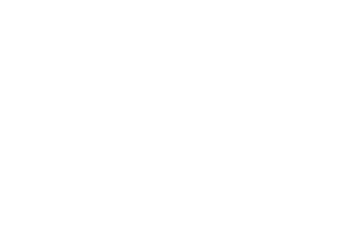

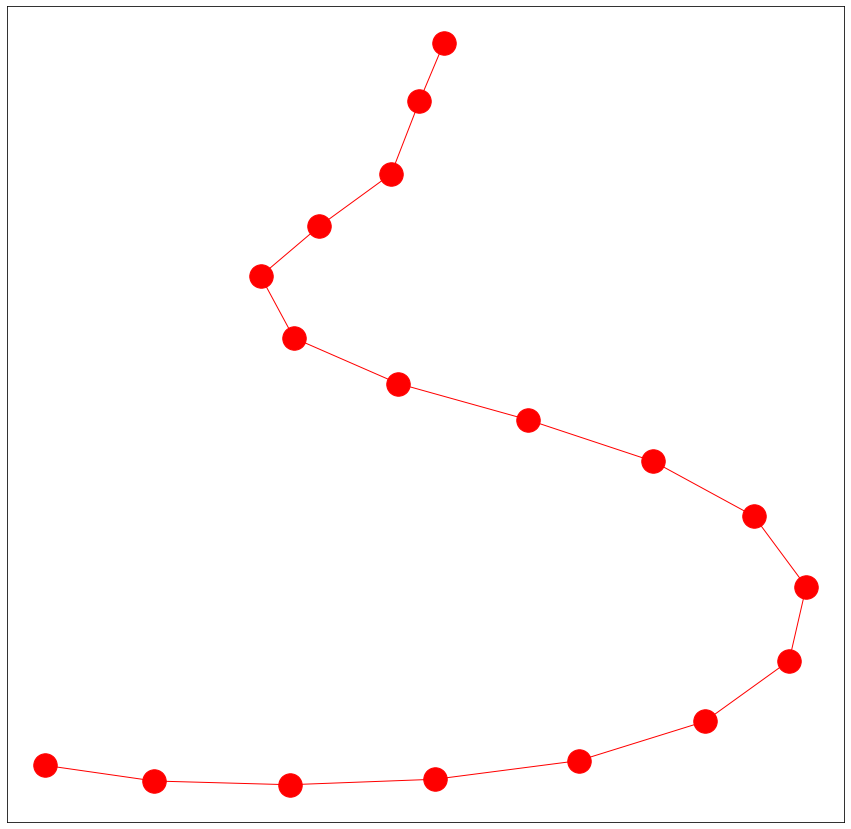

---Normalizing raw data---
----Processing data into windows----
Done---> Total 18 nodes formed
---User#:18 Activity#:4-----
Total nodes present in the graph are-->18
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['54-pink:0', '54-pink:1', '54-pink:2', '54-pink:3', '54-pink:4', '54-pink:5', '54-pink:6', '54-pink:7', '54-pink:8', '54-pink:9', '54-pink:10', '54-pink:11', '54-pink:12', '54-pink:13', '54-pink:14', '54-pink:15', '54-pink:16', '54-pink:17']
Edges of the graphs are:  [('54-pink:0', '54-pink:1'), ('54-pink:1', '54-pink:2'), ('54-pink:2', '54-pink:3'), ('54

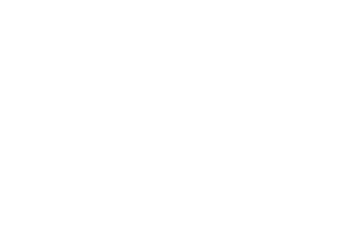

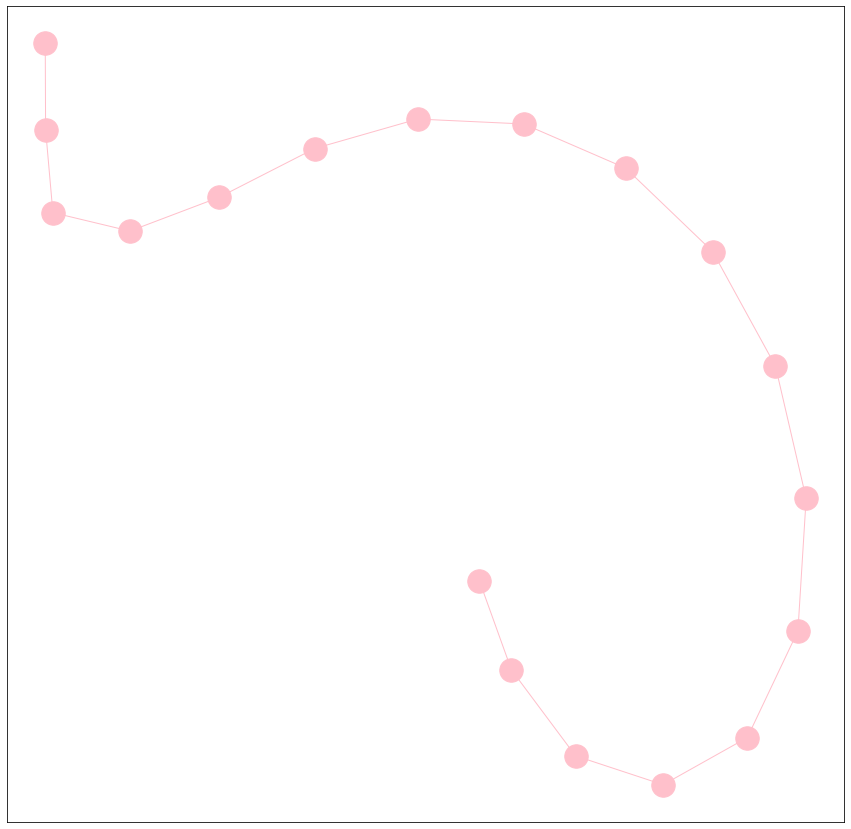

---Normalizing raw data---
----Processing data into windows----
Done---> Total 11 nodes formed
---User#:18 Activity#:2-----
Total nodes present in the graph are-->11
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['55-green:0', '55-green:1', '55-green:2', '55-green:3', '55-green:4', '55-green:5', '55-green:6', '55-green:7', '55-green:8', '55-green:9', '55-green:10']
Edges of the graphs are:  [('55-green:0', '55-green:1'), ('55-green:1', '55-green:2'), ('55-green:2', '55-green:3'), ('55-green:3', '55-green:4'), ('55-green:4', '55-green:5'), ('55-green:5', '55-green:6'), ('55-green:6', '55-green:7'), ('55-green:7', '55-green:8'), ('55-green:8', '55-green:9'), ('55-green:9', '55-green:10')]
[]
[]
[('55-green:0', '55-green:1'), ('55-green:1

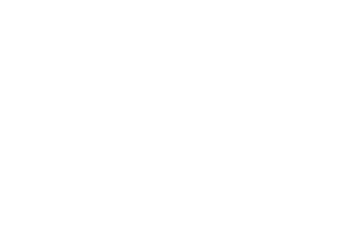

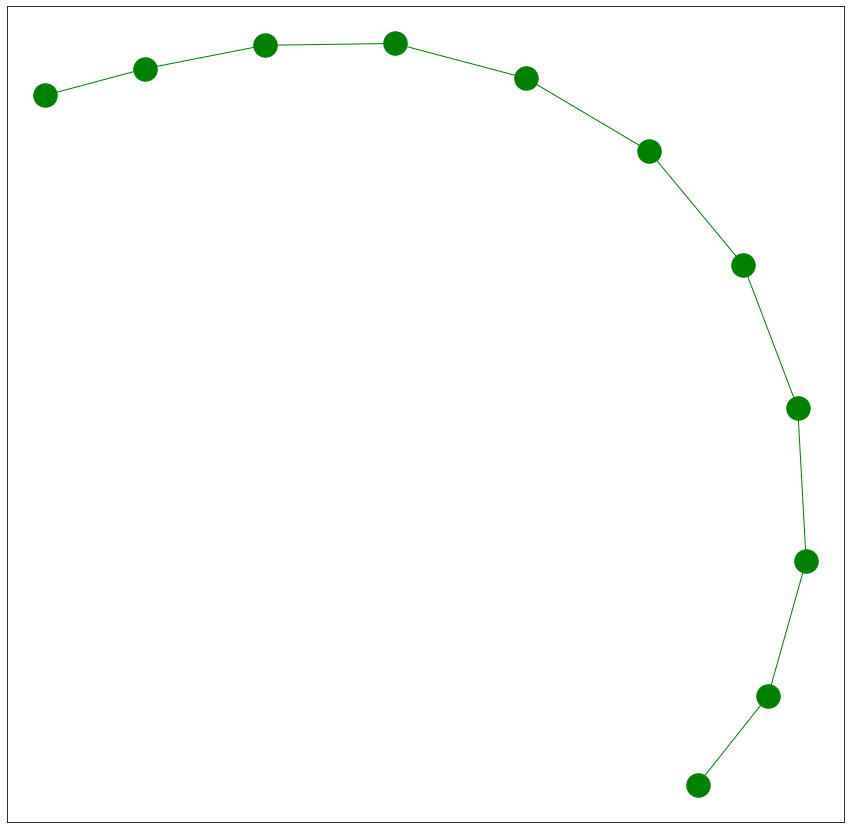

---Normalizing raw data---
----Processing data into windows----
Done---> Total 15 nodes formed
---User#:18 Activity#:3-----
Total nodes present in the graph are-->15
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['56-yellow:0', '56-yellow:1', '56-yellow:2', '56-yellow:3', '56-yellow:4', '56-yellow:5', '56-yellow:6', '56-yellow:7', '56-yellow:8', '56-yellow:9', '56-yellow:10', '56-yellow:11', '56-yellow:12', '56-yellow:13', '56-yellow:14']
Edges of the graphs are:  [('56-yellow:0', '56-yellow:1'), ('56-yellow:1', '56-yellow:2'), ('56-yellow:2', '56-yellow:3'), ('56-yellow:3', '56-yellow:4'), ('56-yellow:4', '56-yellow:5'), ('56-yellow:5',

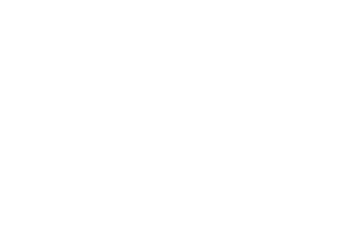

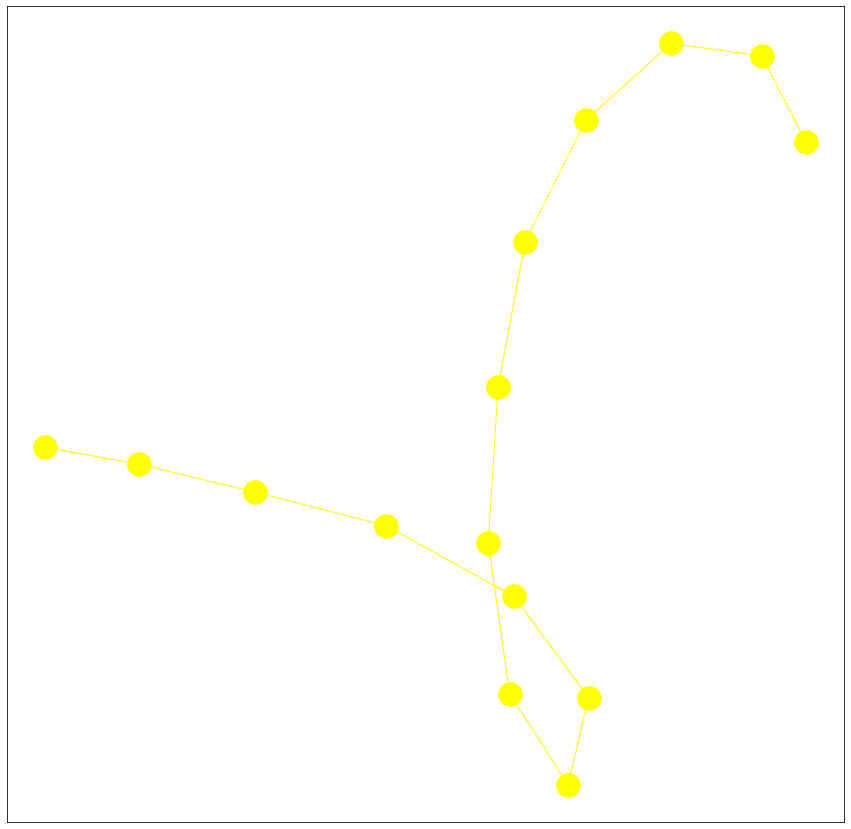

---Normalizing raw data---
----Processing data into windows----
Done---> Total 96 nodes formed
---User#:32 Activity#:5-----
Total nodes present in the graph are-->96
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

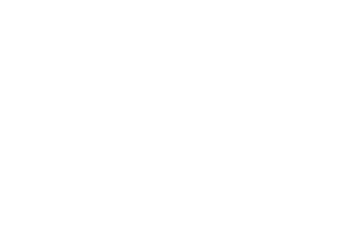

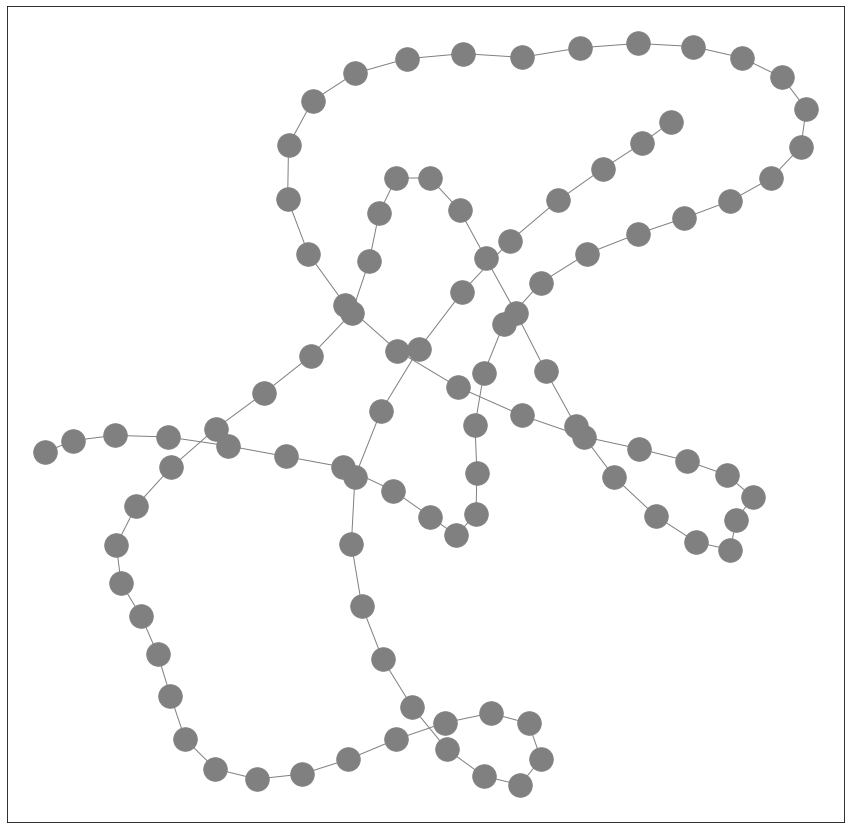

---Normalizing raw data---
----Processing data into windows----
Done---> Total 95 nodes formed
---User#:32 Activity#:1-----
Total nodes present in the graph are-->95
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

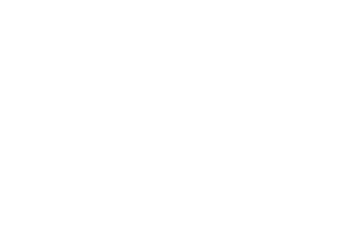

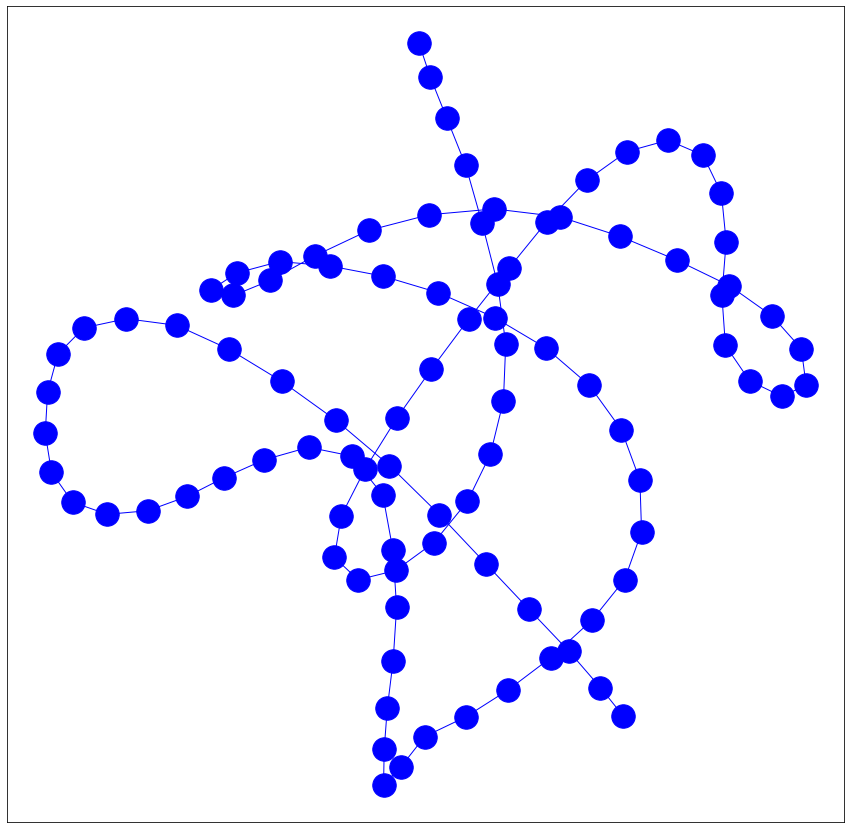

---Normalizing raw data---
----Processing data into windows----
Done---> Total 29 nodes formed
---User#:32 Activity#:4-----
Total nodes present in the graph are-->29
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['59-pink:0', '59-pink:1', '59-pink:2', '59-pink:3', '59-pink:4', '59-pink:5', '59-

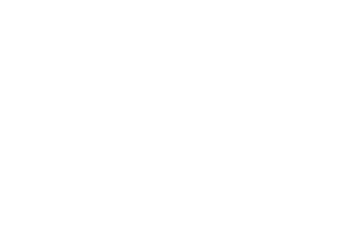

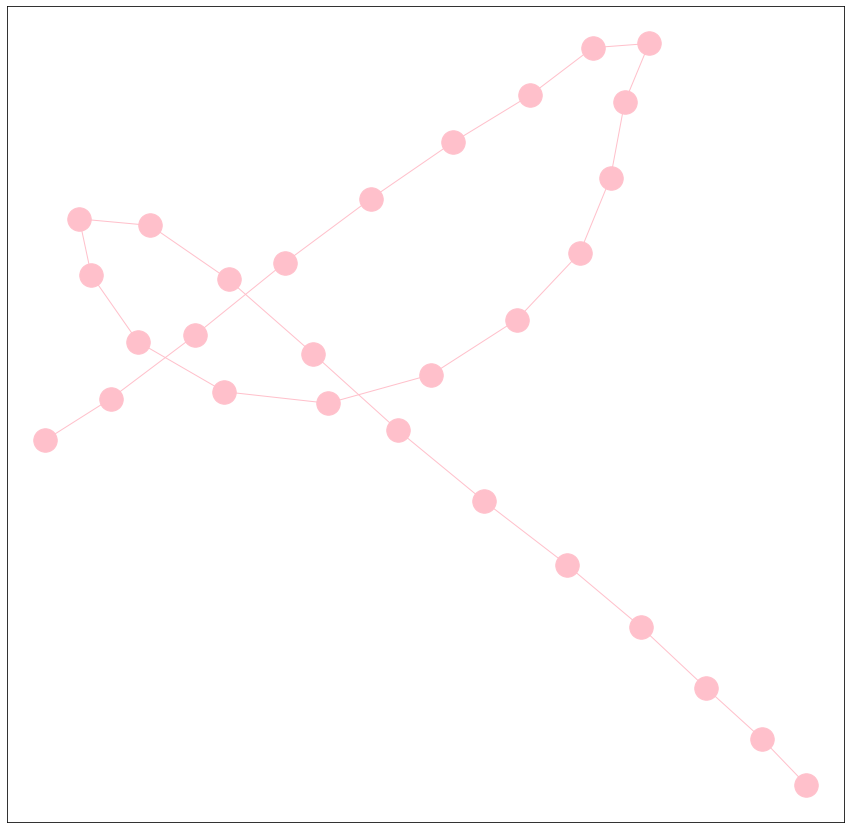

---Normalizing raw data---
----Processing data into windows----
Done---> Total 18 nodes formed
---User#:32 Activity#:0-----
Total nodes present in the graph are-->18
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['60-red:0', '60-red:1', '60-red:2', '60-red:3', '60-red:4', '60-red:5', '60-red:6', '60-red:7', '60-red:8', '60-red:9', '60-red:10', '60-red:11', '60-red:12', '60-red:13', '60-red:14', '60-red:15', '60-red:16', '60-red:17']
Edges of the graphs are:  [('60-red:0', '60-red:1'), ('60-red:1', '60-red:2'), ('60-red:2', '60-red:3'), ('60-red:3', '60-red:4'), ('

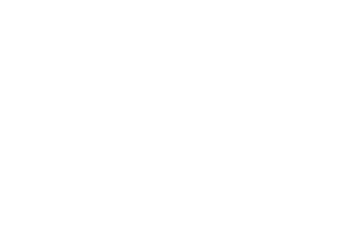

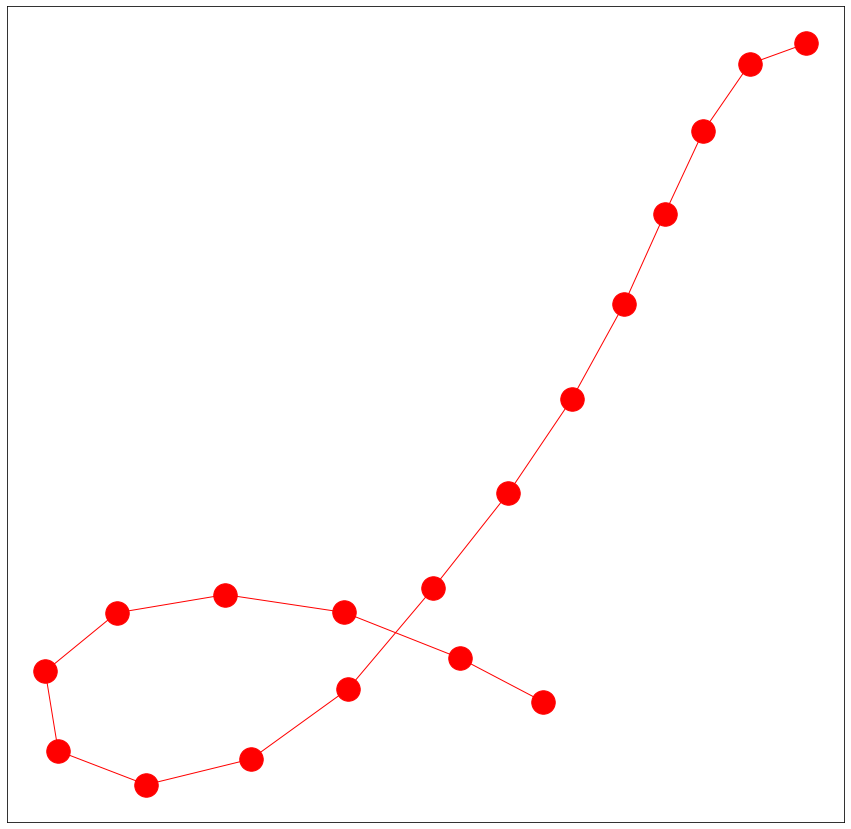

---Normalizing raw data---
----Processing data into windows----
Done---> Total 23 nodes formed
---User#:32 Activity#:2-----
Total nodes present in the graph are-->23
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['61-green:0', '61-green:1', '61-green:2', '61-green:3', '61-green:4', '61-green:5', '61-green:6', '61-green:7', '61-green:8', '61-green:9', '61-green:10', '61-green:11', '61-green:12', '61-green:13', '61-green:14', '61-green:15', '6

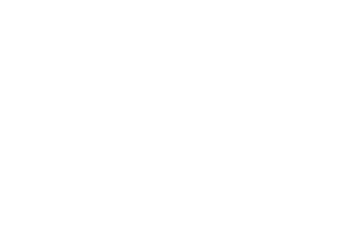

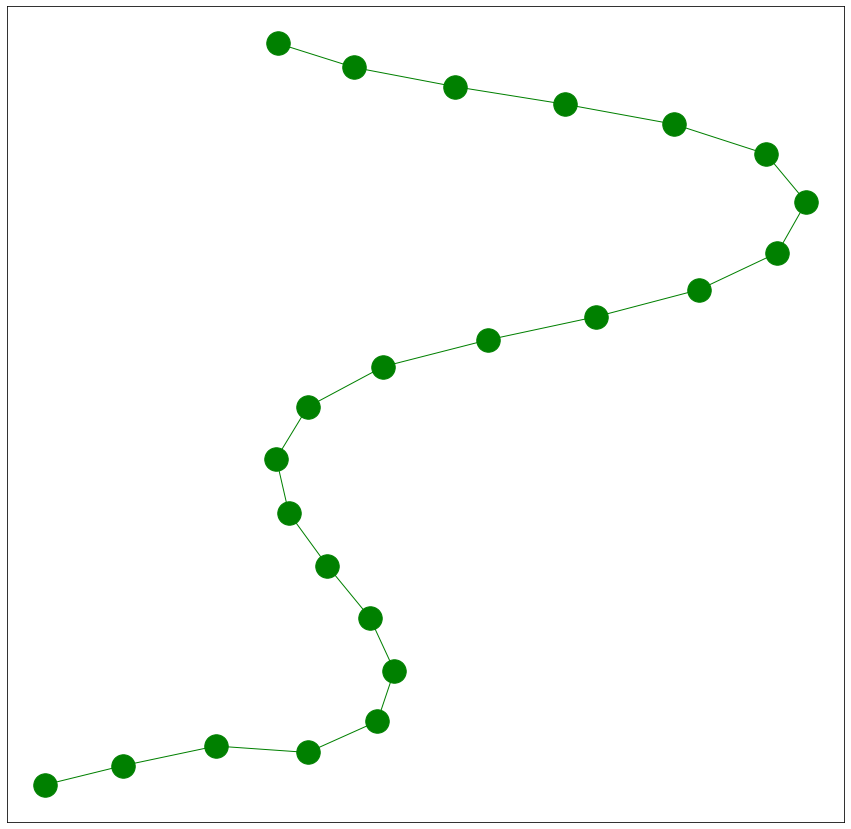

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:32 Activity#:3-----
Total nodes present in the graph are-->13
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['62-yellow:0', '62-yellow:1', '62-yellow:2', '62-yellow:3', '62-yellow:4', '62-yellow:5', '62-yellow:6', '62-yellow:7', '62-yellow:8', '62-yellow:9', '62-yellow:10', '62-yellow:11', '62-yellow:12']
Edges of the graphs are:  [('62-yellow:0', '62-yellow:1'), ('62-yellow:1', '62-yellow:2'), ('62-yellow:2', '62-yellow:3'), ('62-yellow:3', '62-yellow:4'), ('62-yellow:4', '62-yellow:5'), ('62-yellow:5', '62-yellow:6'), ('62-yellow:6', '62-yellow:7'), ('62-yellow:7', '62-yellow:8'), (

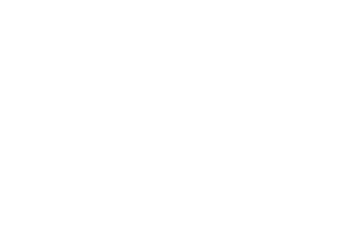

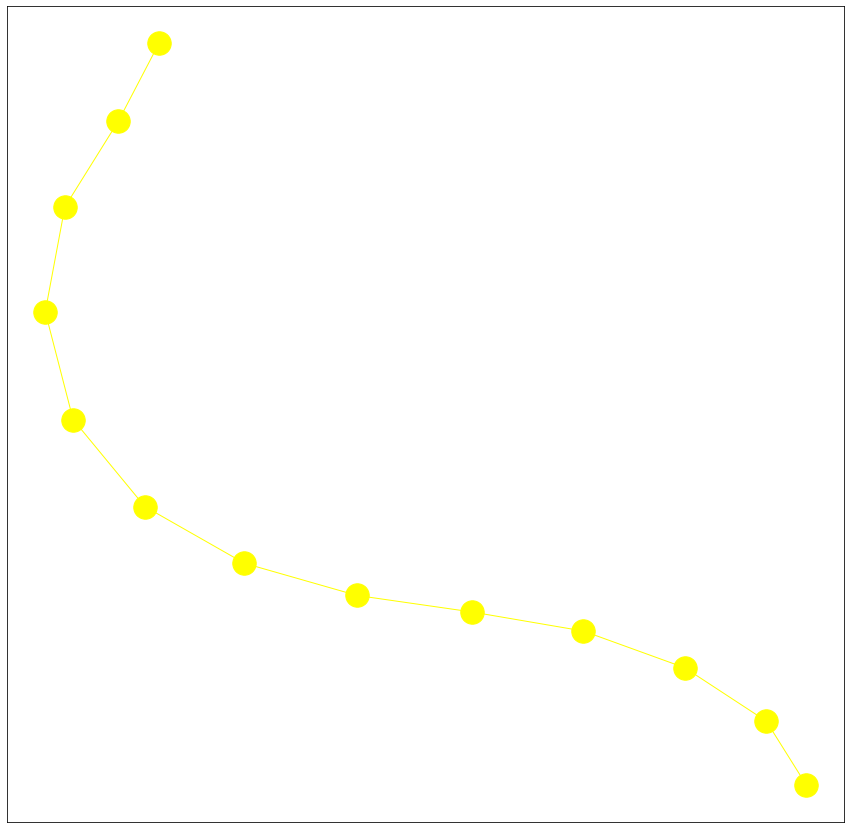

---Normalizing raw data---
----Processing data into windows----
Done---> Total 55 nodes formed
---User#:35 Activity#:5-----
Total nodes present in the graph are-->55
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

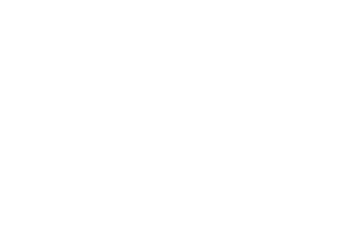

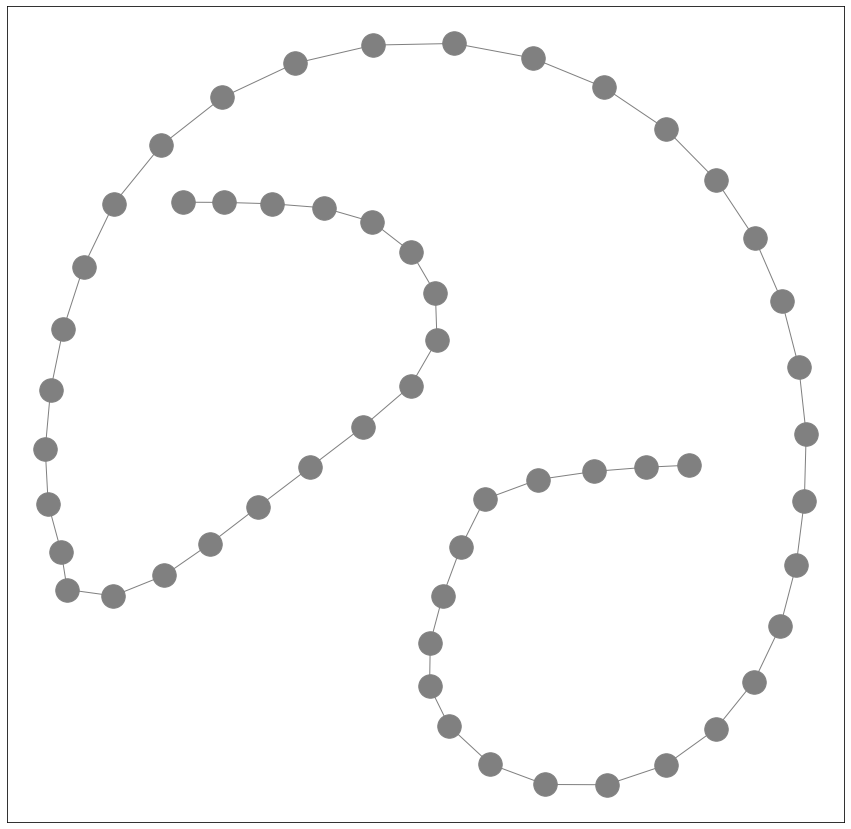

---Normalizing raw data---
----Processing data into windows----
Done---> Total 98 nodes formed
---User#:35 Activity#:1-----
Total nodes present in the graph are-->98
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

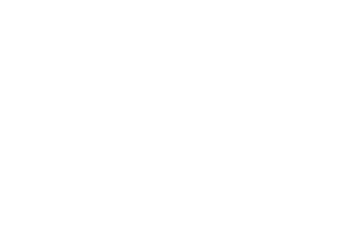

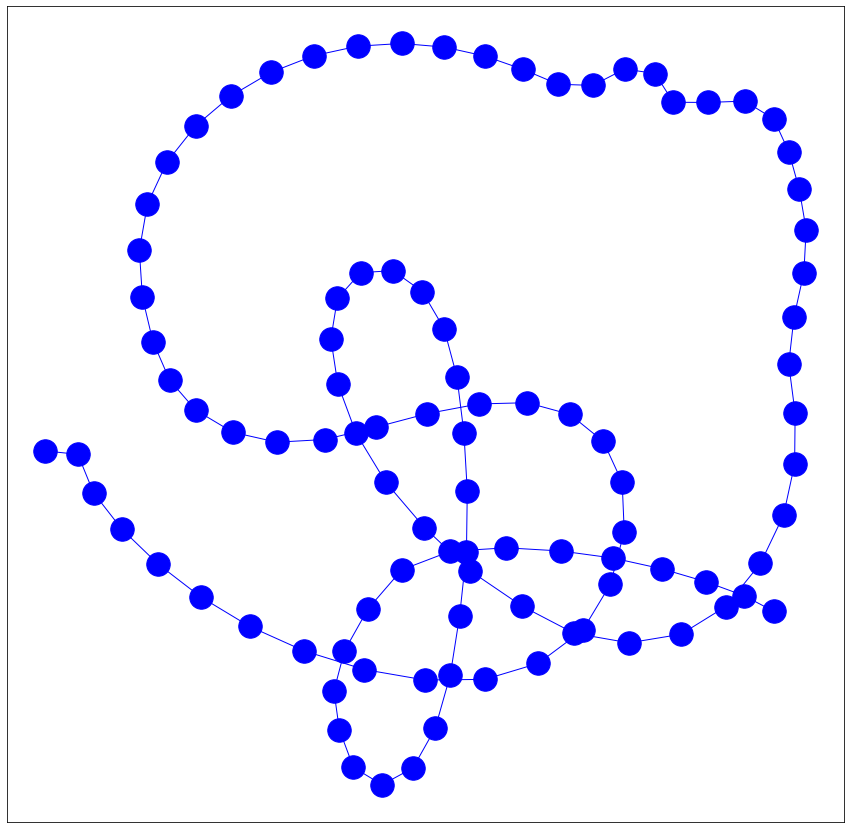

---Normalizing raw data---
----Processing data into windows----
Done---> Total 8 nodes formed
---User#:35 Activity#:3-----
Total nodes present in the graph are-->8
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['65-yellow:0', '65-yellow:1', '65-yellow:2', '65-yellow:3', '65-yellow:4', '65-yellow:5', '65-yellow:6', '65-yellow:7']
Edges of the graphs are:  [('65-yellow:0', '65-yellow:1'), ('65-yellow:1', '65-yellow:2'), ('65-yellow:2', '65-yellow:3'), ('65-yellow:3', '65-yellow:4'), ('65-yellow:4', '65-yellow:5'), ('65-yellow:5', '65-yellow:6'), ('65-yellow:6', '65-yellow:7')]
[]
[]
[]
[('65-yellow:0', '65-yellow:1'), ('65-yellow:1', '65-yellow:2'), ('65-yellow:2', '65-yellow:3'), ('65-yellow:3', '65-yellow:4'), ('65-yellow:4', '65-yellow:5'), ('65-yellow:5', '65-yellow:6'), ('65-yellow:6', '65-yellow:7')]
[]
[

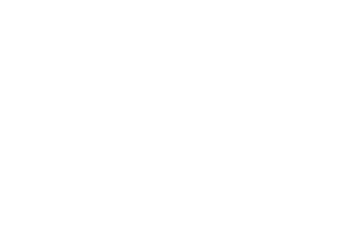

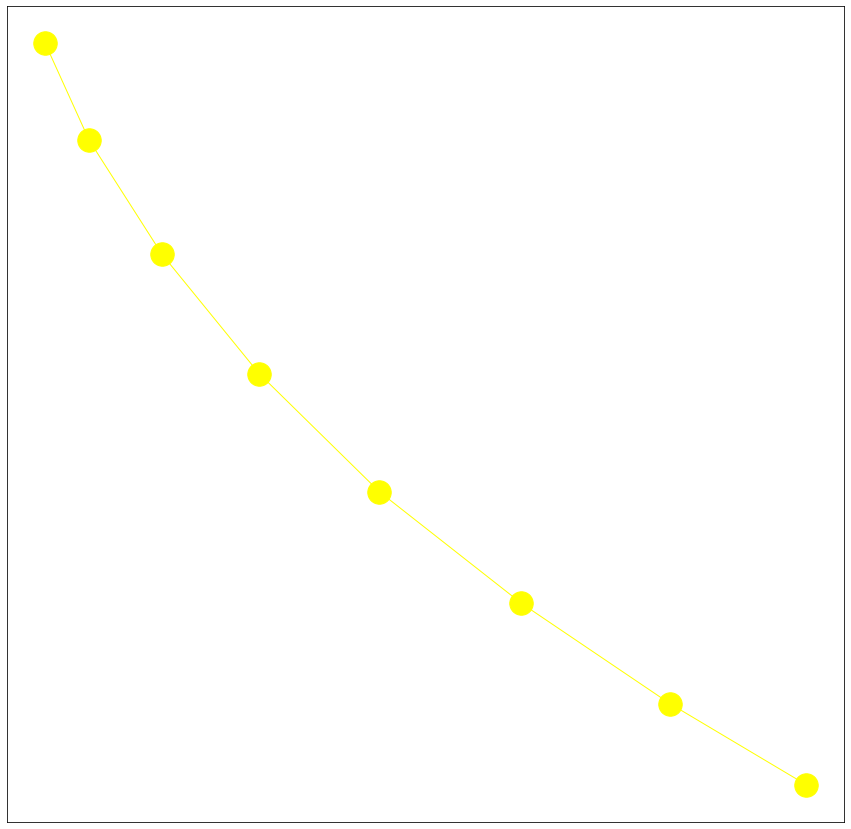

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:35 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['66-green:0', '66-green:1', '66-green:2', '66-green:3', '66-green:4', '66-green:5', '66-green:6', '66-green:7', '66-green:8', '66-green:9', '66-green:10', '66-green:11']
Edges of the graphs are:  [('66-green:0', '66-green:1'), ('66-green:1', '66-green:2'), ('66-green:2', '66-green:3'), ('66-green:3', '66-green:4'), ('66-green:4', '66-green:5'), ('66-green:5', '66-green:6'), ('66-green:6', '66-green:7'), ('66-green:7', '66-green:8'), ('66-green:8', '66-green:9'), ('66-green:9', '66-green:10'), ('66-gree

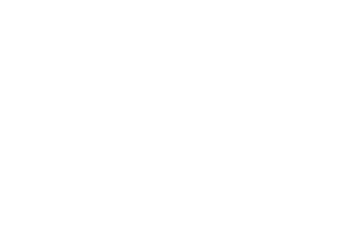

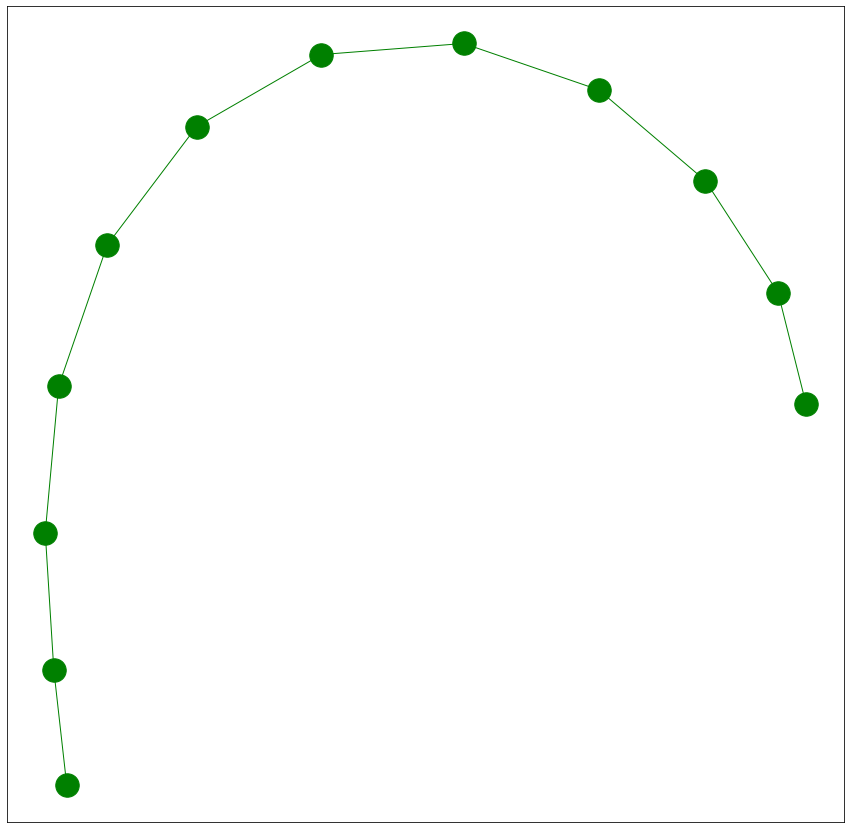

---Normalizing raw data---
----Processing data into windows----
Done---> Total 94 nodes formed
---User#:11 Activity#:5-----
Total nodes present in the graph are-->94
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

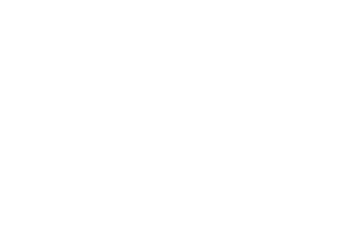

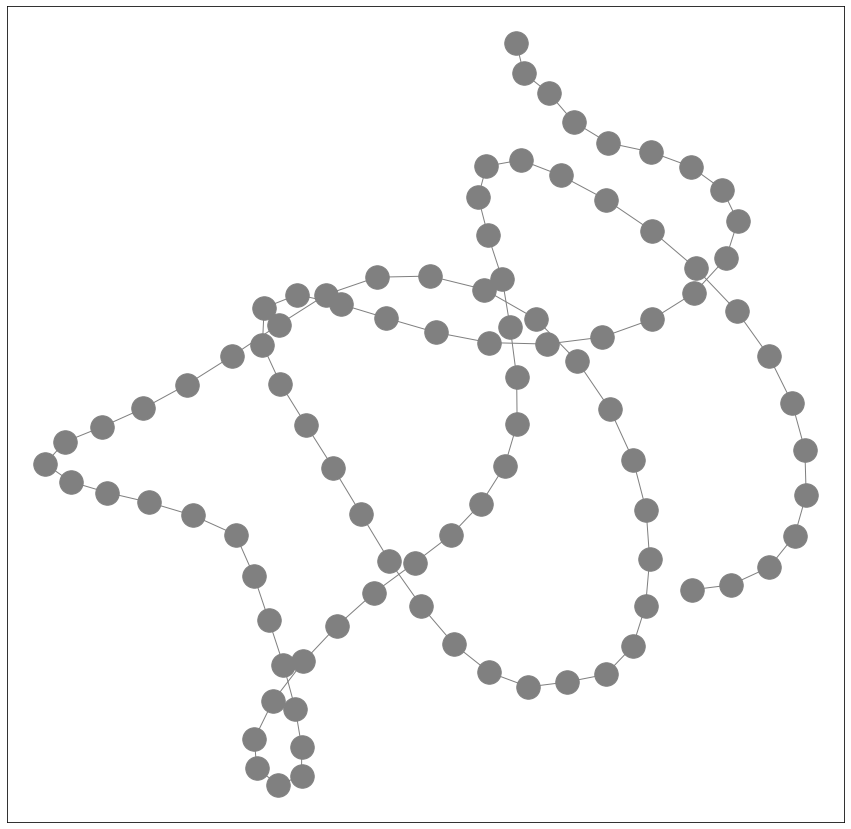

---Normalizing raw data---
----Processing data into windows----
Done---> Total 34 nodes formed
---User#:11 Activity#:4-----
Total nodes present in the graph are-->34
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

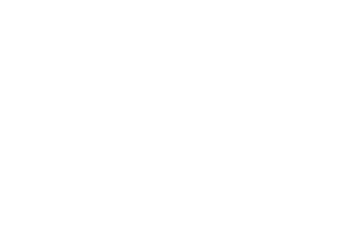

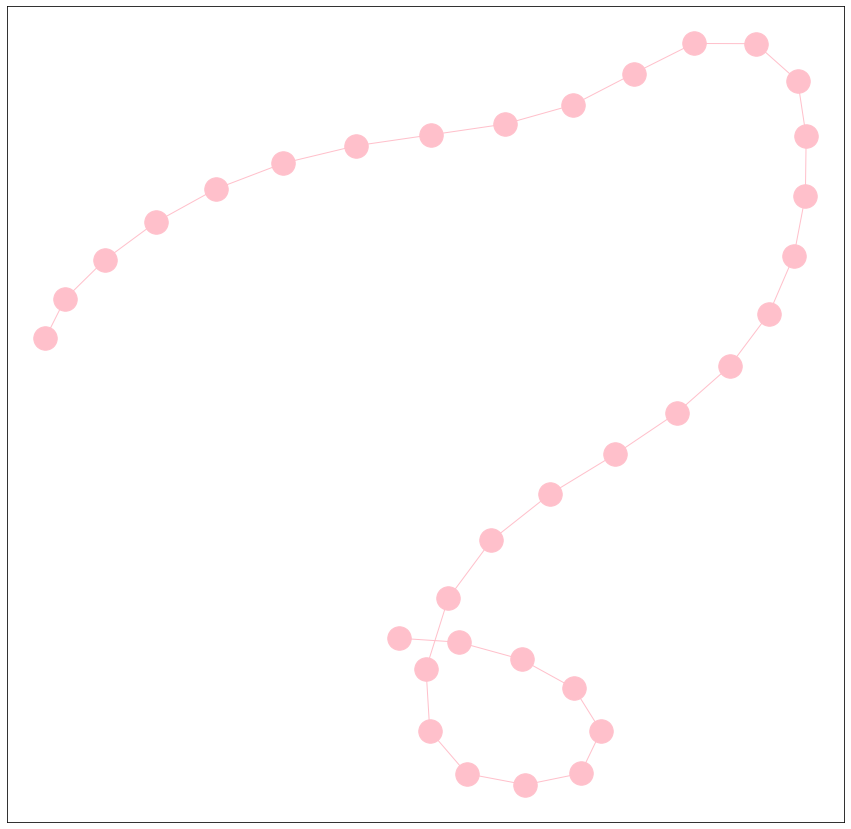

---Normalizing raw data---
----Processing data into windows----
Done---> Total 20 nodes formed
---User#:11 Activity#:0-----
Total nodes present in the graph are-->20
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['69-red:0', '69-red:1', '69-red:2', '69-red:3', '69-red:4', '69-red:5', '69-red:6', '69-red:7', '69-red:8', '69-red:9', '69-red:10', '69-red:11', '69-red:12', '69-red:13', '69-red:14', '69-red:15', '69-red:16', '69-red:17', '69-red:18', '69-red:19']
Edges of the graphs are:  [('69-red:0', '69-red:1'), ('69

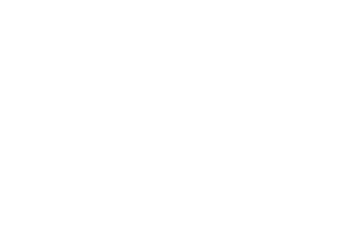

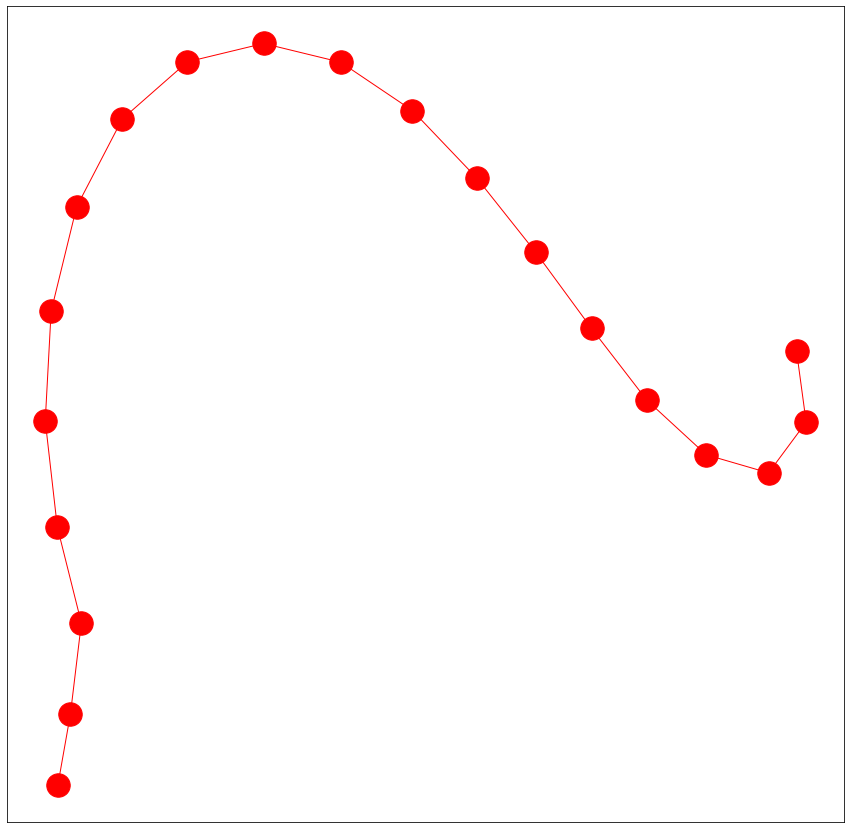

---Normalizing raw data---
----Processing data into windows----
Done---> Total 97 nodes formed
---User#:11 Activity#:1-----
Total nodes present in the graph are-->97
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

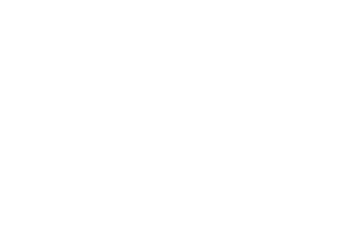

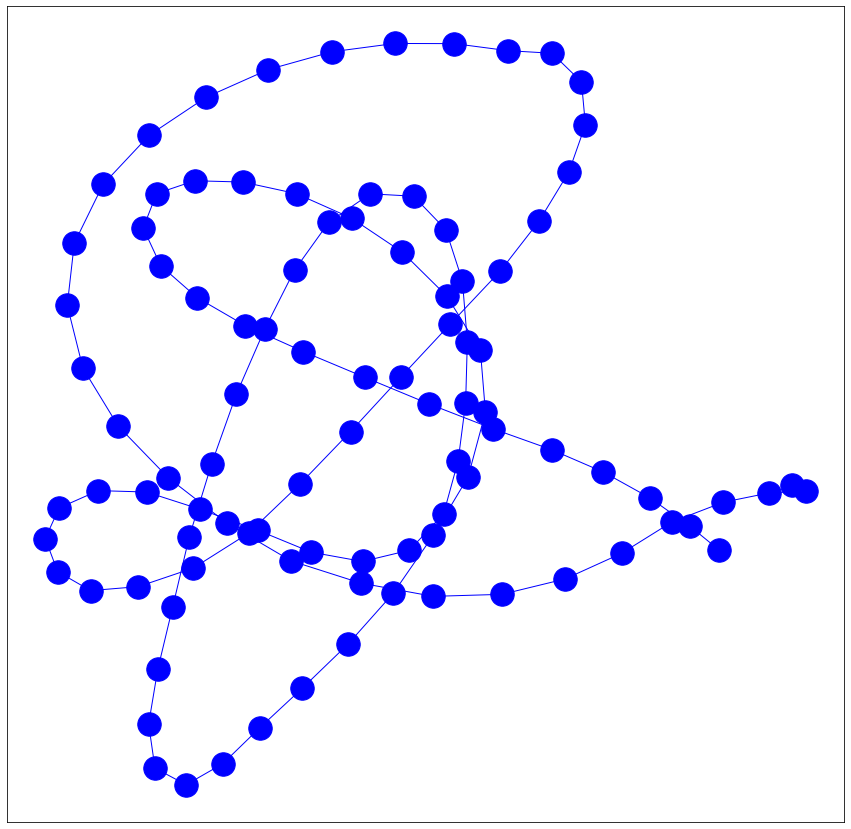

---Normalizing raw data---
----Processing data into windows----
Done---> Total 97 nodes formed
---User#:16 Activity#:5-----
Total nodes present in the graph are-->97
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

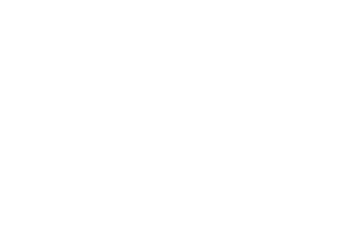

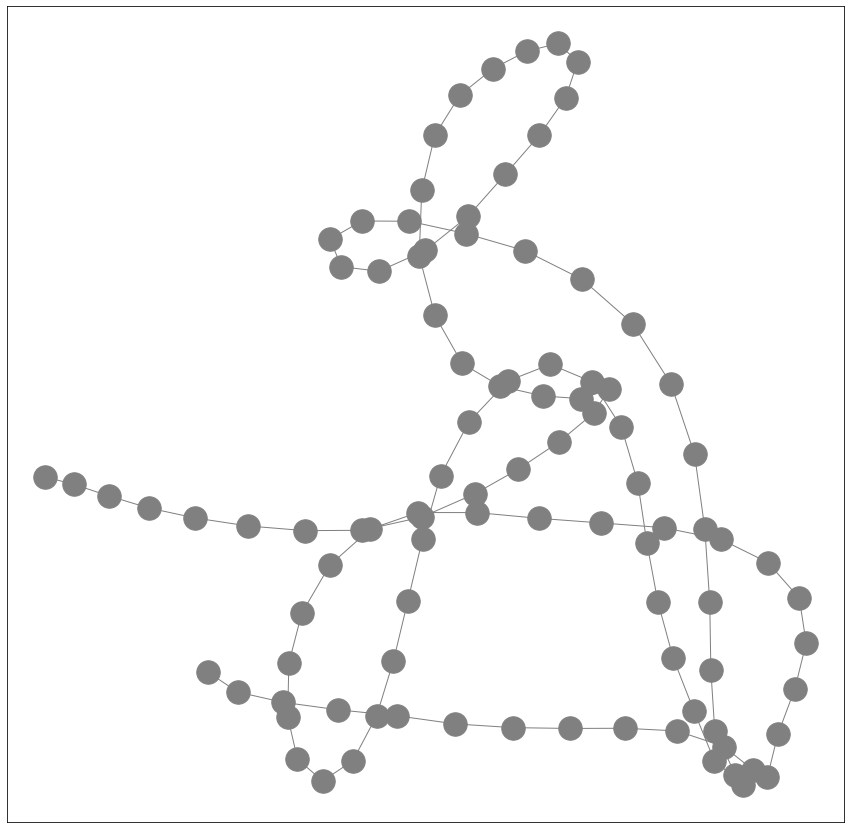

---Normalizing raw data---
----Processing data into windows----
Done---> Total 11 nodes formed
---User#:16 Activity#:4-----
Total nodes present in the graph are-->11
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['72-pink:0', '72-pink:1', '72-pink:2', '72-pink:3', '72-pink:4', '72-pink:5', '72-pink:6', '72-pink:7', '72-pink:8', '72-pink:9', '72-pink:10']
Edges of the graphs are:  [('72-pink:0', '72-pink:1'), ('72-pink:1', '72-pink:2'), ('72-pink:2', '72-pink:3'), ('72-pink:3', '72-pink:4'), ('72-pink:4', '72-pink:5'), ('72-pink:5', '72-pink:6'), ('72-pink:6', '72-pink:7'), ('72-pink:7', '72-pink:8'), ('72-pink:8', '72-pink:9'), ('72-pink:9', '72-pink:10')]
[]
[]
[]
[]
[('72-pink:0', '72-pink:1'), ('72-pink:1', '72-pink:2'), ('72-pink:2

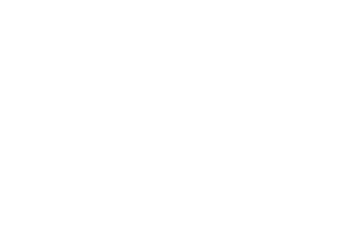

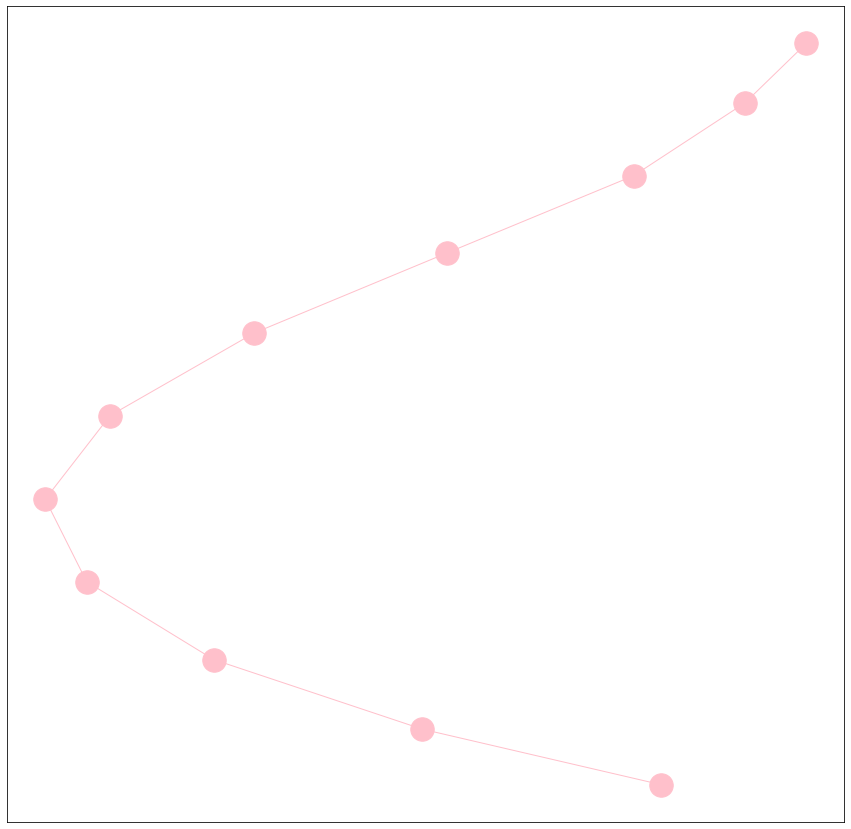

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:16 Activity#:0-----
Total nodes present in the graph are-->12
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['73-red:0', '73-red:1', '73-red:2', '73-red:3', '73-red:4', '73-red:5', '73-red:6', '73-red:7', '73-red:8', '73-red:9', '73-red:10', '73-red:11']
Edges of the graphs are:  [('73-red:0', '73-red:1'), ('73-red:1', '73-red:2'), ('73-red:2', '73-red:3'), ('73-red:3', '73-red:4'), ('73-red:4', '73-red:5'), ('73-red:5', '73-red:6'), ('73-red:6', '73-red:7'), ('73-red:7', '73-red:8'), ('73-red:8', '73-red:9'), ('73-red:9', '73-red:10'), ('73-red:10', '73-red:11')]
[('73-red:0', '73-red:1'), ('73-red:1', '73-r

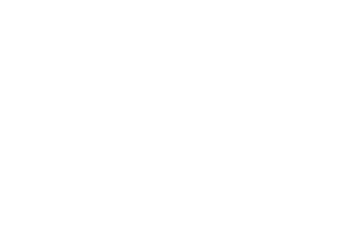

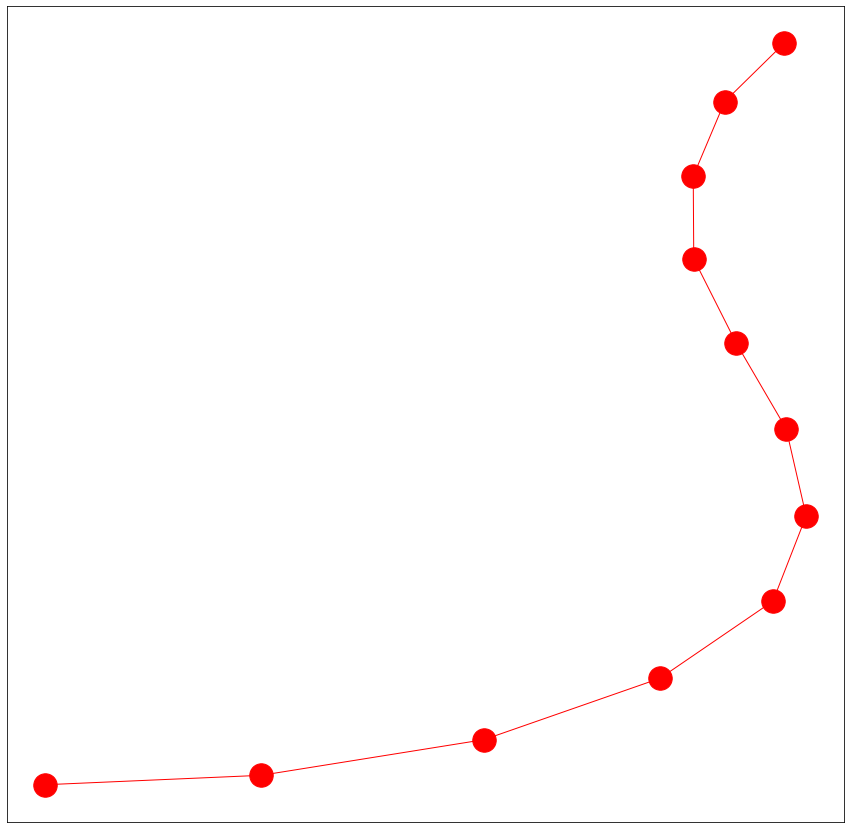

---Normalizing raw data---
----Processing data into windows----
Done---> Total 23 nodes formed
---User#:16 Activity#:2-----
Total nodes present in the graph are-->23
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['74-green:0', '74-green:1', '74-green:2', '74-green:3', '74-green:4', '74-green:5', '74-green:6', '74-green:7', '74-green:8', '74-green:9', '74-green:10', '74-green:11', '74-green:12', '74-green:13', '74-green:14', '74-green:15', '7

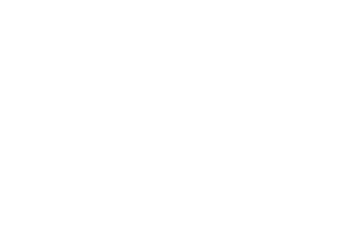

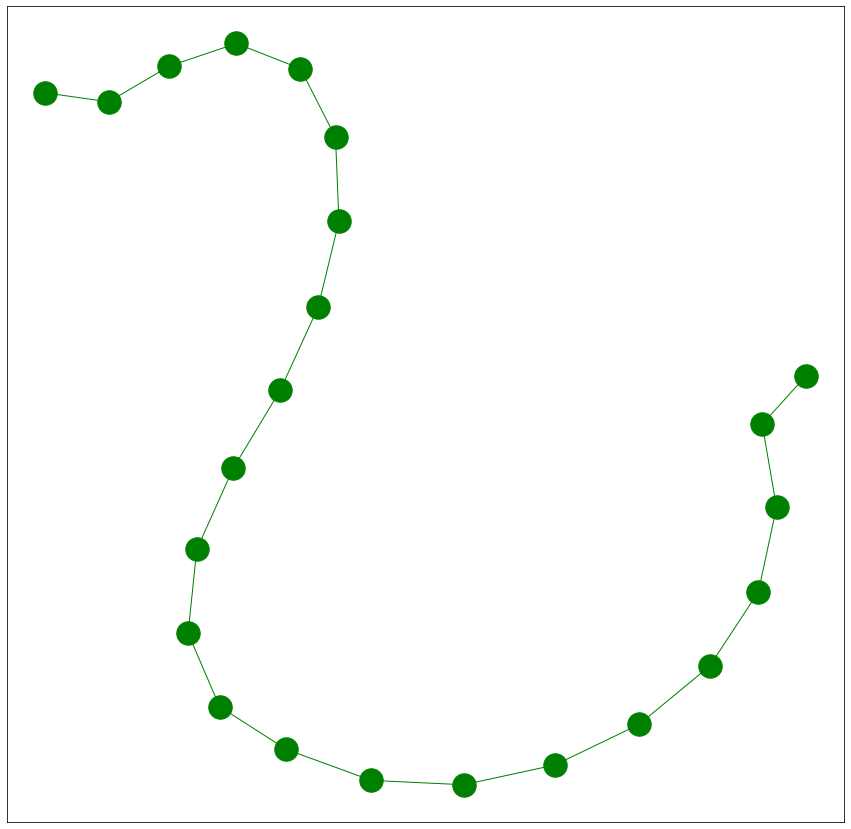

---Normalizing raw data---
----Processing data into windows----
Done---> Total 15 nodes formed
---User#:16 Activity#:3-----
Total nodes present in the graph are-->15
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['75-yellow:0', '75-yellow:1', '75-yellow:2', '75-yellow:3', '75-yellow:4', '75-yellow:5', '75-yellow:6', '75-yellow:7', '75-yellow:8', '75-yellow:9', '75-yellow:10', '75-yellow:11', '75-yellow:12', '75-yellow:13', '75-yellow:14']
Edges of the graphs are:  [('75-yellow:0', '75-yellow:1'), ('75-yellow:1', '75-yellow:2'), ('75-yellow:2', '75-yellow:3'), ('75-yellow:3', '75-yellow:4'), ('75-yellow:4', '75-yellow:5'), ('75-yellow:5',

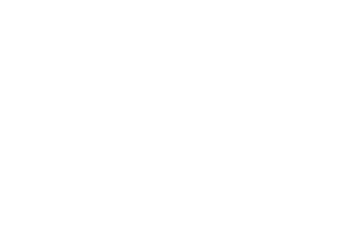

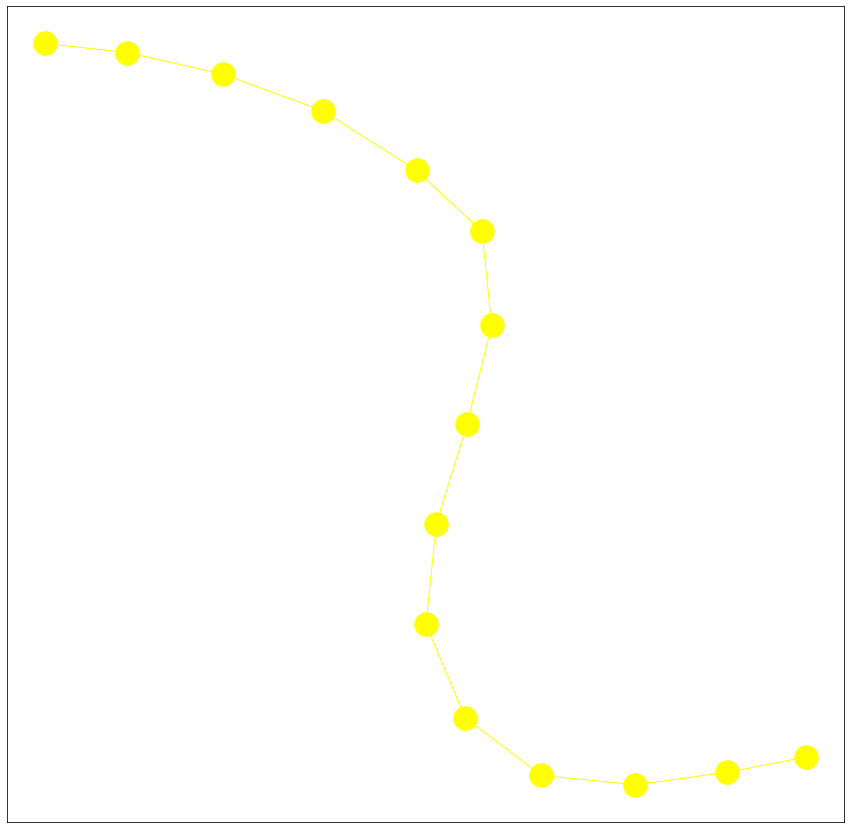

---Normalizing raw data---
----Processing data into windows----
Done---> Total 95 nodes formed
---User#:5 Activity#:5-----
Total nodes present in the graph are-->95
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Lab

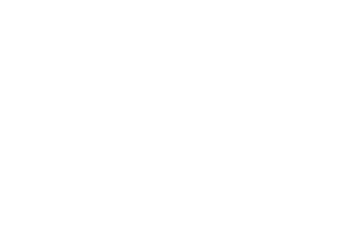

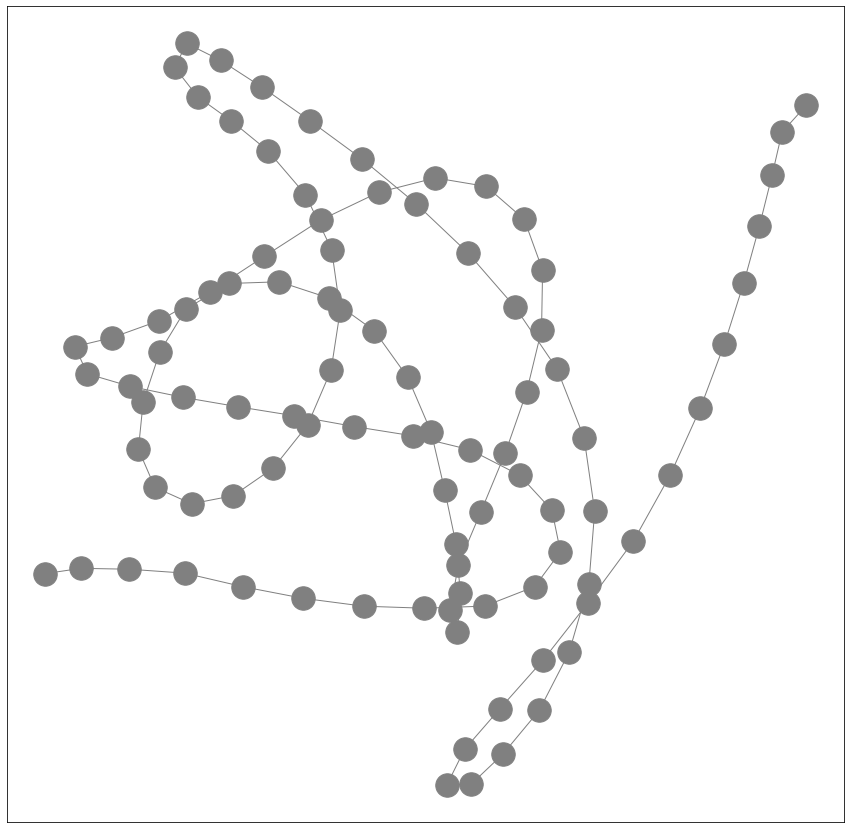

---Normalizing raw data---
----Processing data into windows----
Done---> Total 50 nodes formed
---User#:5 Activity#:1-----
Total nodes present in the graph are-->50
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

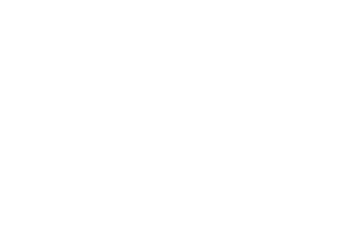

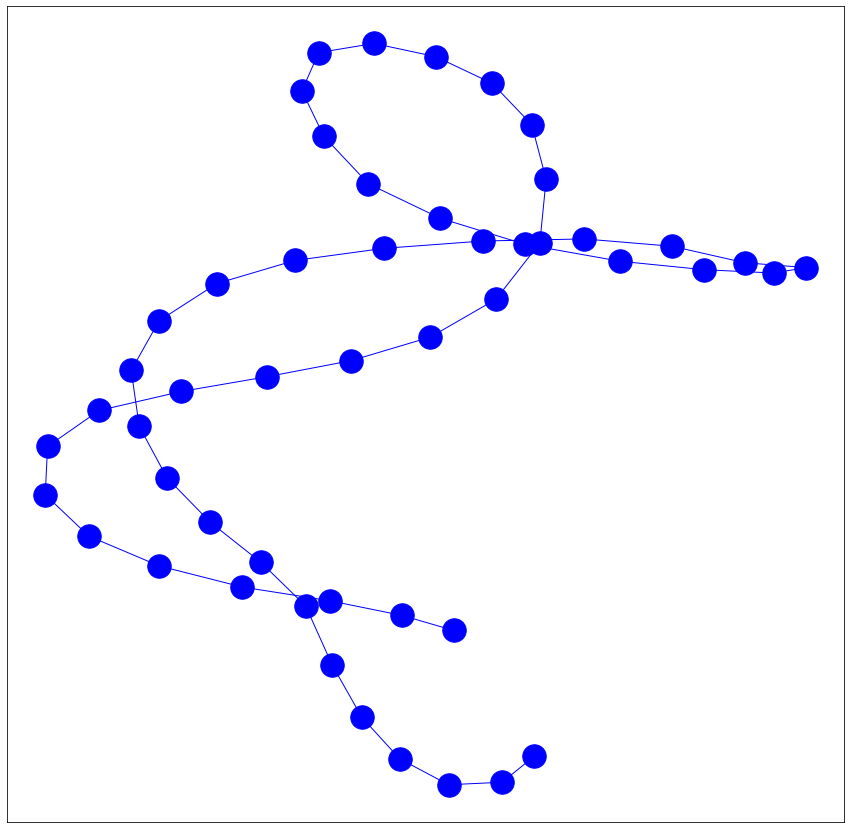

---Normalizing raw data---
----Processing data into windows----
Done---> Total 26 nodes formed
---User#:5 Activity#:4-----
Total nodes present in the graph are-->26
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['78-pink:0', '78-pink:1', '78-pink:2', '78-pink:3', '78-pink:4', '78-pink:5', '78-pink:6', '78-pink:7', '78-pink:8', '78-pink:9', '78-pink:10', '78-pink:11', 

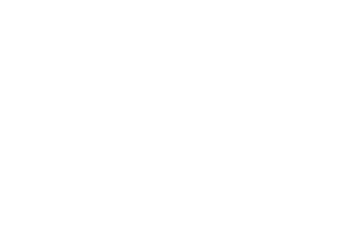

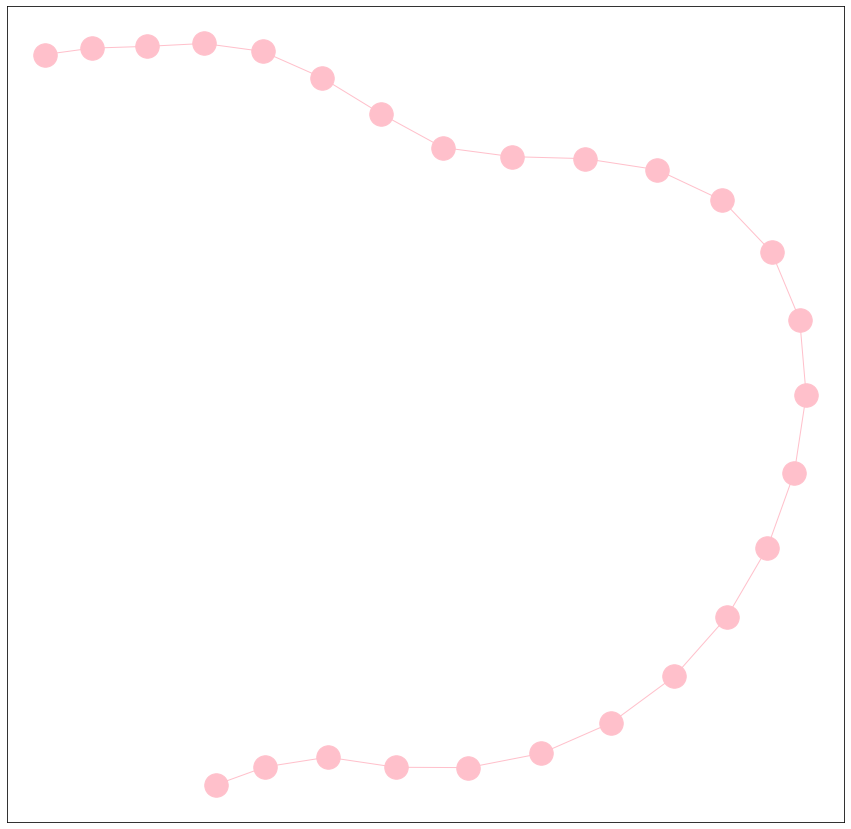

---Normalizing raw data---
----Processing data into windows----
Done---> Total 25 nodes formed
---User#:5 Activity#:0-----
Total nodes present in the graph are-->25
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['79-red:0', '79-red:1', '79-red:2', '79-red:3', '79-red:4', '79-red:5', '79-red:6', '79-red:7', '79-red:8', '79-red:9', '79-red:10', '79-red:11', '79-red:12', '79-red:13', '79-red:14'

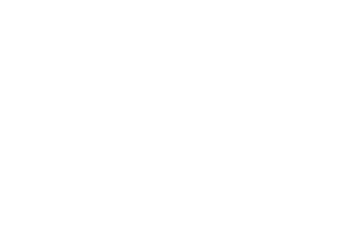

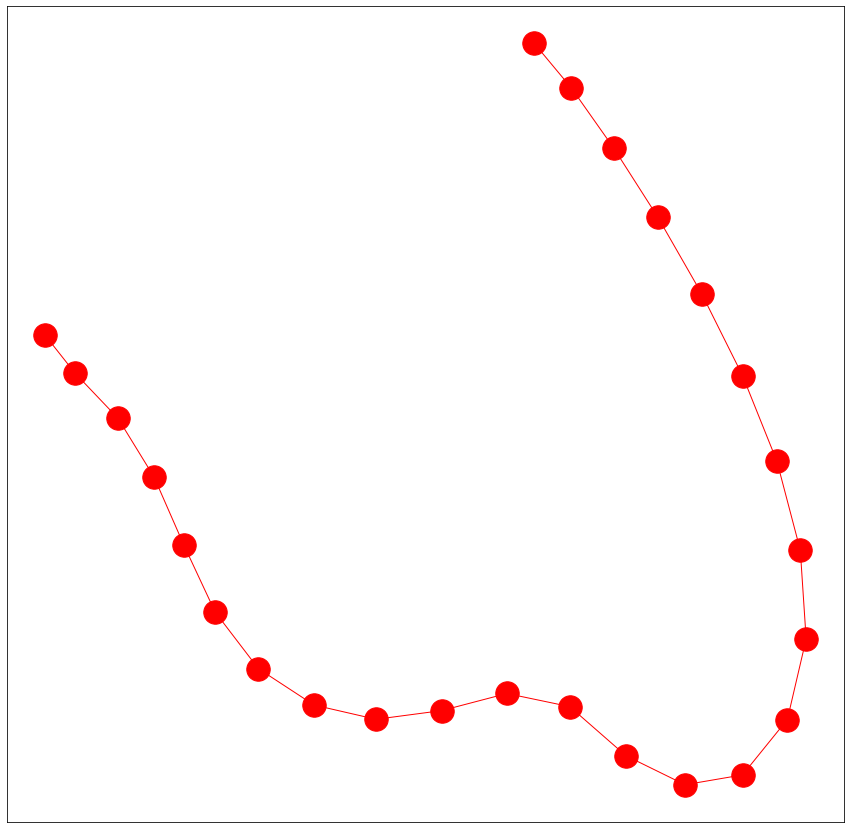

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:5 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['80-green:0', '80-green:1', '80-green:2', '80-green:3', '80-green:4', '80-green:5', '80-green:6', '80-green:7', '80-green:8', '80-green:9', '80-green:10', '80-green:11']
Edges of the graphs are:  [('80-green:0', '80-green:1'), ('80-green:1', '80-green:2'), ('80-green:2', '80-green:3'), ('80-green:3', '80-green:4'), ('80-green:4', '80-green:5'), ('80-green:5', '80-green:6'), ('80-green:6', '80-green:7'), ('80-green:7', '80-green:8'), ('80-green:8', '80-green:9'), ('80-green:9', '80-green:10'), ('80-green

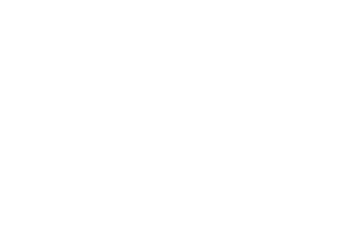

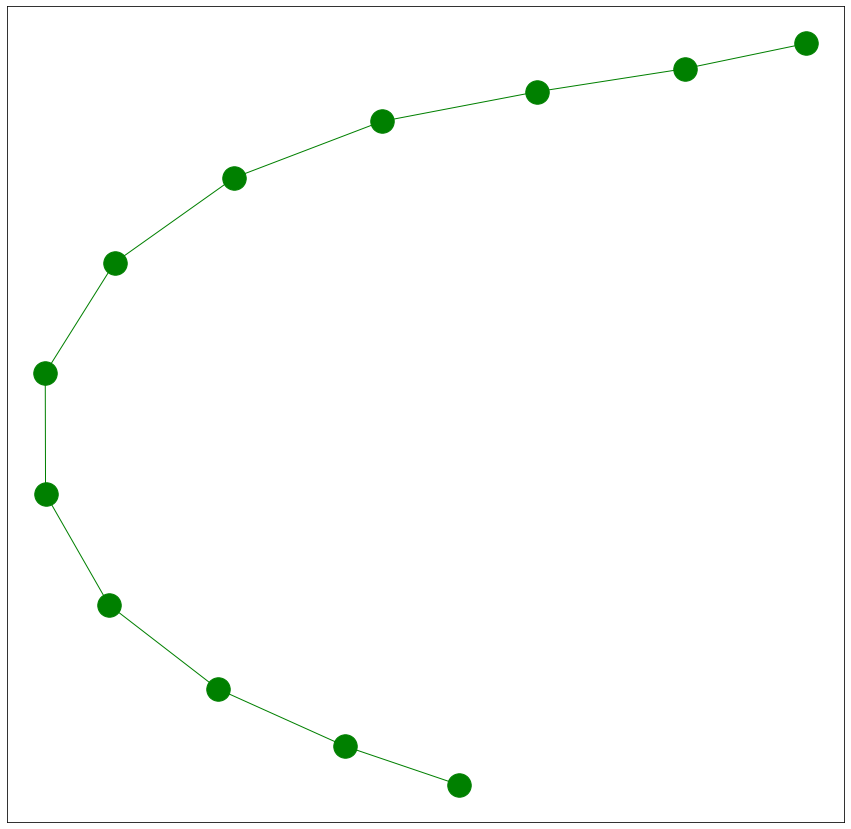

---Normalizing raw data---
----Processing data into windows----
Done---> Total 11 nodes formed
---User#:5 Activity#:3-----
Total nodes present in the graph are-->11
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['81-yellow:0', '81-yellow:1', '81-yellow:2', '81-yellow:3', '81-yellow:4', '81-yellow:5', '81-yellow:6', '81-yellow:7', '81-yellow:8', '81-yellow:9', '81-yellow:10']
Edges of the graphs are:  [('81-yellow:0', '81-yellow:1'), ('81-yellow:1', '81-yellow:2'), ('81-yellow:2', '81-yellow:3'), ('81-yellow:3', '81-yellow:4'), ('81-yellow:4', '81-yellow:5'), ('81-yellow:5', '81-yellow:6'), ('81-yellow:6', '81-yellow:7'), ('81-yellow:7', '81-yellow:8'), ('81-yellow:8', '81-yellow:9'), ('81-yellow:9', '81-yellow:10')]
[]
[]
[]
[('81-yell

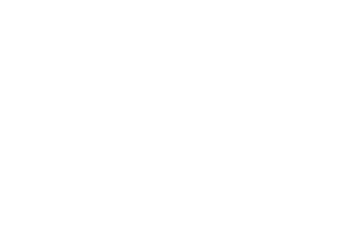

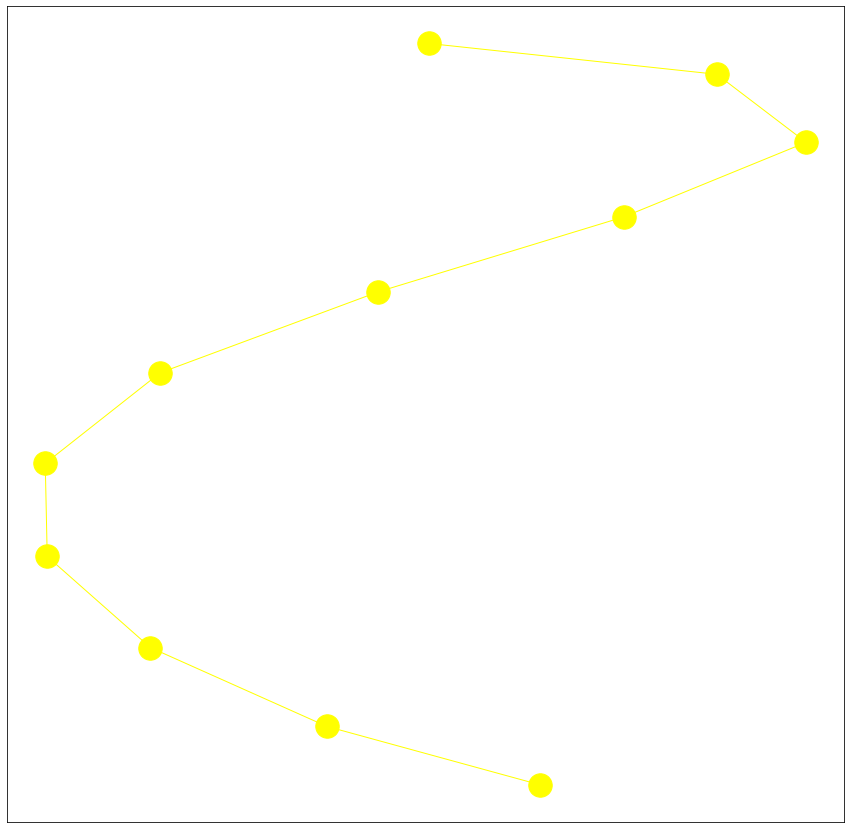

---Normalizing raw data---
----Processing data into windows----
Done---> Total 101 nodes formed
---User#:10 Activity#:5-----
Total nodes present in the graph are-->101
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


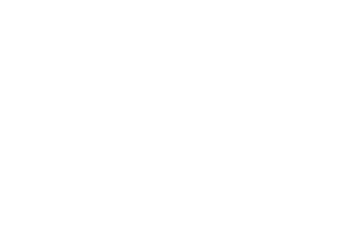

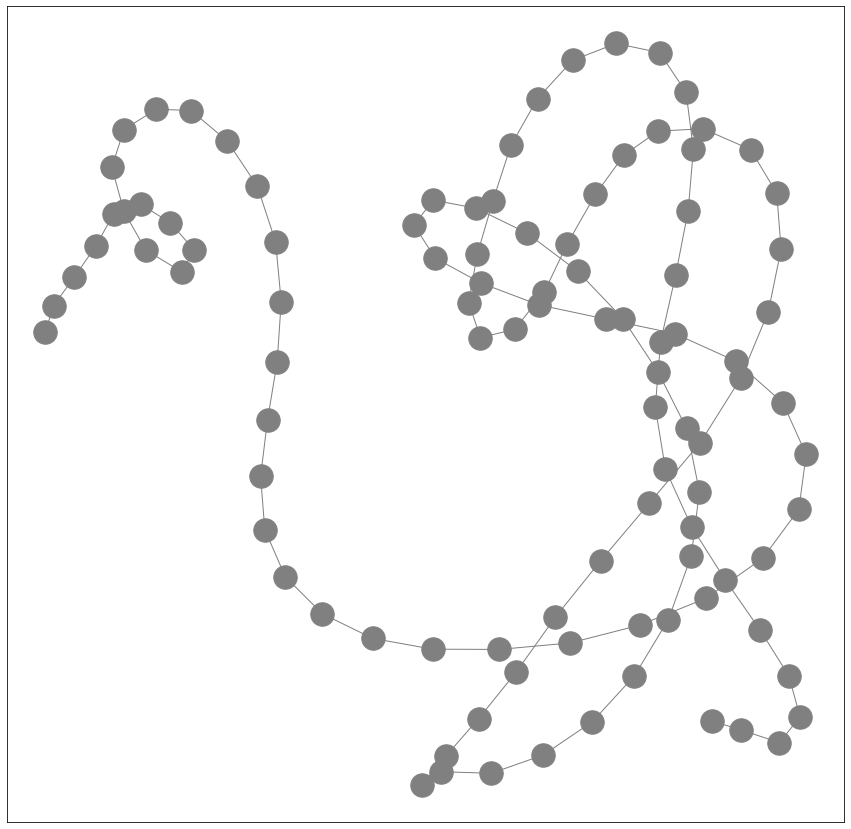

---Normalizing raw data---
----Processing data into windows----
Done---> Total 94 nodes formed
---User#:10 Activity#:1-----
Total nodes present in the graph are-->94
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

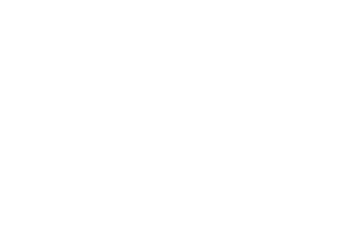

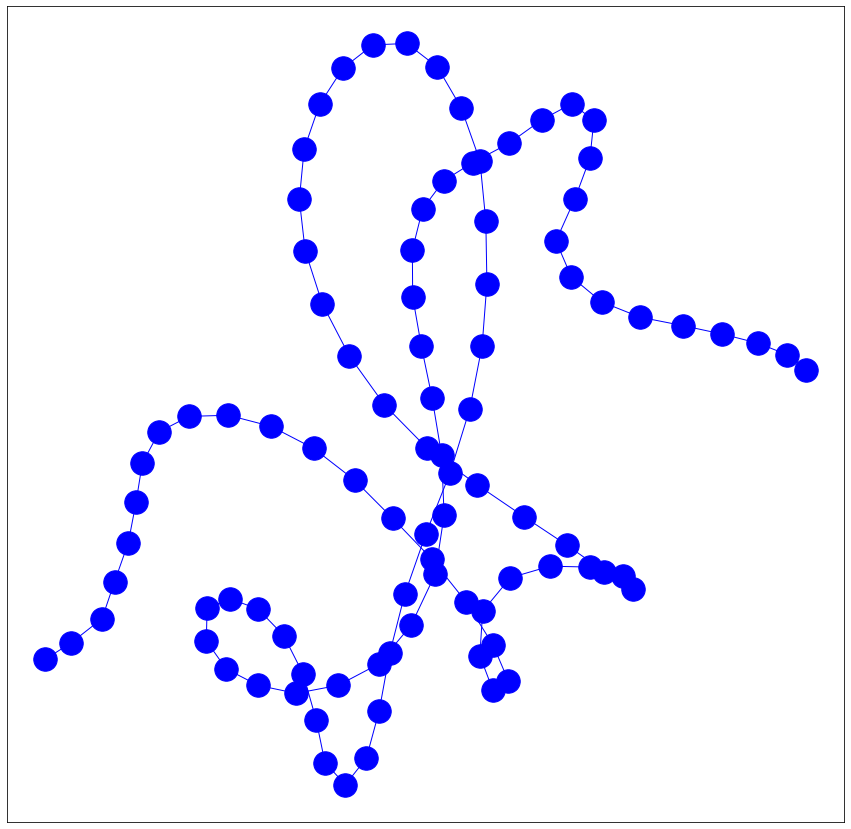

---Normalizing raw data---
----Processing data into windows----
Done---> Total 33 nodes formed
---User#:10 Activity#:4-----
Total nodes present in the graph are-->33
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of 

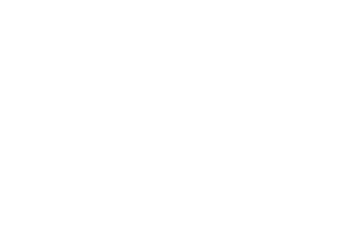

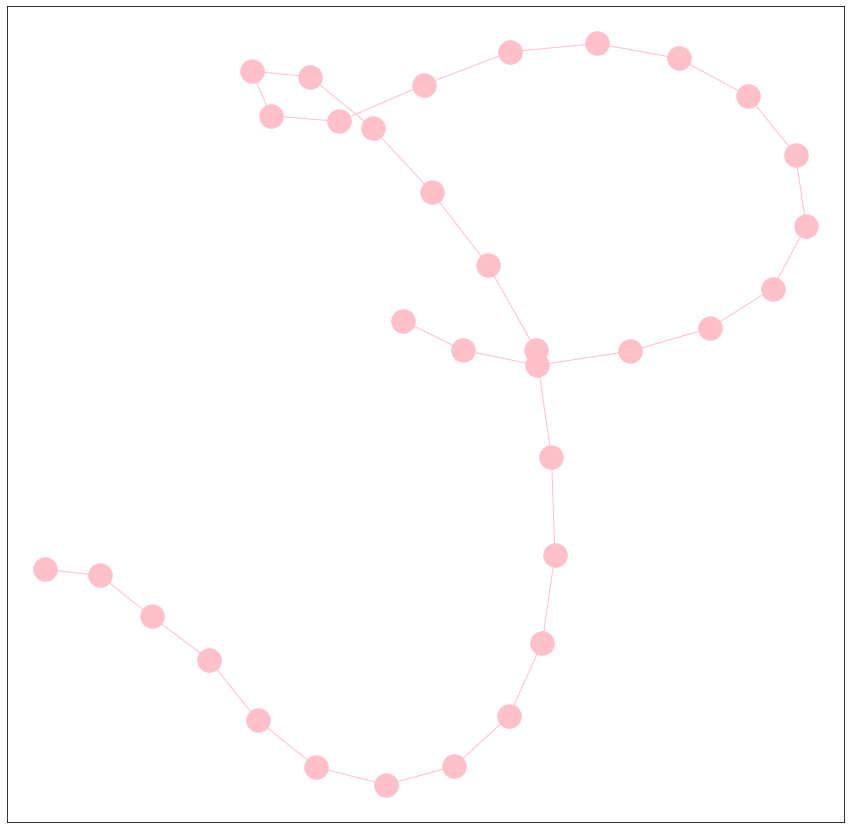

---Normalizing raw data---
----Processing data into windows----
Done---> Total 29 nodes formed
---User#:10 Activity#:0-----
Total nodes present in the graph are-->29
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['85-red:0', '85-red:1', '85-red:2', '85-red:3', '85-red:4', '85-red:5', '85-red:6'

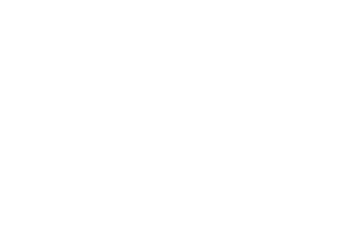

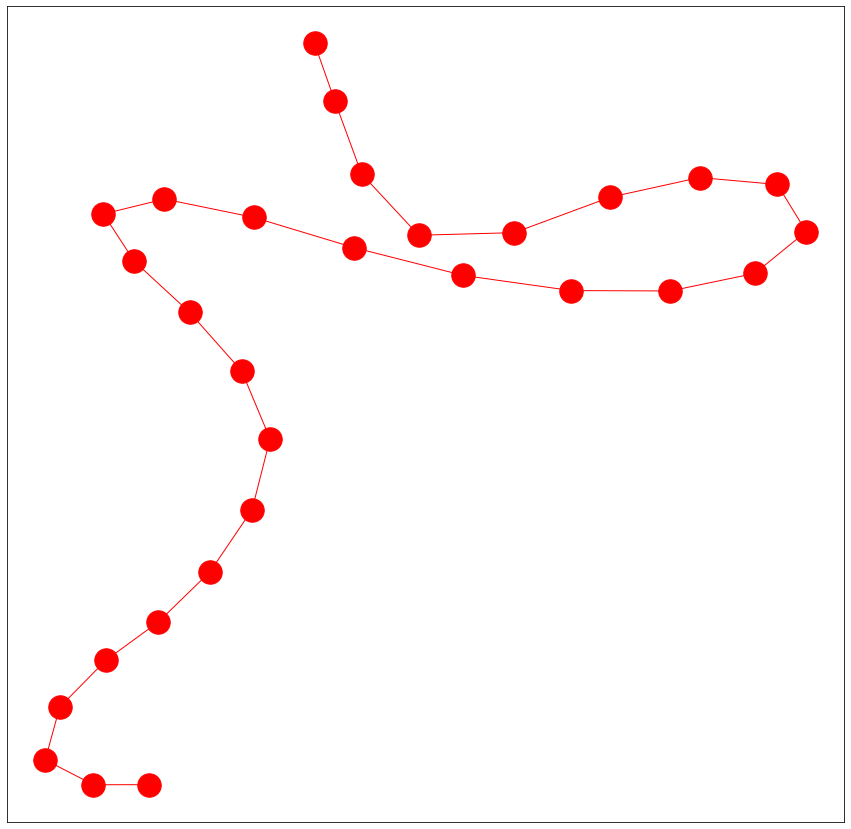

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:10 Activity#:3-----
Total nodes present in the graph are-->12
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['86-yellow:0', '86-yellow:1', '86-yellow:2', '86-yellow:3', '86-yellow:4', '86-yellow:5', '86-yellow:6', '86-yellow:7', '86-yellow:8', '86-yellow:9', '86-yellow:10', '86-yellow:11']
Edges of the graphs are:  [('86-yellow:0', '86-yellow:1'), ('86-yellow:1', '86-yellow:2'), ('86-yellow:2', '86-yellow:3'), ('86-yellow:3', '86-yellow:4'), ('86-yellow:4', '86-yellow:5'), ('86-yellow:5', '86-yellow:6'), ('86-yellow:6', '86-yellow:7'), ('86-yellow:7', '86-yellow:8'), ('86-yellow:8', '86-yellow:9'), ('86-yello

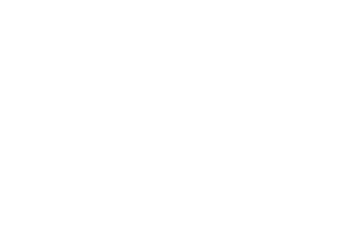

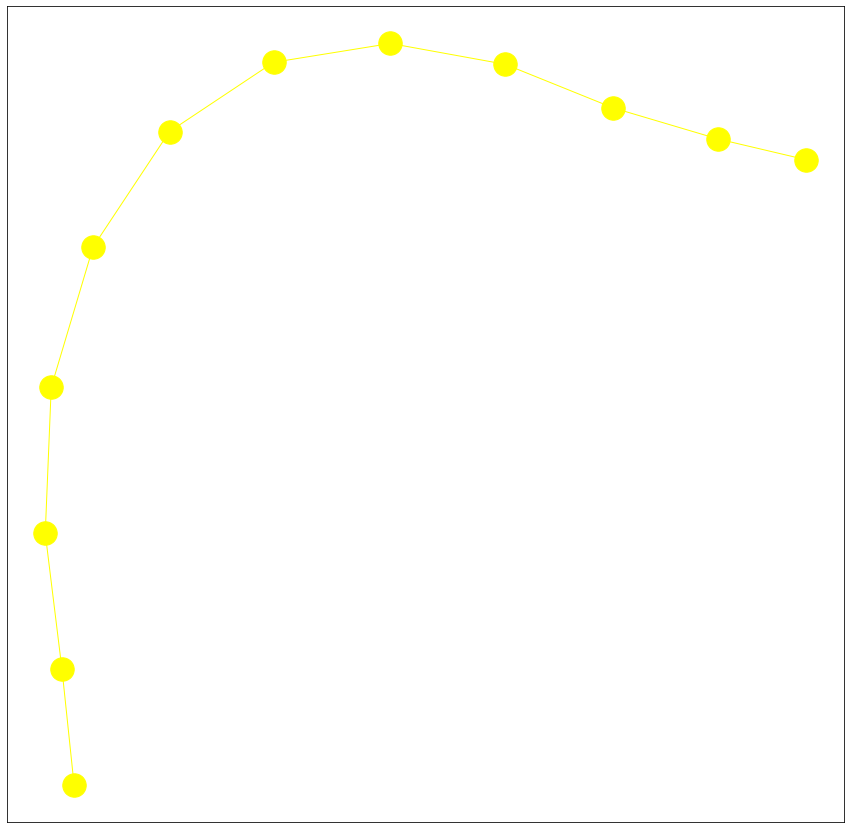

---Normalizing raw data---
----Processing data into windows----
Done---> Total 110 nodes formed
---User#:28 Activity#:5-----
Total nodes present in the graph are-->110
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


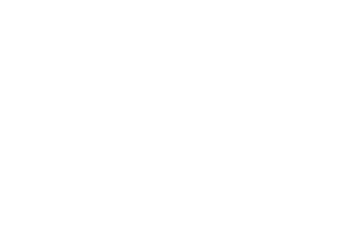

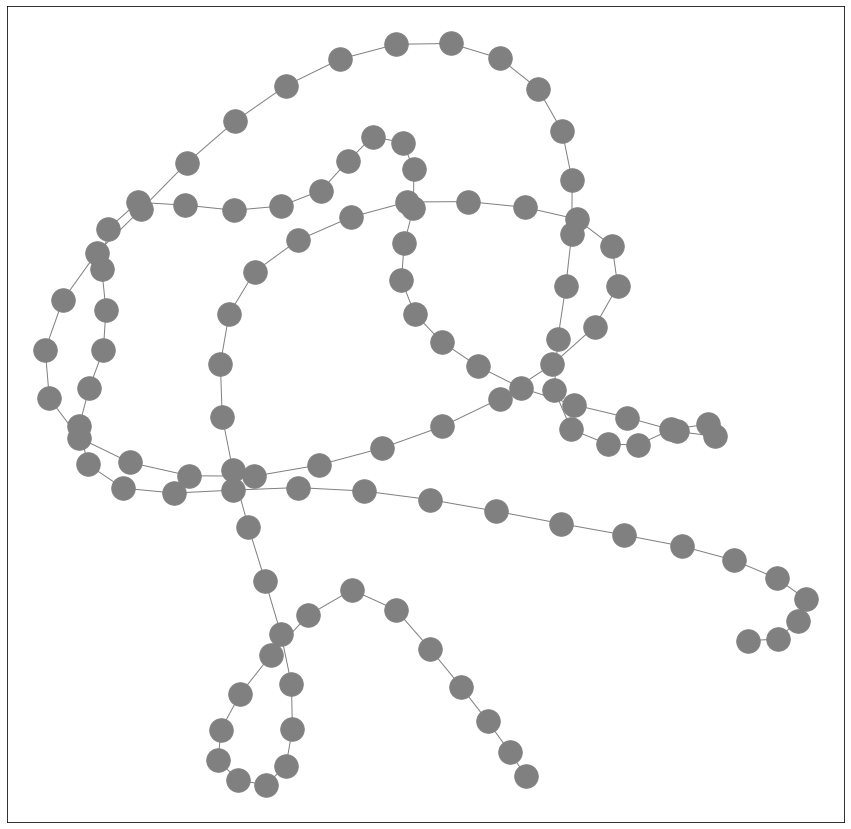

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:28 Activity#:4-----
Total nodes present in the graph are-->22
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['88-pink:0', '88-pink:1', '88-pink:2', '88-pink:3', '88-pink:4', '88-pink:5', '88-pink:6', '88-pink:7', '88-pink:8', '88-pink:9', '88-pink:10', '88-pink:11', '88-pink:12', '88-pink:13', '88-pink:14', '88-pink:15', '88-pink:16', '88-pink:17', '88-pink:18', '

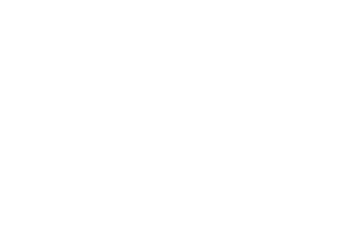

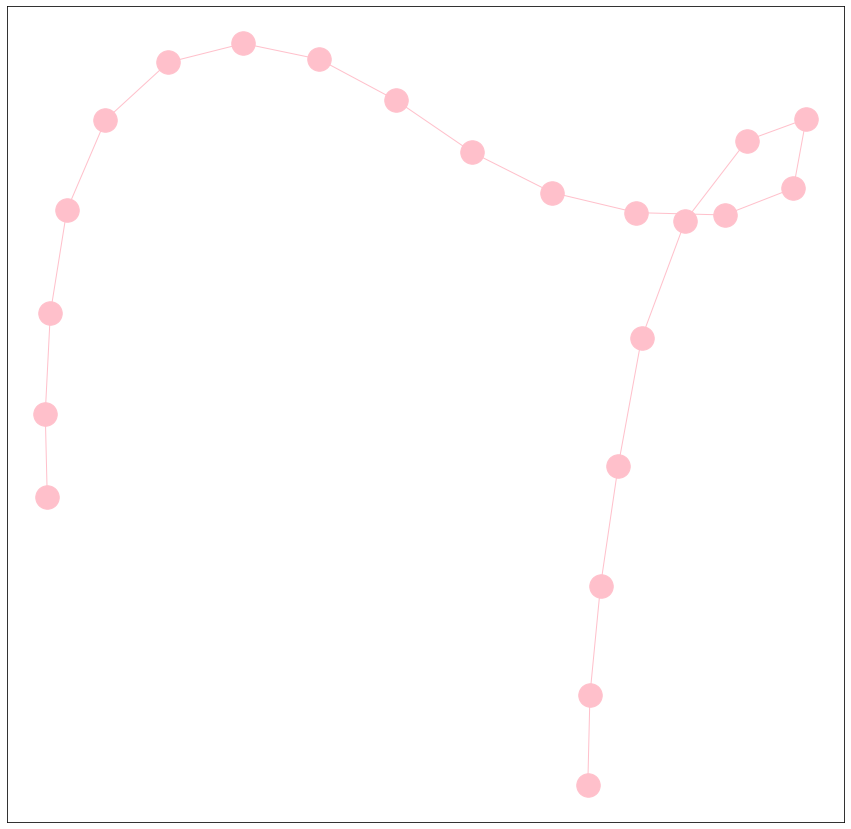

---Normalizing raw data---
----Processing data into windows----
Done---> Total 23 nodes formed
---User#:28 Activity#:0-----
Total nodes present in the graph are-->23
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['89-red:0', '89-red:1', '89-red:2', '89-red:3', '89-red:4', '89-red:5', '89-red:6', '89-red:7', '89-red:8', '89-red:9', '89-red:10', '89-red:11', '89-red:12', '89-red:13', '89-red:14', '89-red:15', '89-red:16', '89-red:17', '89-red:

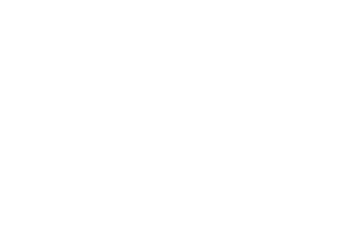

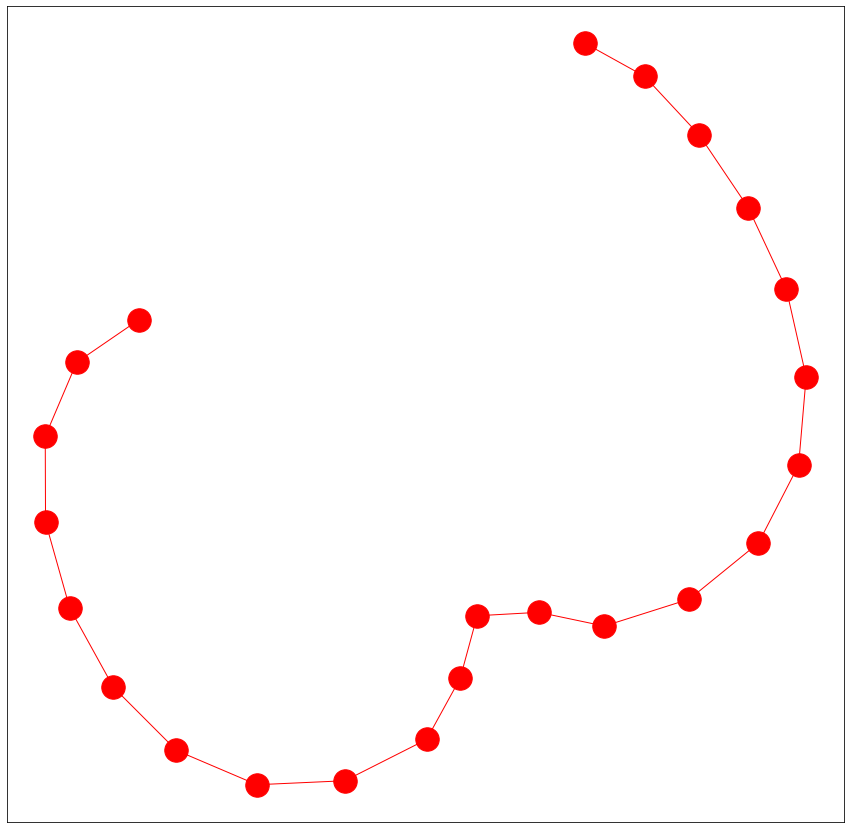

---Normalizing raw data---
----Processing data into windows----
Done---> Total 10 nodes formed
---User#:28 Activity#:3-----
Total nodes present in the graph are-->10
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['90-yellow:0', '90-yellow:1', '90-yellow:2', '90-yellow:3', '90-yellow:4', '90-yellow:5', '90-yellow:6', '90-yellow:7', '90-yellow:8', '90-yellow:9']
Edges of the graphs are:  [('90-yellow:0', '90-yellow:1'), ('90-yellow:1', '90-yellow:2'), ('90-yellow:2', '90-yellow:3'), ('90-yellow:3', '90-yellow:4'), ('90-yellow:4', '90-yellow:5'), ('90-yellow:5', '90-yellow:6'), ('90-yellow:6', '90-yellow:7'), ('90-yellow:7', '90-yellow:8'), ('90-yellow:8', '90-yellow:9')]
[]
[]
[]
[('90-yellow:0', '90-yellow:1'), ('90-yellow:1', '90-yellow:2'), ('90-yellow:2', '9

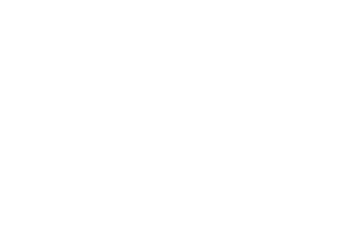

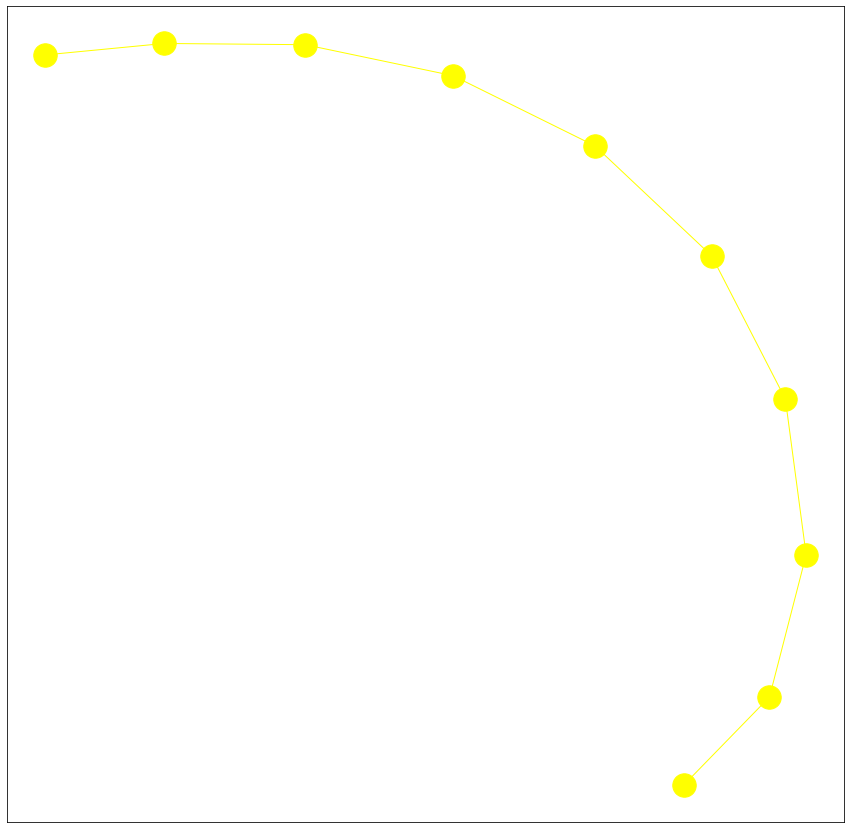

---Normalizing raw data---
----Processing data into windows----
Done---> Total 103 nodes formed
---User#:26 Activity#:5-----
Total nodes present in the graph are-->103
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


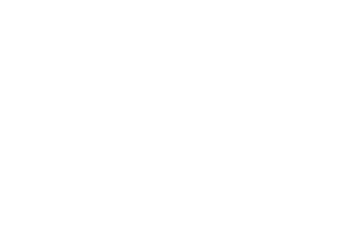

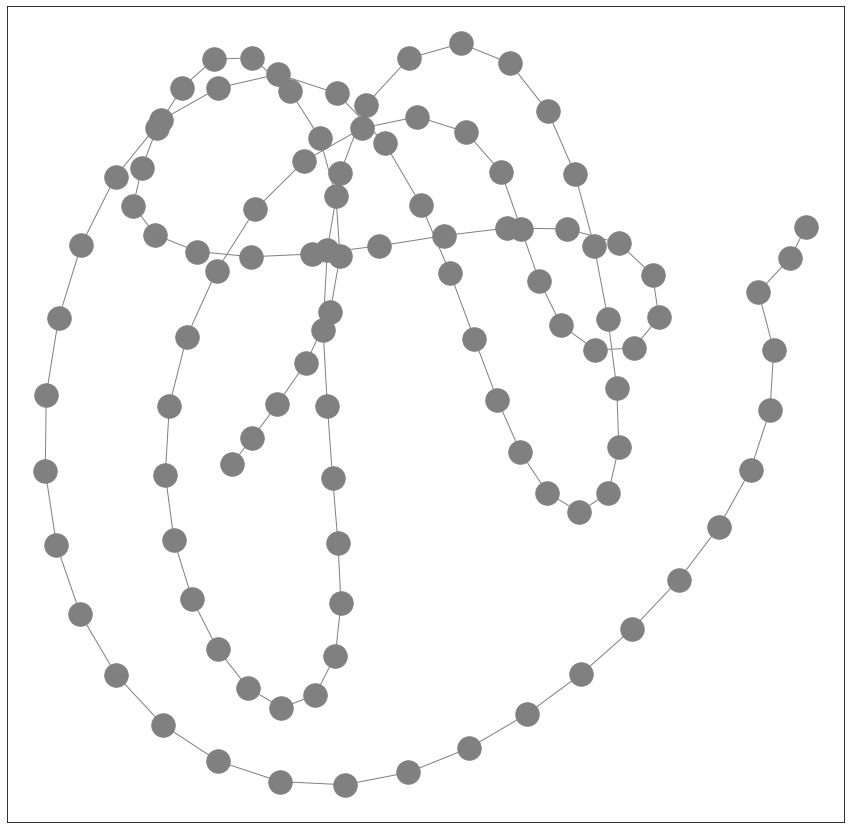

---Normalizing raw data---
----Processing data into windows----
Done---> Total 93 nodes formed
---User#:26 Activity#:1-----
Total nodes present in the graph are-->93
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

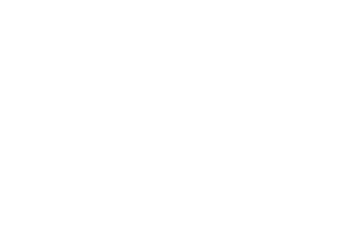

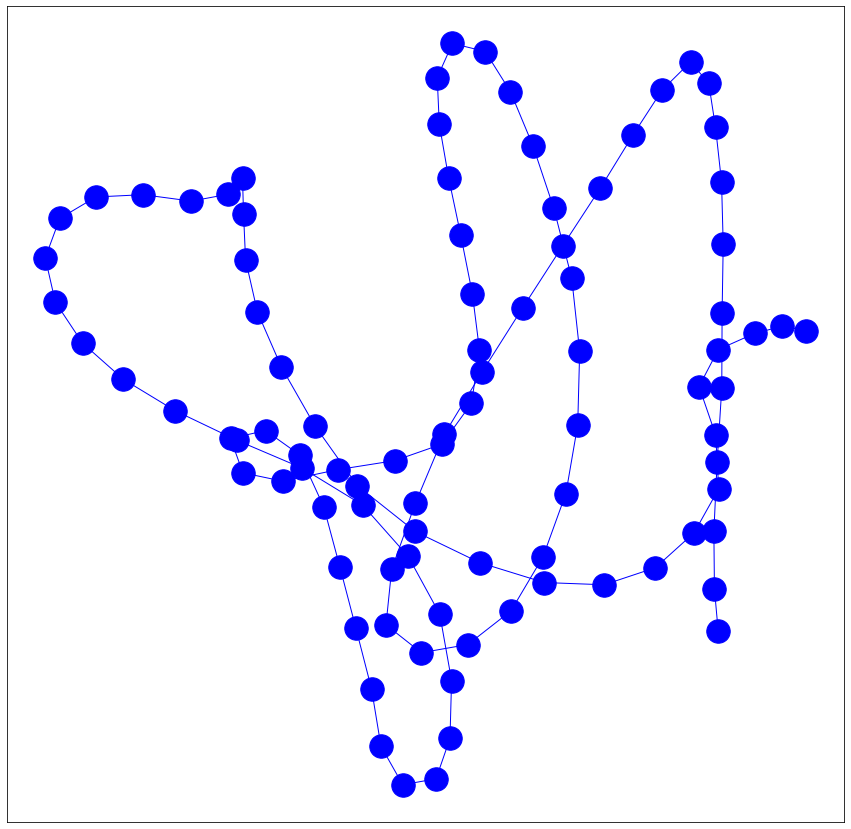

---Normalizing raw data---
----Processing data into windows----
Done---> Total 28 nodes formed
---User#:26 Activity#:4-----
Total nodes present in the graph are-->28
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['93-pink:0', '93-pink:1', '93-pink:2', '93-pink:3', '93-pink:4', '93-pink:5', '93-pink:6', '93-pink:7', '93

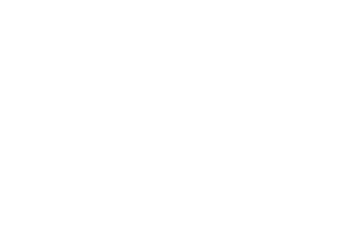

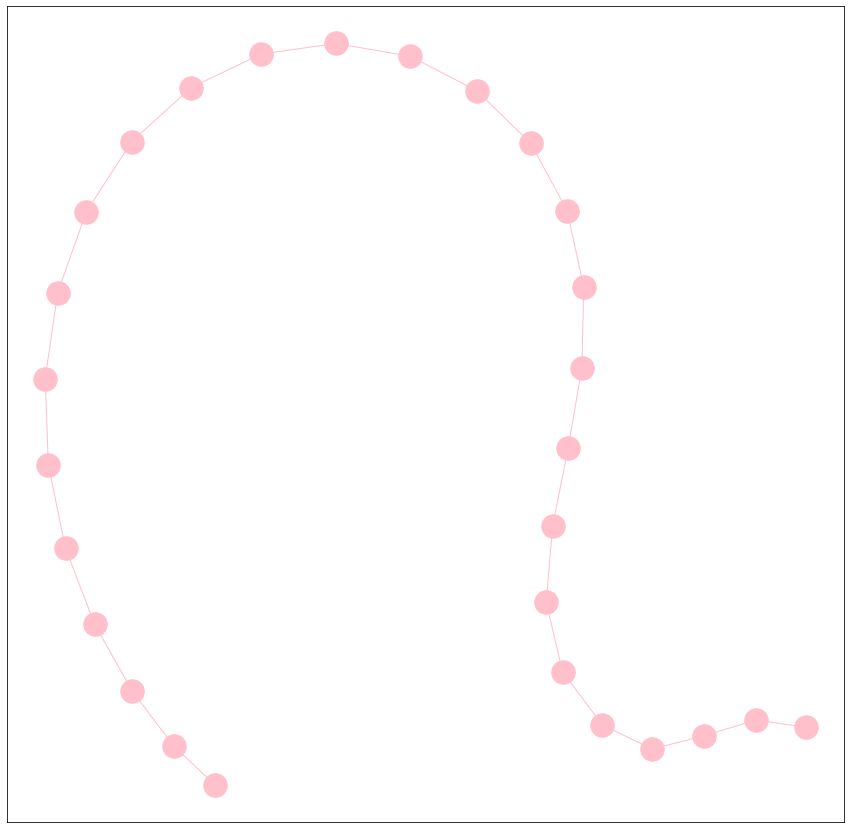

---Normalizing raw data---
----Processing data into windows----
Done---> Total 29 nodes formed
---User#:26 Activity#:0-----
Total nodes present in the graph are-->29
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['94-red:0', '94-red:1', '94-red:2', '94-red:3', '94-red:4', '94-red:5', '94-red:6'

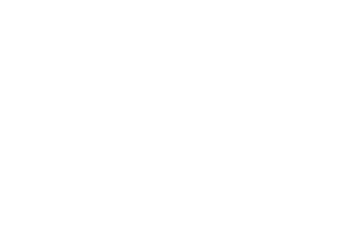

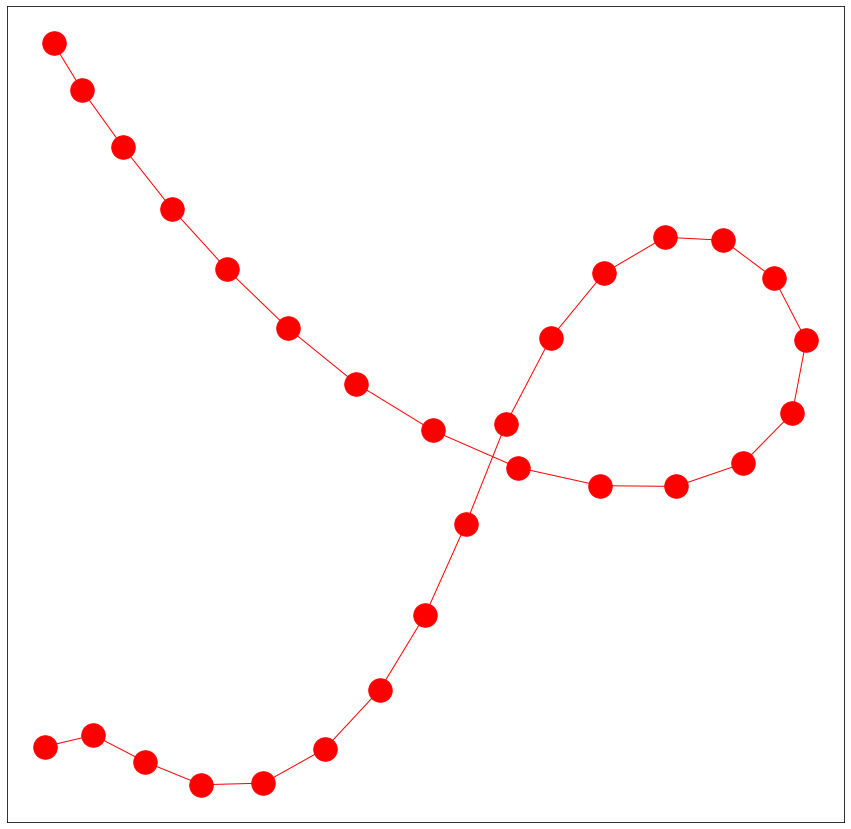

---Normalizing raw data---
----Processing data into windows----
Done---> Total 108 nodes formed
---User#:14 Activity#:5-----
Total nodes present in the graph are-->108
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


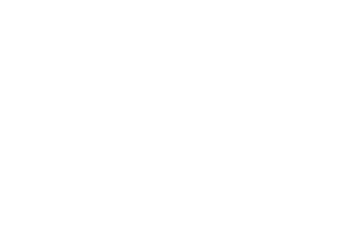

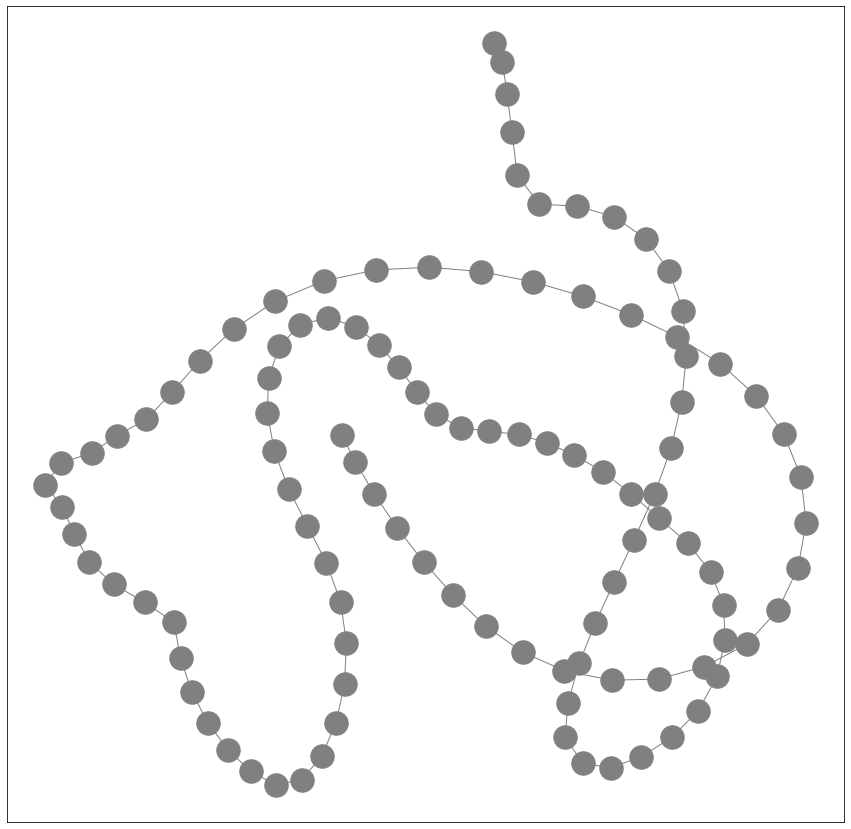

---Normalizing raw data---
----Processing data into windows----
Done---> Total 103 nodes formed
---User#:14 Activity#:1-----
Total nodes present in the graph are-->103
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:


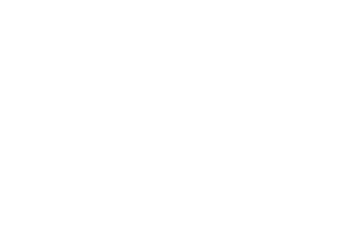

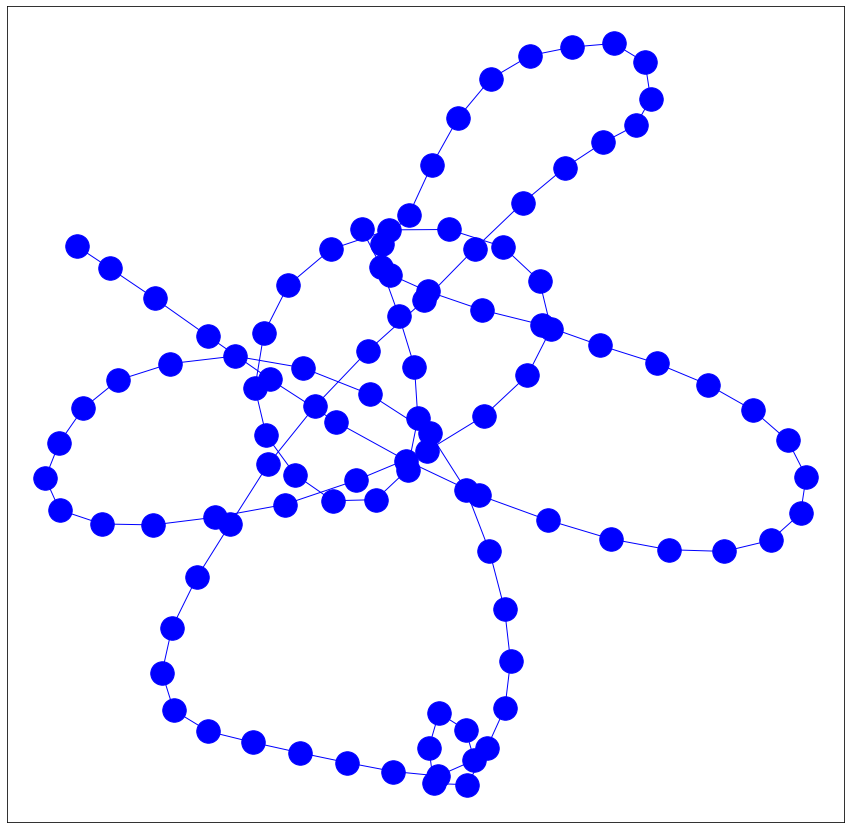

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:14 Activity#:0-----
Total nodes present in the graph are-->22
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['97-red:0', '97-red:1', '97-red:2', '97-red:3', '97-red:4', '97-red:5', '97-red:6', '97-red:7', '97-red:8', '97-red:9', '97-red:10', '97-red:11', '97-red:12', '97-red:13', '97-red:14', '97-red:15', '97-red:16', '97-red:17', '97-red:18', '97-red:19', '97-red

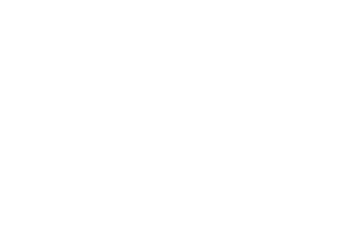

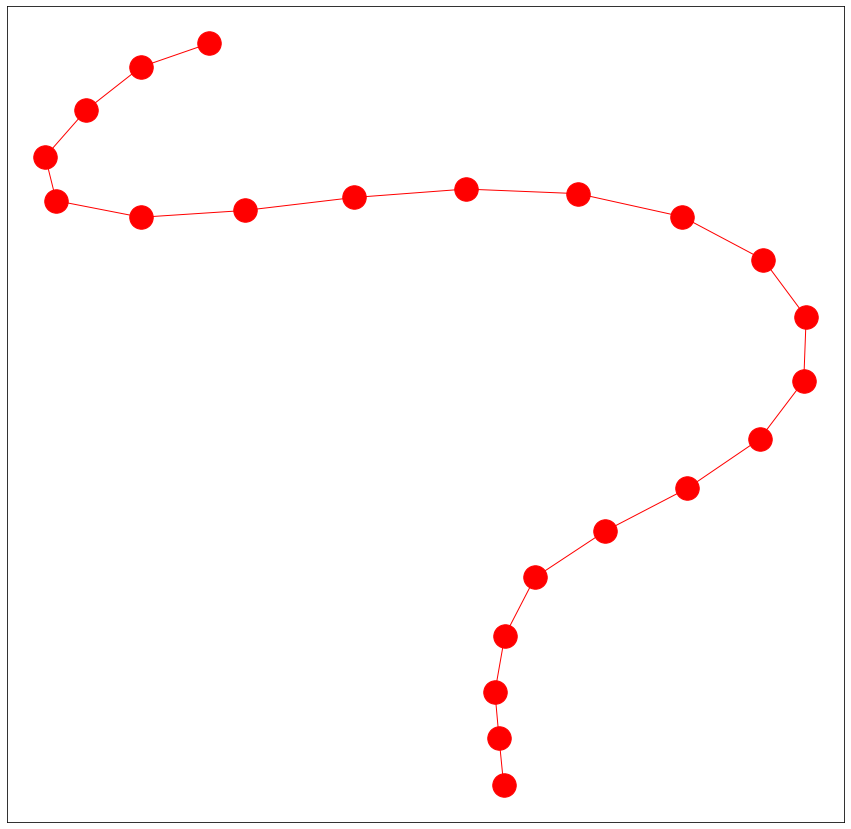

---Normalizing raw data---
----Processing data into windows----
Done---> Total 63 nodes formed
---User#:14 Activity#:4-----
Total nodes present in the graph are-->63
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

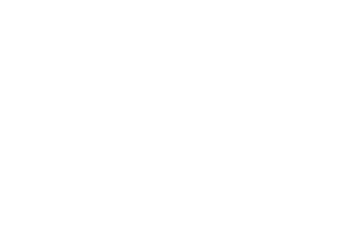

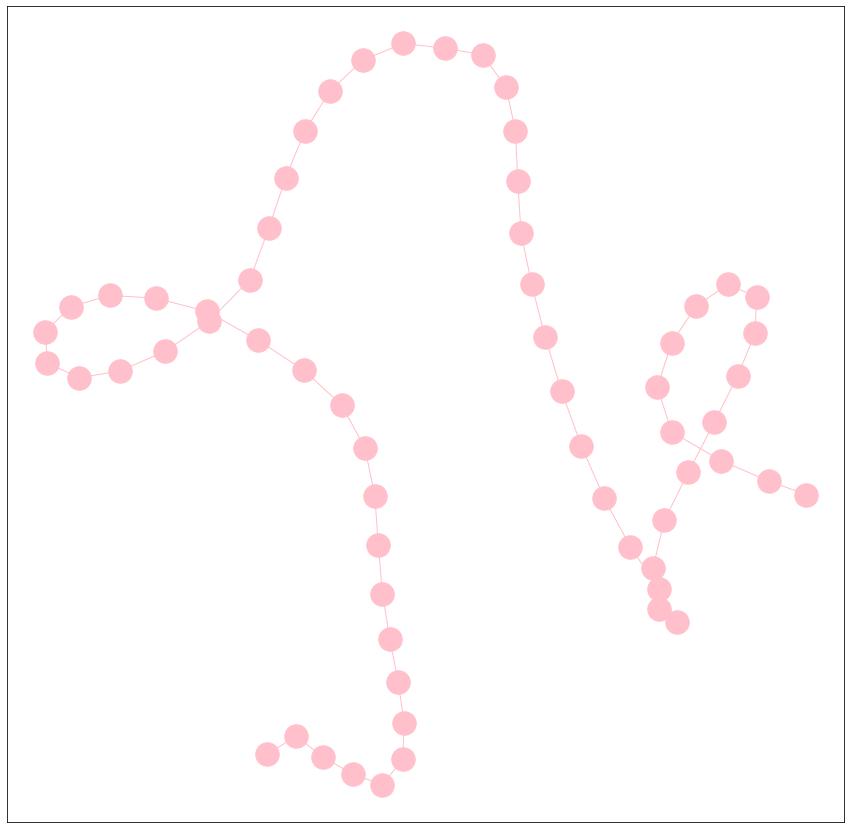

---Normalizing raw data---
----Processing data into windows----
Done---> Total 48 nodes formed
---User#:24 Activity#:5-----
Total nodes present in the graph are-->48
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

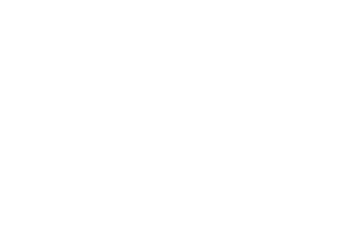

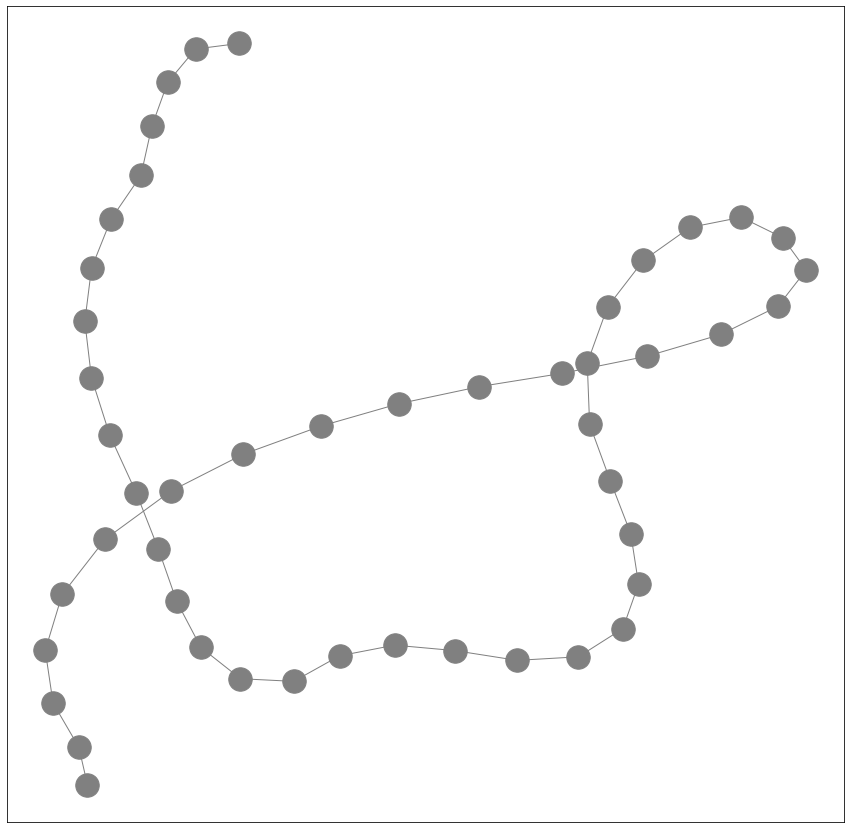

---Normalizing raw data---
----Processing data into windows----
Done---> Total 95 nodes formed
---User#:24 Activity#:1-----
Total nodes present in the graph are-->95
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

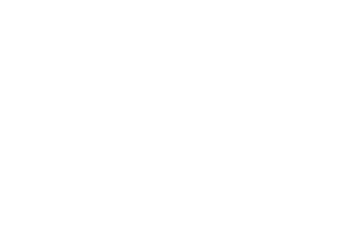

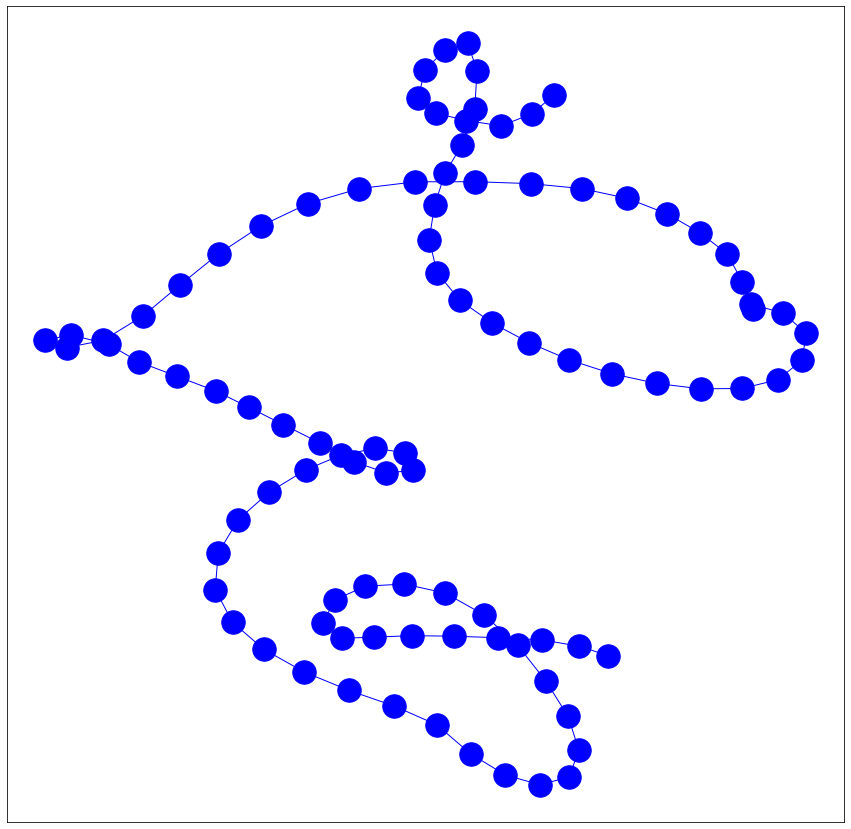

---Normalizing raw data---
----Processing data into windows----
Done---> Total 23 nodes formed
---User#:24 Activity#:4-----
Total nodes present in the graph are-->23
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['101-pink:0', '101-pink:1', '101-pink:2', '101-pink:3', '101-pink:4', '101-pink:5', '101-pink:6', '101-pink:7', '101-pink:8', '101-pink:9', '101-pink:10', '101-pink:11', '101-pink:12', '101-pink:13', '101-pink:14', '101-pink:15', '1

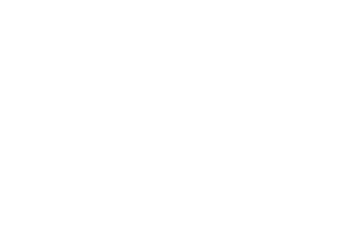

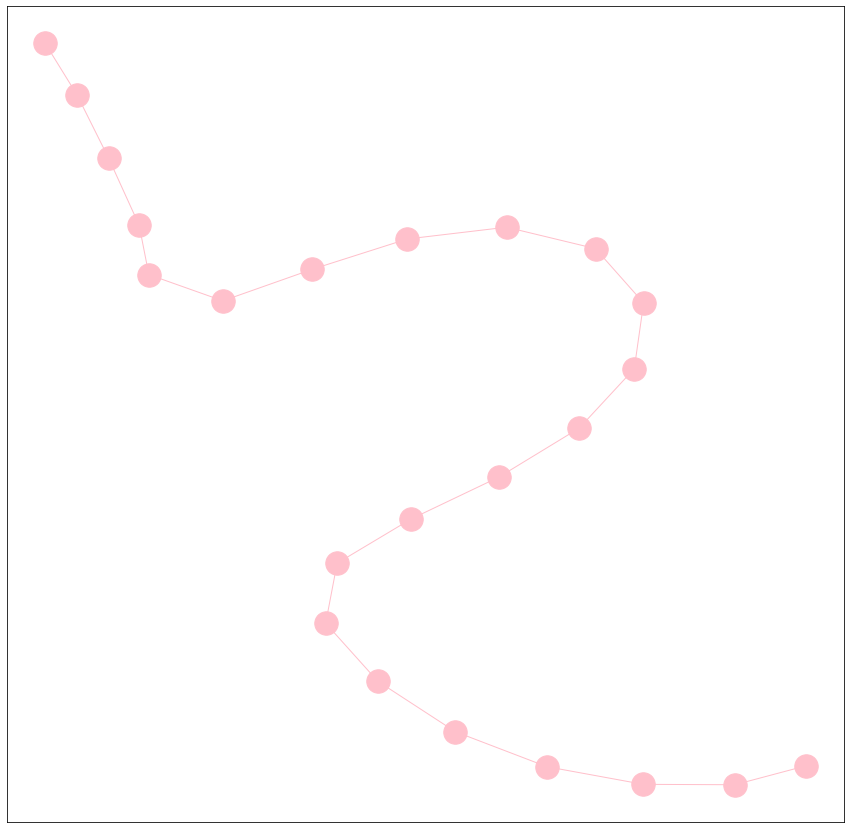

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:24 Activity#:0-----
Total nodes present in the graph are-->22
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['102-red:0', '102-red:1', '102-red:2', '102-red:3', '102-red:4', '102-red:5', '102-red:6', '102-red:7', '102-red:8', '102-red:9', '102-red:10', '102-red:11', '102-red:12', '102-red:13', '102-red:14', '102-red:15', '102-red:16', '102-red:17', '102-red:18', '

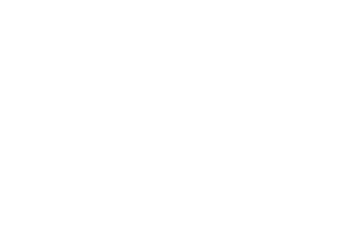

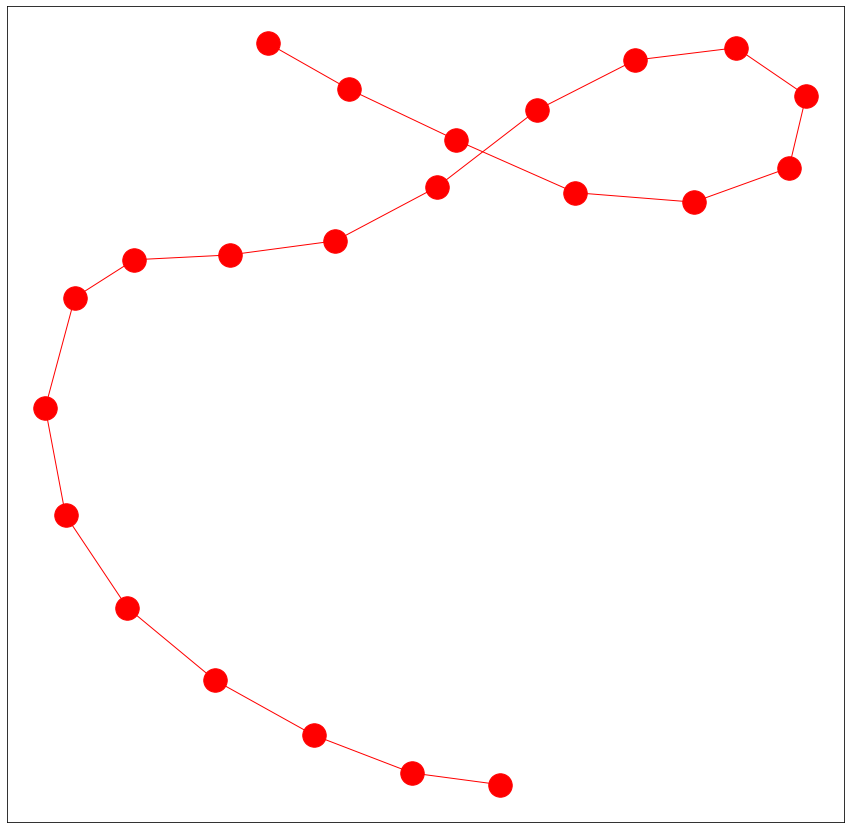

---Normalizing raw data---
----Processing data into windows----
Done---> Total 4 nodes formed
---User#:24 Activity#:3-----
Total nodes present in the graph are-->4
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['103-yellow:0', '103-yellow:1', '103-yellow:2', '103-yellow:3']
Edges of the graphs are:  [('103-yellow:0', '103-yellow:1'), ('103-yellow:1', '103-yellow:2'), ('103-yellow:2', '103-yellow:3')]
[]
[]
[]
[('103-yellow:0', '103-yellow:1'), ('103-yellow:1', '103-yellow:2'), ('103-yellow:2', '103-yellow:3')]
[]
[]


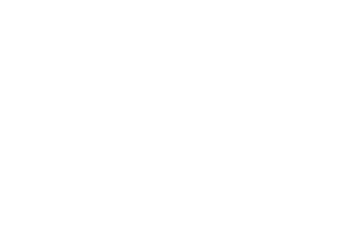

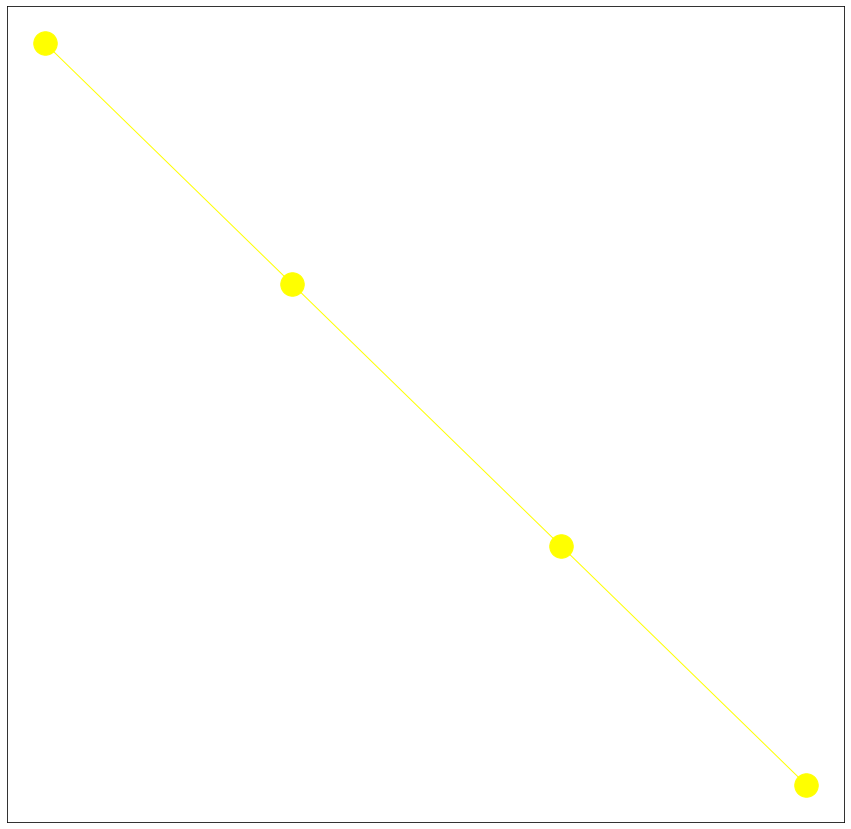

---Normalizing raw data---
----Processing data into windows----
Done---> Total 5 nodes formed
---User#:24 Activity#:2-----
Total nodes present in the graph are-->5
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['104-green:0', '104-green:1', '104-green:2', '104-green:3', '104-green:4']
Edges of the graphs are:  [('104-green:0', '104-green:1'), ('104-green:1', '104-green:2'), ('104-green:2', '104-green:3'), ('104-green:3', '104-green:4')]
[]
[]
[('104-green:0', '104-green:1'), ('104-green:1', '104-green:2'), ('104-green:2', '104-green:3'), ('104-green:3', '104-green:4')]
[]
[]
[]


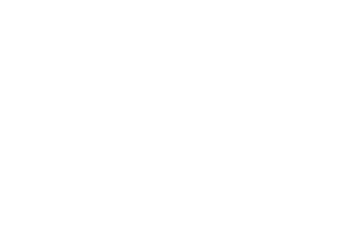

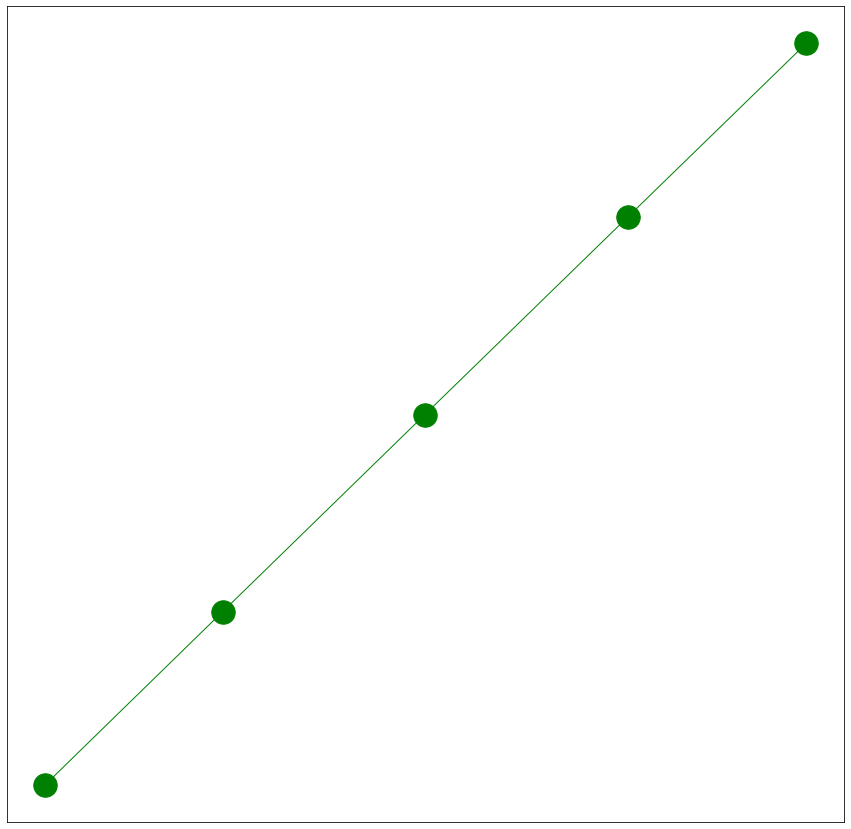

---Normalizing raw data---
----Processing data into windows----
Done---> Total 84 nodes formed
---User#:12 Activity#:5-----
Total nodes present in the graph are-->84
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

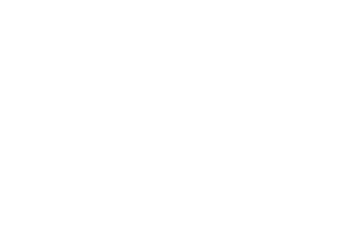

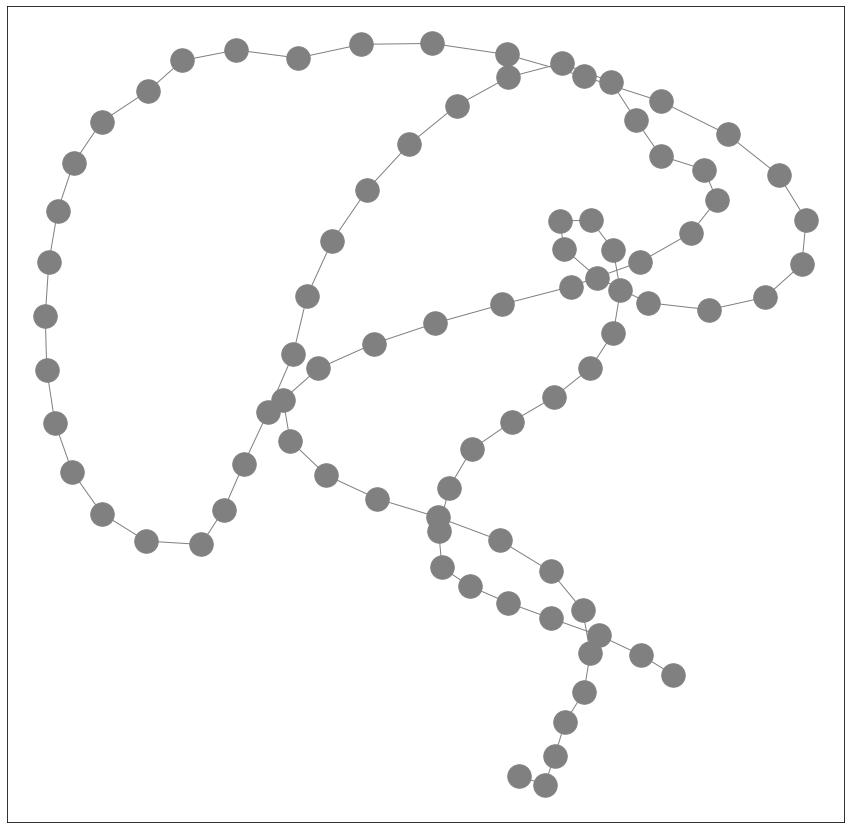

---Normalizing raw data---
----Processing data into windows----
Done---> Total 96 nodes formed
---User#:12 Activity#:1-----
Total nodes present in the graph are-->96
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

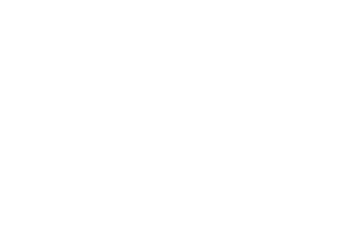

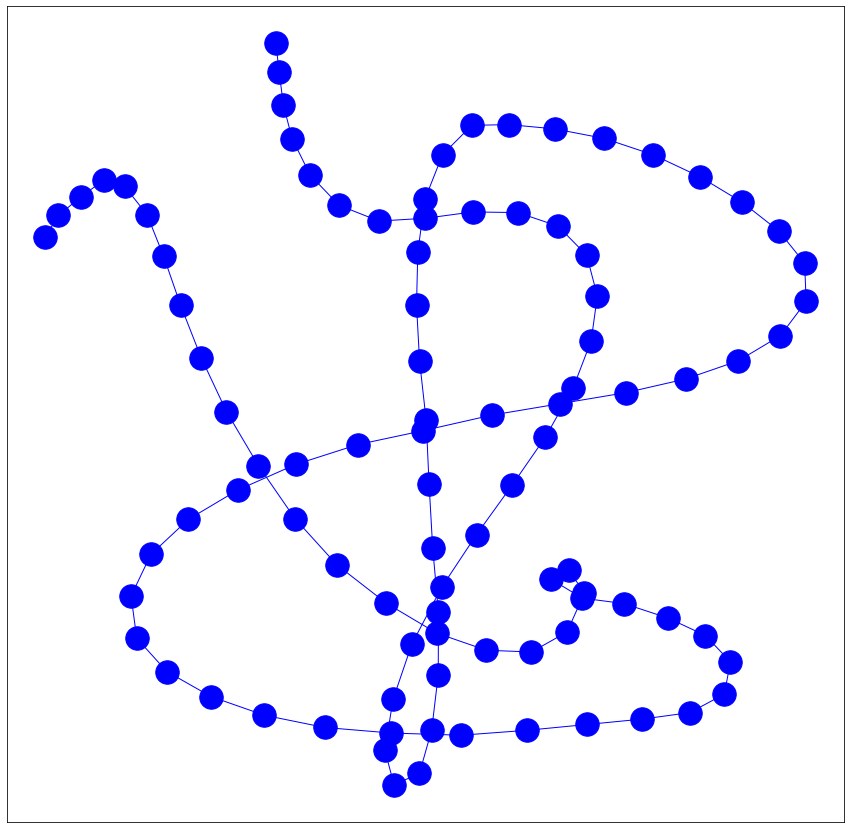

---Normalizing raw data---
----Processing data into windows----
Done---> Total 17 nodes formed
---User#:12 Activity#:2-----
Total nodes present in the graph are-->17
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['107-green:0', '107-green:1', '107-green:2', '107-green:3', '107-green:4', '107-green:5', '107-green:6', '107-green:7', '107-green:8', '107-green:9', '107-green:10', '107-green:11', '107-green:12', '107-green:13', '107-green:14', '107-green:15', '107-green:16']
Edges of the graphs are:  [('107-green:0', '107-green:1'), ('107-green:1', '107-green:2'), ('107-green:2', '107-green:3'

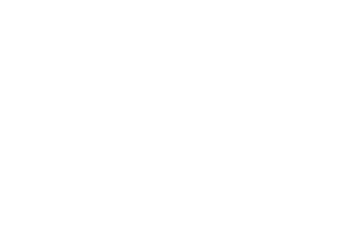

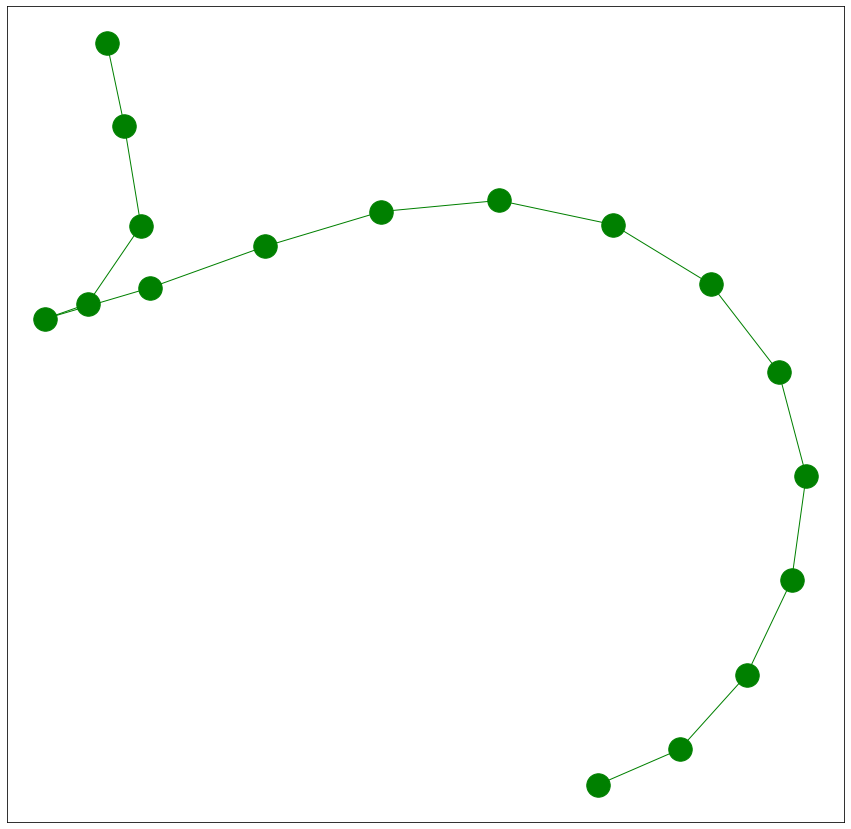

---Normalizing raw data---
----Processing data into windows----
Done---> Total 20 nodes formed
---User#:12 Activity#:4-----
Total nodes present in the graph are-->20
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['108-pink:0', '108-pink:1', '108-pink:2', '108-pink:3', '108-pink:4', '108-pink:5', '108-pink:6', '108-pink:7', '108-pink:8', '108-pink:9', '108-pink:10', '108-pink:11', '108-pink:12', '108-pink:13', '108-pink:14', '108-pink:15', '108-pink:16', '108-pink:17', '108-pink:18', '108-pink:19']
Edges of the grap

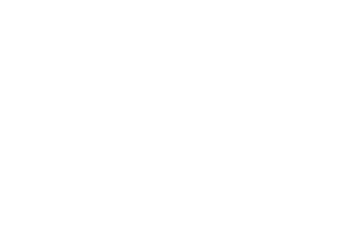

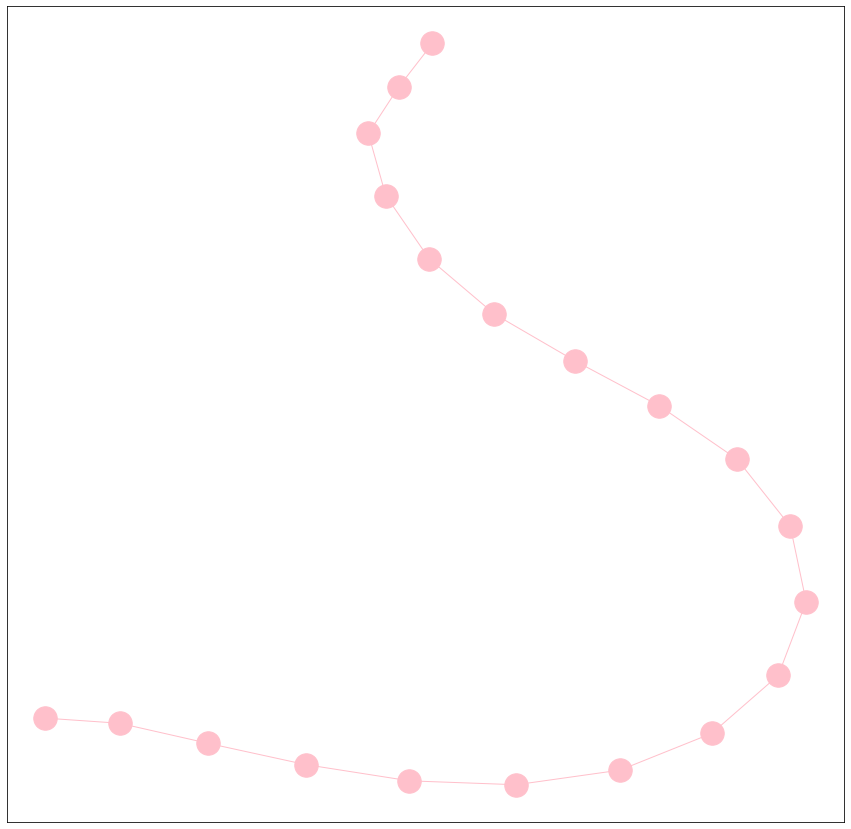

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:12 Activity#:0-----
Total nodes present in the graph are-->22
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['109-red:0', '109-red:1', '109-red:2', '109-red:3', '109-red:4', '109-red:5', '109-red:6', '109-red:7', '109-red:8', '109-red:9', '109-red:10', '109-red:11', '109-red:12', '109-red:13', '109-red:14', '109-red:15', '109-red:16', '109-red:17', '109-red:18', '

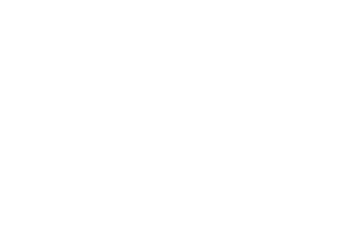

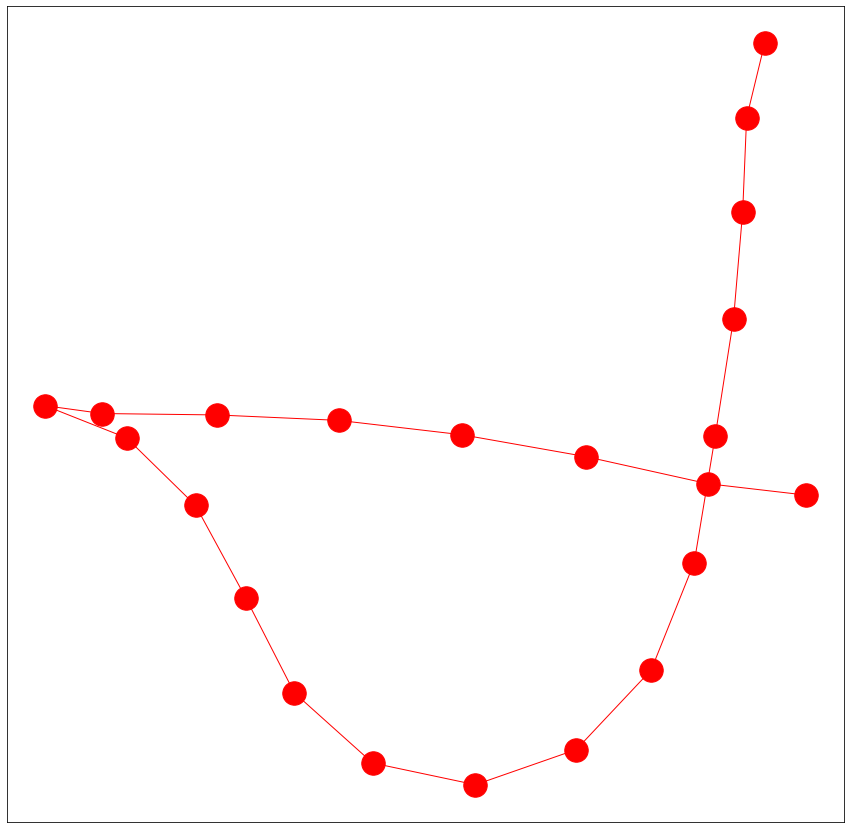

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:12 Activity#:3-----
Total nodes present in the graph are-->13
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['110-yellow:0', '110-yellow:1', '110-yellow:2', '110-yellow:3', '110-yellow:4', '110-yellow:5', '110-yellow:6', '110-yellow:7', '110-yellow:8', '110-yellow:9', '110-yellow:10', '110-yellow:11', '110-yellow:12']
Edges of the graphs are:  [('110-yellow:0', '110-yellow:1'), ('110-yellow:1', '110-yellow:2'), ('110-yellow:2', '110-yellow:3'), ('110-yellow:3', '110-yellow:4'), ('110-yellow:4', '110-yellow:5'), ('110-yellow:5', '110-yellow:6'), ('110-yellow:6', '110-yellow:7'), ('110-

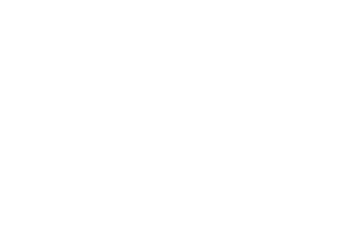

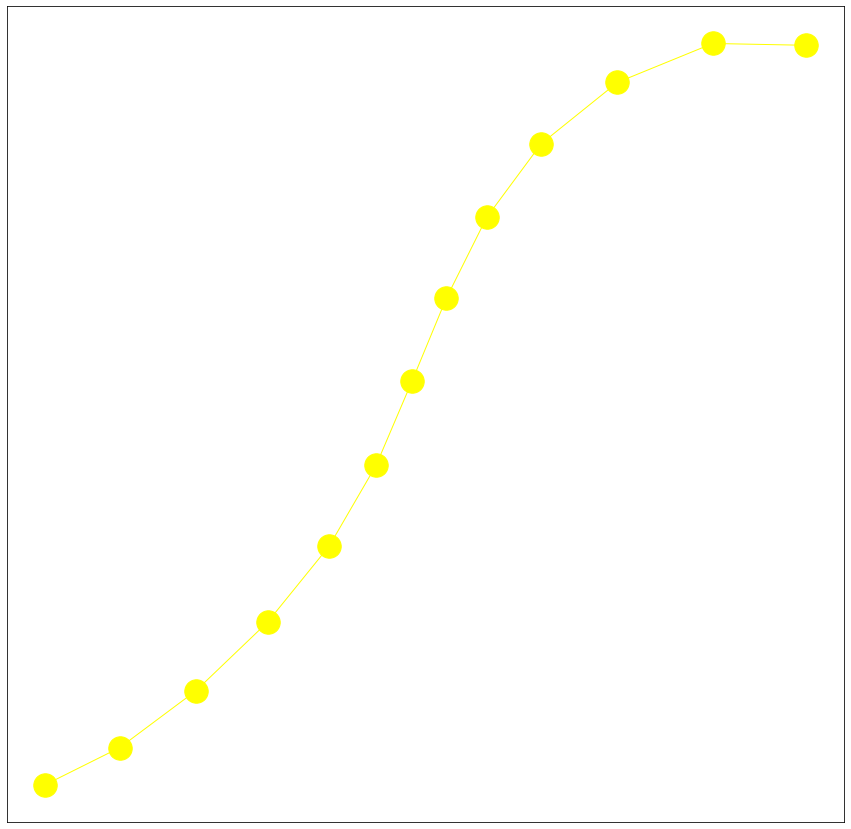

---Normalizing raw data---
----Processing data into windows----
Done---> Total 51 nodes formed
---User#:23 Activity#:5-----
Total nodes present in the graph are-->51
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

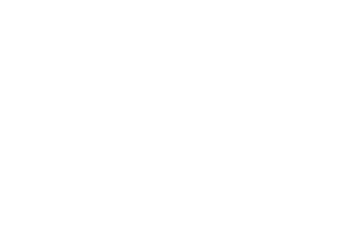

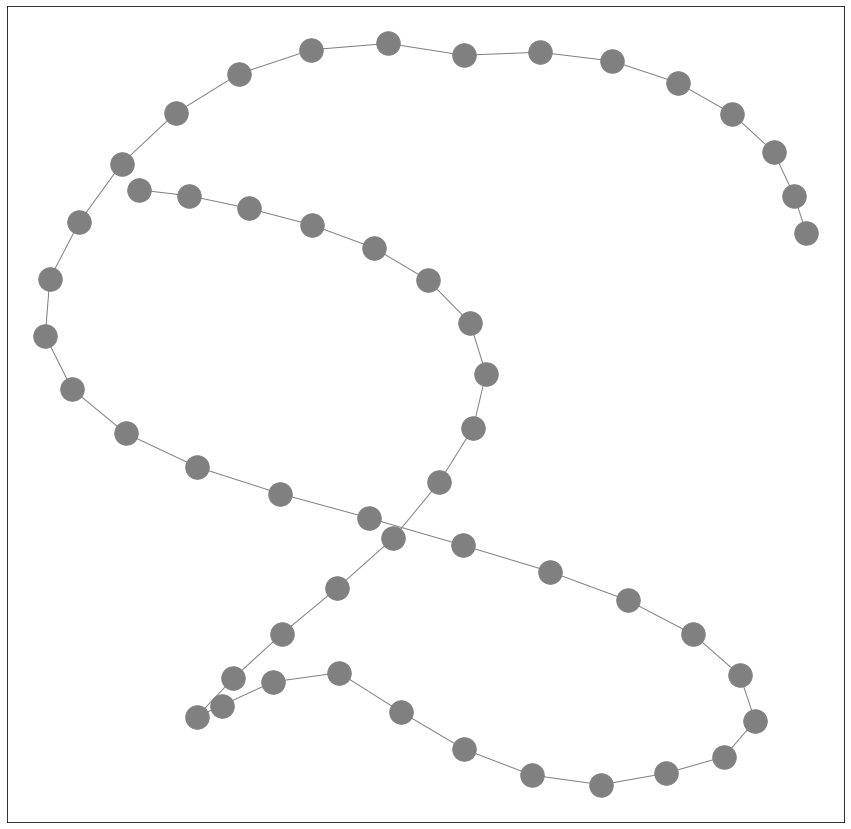

---Normalizing raw data---
----Processing data into windows----
Done---> Total 96 nodes formed
---User#:23 Activity#:1-----
Total nodes present in the graph are-->96
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

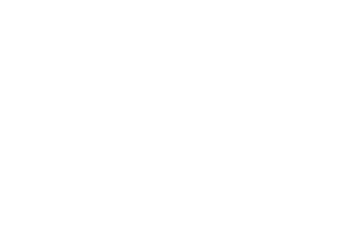

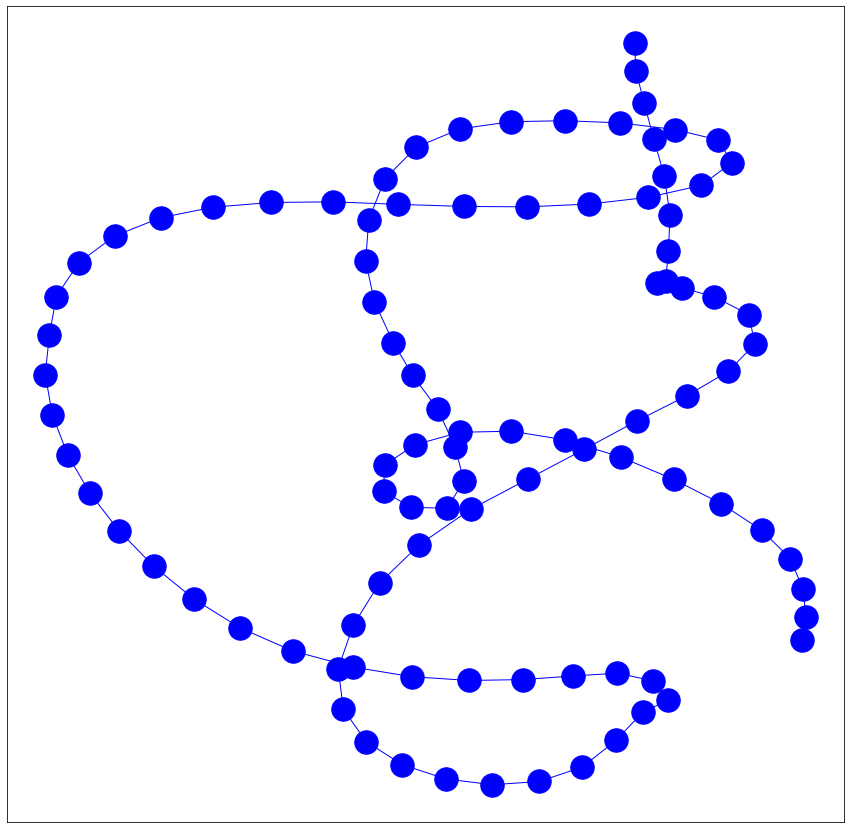

---Normalizing raw data---
----Processing data into windows----
Done---> Total 37 nodes formed
---User#:23 Activity#:4-----
Total nodes present in the graph are-->37
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

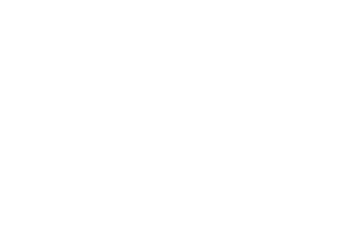

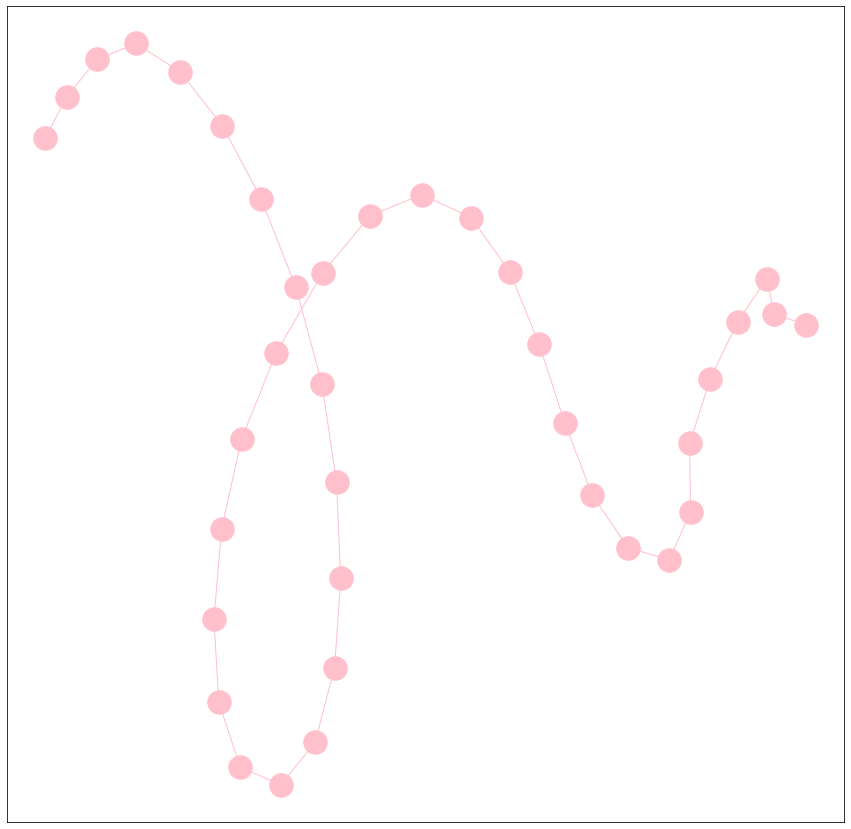

---Normalizing raw data---
----Processing data into windows----
Done---> Total 15 nodes formed
---User#:23 Activity#:0-----
Total nodes present in the graph are-->15
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['114-red:0', '114-red:1', '114-red:2', '114-red:3', '114-red:4', '114-red:5', '114-red:6', '114-red:7', '114-red:8', '114-red:9', '114-red:10', '114-red:11', '114-red:12', '114-red:13', '114-red:14']
Edges of the graphs are:  [('114-red:0', '114-red:1'), ('114-red:1', '114-red:2'), ('114-red:2', '114-red:3'), ('114-red:3', '114-red:4'), ('114-red:4', '114-red:5'), ('114-red:5', '114-red:6'), ('114-red:6', '114-red:7'), ('114-red

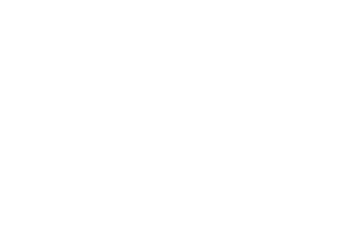

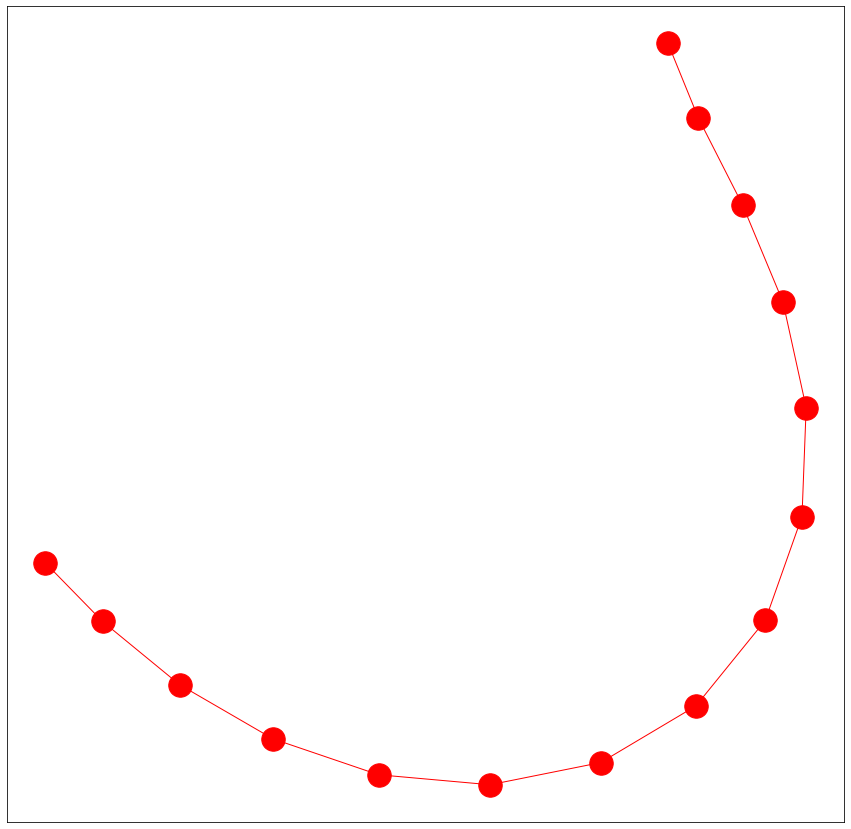

---Normalizing raw data---
----Processing data into windows----
Done---> Total 47 nodes formed
---User#:4 Activity#:5-----
Total nodes present in the graph are-->47
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Lab

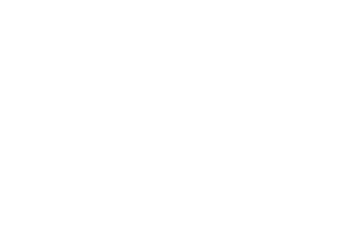

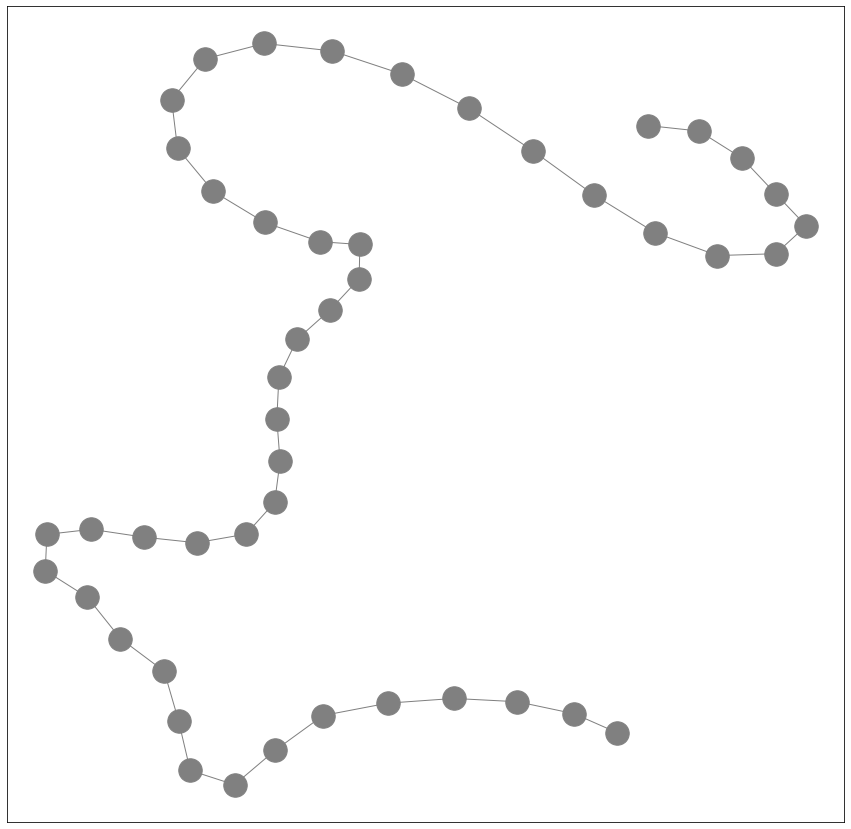

---Normalizing raw data---
----Processing data into windows----
Done---> Total 6 nodes formed
---User#:4 Activity#:1-----
Total nodes present in the graph are-->6
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Nodes of the graphs are:  ['116-blue:0', '116-blue:1', '116-blue:2', '116-blue:3', '116-blue:4', '116-blue:5']
Edges of the graphs are:  [('116-blue:0', '116-blue:1'), ('116-blue:1', '116-blue:2'), ('116-blue:2', '116-blue:3'), ('116-blue:3', '116-blue:4'), ('116-blue:4', '116-blue:5')]
[]
[('116-blue:0', '116-blue:1'), ('116-blue:1', '116-blue:2'), ('116-blue:2', '116-blue:3'), ('116-blue:3', '116-blue:4'), ('116-blue:4', '116-blue:5')]
[]
[]
[]
[]


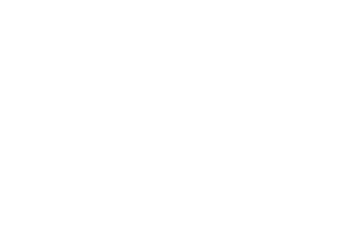

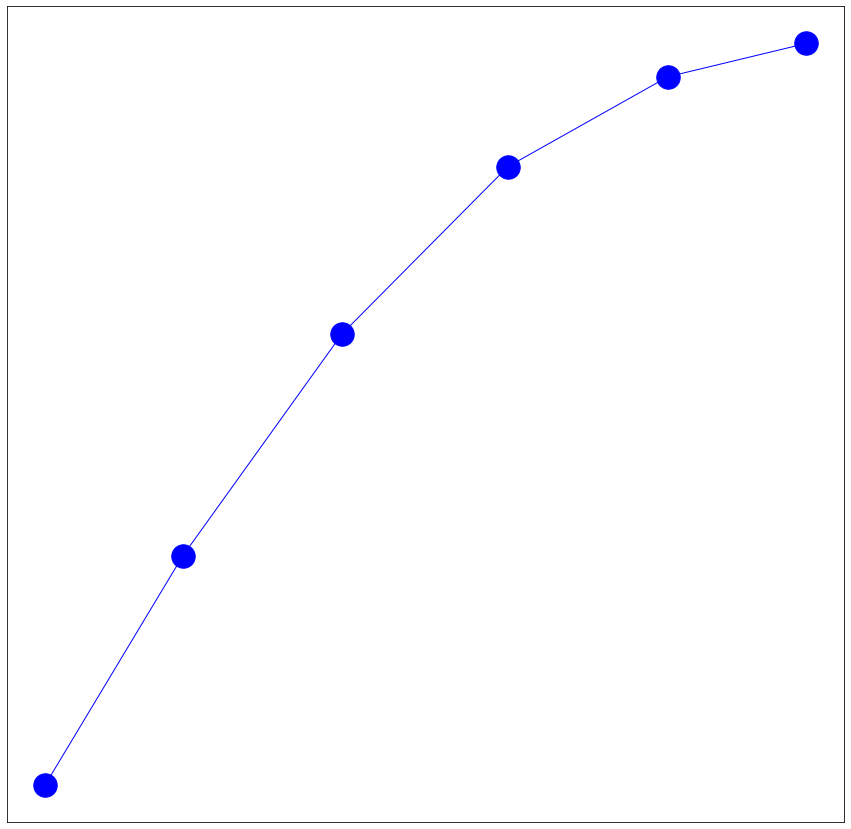

---Normalizing raw data---
----Processing data into windows----
Done---> Total 13 nodes formed
---User#:4 Activity#:0-----
Total nodes present in the graph are-->13
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['117-red:0', '117-red:1', '117-red:2', '117-red:3', '117-red:4', '117-red:5', '117-red:6', '117-red:7', '117-red:8', '117-red:9', '117-red:10', '117-red:11', '117-red:12']
Edges of the graphs are:  [('117-red:0', '117-red:1'), ('117-red:1', '117-red:2'), ('117-red:2', '117-red:3'), ('117-red:3', '117-red:4'), ('117-red:4', '117-red:5'), ('117-red:5', '117-red:6'), ('117-red:6', '117-red:7'), ('117-red:7', '117-red:8'), ('117-red:8', '117-red:9'), ('117-red:9', '117-red:10'), ('1

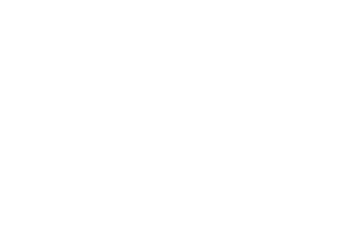

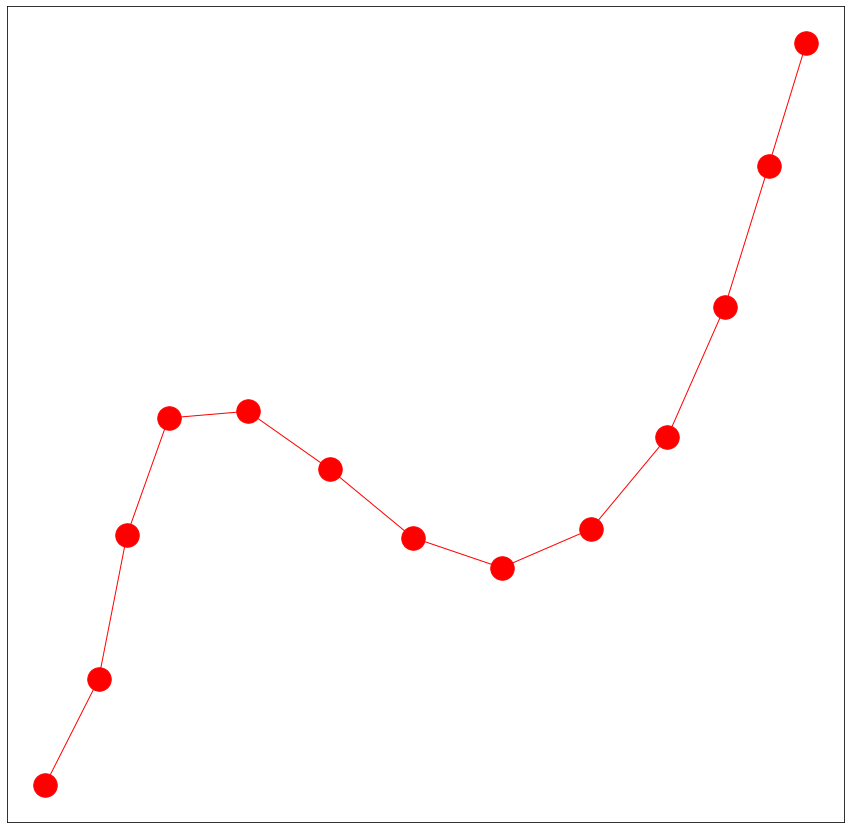

---Normalizing raw data---
----Processing data into windows----
Done---> Total 10 nodes formed
---User#:4 Activity#:4-----
Total nodes present in the graph are-->10
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['118-pink:0', '118-pink:1', '118-pink:2', '118-pink:3', '118-pink:4', '118-pink:5', '118-pink:6', '118-pink:7', '118-pink:8', '118-pink:9']
Edges of the graphs are:  [('118-pink:0', '118-pink:1'), ('118-pink:1', '118-pink:2'), ('118-pink:2', '118-pink:3'), ('118-pink:3', '118-pink:4'), ('118-pink:4', '118-pink:5'), ('118-pink:5', '118-pink:6'), ('118-pink:6', '118-pink:7'), ('118-pink:7', '118-pink:8'), ('118-pink:8', '118-pink:9')]
[]
[]
[]
[]
[('118-pink:0', '118-pink:1'), ('118-pink:1', '118-pink:2'), ('118-pink:2', '118-pink:3'), ('118-pink:3', '11

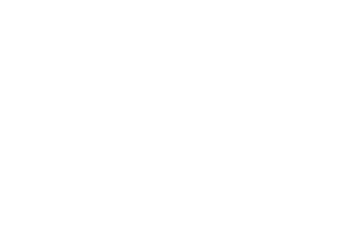

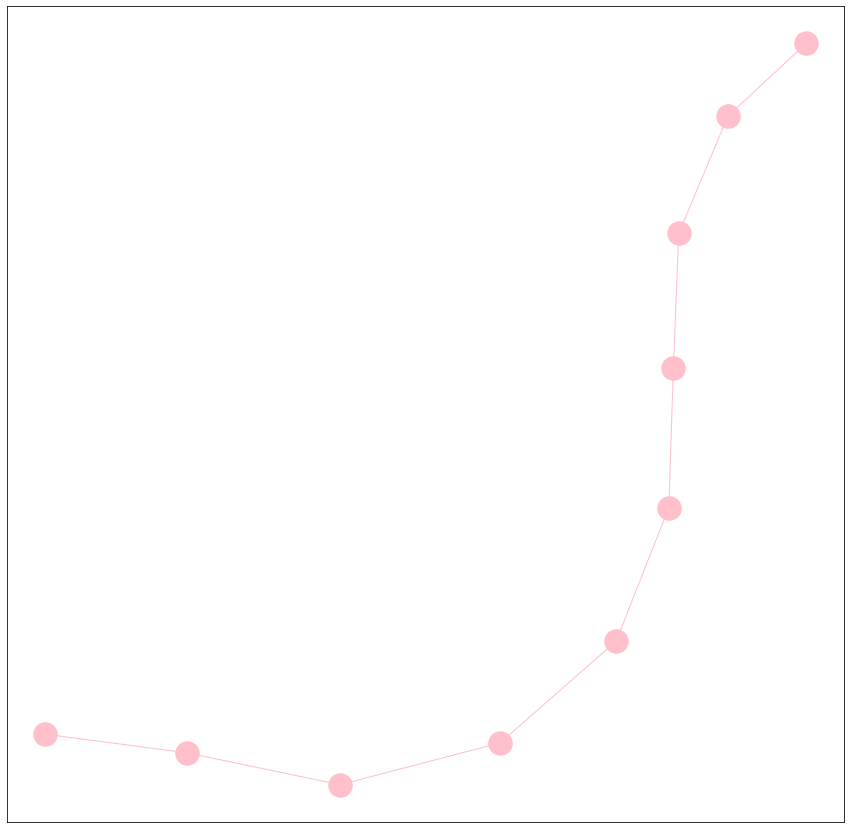

---Normalizing raw data---
----Processing data into windows----
Done---> Total 9 nodes formed
---User#:4 Activity#:2-----
Total nodes present in the graph are-->9
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['119-green:0', '119-green:1', '119-green:2', '119-green:3', '119-green:4', '119-green:5', '119-green:6', '119-green:7', '119-green:8']
Edges of the graphs are:  [('119-green:0', '119-green:1'), ('119-green:1', '119-green:2'), ('119-green:2', '119-green:3'), ('119-green:3', '119-green:4'), ('119-green:4', '119-green:5'), ('119-green:5', '119-green:6'), ('119-green:6', '119-green:7'), ('119-green:7', '119-green:8')]
[]
[]
[('119-green:0', '119-green:1'), ('119-green:1', '119-green:2'), ('119-green:2', '119-green:3'), ('119-green:3', '119-green:4'), ('119-green:4', '119-green:5'), 

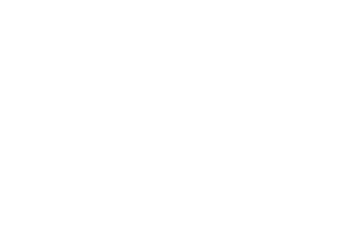

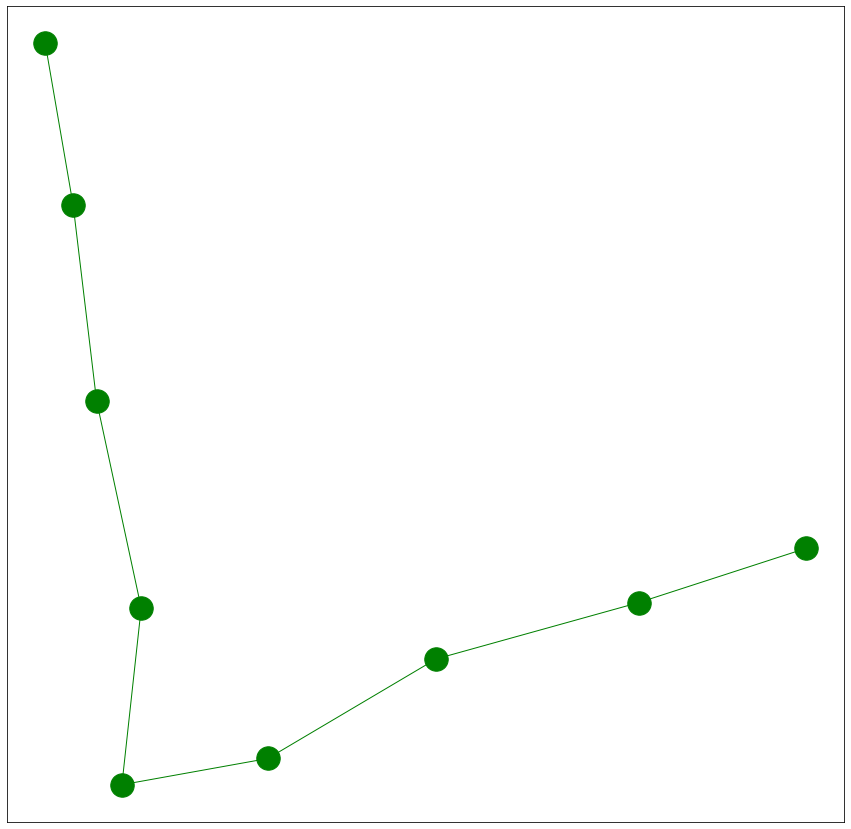

---Normalizing raw data---
----Processing data into windows----
Done---> Total 98 nodes formed
---User#:30 Activity#:5-----
Total nodes present in the graph are-->98
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

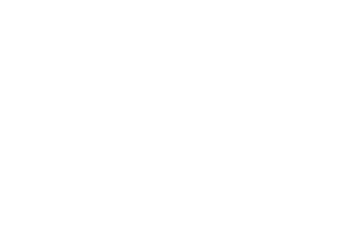

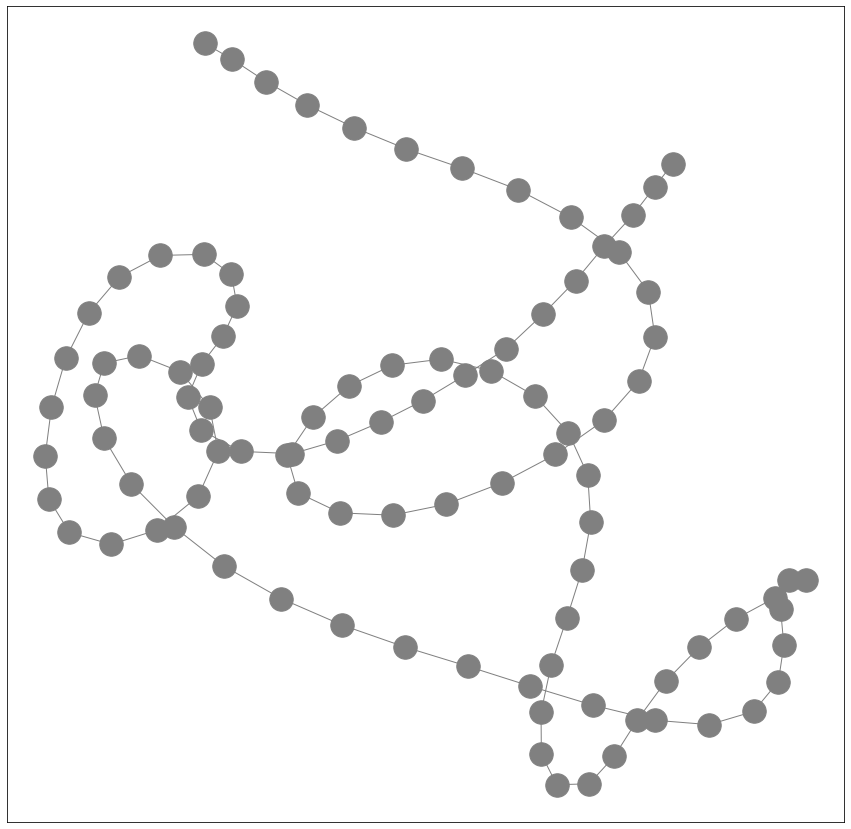

---Normalizing raw data---
----Processing data into windows----
Done---> Total 33 nodes formed
---User#:30 Activity#:4-----
Total nodes present in the graph are-->33
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of 

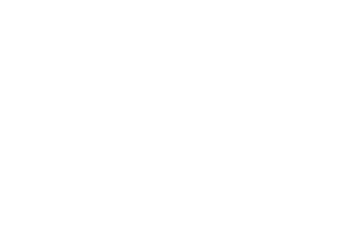

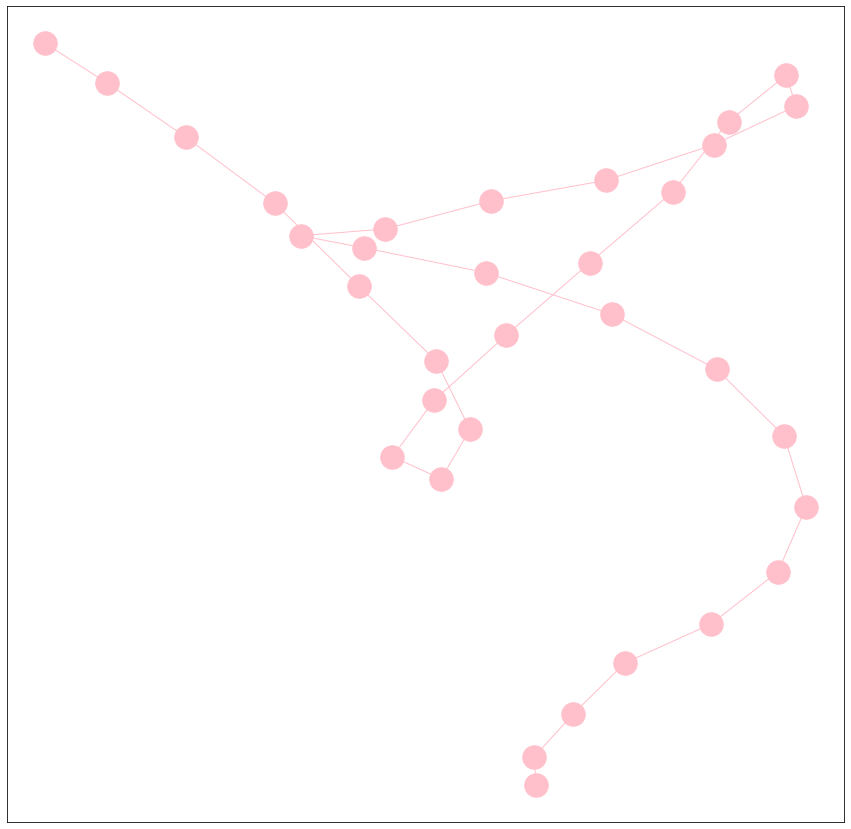

---Normalizing raw data---
----Processing data into windows----
Done---> Total 30 nodes formed
---User#:30 Activity#:0-----
Total nodes present in the graph are-->30
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['122-red:0', '122-red:1', '122-red:2', '122-red:3', '122-

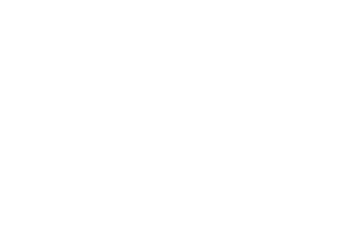

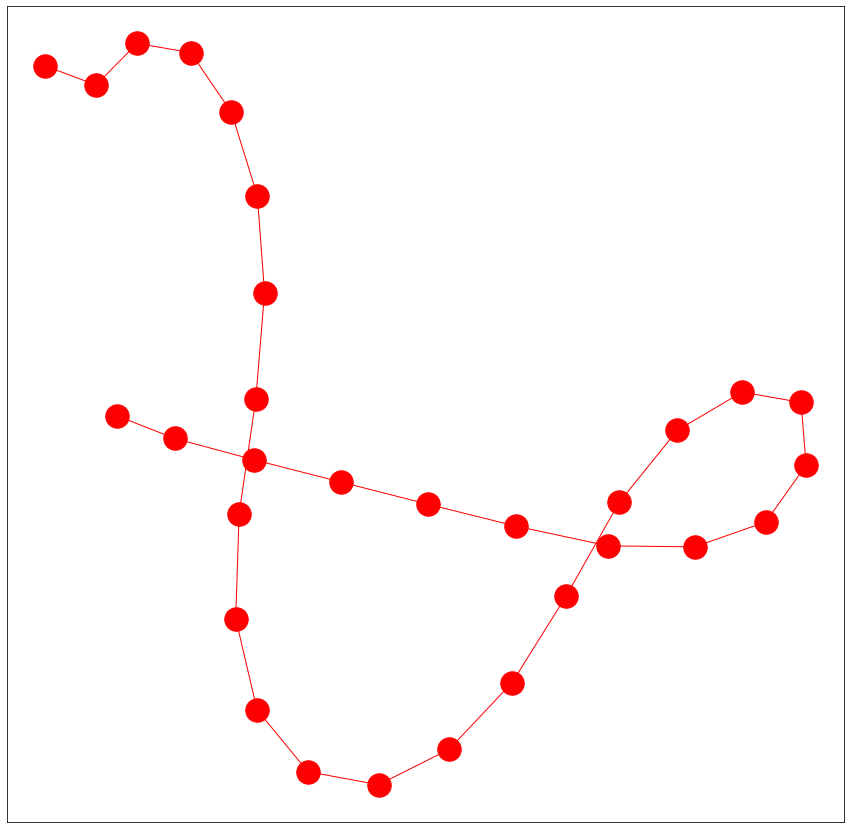

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:30 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['123-green:0', '123-green:1', '123-green:2', '123-green:3', '123-green:4', '123-green:5', '123-green:6', '123-green:7', '123-green:8', '123-green:9', '123-green:10', '123-green:11']
Edges of the graphs are:  [('123-green:0', '123-green:1'), ('123-green:1', '123-green:2'), ('123-green:2', '123-green:3'), ('123-green:3', '123-green:4'), ('123-green:4', '123-green:5'), ('123-green:5', '123-green:6'), ('123-green:6', '123-green:7'), ('123-green:7', '123-green:8'), ('123-green:8', '123-green:9'), ('123-gree

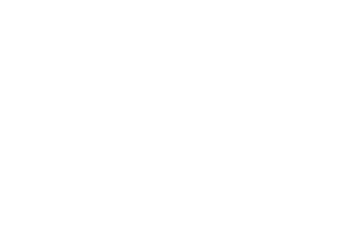

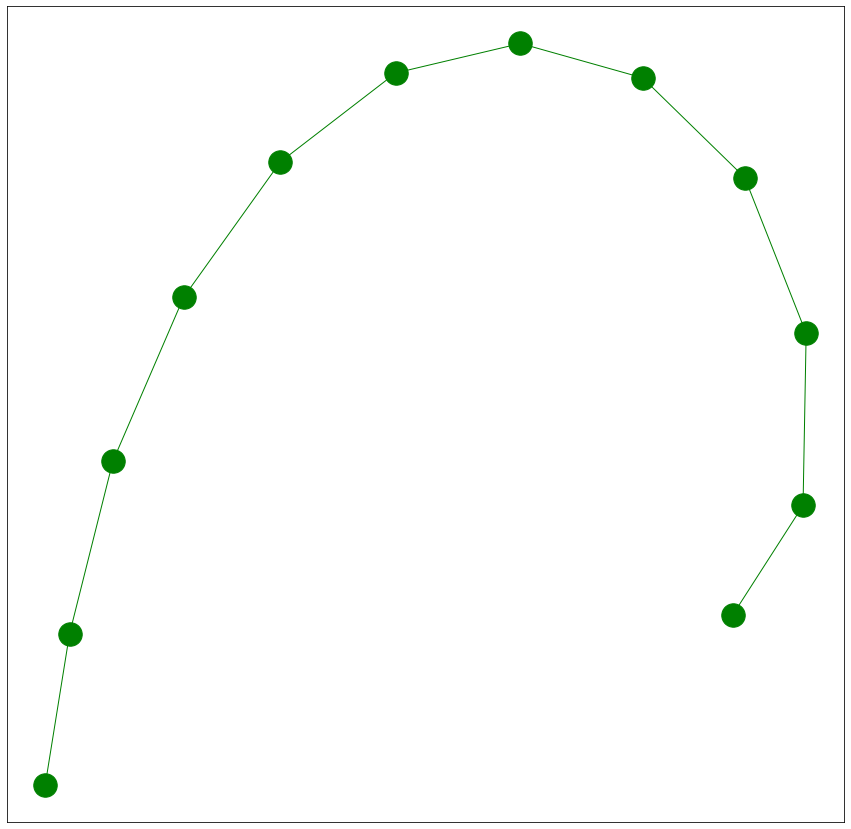

---Normalizing raw data---
----Processing data into windows----
Done---> Total 24 nodes formed
---User#:30 Activity#:3-----
Total nodes present in the graph are-->24
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['124-yellow:0', '124-yellow:1', '124-yellow:2', '124-yellow:3', '124-yellow:4', '124-yellow:5', '124-yellow:6', '124-yellow:7', '124-yellow:8', '124-yellow:9', '124-yellow:10', '124-yellow:11', '124-yellow:1

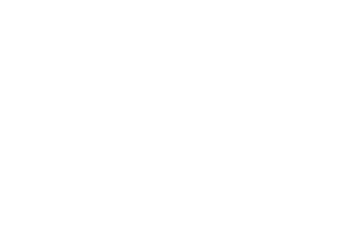

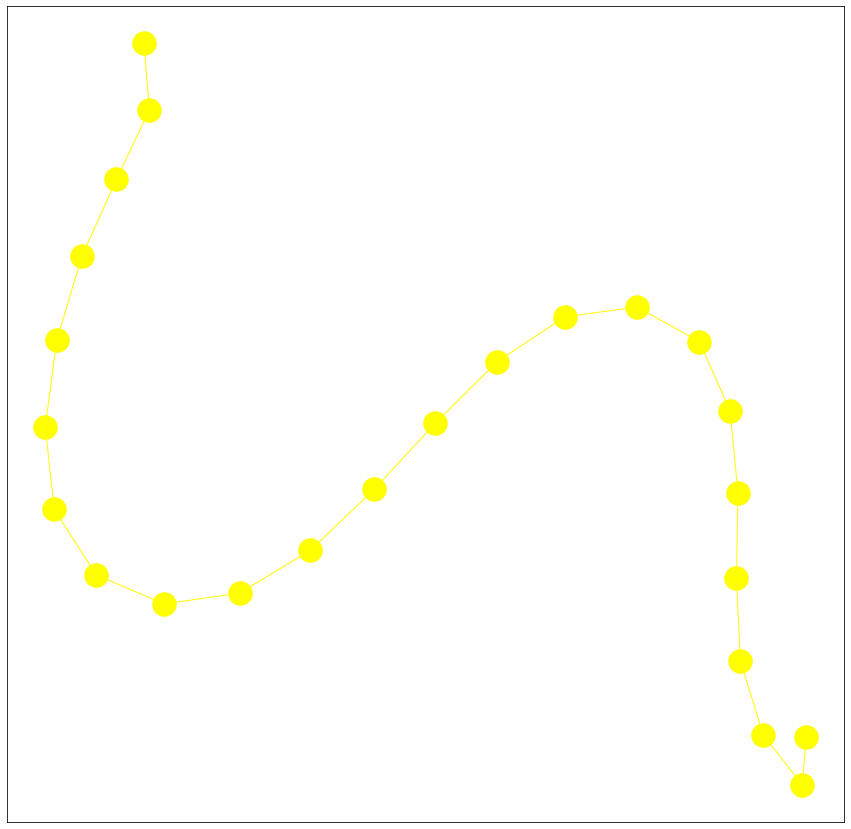

---Normalizing raw data---
----Processing data into windows----
Done---> Total 104 nodes formed
---User#:34 Activity#:5-----
Total nodes present in the graph are-->104
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


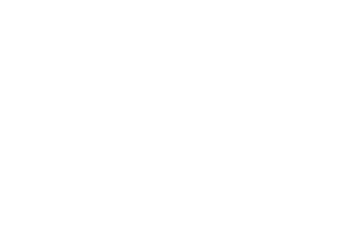

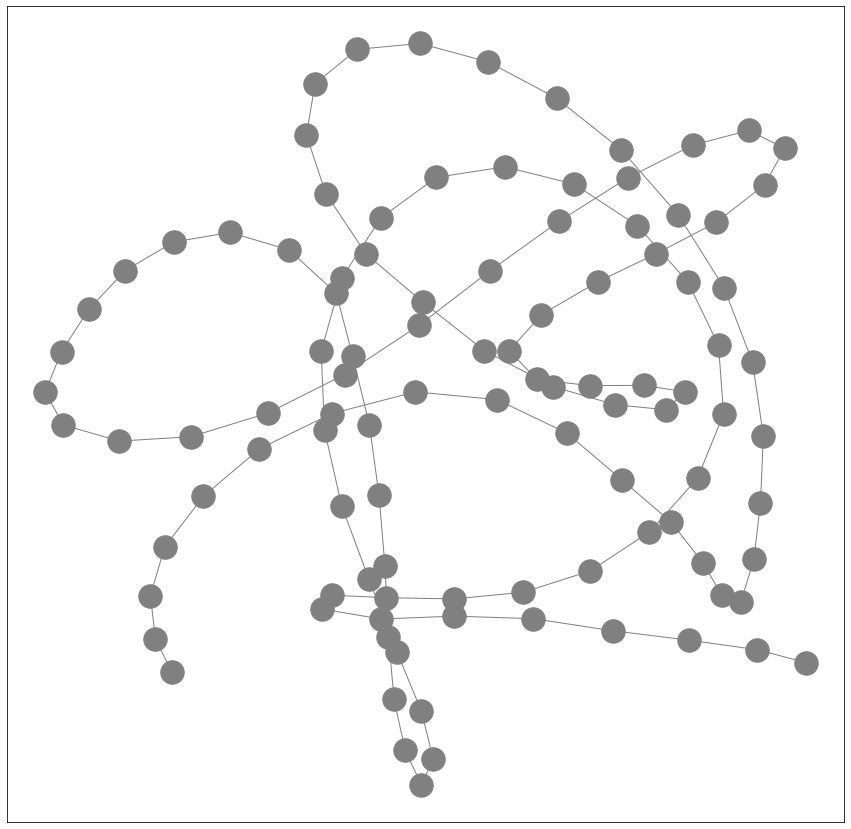

---Normalizing raw data---
----Processing data into windows----
Done---> Total 100 nodes formed
---User#:34 Activity#:1-----
Total nodes present in the graph are-->100
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:


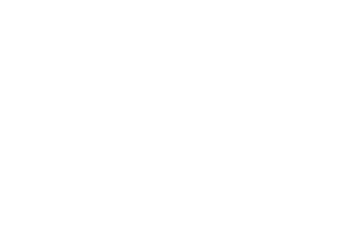

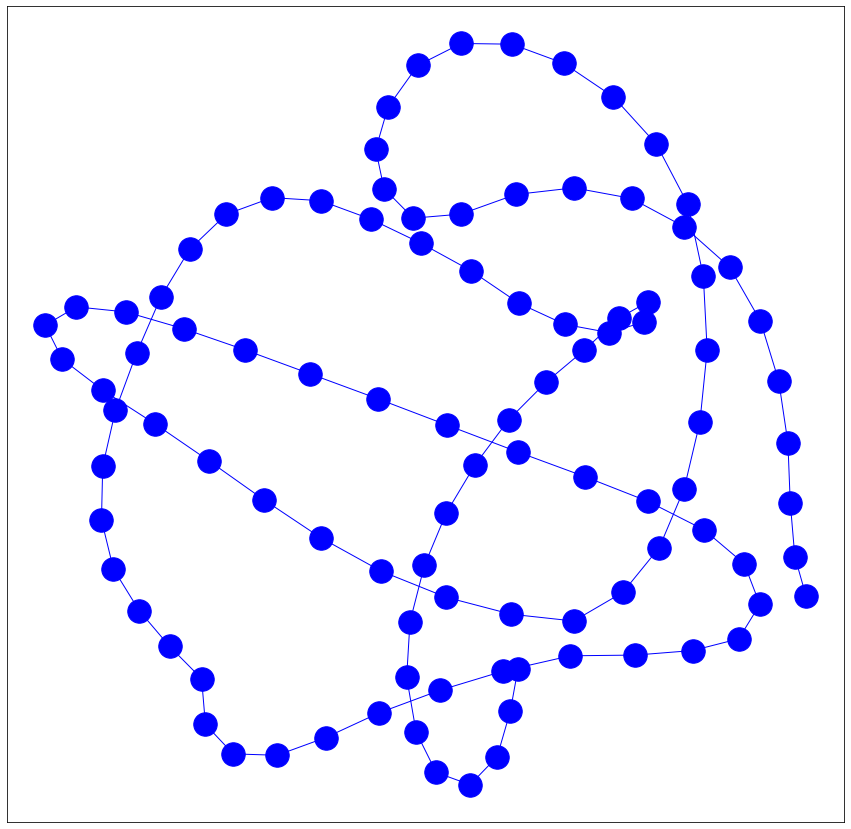

---Normalizing raw data---
----Processing data into windows----
Done---> Total 10 nodes formed
---User#:34 Activity#:3-----
Total nodes present in the graph are-->10
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['127-yellow:0', '127-yellow:1', '127-yellow:2', '127-yellow:3', '127-yellow:4', '127-yellow:5', '127-yellow:6', '127-yellow:7', '127-yellow:8', '127-yellow:9']
Edges of the graphs are:  [('127-yellow:0', '127-yellow:1'), ('127-yellow:1', '127-yellow:2'), ('127-yellow:2', '127-yellow:3'), ('127-yellow:3', '127-yellow:4'), ('127-yellow:4', '127-yellow:5'), ('127-yellow:5', '127-yellow:6'), ('127-yellow:6', '127-yellow:7'), ('127-yellow:7', '127-yellow:8'), ('127-yellow:8', '127-yellow:9')]
[]
[]
[]
[('127-yellow:0', '127-yellow:1'), ('127-yellow:1', '12

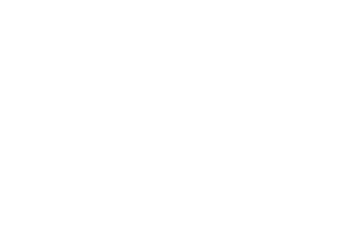

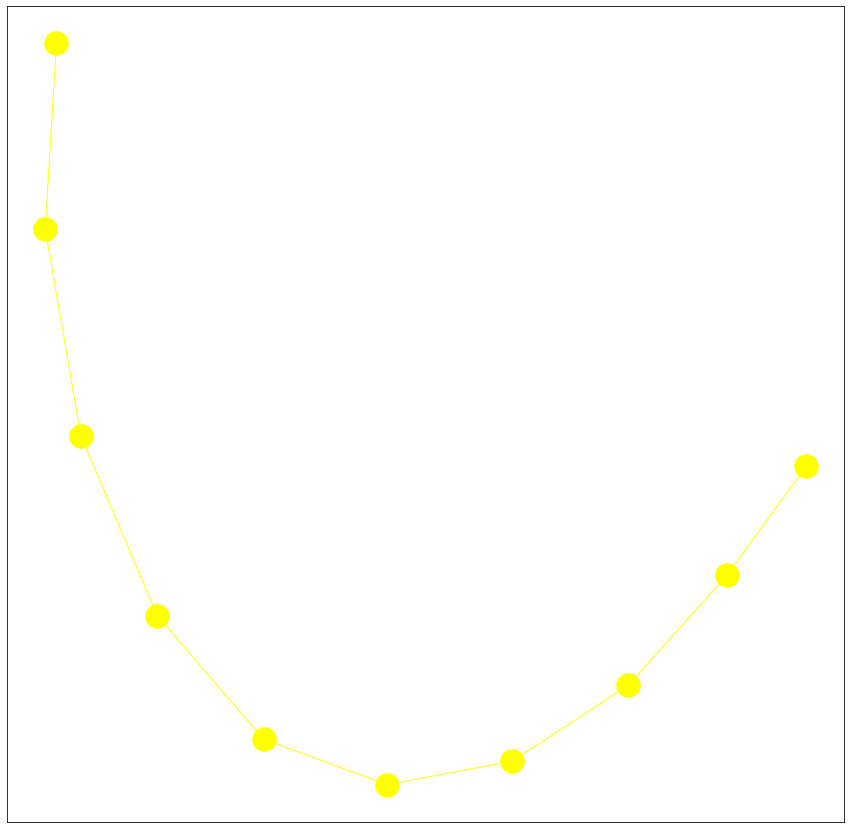

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:34 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['128-green:0', '128-green:1', '128-green:2', '128-green:3', '128-green:4', '128-green:5', '128-green:6', '128-green:7', '128-green:8', '128-green:9', '128-green:10', '128-green:11']
Edges of the graphs are:  [('128-green:0', '128-green:1'), ('128-green:1', '128-green:2'), ('128-green:2', '128-green:3'), ('128-green:3', '128-green:4'), ('128-green:4', '128-green:5'), ('128-green:5', '128-green:6'), ('128-green:6', '128-green:7'), ('128-green:7', '128-green:8'), ('128-green:8', '128-green:9'), ('128-gree

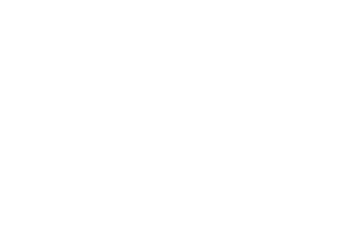

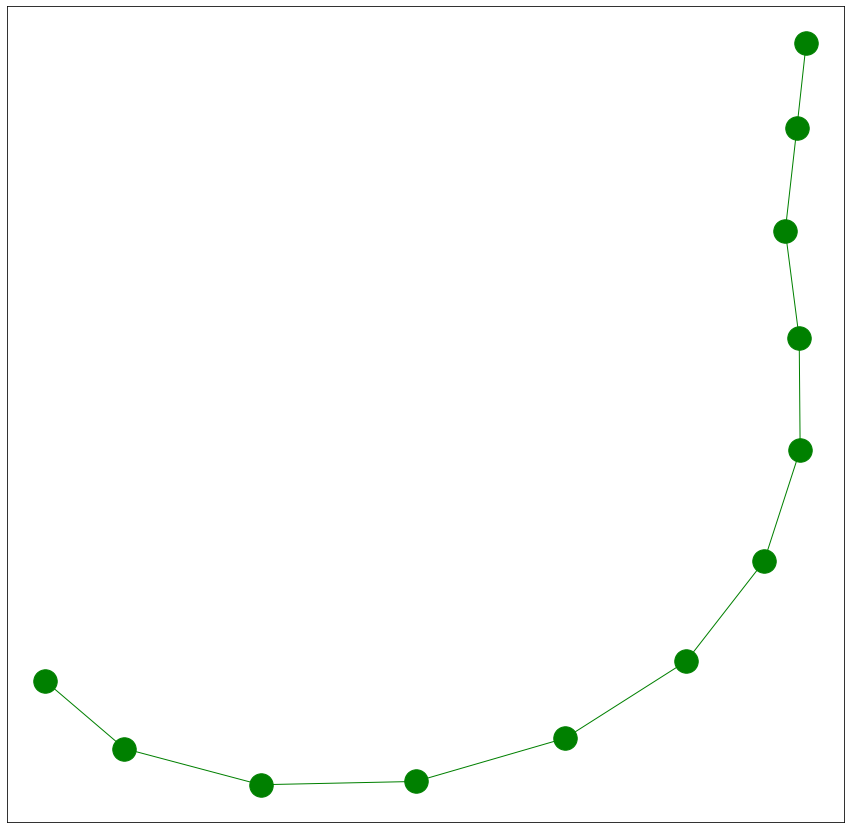

---Normalizing raw data---
----Processing data into windows----
Done---> Total 30 nodes formed
---User#:34 Activity#:4-----
Total nodes present in the graph are-->30
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['129-pink:0', '129-pink:1', '129-pink:2', '129-pink:3', '

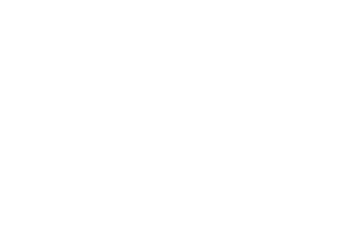

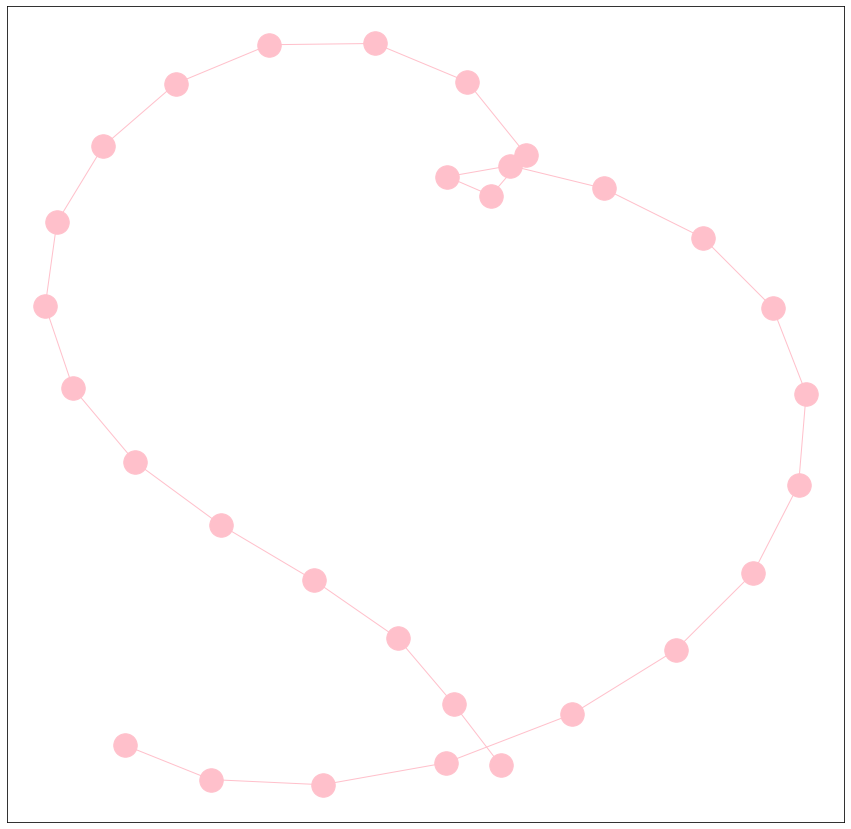

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:34 Activity#:0-----
Total nodes present in the graph are-->22
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['130-red:0', '130-red:1', '130-red:2', '130-red:3', '130-red:4', '130-red:5', '130-red:6', '130-red:7', '130-red:8', '130-red:9', '130-red:10', '130-red:11', '130-red:12', '130-red:13', '130-red:14', '130-red:15', '130-red:16', '130-red:17', '130-red:18', '

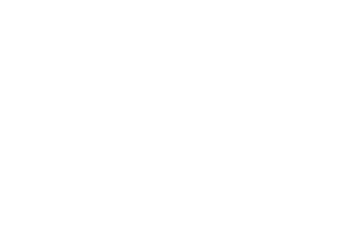

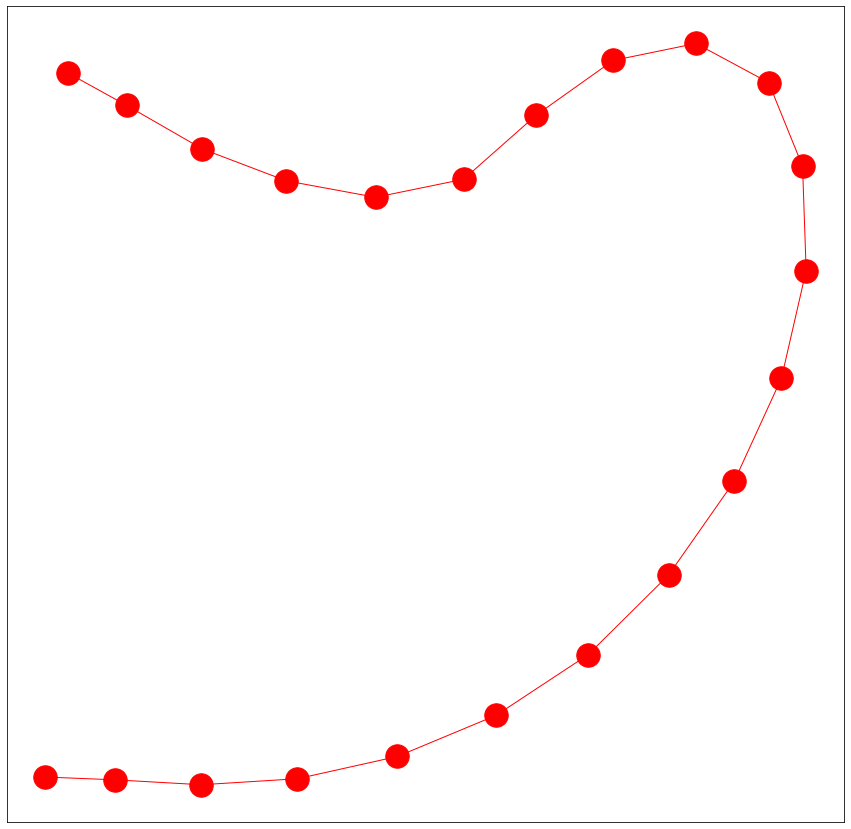

---Normalizing raw data---
----Processing data into windows----
Done---> Total 133 nodes formed
---User#:8 Activity#:5-----
Total nodes present in the graph are-->133
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
L

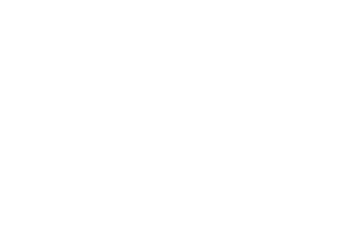

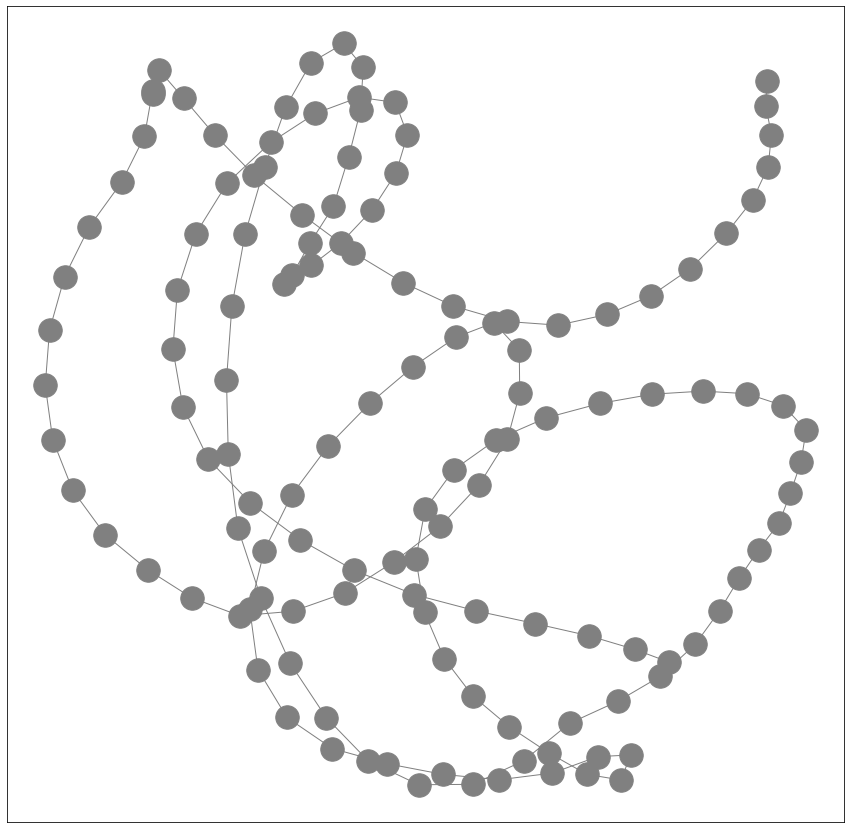

---Normalizing raw data---
----Processing data into windows----
Done---> Total 80 nodes formed
---User#:8 Activity#:1-----
Total nodes present in the graph are-->80
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

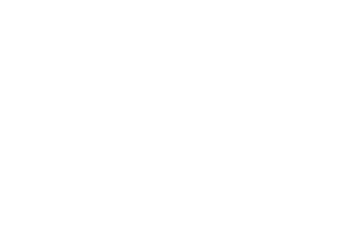

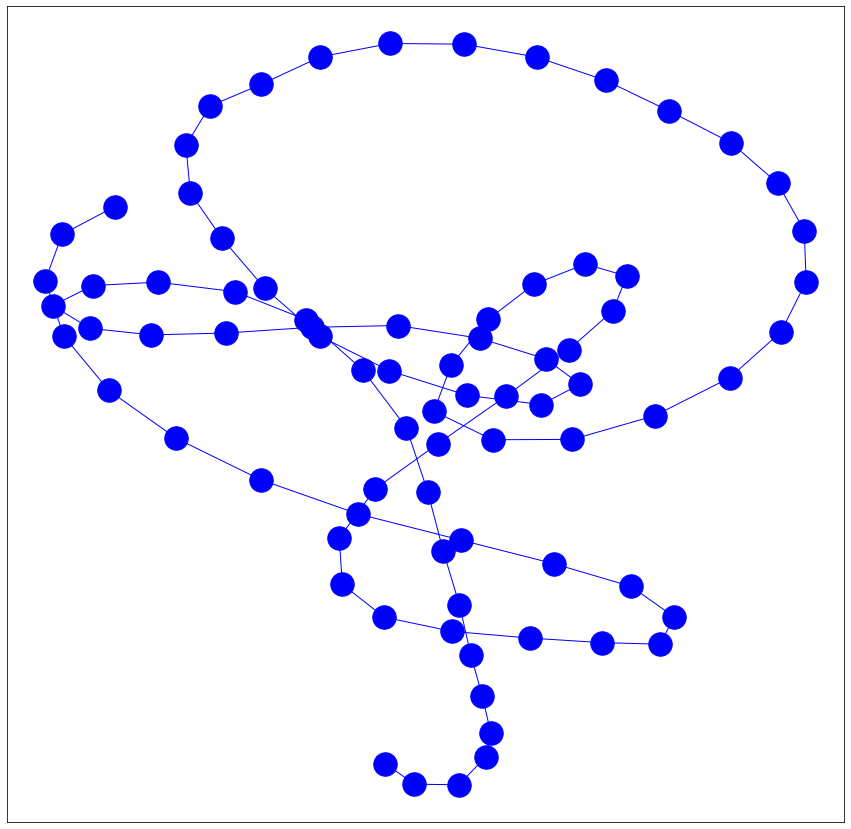

---Normalizing raw data---
----Processing data into windows----
Done---> Total 34 nodes formed
---User#:8 Activity#:4-----
Total nodes present in the graph are-->34
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Lab

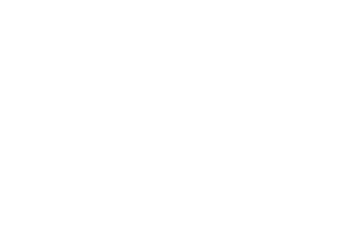

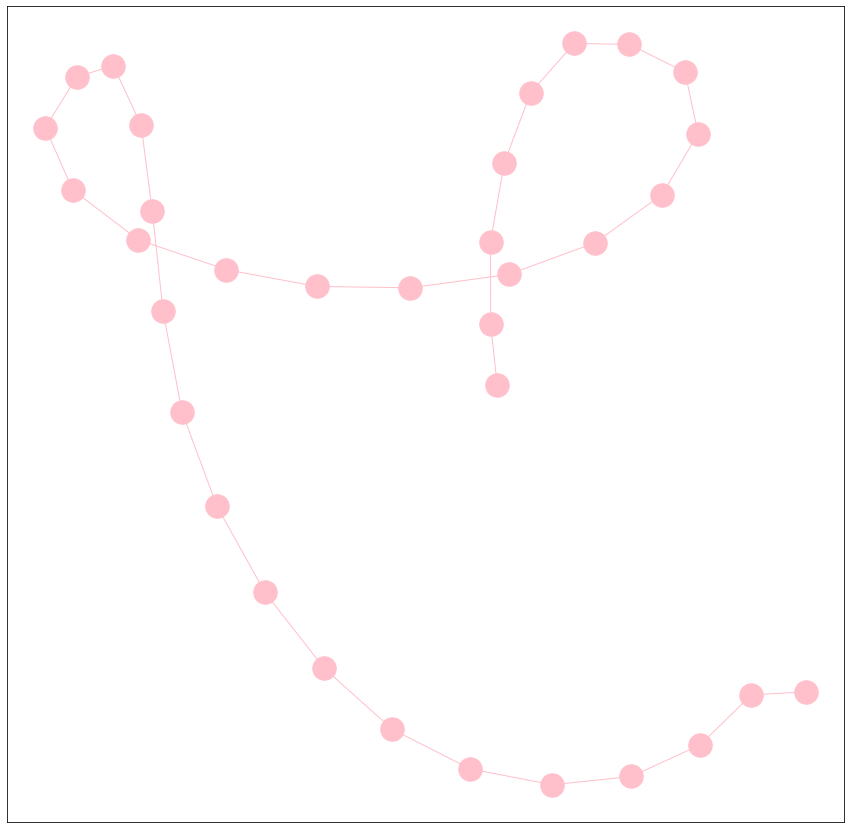

---Normalizing raw data---
----Processing data into windows----
Done---> Total 26 nodes formed
---User#:8 Activity#:0-----
Total nodes present in the graph are-->26
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['134-red:0', '134-red:1', '134-red:2', '134-red:3', '134-red:4', '134-red:5', '134-red:6', '134-red:7', '134-red:8', '134-red:9', '134-red:10', '134-red:11', 

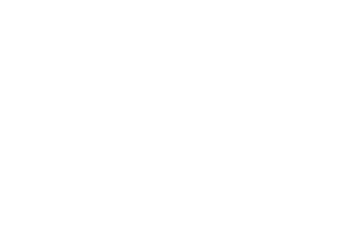

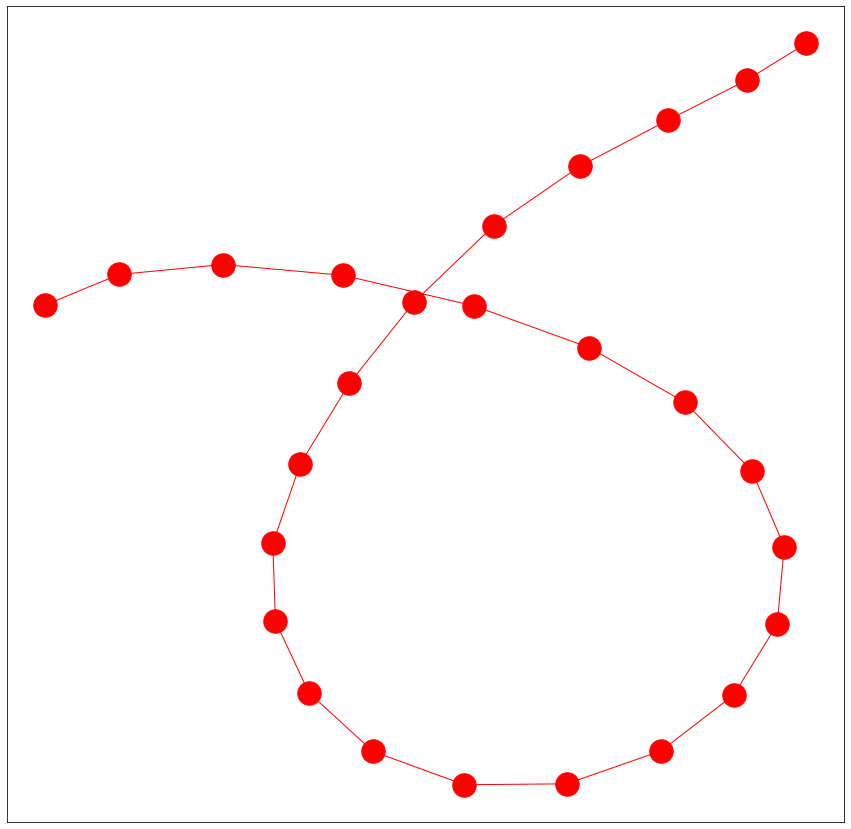

---Normalizing raw data---
----Processing data into windows----
Done---> Total 21 nodes formed
---User#:8 Activity#:2-----
Total nodes present in the graph are-->21
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['135-green:0', '135-green:1', '135-green:2', '135-green:3', '135-green:4', '135-green:5', '135-green:6', '135-green:7', '135-green:8', '135-green:9', '135-green:10', '135-green:11', '135-green:12', '135-green:13', '135-green:14', '135-green:15', '135-green:16', '135-green:17', '135-

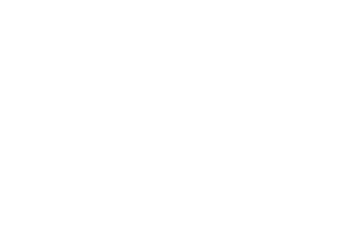

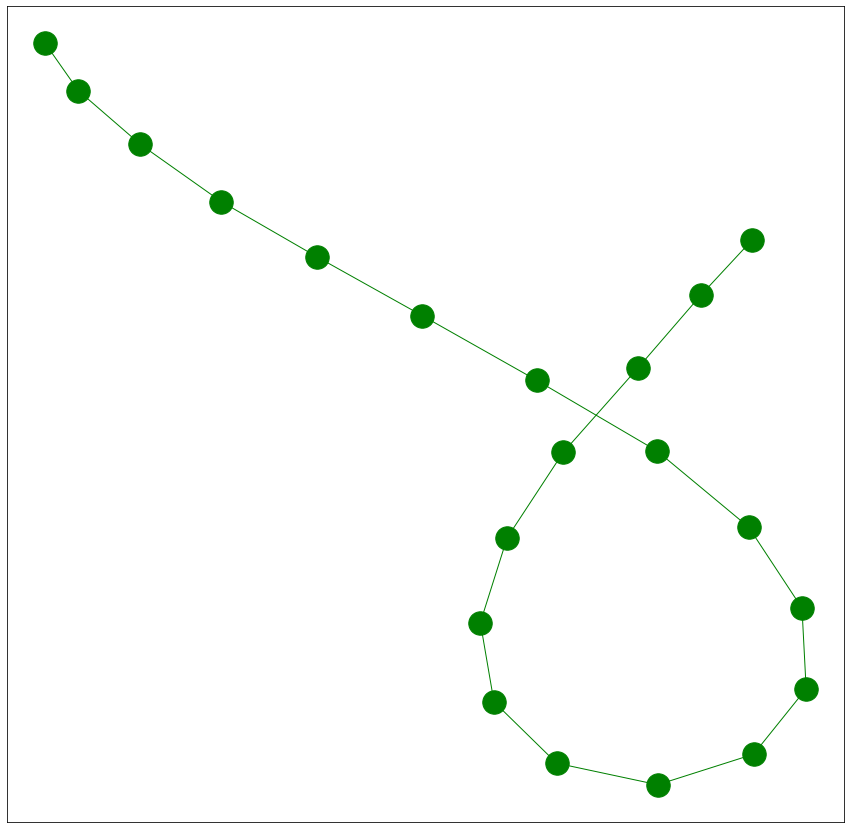

---Normalizing raw data---
----Processing data into windows----
Done---> Total 25 nodes formed
---User#:8 Activity#:3-----
Total nodes present in the graph are-->25
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['136-yellow:0', '136-yellow:1', '136-yellow:2', '136-yellow:3', '136-yellow:4', '136-yellow:5', '136-yellow:6', '136-yellow:7', '136-yellow:8', '136-yellow:9', '136-yellow:10', '136-y

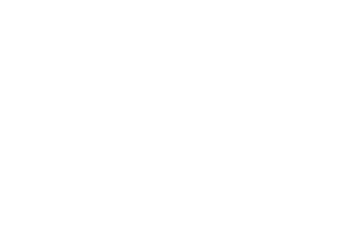

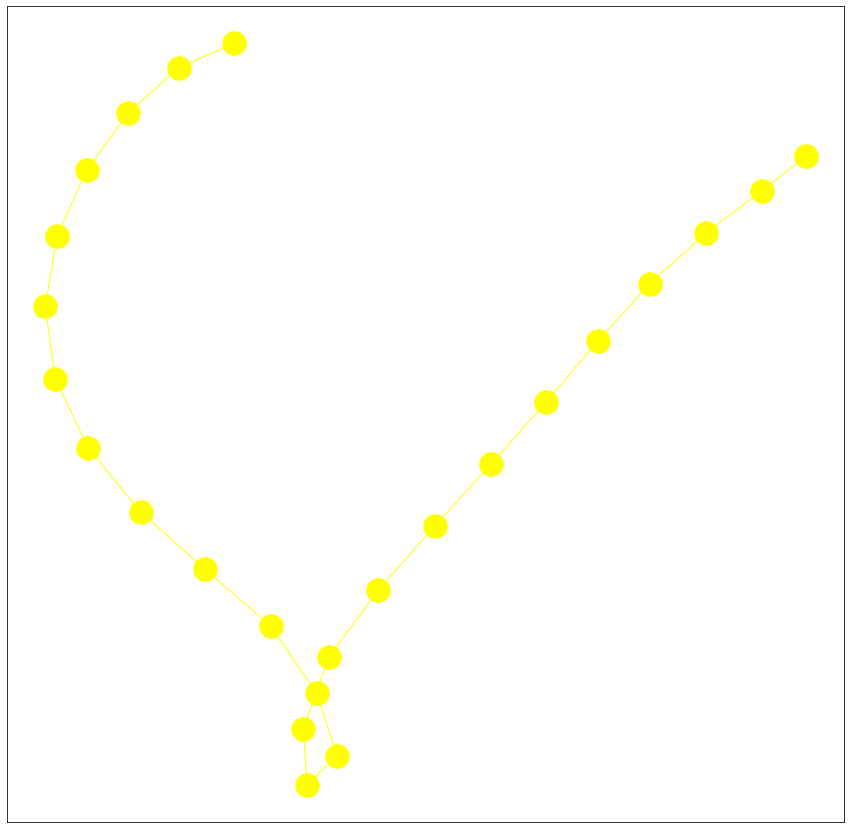

---Normalizing raw data---
----Processing data into windows----
Done---> Total 131 nodes formed
---User#:31 Activity#:5-----
Total nodes present in the graph are-->131
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


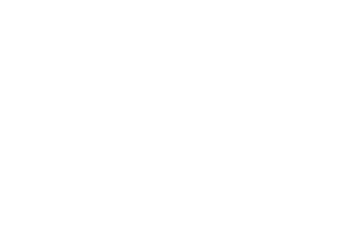

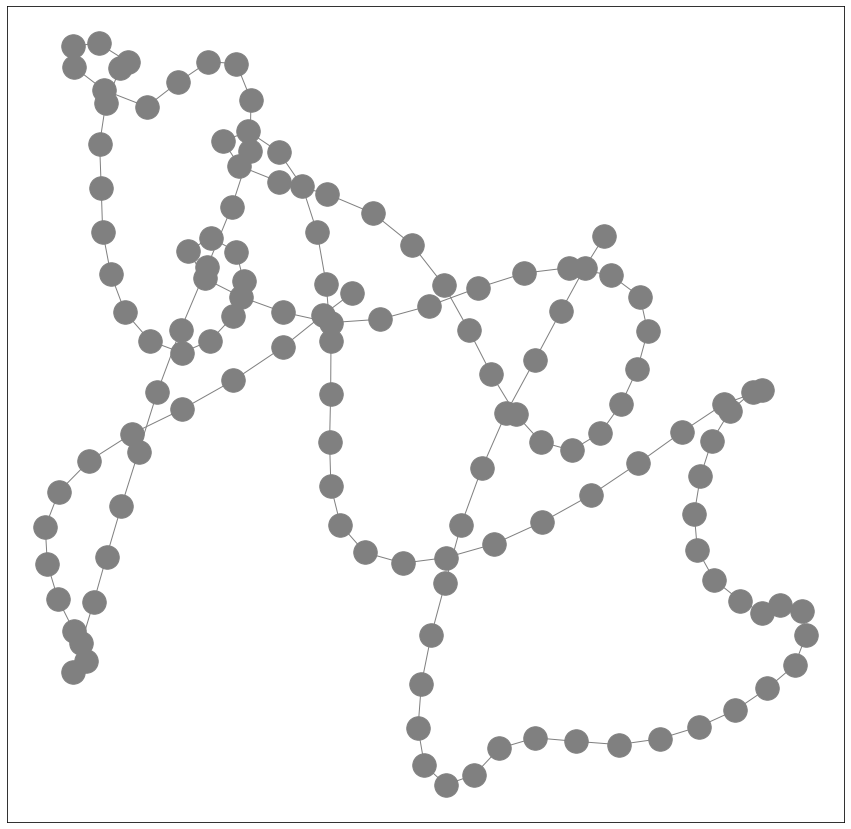

---Normalizing raw data---
----Processing data into windows----
Done---> Total 109 nodes formed
---User#:31 Activity#:1-----
Total nodes present in the graph are-->109
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:


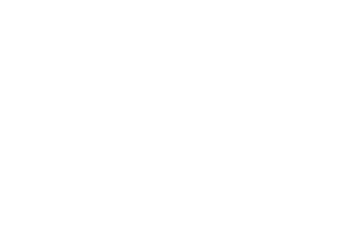

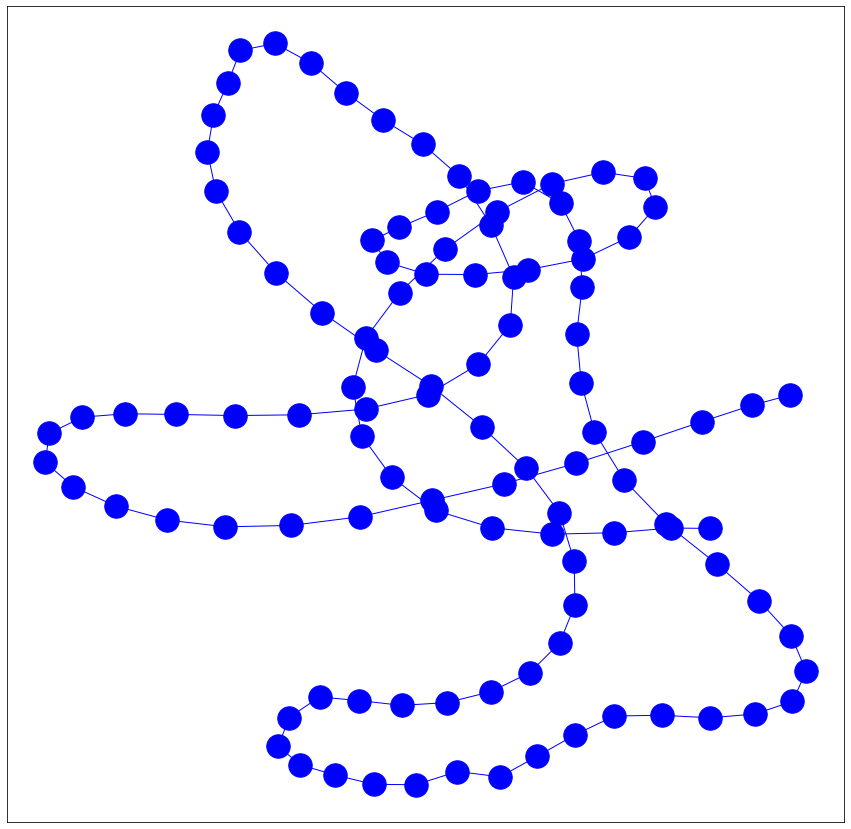

---Normalizing raw data---
----Processing data into windows----
Done---> Total 36 nodes formed
---User#:31 Activity#:4-----
Total nodes present in the graph are-->36
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

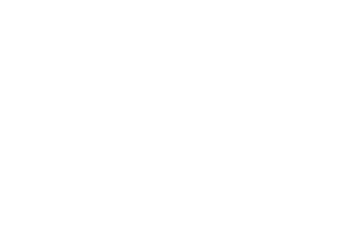

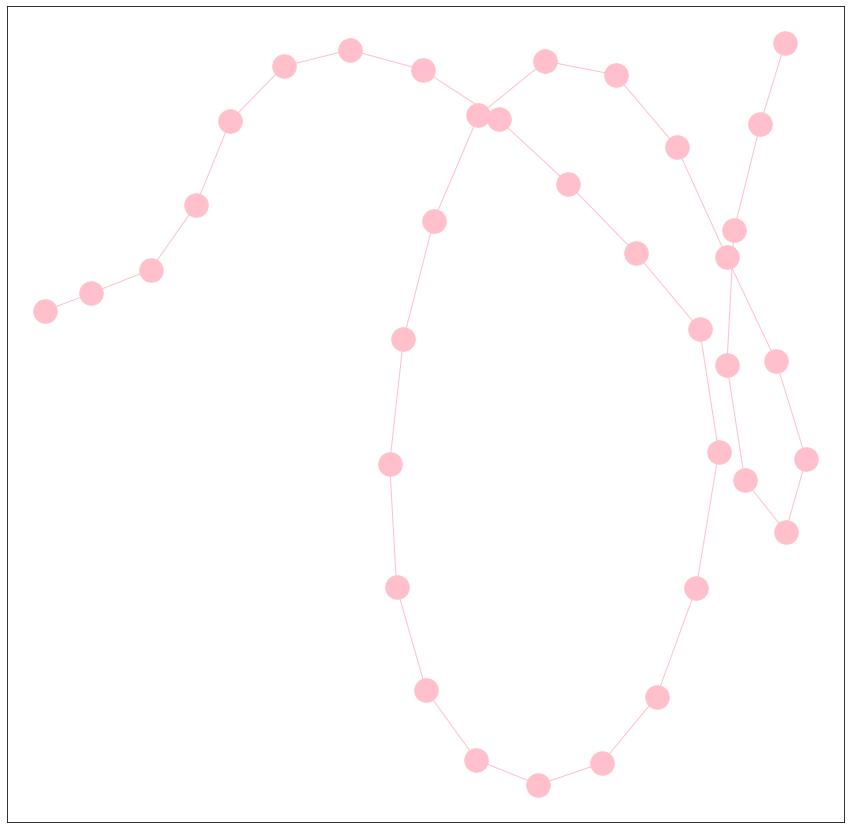

---Normalizing raw data---
----Processing data into windows----
Done---> Total 30 nodes formed
---User#:31 Activity#:0-----
Total nodes present in the graph are-->30
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['140-red:0', '140-red:1', '140-red:2', '140-red:3', '140-

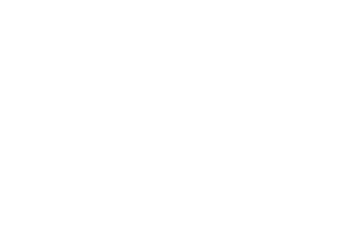

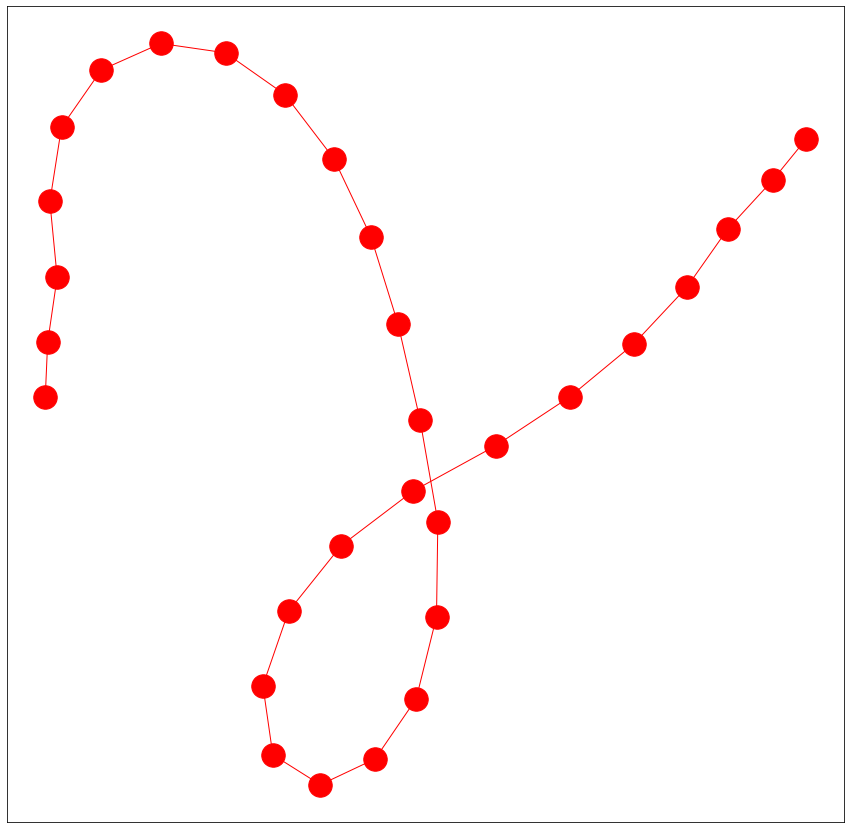

---Normalizing raw data---
----Processing data into windows----
Done---> Total 16 nodes formed
---User#:31 Activity#:2-----
Total nodes present in the graph are-->16
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['141-green:0', '141-green:1', '141-green:2', '141-green:3', '141-green:4', '141-green:5', '141-green:6', '141-green:7', '141-green:8', '141-green:9', '141-green:10', '141-green:11', '141-green:12', '141-green:13', '141-green:14', '141-green:15']
Edges of the graphs are:  [('141-green:0', '141-green:1'), ('141-green:1', '141-green:2'), ('141-green:2', '141-green:3'), ('141-green:3', '141-green:4'), ('141-

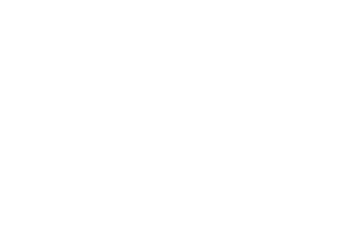

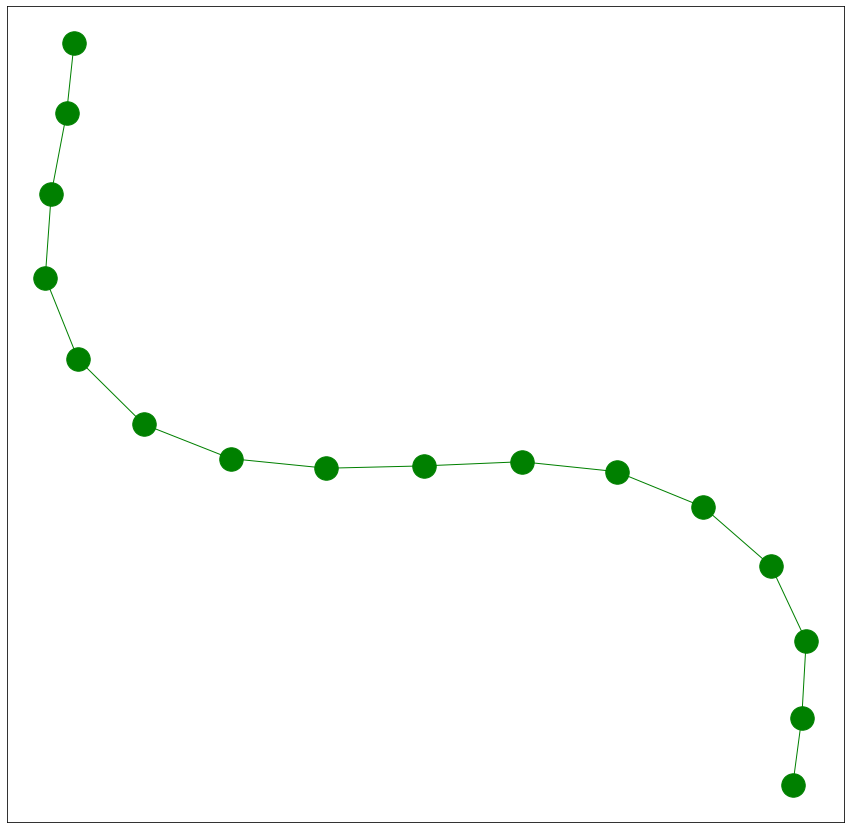

---Normalizing raw data---
----Processing data into windows----
Done---> Total 20 nodes formed
---User#:31 Activity#:3-----
Total nodes present in the graph are-->20
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['142-yellow:0', '142-yellow:1', '142-yellow:2', '142-yellow:3', '142-yellow:4', '142-yellow:5', '142-yellow:6', '142-yellow:7', '142-yellow:8', '142-yellow:9', '142-yellow:10', '142-yellow:11', '142-yellow:12', '142-yellow:13', '142-yellow:14', '142-yellow:15', '142-yellow:16', '142-yellow:17', '142-yellow

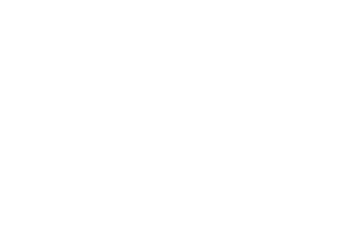

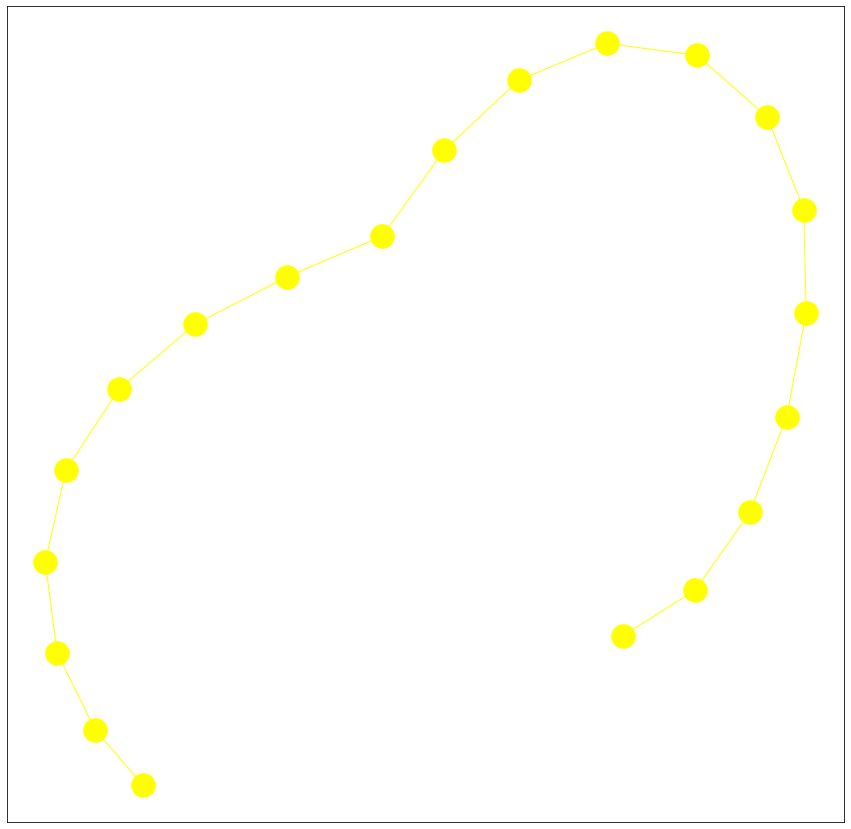

---Normalizing raw data---
----Processing data into windows----
Done---> Total 97 nodes formed
---User#:21 Activity#:5-----
Total nodes present in the graph are-->97
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

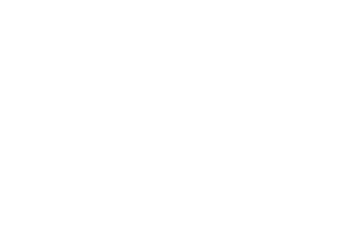

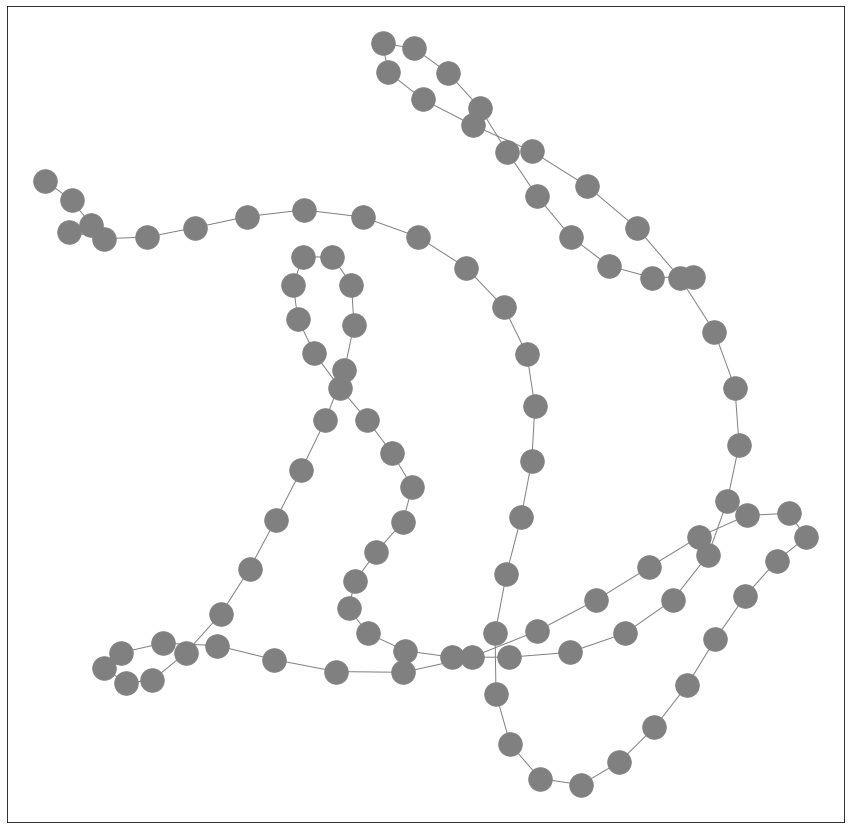

---Normalizing raw data---
----Processing data into windows----
Done---> Total 74 nodes formed
---User#:21 Activity#:1-----
Total nodes present in the graph are-->74
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

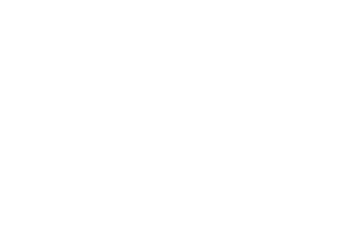

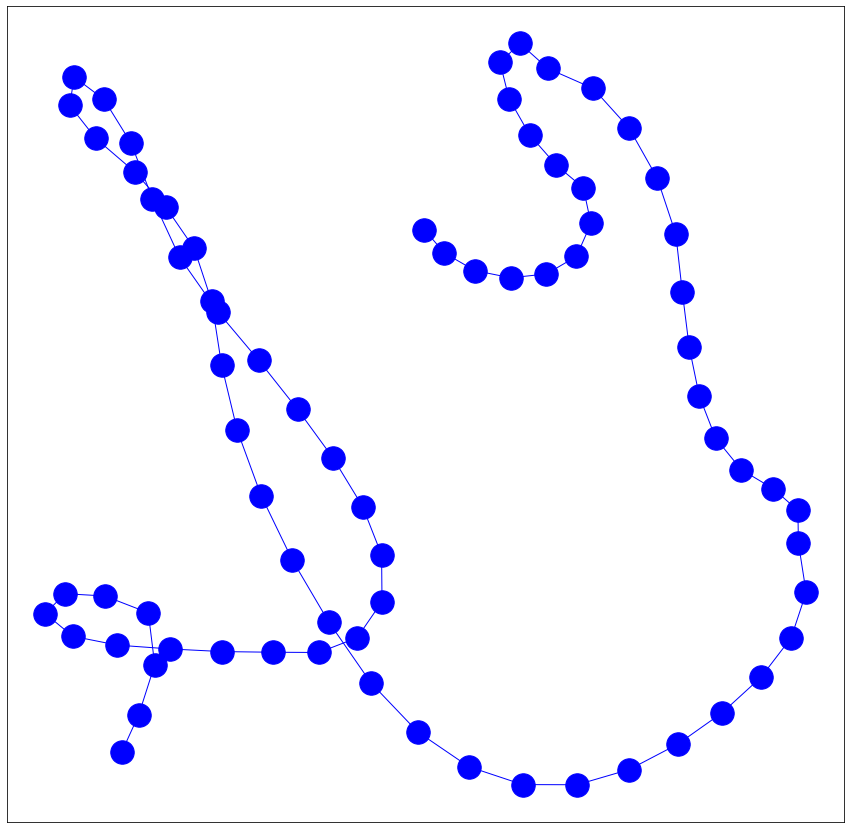

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:21 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['145-green:0', '145-green:1', '145-green:2', '145-green:3', '145-green:4', '145-green:5', '145-green:6', '145-green:7', '145-green:8', '145-green:9', '145-green:10', '145-green:11']
Edges of the graphs are:  [('145-green:0', '145-green:1'), ('145-green:1', '145-green:2'), ('145-green:2', '145-green:3'), ('145-green:3', '145-green:4'), ('145-green:4', '145-green:5'), ('145-green:5', '145-green:6'), ('145-green:6', '145-green:7'), ('145-green:7', '145-green:8'), ('145-green:8', '145-green:9'), ('145-gree

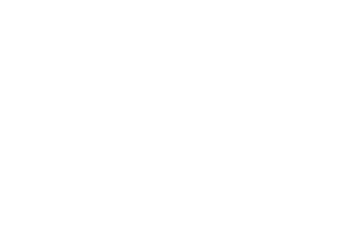

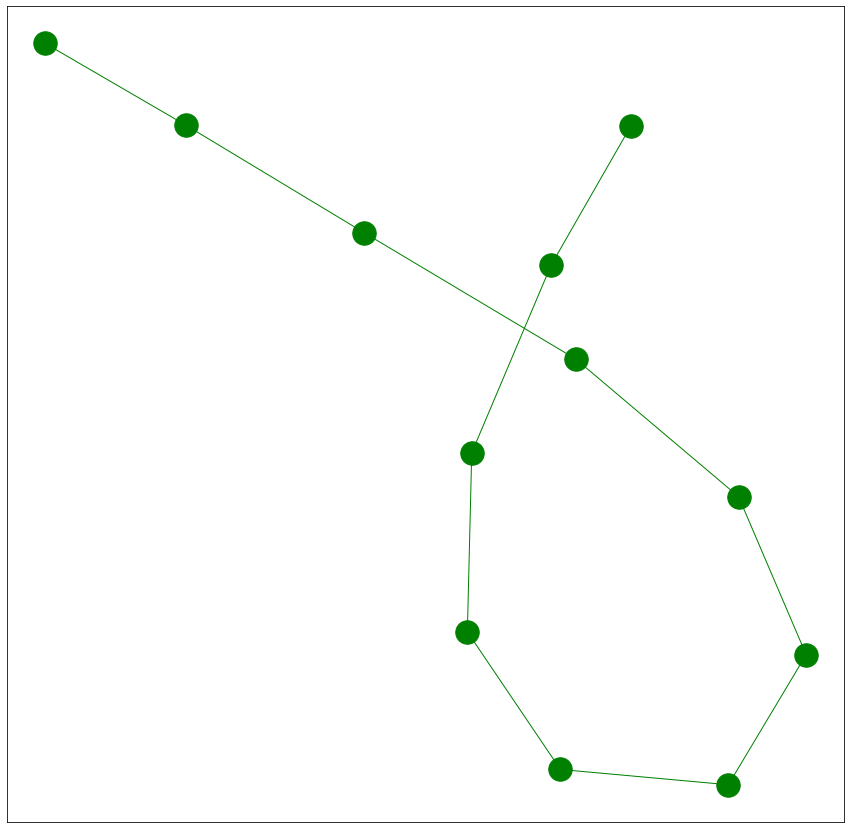

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:21 Activity#:3-----
Total nodes present in the graph are-->22
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['146-yellow:0', '146-yellow:1', '146-yellow:2', '146-yellow:3', '146-yellow:4', '146-yellow:5', '146-yellow:6', '146-yellow:7', '146-yellow:8', '146-yellow:9', '146-yellow:10', '146-yellow:11', '146-yellow:12', '146-yellow:13', '146-yellow:14', '146-yellow:

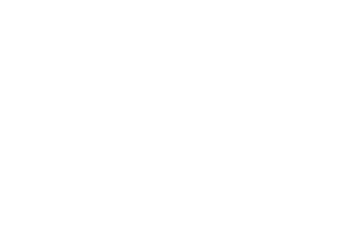

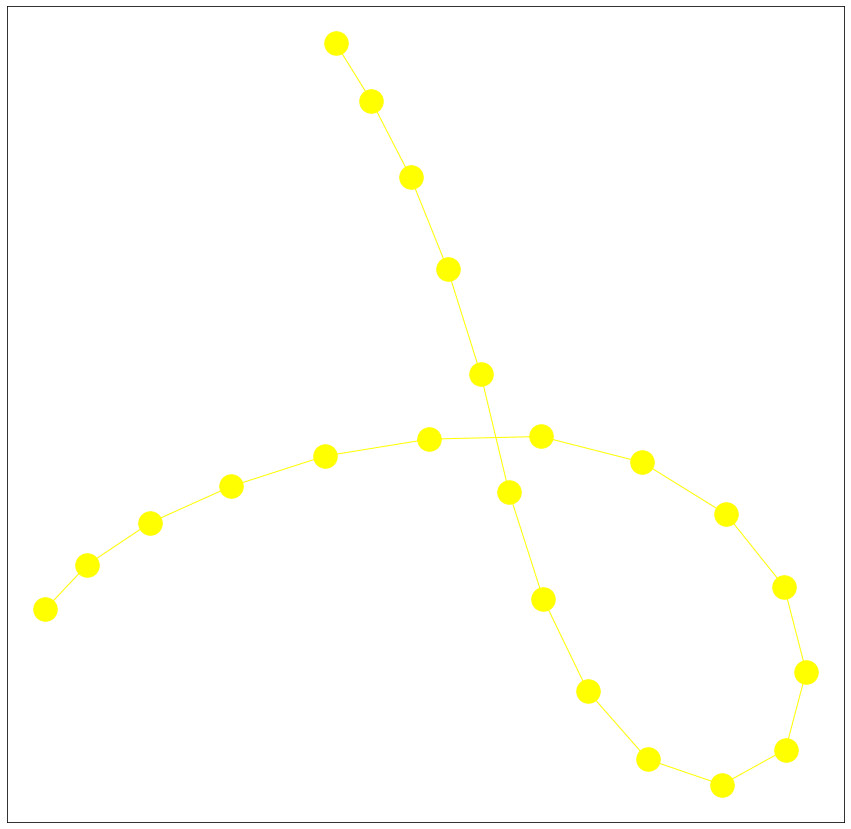

---Normalizing raw data---
----Processing data into windows----
Done---> Total 37 nodes formed
---User#:21 Activity#:4-----
Total nodes present in the graph are-->37
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

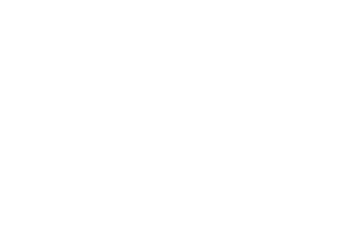

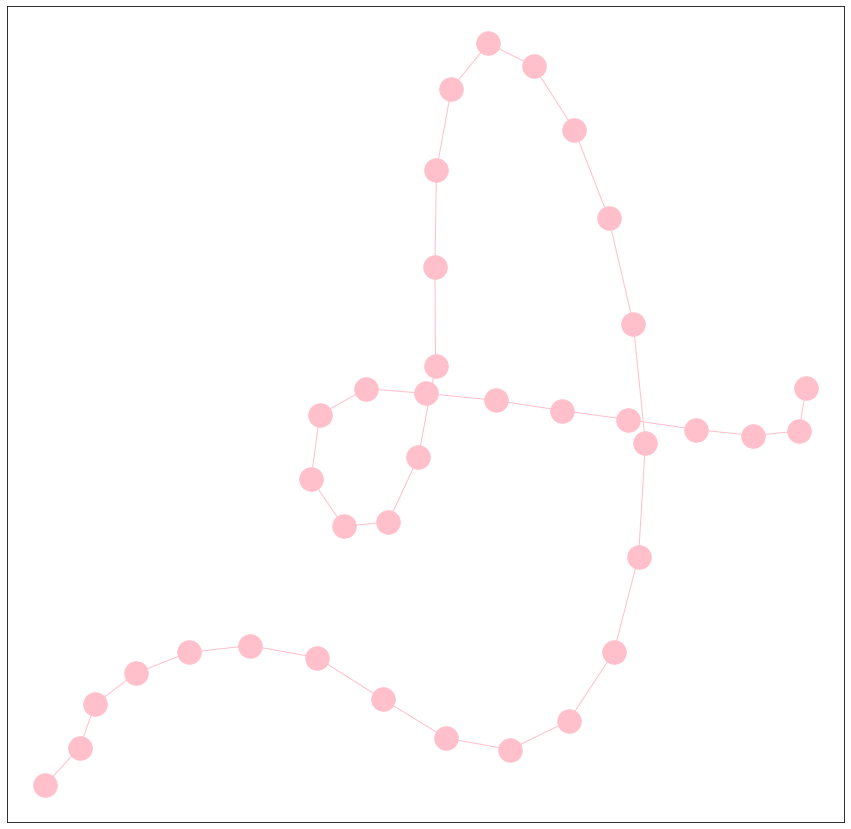

---Normalizing raw data---
----Processing data into windows----
Done---> Total 31 nodes formed
---User#:21 Activity#:0-----
Total nodes present in the graph are-->31
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['148-red:0', '148-red:1', '148-r

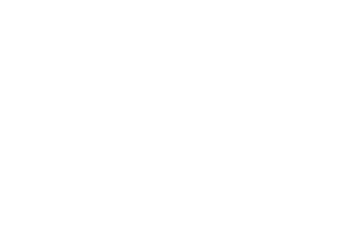

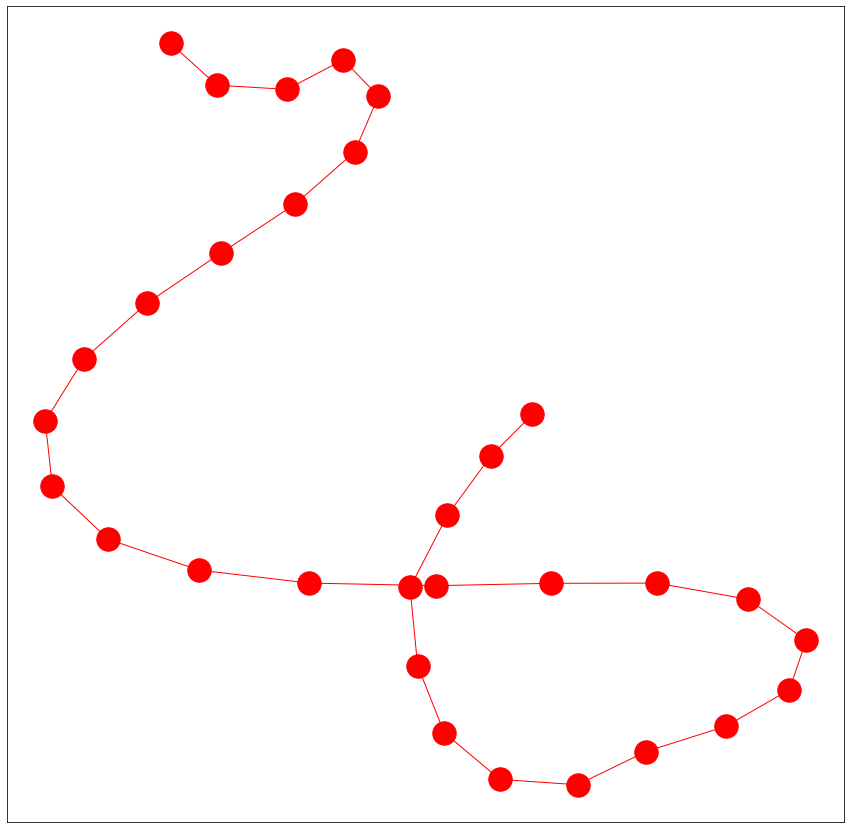

---Normalizing raw data---
----Processing data into windows----
Done---> Total 101 nodes formed
---User#:3 Activity#:5-----
Total nodes present in the graph are-->101
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
L

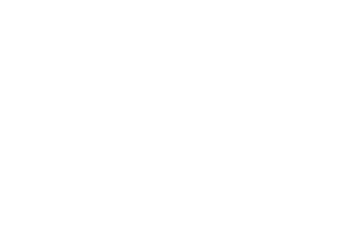

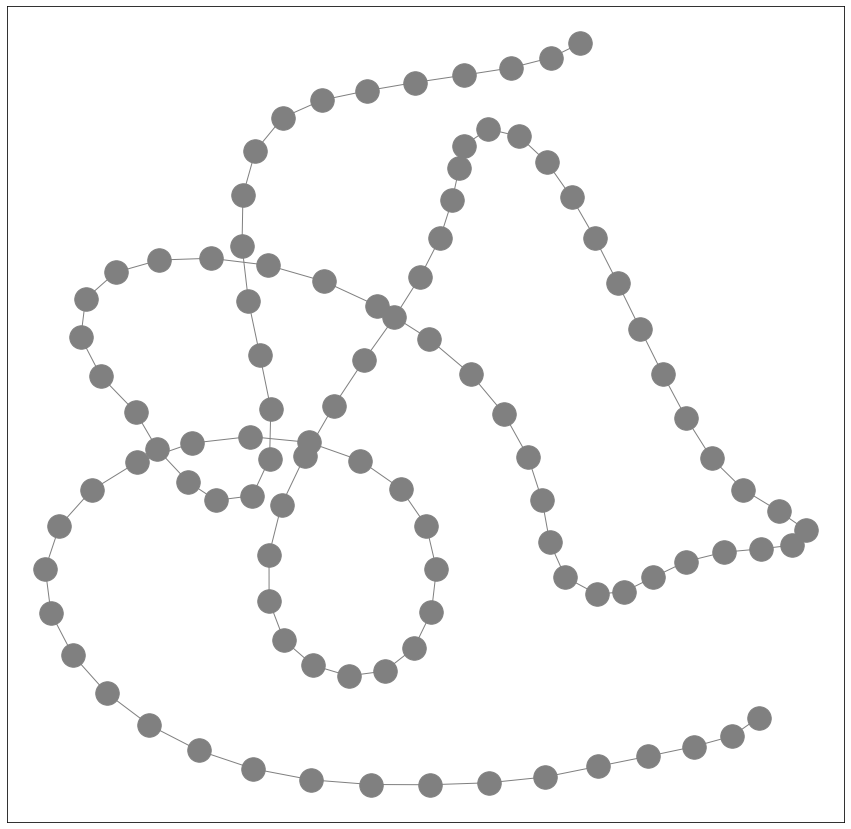

---Normalizing raw data---
----Processing data into windows----
Done---> Total 86 nodes formed
---User#:3 Activity#:1-----
Total nodes present in the graph are-->86
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

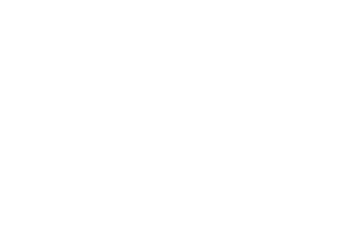

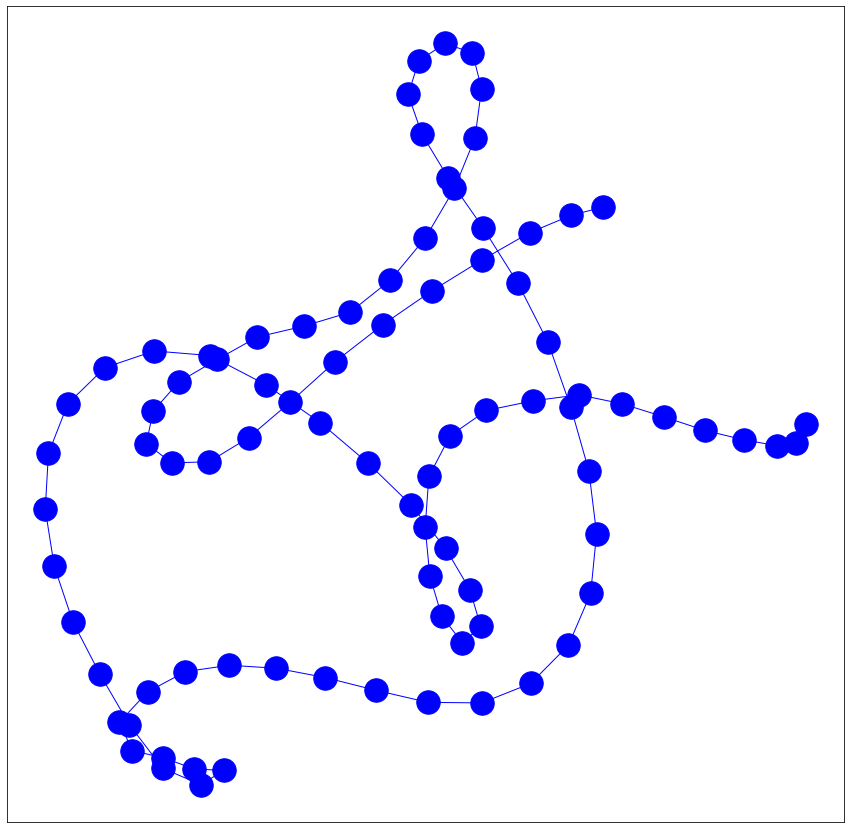

---Normalizing raw data---
----Processing data into windows----
Done---> Total 12 nodes formed
---User#:3 Activity#:2-----
Total nodes present in the graph are-->12
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['151-green:0', '151-green:1', '151-green:2', '151-green:3', '151-green:4', '151-green:5', '151-green:6', '151-green:7', '151-green:8', '151-green:9', '151-green:10', '151-green:11']
Edges of the graphs are:  [('151-green:0', '151-green:1'), ('151-green:1', '151-green:2'), ('151-green:2', '151-green:3'), ('151-green:3', '151-green:4'), ('151-green:4', '151-green:5'), ('151-green:5', '151-green:6'), ('151-green:6', '151-green:7'), ('151-green:7', '151-green:8'), ('151-green:8', '151-green:9'), ('151-green

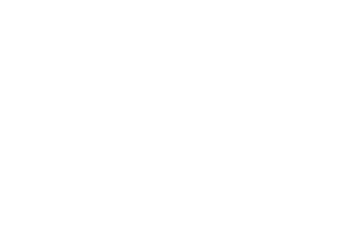

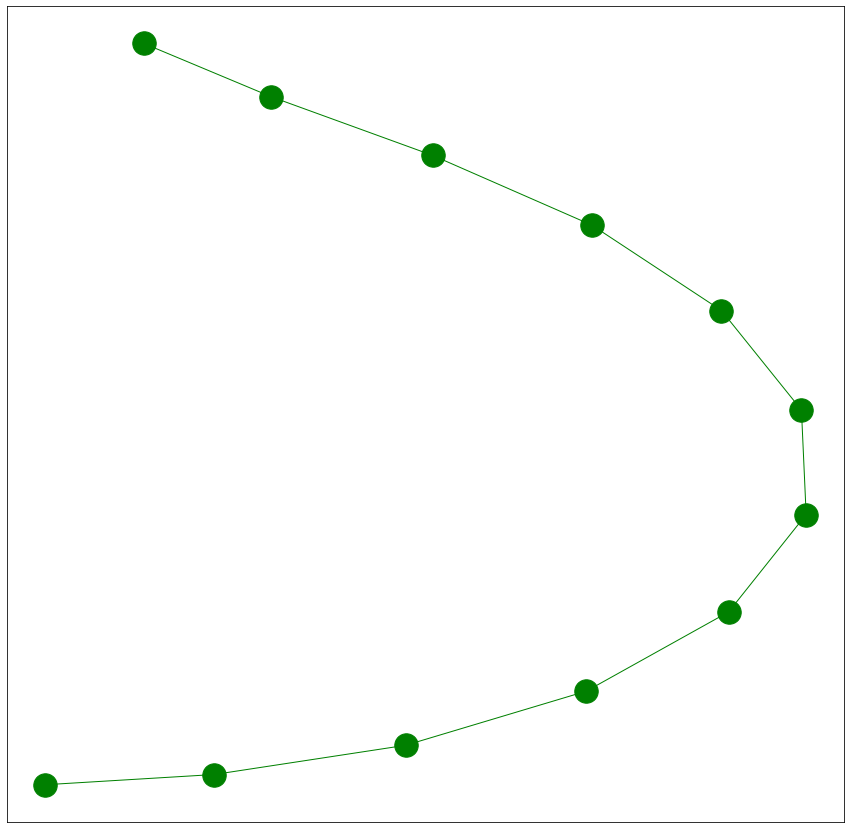

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:3 Activity#:3-----
Total nodes present in the graph are-->22
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['152-yellow:0', '152-yellow:1', '152-yellow:2', '152-yellow:3', '152-yellow:4', '152-yellow:5', '152-yellow:6', '152-yellow:7', '152-yellow:8', '152-yellow:9', '152-yellow:10', '152-yellow:11', '152-yellow:12', '152-yellow:13', '152-yellow:14', '152-yellow:1

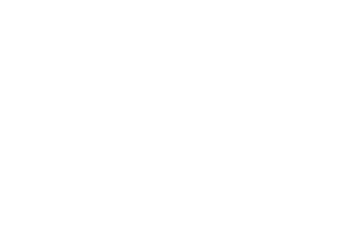

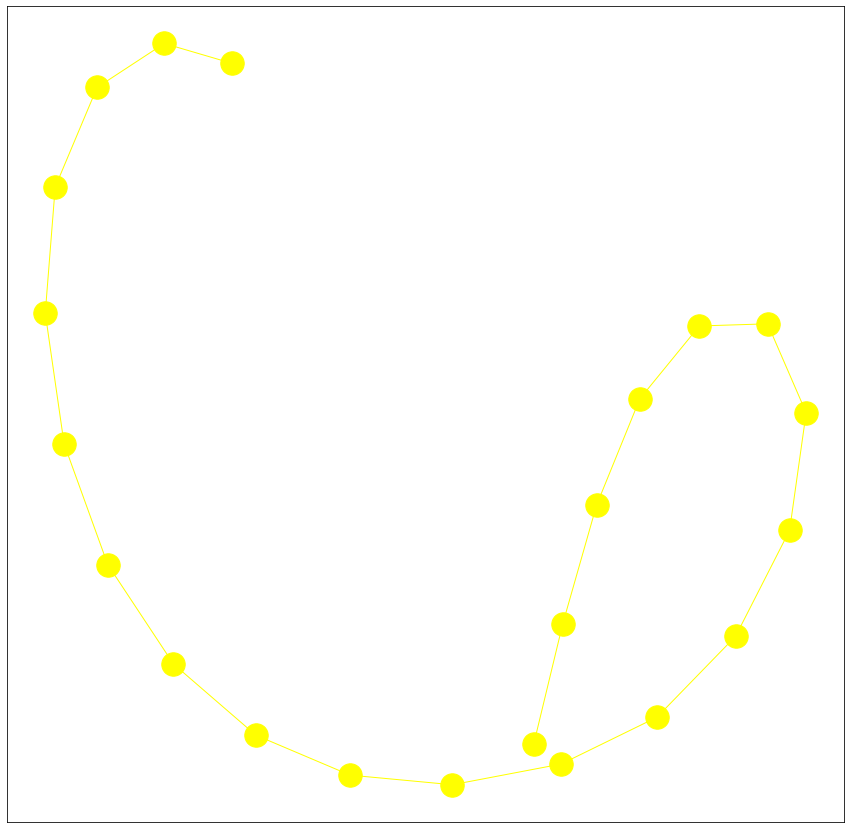

---Normalizing raw data---
----Processing data into windows----
Done---> Total 26 nodes formed
---User#:3 Activity#:4-----
Total nodes present in the graph are-->26
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['153-pink:0', '153-pink:1', '153-pink:2', '153-pink:3', '153-pink:4', '153-pink:5', '153-pink:6', '153-pink:7', '153-pink:8', '153-pink:9', '153-pink:10', '15

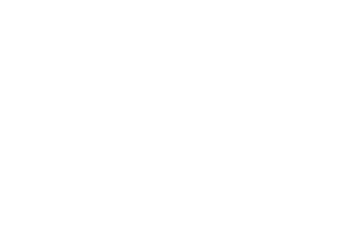

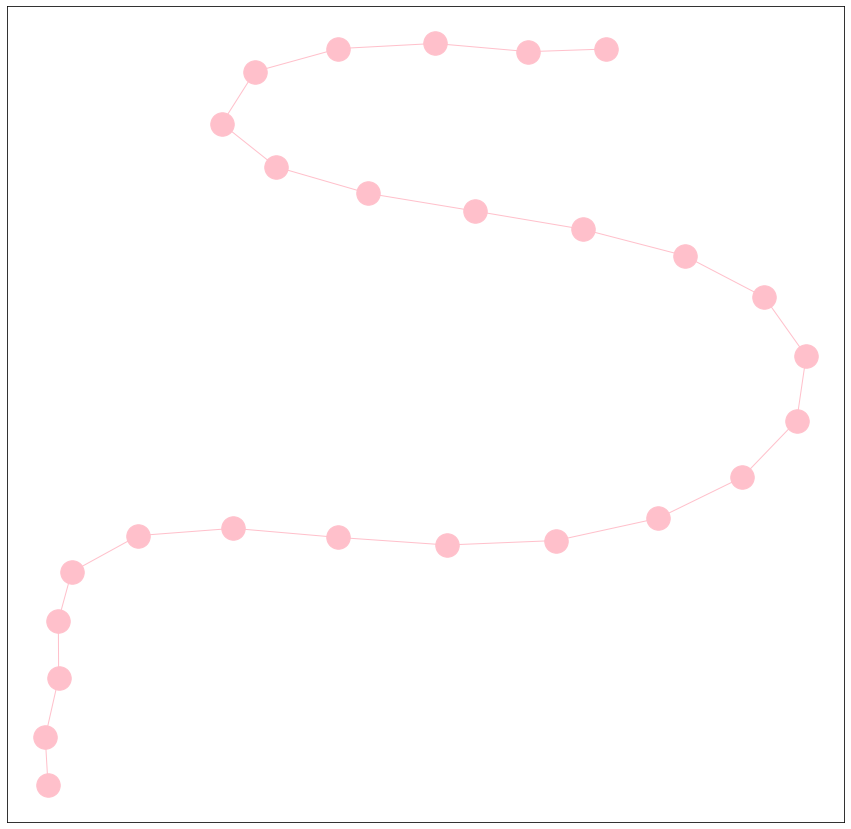

---Normalizing raw data---
----Processing data into windows----
Done---> Total 25 nodes formed
---User#:3 Activity#:0-----
Total nodes present in the graph are-->25
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['154-red:0', '154-red:1', '154-red:2', '154-red:3', '154-red:4', '154-red:5', '154-red:6', '154-red:7', '154-red:8', '154-red:9', '154-red:10', '154-red:11', '154-red:12', '154-red:13

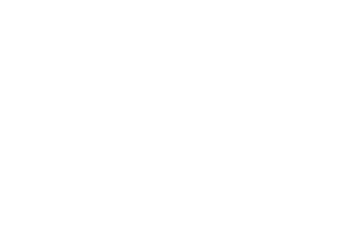

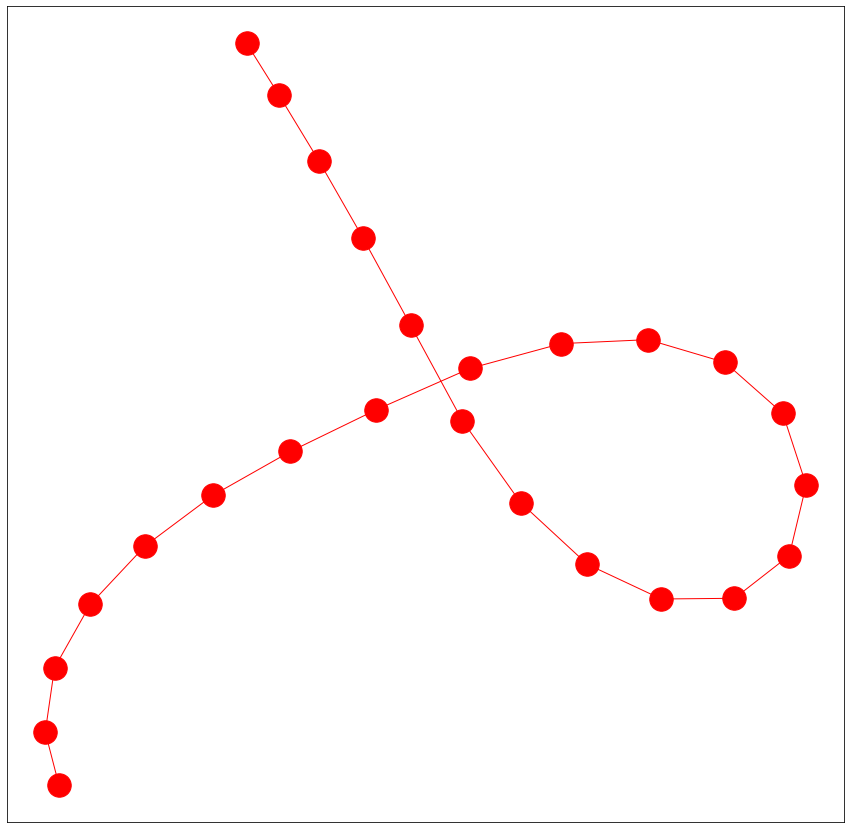

---Normalizing raw data---
----Processing data into windows----
Done---> Total 54 nodes formed
---User#:22 Activity#:5-----
Total nodes present in the graph are-->54
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

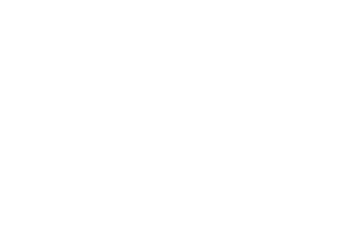

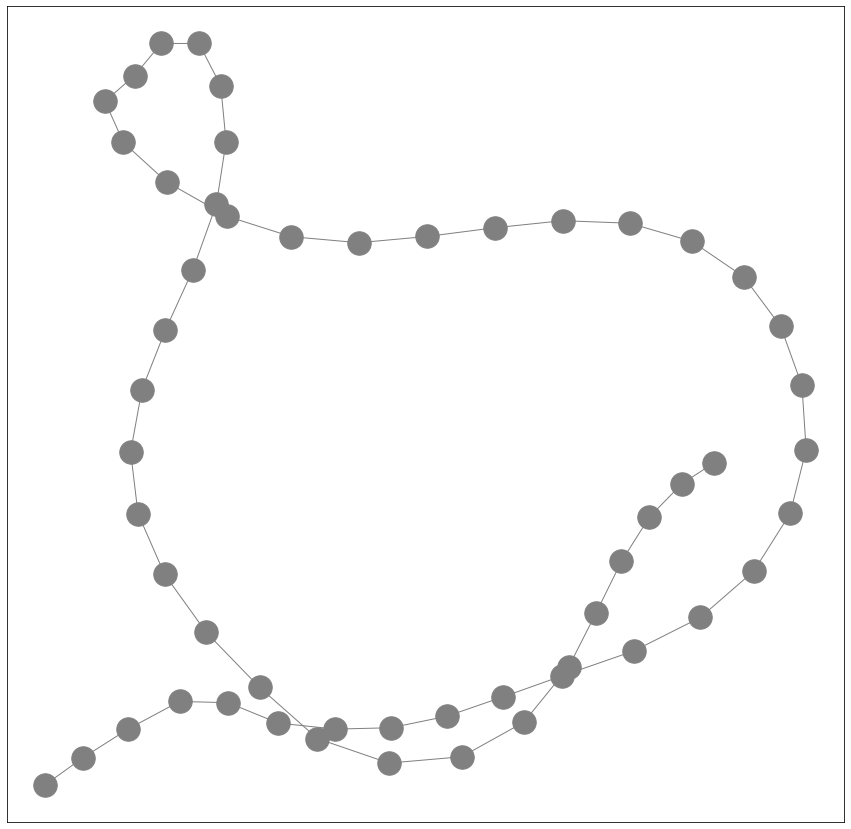

---Normalizing raw data---
----Processing data into windows----
Done---> Total 48 nodes formed
---User#:22 Activity#:1-----
Total nodes present in the graph are-->48
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

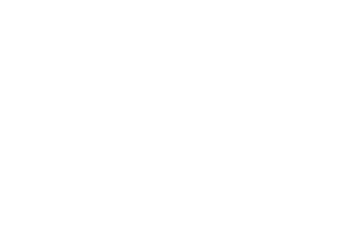

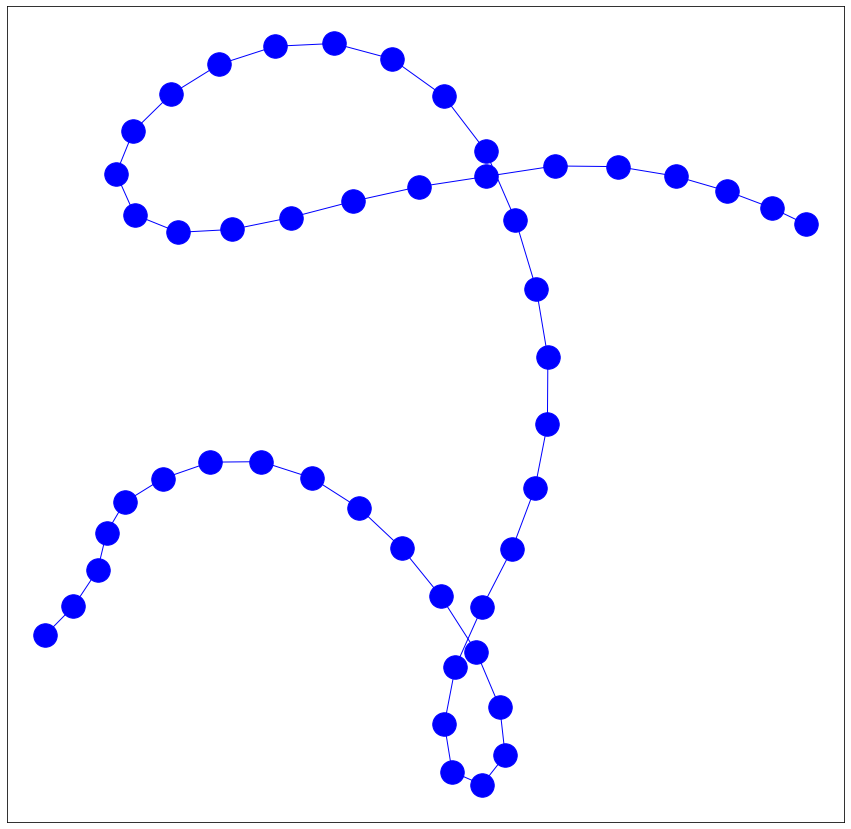

---Normalizing raw data---
----Processing data into windows----
Done---> Total 42 nodes formed
---User#:22 Activity#:4-----
Total nodes present in the graph are-->42
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
La

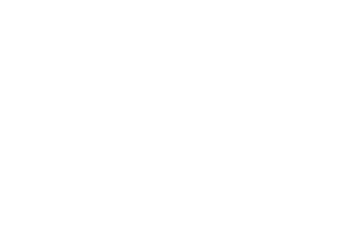

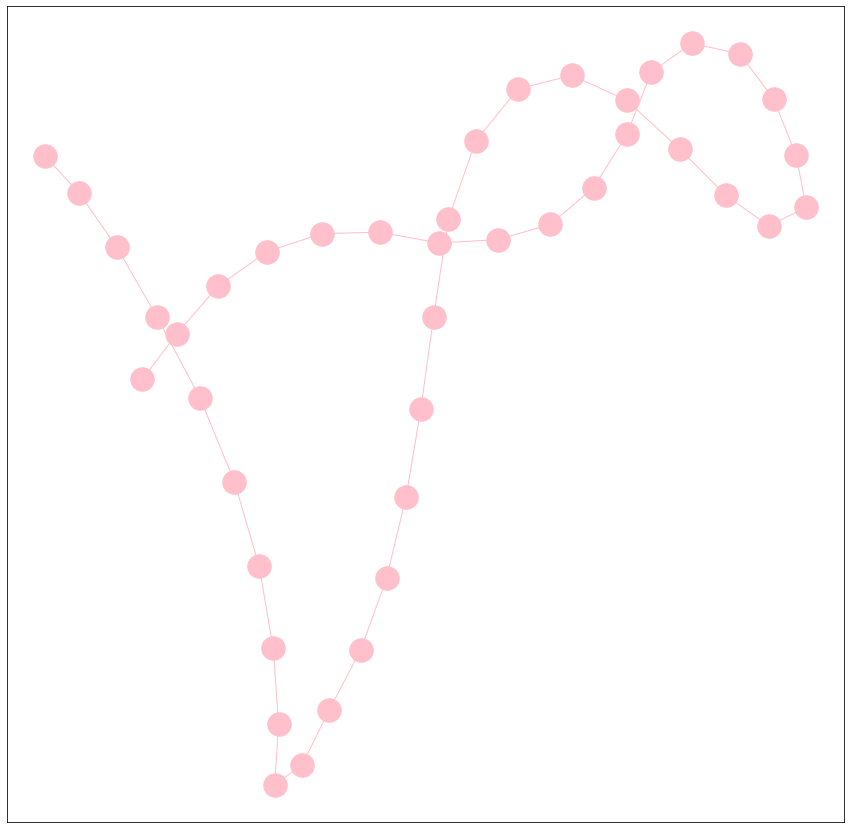

---Normalizing raw data---
----Processing data into windows----
Done---> Total 28 nodes formed
---User#:22 Activity#:0-----
Total nodes present in the graph are-->28
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['158-red:0', '158-red:1', '158-red:2', '158-red:3', '158-red:4', '158-red:5', '158-red:6', '158-red:7', '15

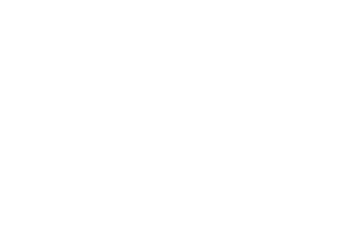

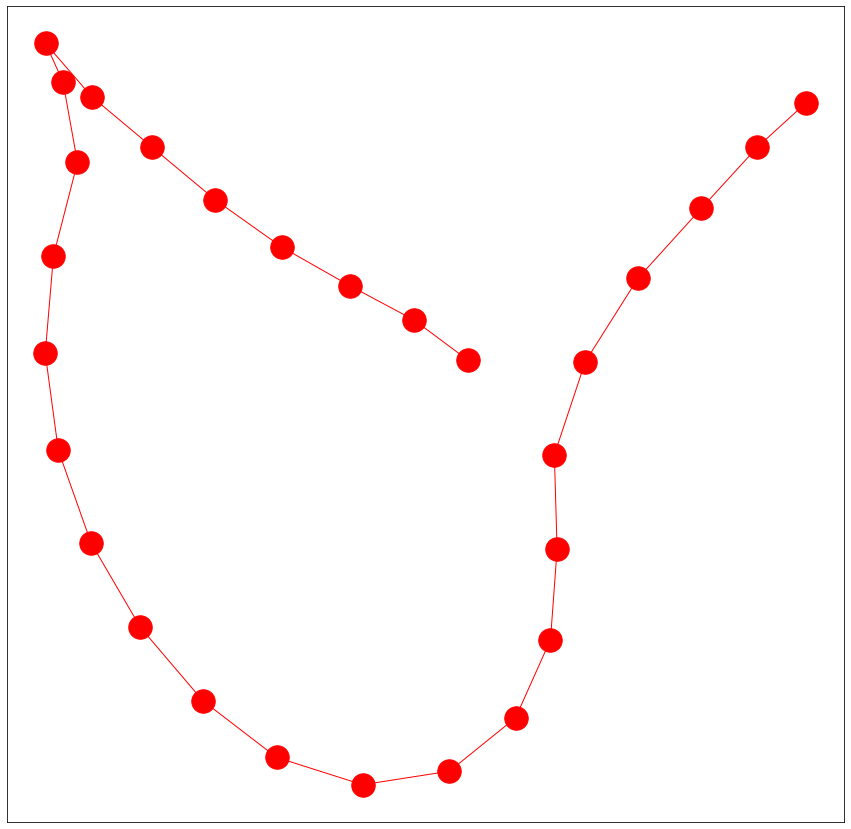

---Normalizing raw data---
----Processing data into windows----
Done---> Total 100 nodes formed
---User#:1 Activity#:5-----
Total nodes present in the graph are-->100
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
L

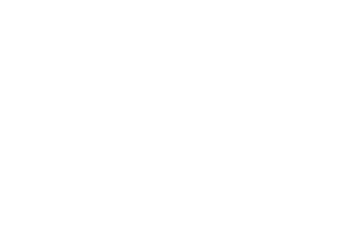

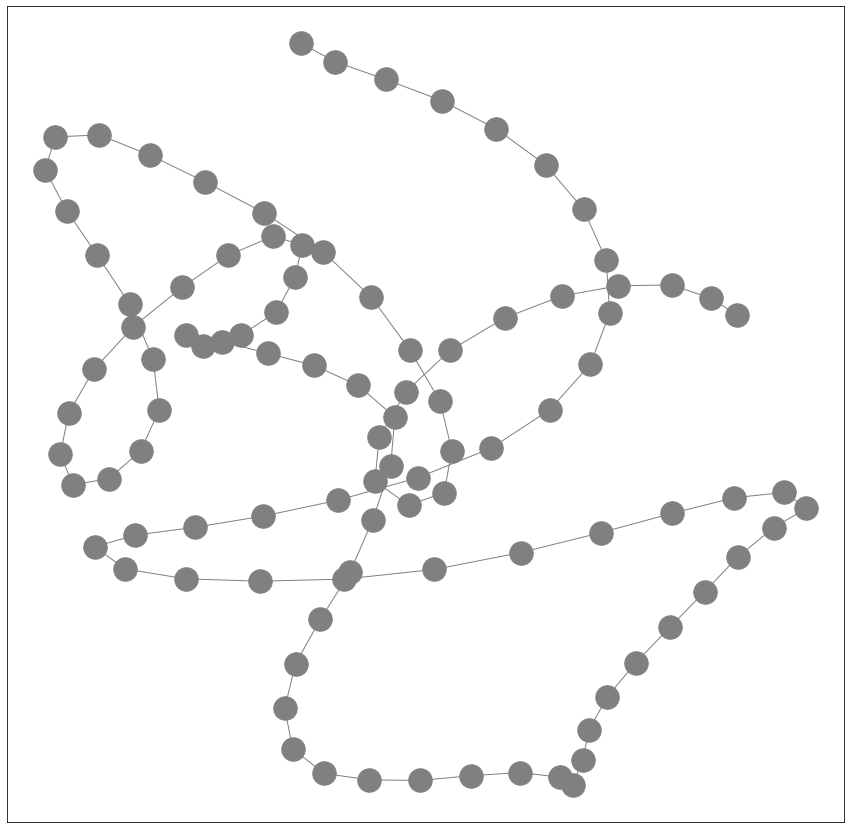

---Normalizing raw data---
----Processing data into windows----
Done---> Total 86 nodes formed
---User#:1 Activity#:1-----
Total nodes present in the graph are-->86
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

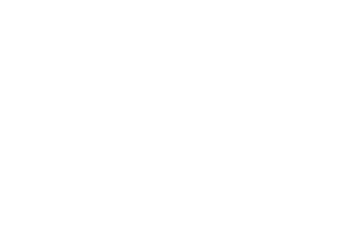

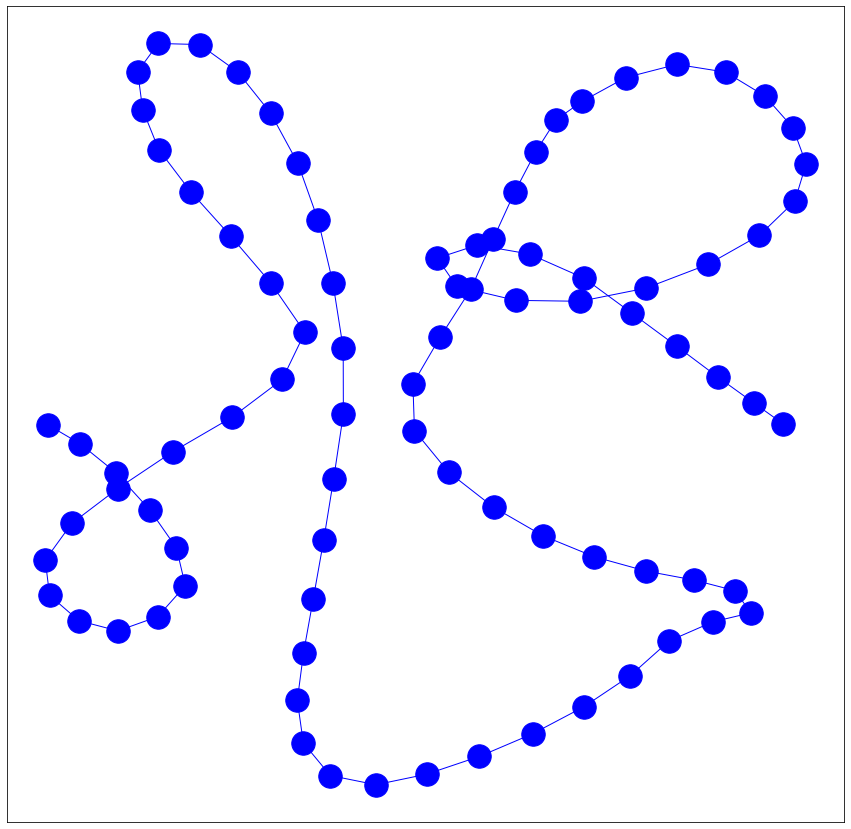

---Normalizing raw data---
----Processing data into windows----
Done---> Total 24 nodes formed
---User#:1 Activity#:4-----
Total nodes present in the graph are-->24
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['161-pink:0', '161-pink:1', '161-pink:2', '161-pink:3', '161-pink:4', '161-pink:5', '161-pink:6', '161-pink:7', '161-pink:8', '161-pink:9', '161-pink:10', '161-pink:11', '161-pink:12', '161-pink:13', '161-pin

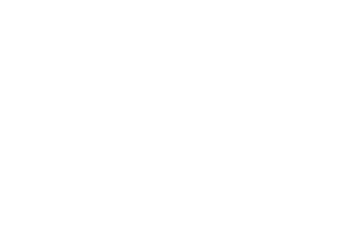

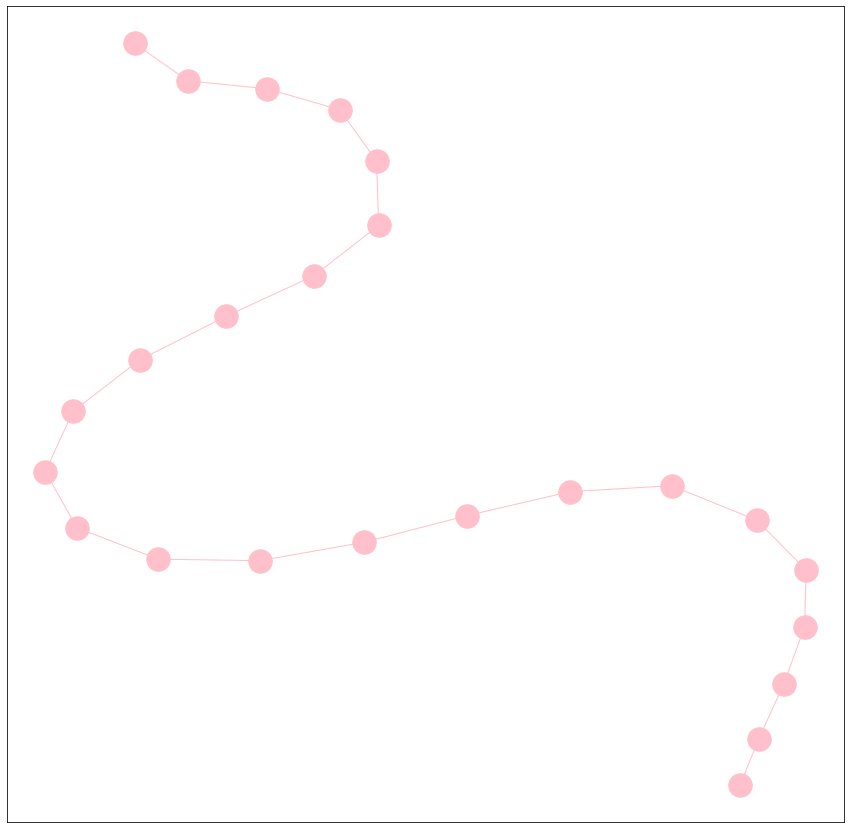

---Normalizing raw data---
----Processing data into windows----
Done---> Total 22 nodes formed
---User#:1 Activity#:0-----
Total nodes present in the graph are-->22
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['162-red:0', '162-red:1', '162-red:2', '162-red:3', '162-red:4', '162-red:5', '162-red:6', '162-red:7', '162-red:8', '162-red:9', '162-red:10', '162-red:11', '162-red:12', '162-red:13', '162-red:14', '162-red:15', '162-red:16', '162-red:17', '162-red:18', '1

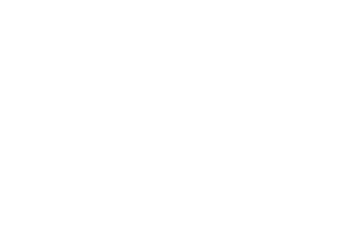

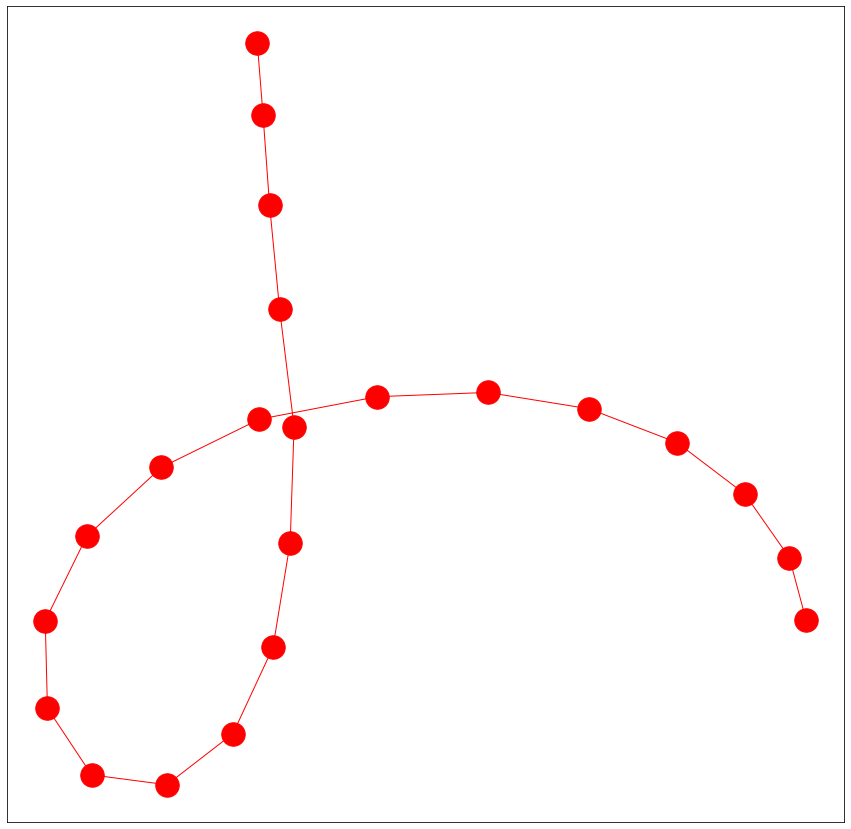

---Normalizing raw data---
----Processing data into windows----
Done---> Total 100 nodes formed
---User#:9 Activity#:5-----
Total nodes present in the graph are-->100
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
L

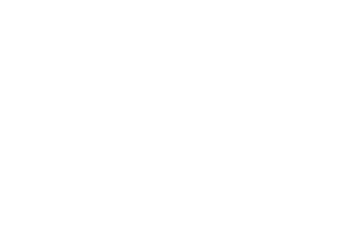

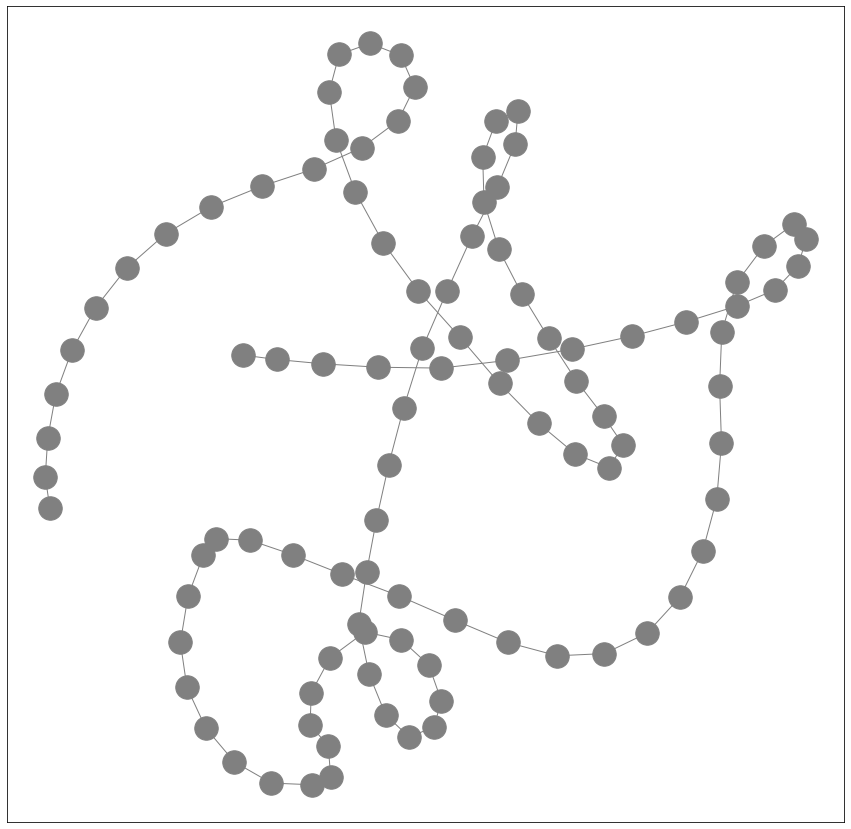

---Normalizing raw data---
----Processing data into windows----
Done---> Total 54 nodes formed
---User#:25 Activity#:5-----
Total nodes present in the graph are-->54
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
La

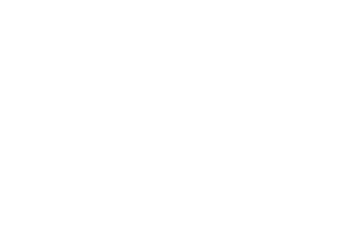

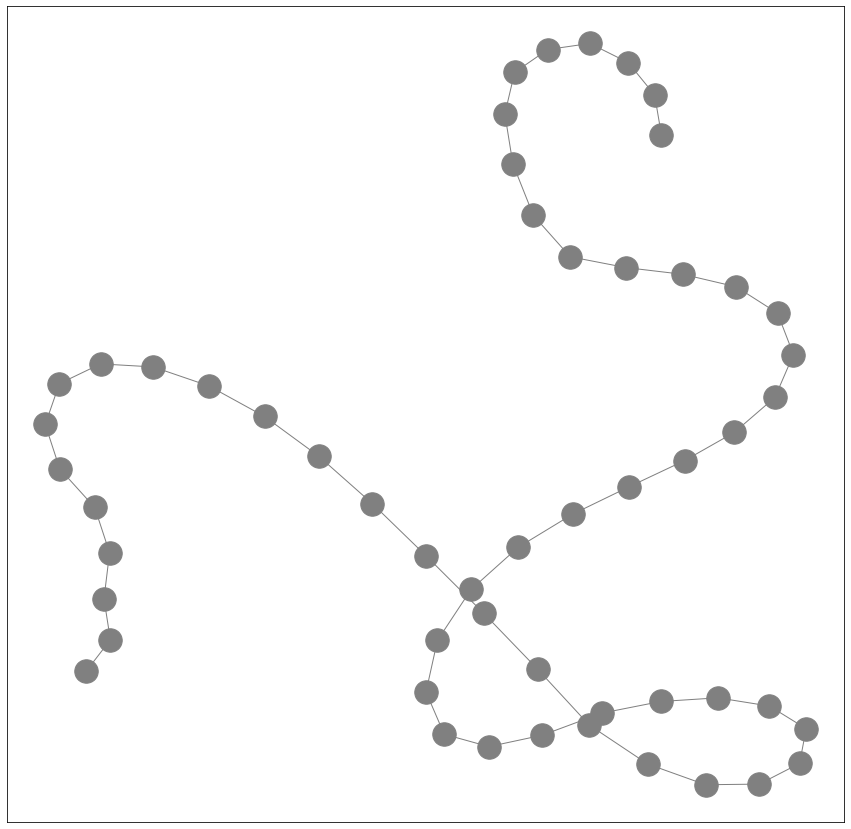

---Normalizing raw data---
----Processing data into windows----
Done---> Total 50 nodes formed
---User#:25 Activity#:1-----
Total nodes present in the graph are-->50
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
La

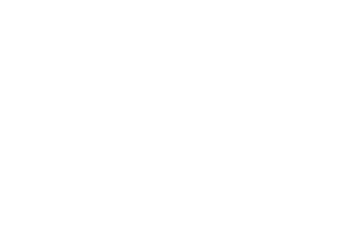

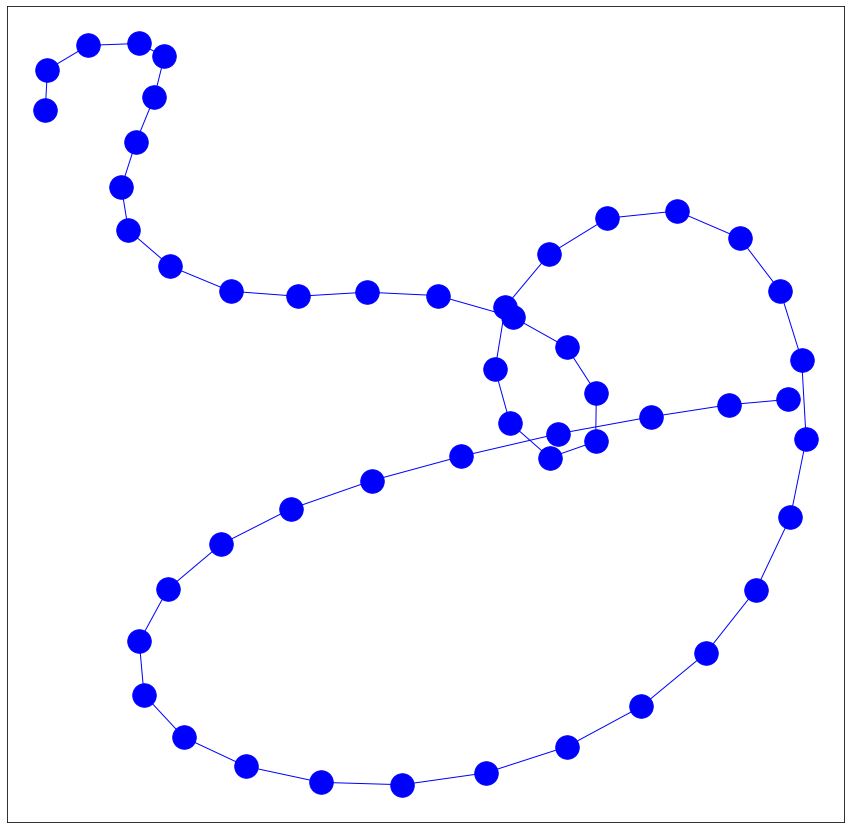

---Normalizing raw data---
----Processing data into windows----
Done---> Total 91 nodes formed
---User#:2 Activity#:5-----
Total nodes present in the graph are-->91
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Lab

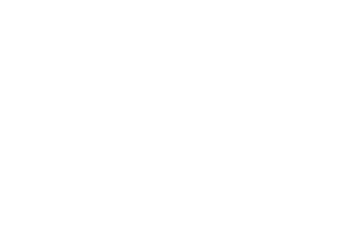

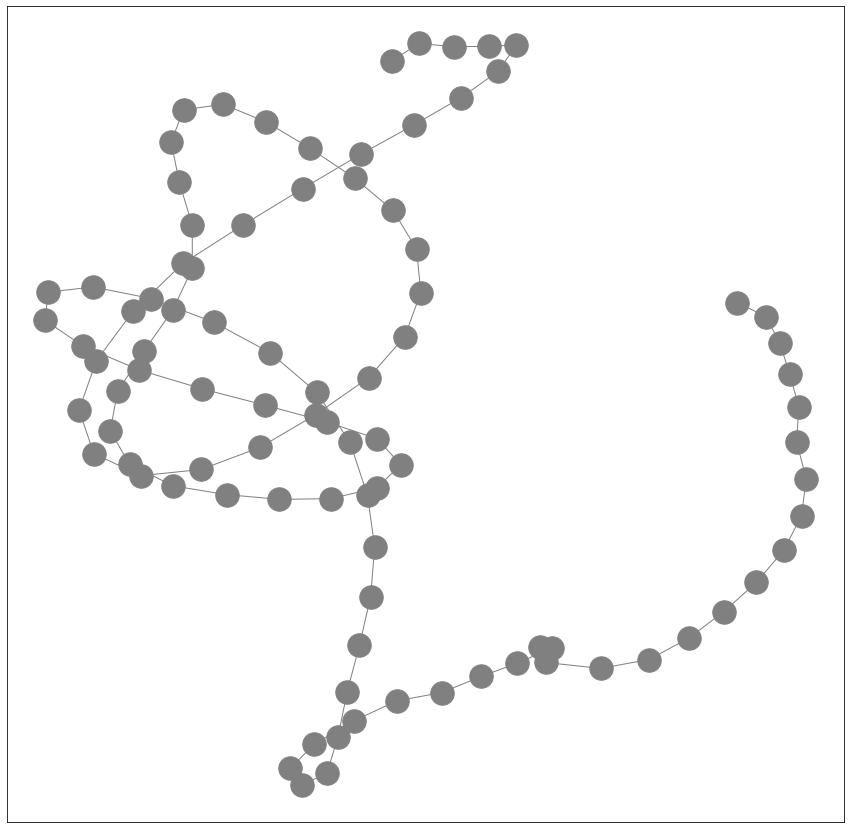

---Normalizing raw data---
----Processing data into windows----
Done---> Total 92 nodes formed
---User#:2 Activity#:1-----
Total nodes present in the graph are-->92
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

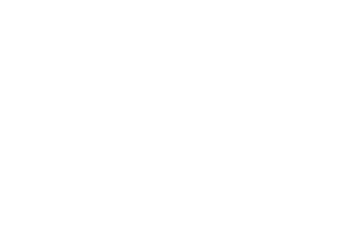

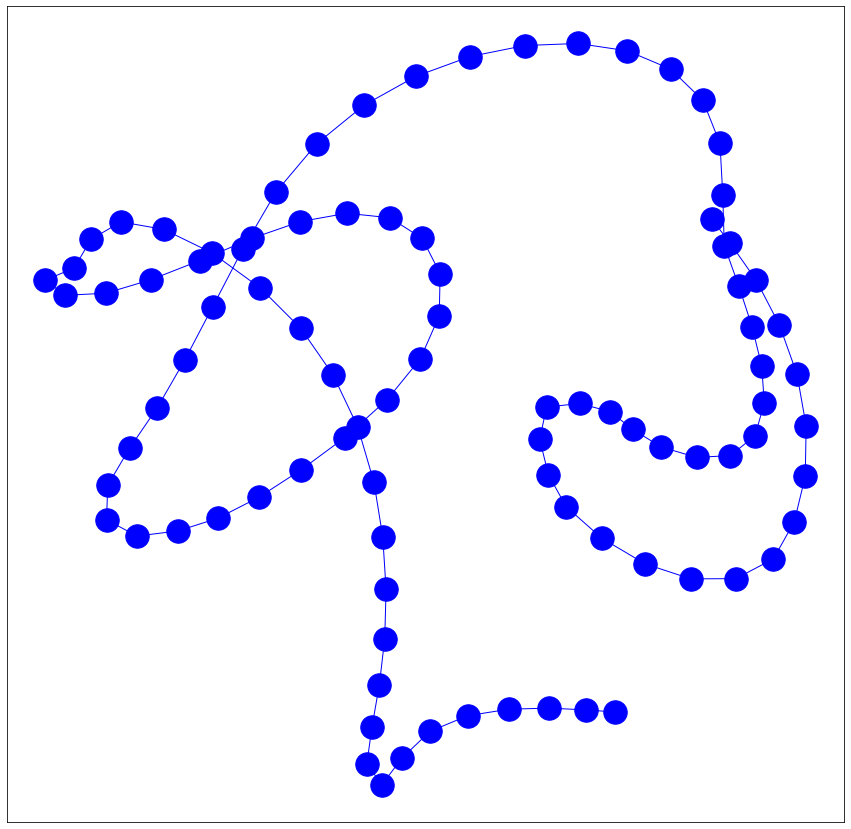

---Normalizing raw data---
----Processing data into windows----
Done---> Total 71 nodes formed
---User#:7 Activity#:1-----
Total nodes present in the graph are-->71
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Lab

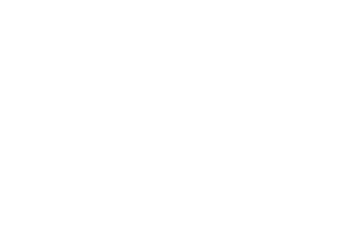

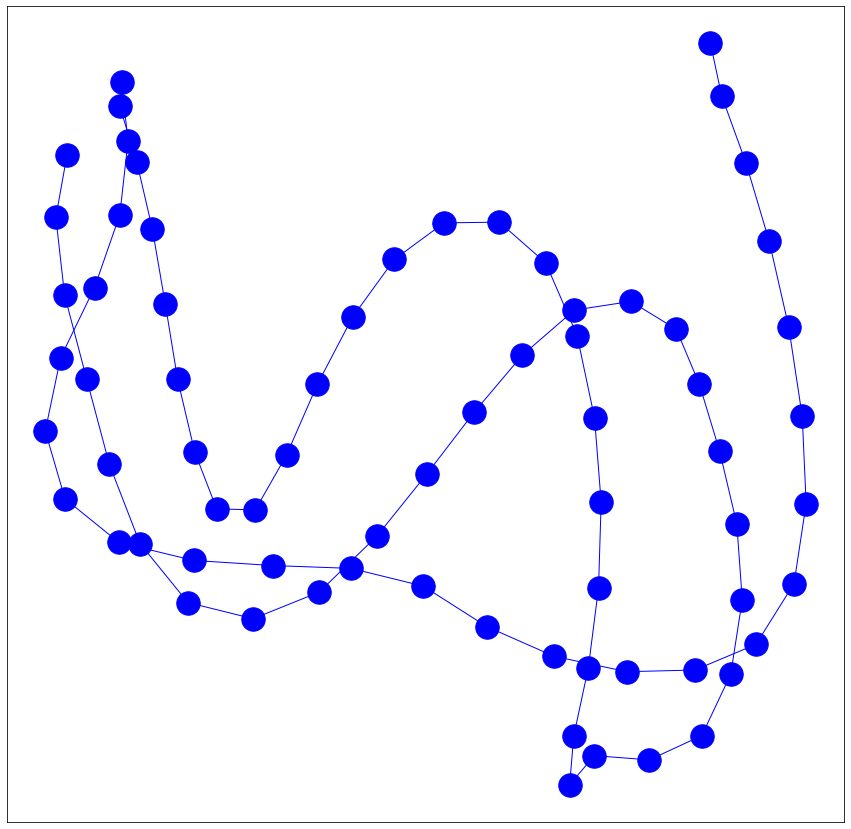

---Normalizing raw data---
----Processing data into windows----
Done---> Total 86 nodes formed
---User#:7 Activity#:5-----
Total nodes present in the graph are-->86
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Lab

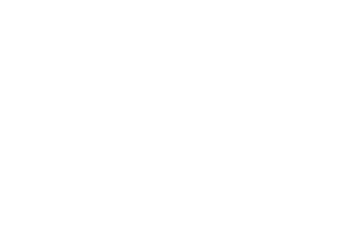

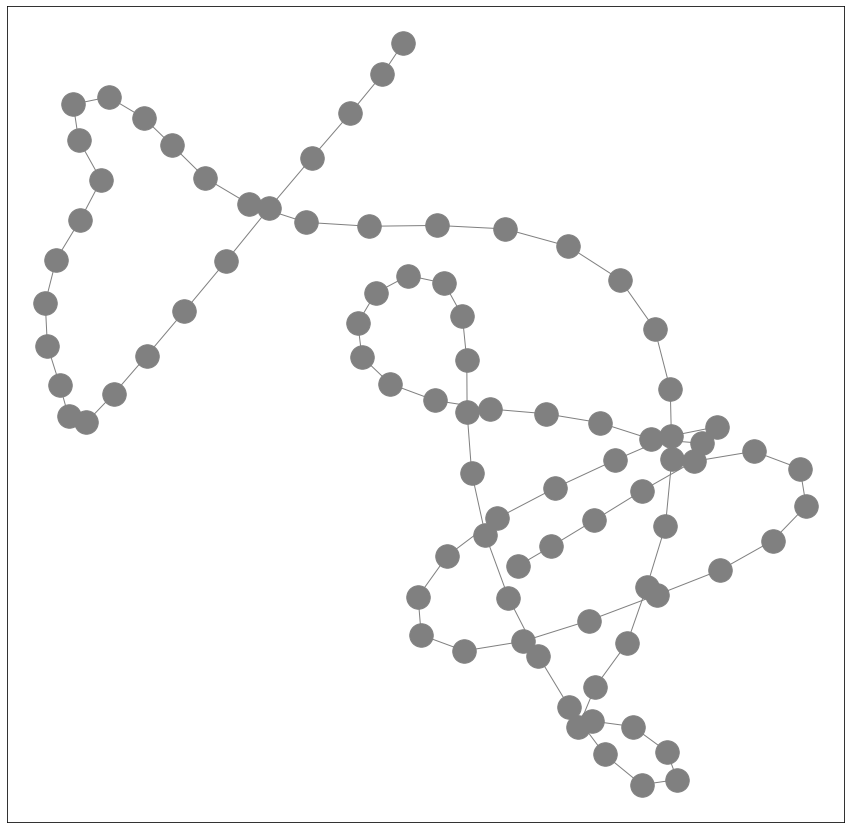

---Normalizing raw data---
----Processing data into windows----
Done---> Total 28 nodes formed
---User#:7 Activity#:4-----
Total nodes present in the graph are-->28
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of the graphs are:  ['170-pink:0', '170-pink:1', '170-pink:2', '170-pink:3', '170-pink:4', '170-pink:5', '170-pink:6', '170-pink:

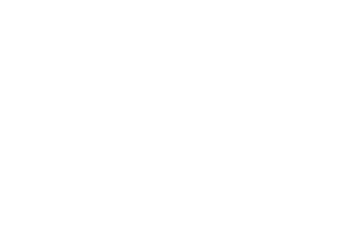

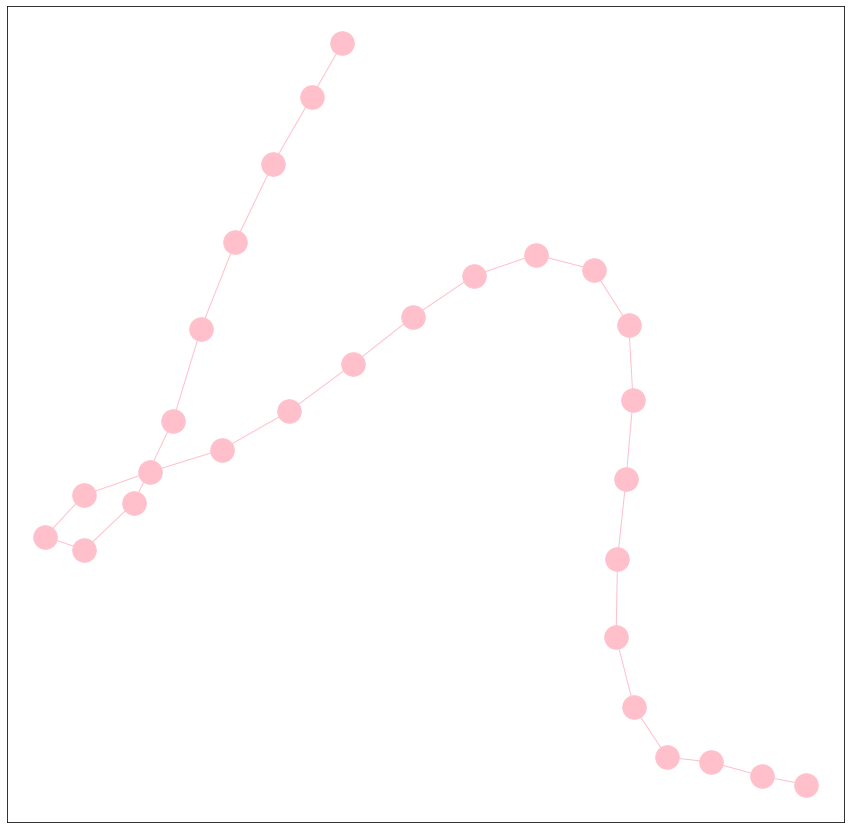

---Normalizing raw data---
----Processing data into windows----
Done---> Total 17 nodes formed
---User#:7 Activity#:0-----
Total nodes present in the graph are-->17
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['171-red:0', '171-red:1', '171-red:2', '171-red:3', '171-red:4', '171-red:5', '171-red:6', '171-red:7', '171-red:8', '171-red:9', '171-red:10', '171-red:11', '171-red:12', '171-red:13', '171-red:14', '171-red:15', '171-red:16']
Edges of the graphs are:  [('171-red:0', '171-red:1'), ('171-red:1', '171-red:2'), ('171-red:2', '171-red:3'), ('171-red:3', '171-red:4'), ('171-red:4', '1

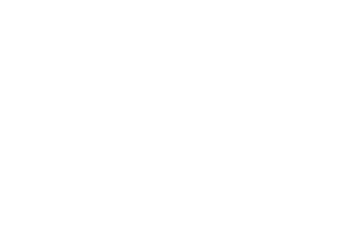

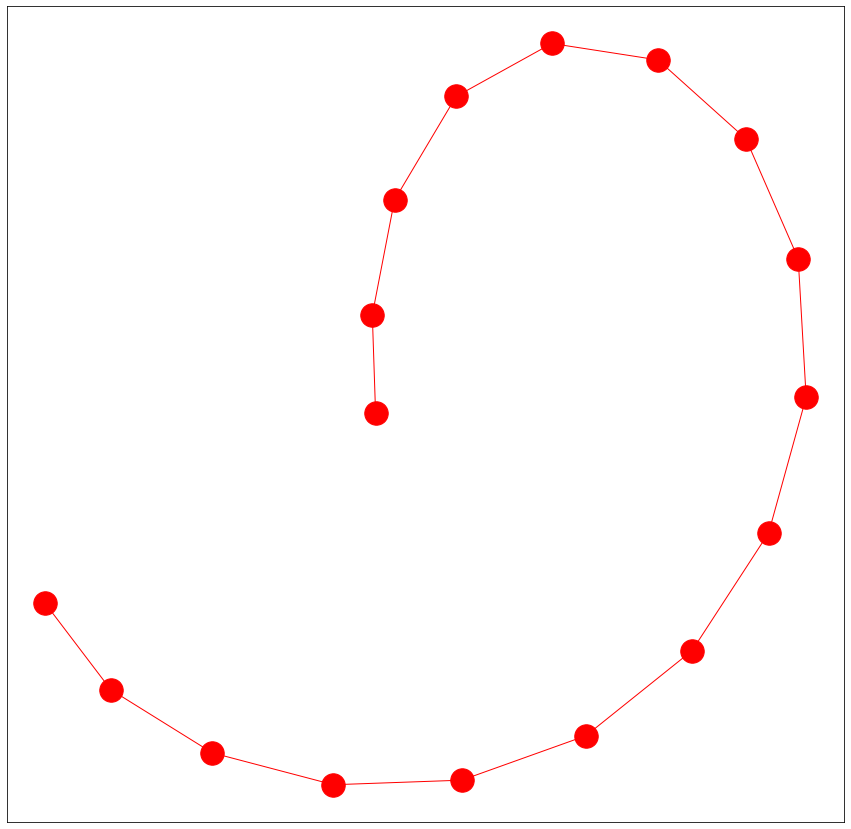

---Normalizing raw data---
----Processing data into windows----
Done---> Total 18 nodes formed
---User#:7 Activity#:3-----
Total nodes present in the graph are-->18
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['172-yellow:0', '172-yellow:1', '172-yellow:2', '172-yellow:3', '172-yellow:4', '172-yellow:5', '172-yellow:6', '172-yellow:7', '172-yellow:8', '172-yellow:9', '172-yellow:10', '172-yellow:11', '172-yellow:12', '172-yellow:13', '172-yellow:14', '172-yellow:15', '172-yellow:16', '172-yellow:17']
Edges of the graphs are:  [('172-yellow:0', '172-yellow:1'), (

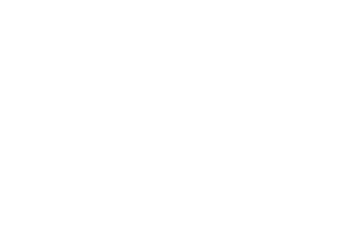

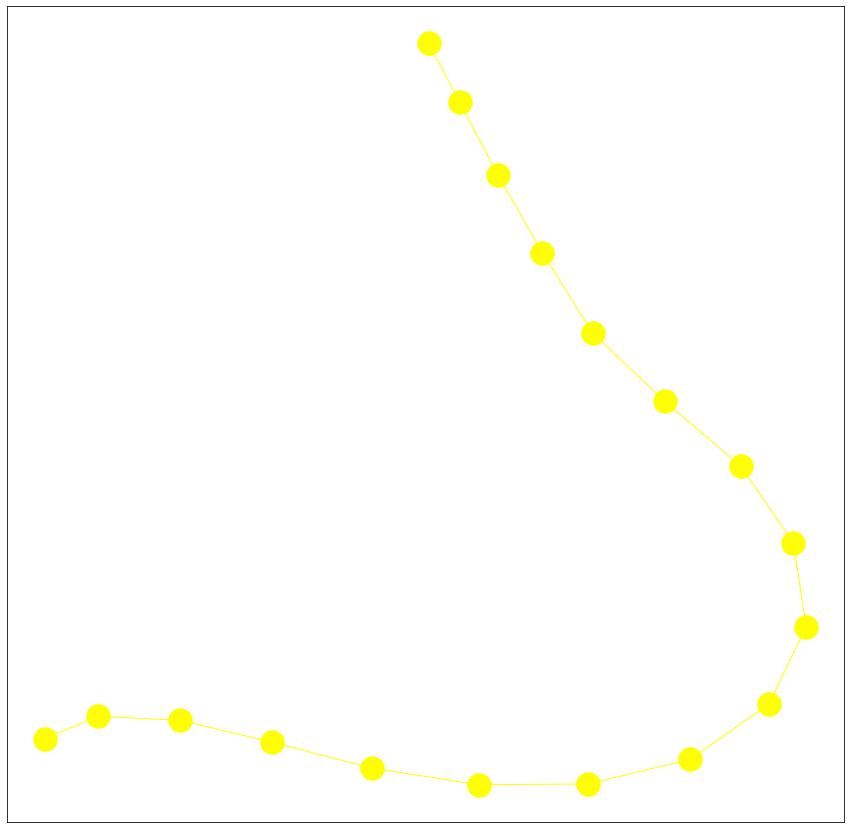

---Normalizing raw data---
----Processing data into windows----
Done---> Total 19 nodes formed
---User#:7 Activity#:2-----
Total nodes present in the graph are-->19
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['173-green:0', '173-green:1', '173-green:2', '173-green:3', '173-green:4', '173-green:5', '173-green:6', '173-green:7', '173-green:8', '173-green:9', '173-green:10', '173-green:11', '173-green:12', '173-green:13', '173-green:14', '173-green:15', '173-green:16', '173-green:17', '173-green:18']
Edges of the graphs are:  [('173-green:

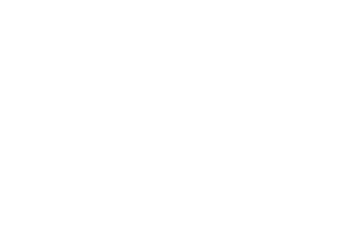

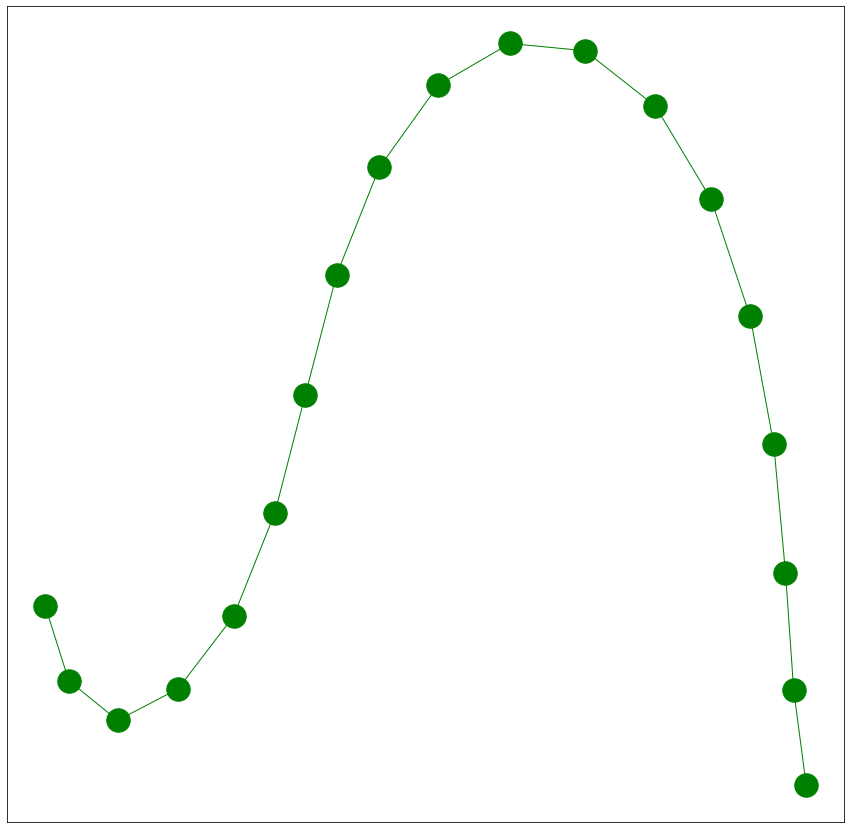

---Normalizing raw data---
----Processing data into windows----
Done---> Total 126 nodes formed
---User#:19 Activity#:1-----
Total nodes present in the graph are-->126
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:
Label of node-->1
Label:


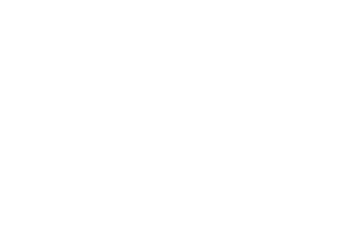

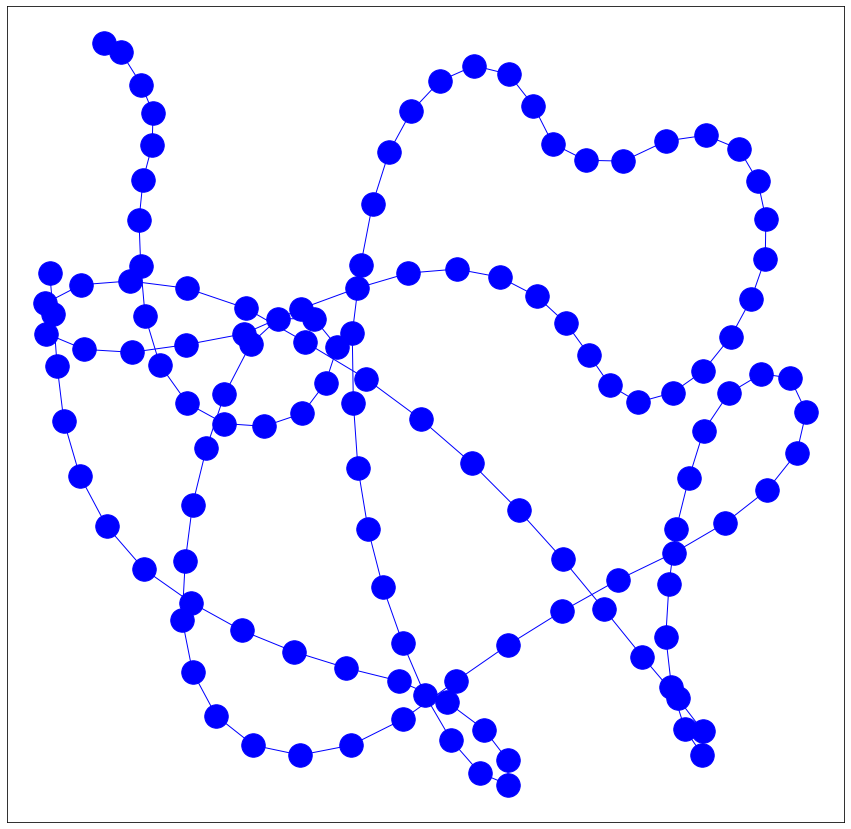

---Normalizing raw data---
----Processing data into windows----
Done---> Total 137 nodes formed
---User#:19 Activity#:5-----
Total nodes present in the graph are-->137
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:
Label of node-->5
Label:


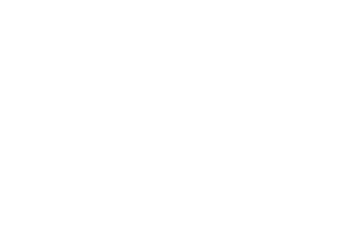

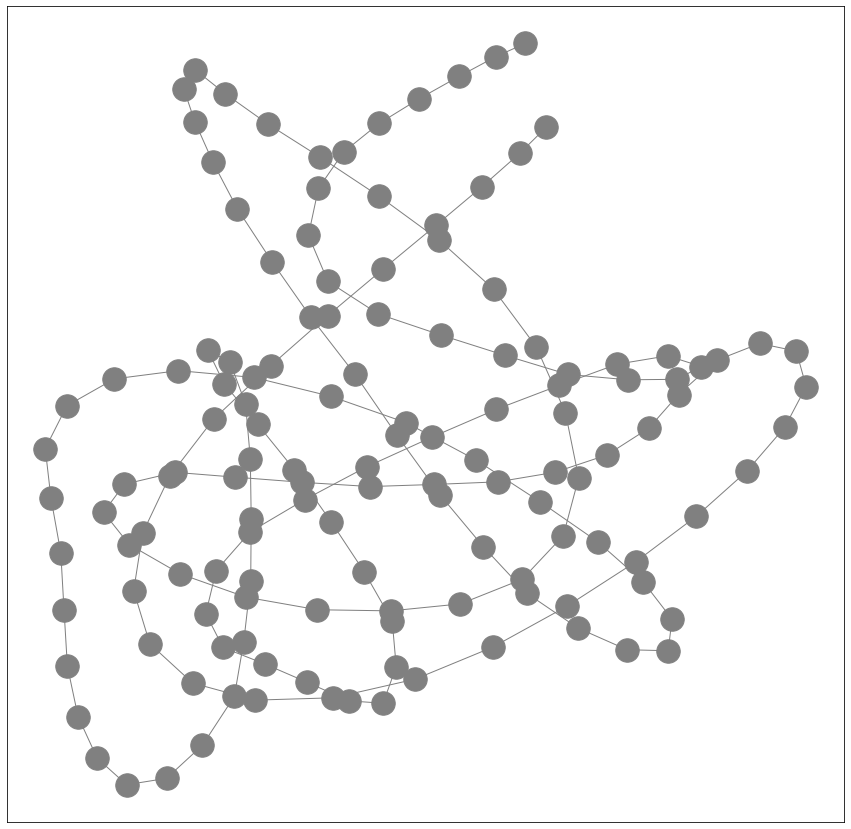

---Normalizing raw data---
----Processing data into windows----
Done---> Total 33 nodes formed
---User#:19 Activity#:4-----
Total nodes present in the graph are-->33
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Label:
Label of node-->4
Nodes of 

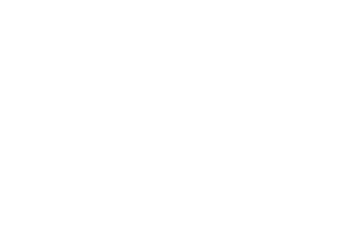

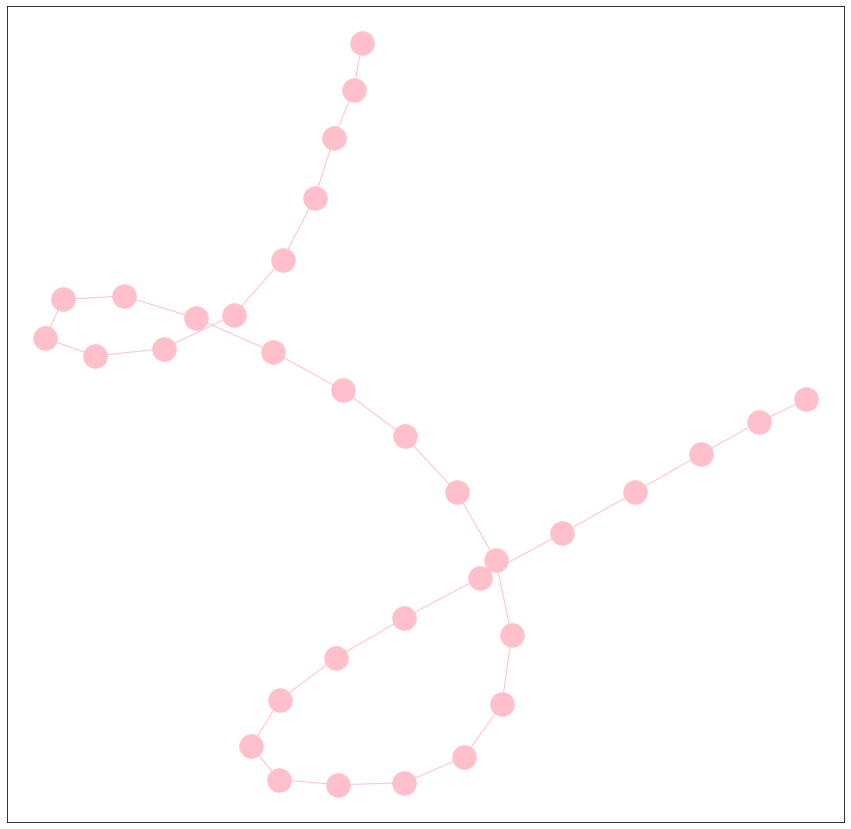

---Normalizing raw data---
----Processing data into windows----
Done---> Total 20 nodes formed
---User#:19 Activity#:0-----
Total nodes present in the graph are-->20
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Label:
Label of node-->0
Nodes of the graphs are:  ['177-red:0', '177-red:1', '177-red:2', '177-red:3', '177-red:4', '177-red:5', '177-red:6', '177-red:7', '177-red:8', '177-red:9', '177-red:10', '177-red:11', '177-red:12', '177-red:13', '177-red:14', '177-red:15', '177-red:16', '177-red:17', '177-red:18', '177-red:19']
Edges of the graphs are:  [('177-red:

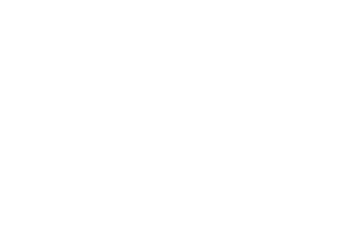

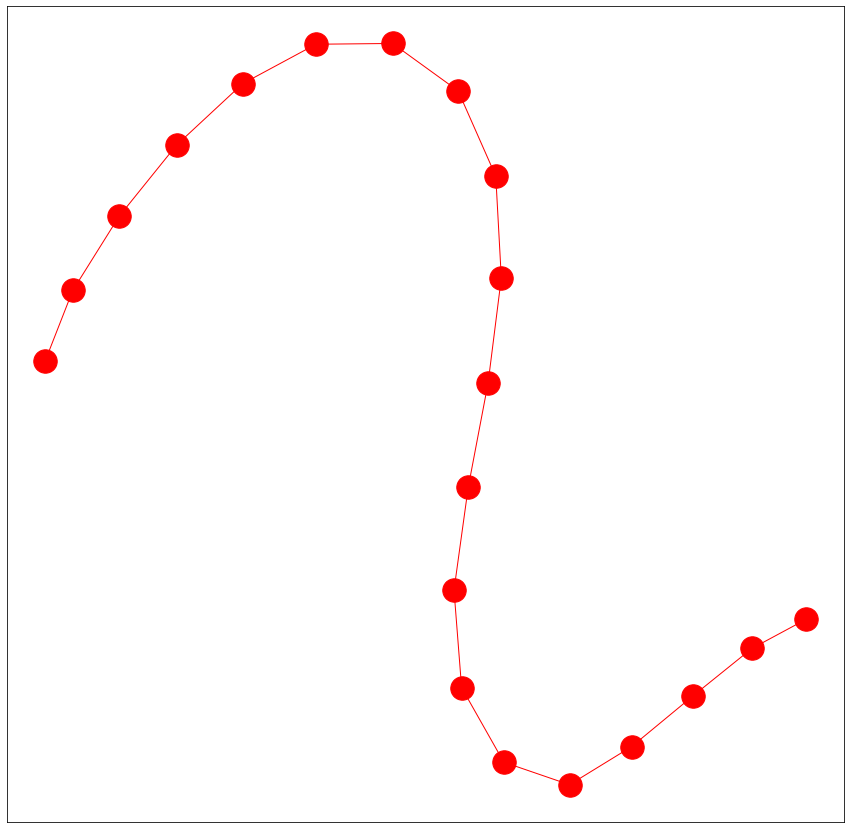

---Normalizing raw data---
----Processing data into windows----
Done---> Total 16 nodes formed
---User#:19 Activity#:3-----
Total nodes present in the graph are-->16
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Label:
Label of node-->3
Nodes of the graphs are:  ['178-yellow:0', '178-yellow:1', '178-yellow:2', '178-yellow:3', '178-yellow:4', '178-yellow:5', '178-yellow:6', '178-yellow:7', '178-yellow:8', '178-yellow:9', '178-yellow:10', '178-yellow:11', '178-yellow:12', '178-yellow:13', '178-yellow:14', '178-yellow:15']
Edges of the graphs are:  [('178-yellow:0', '178-yellow:1'), ('178-yellow:1', '178-yellow:2'), ('178-yellow:2', '178-yellow:3'), ('178-yellow:3',

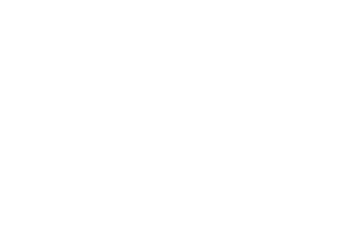

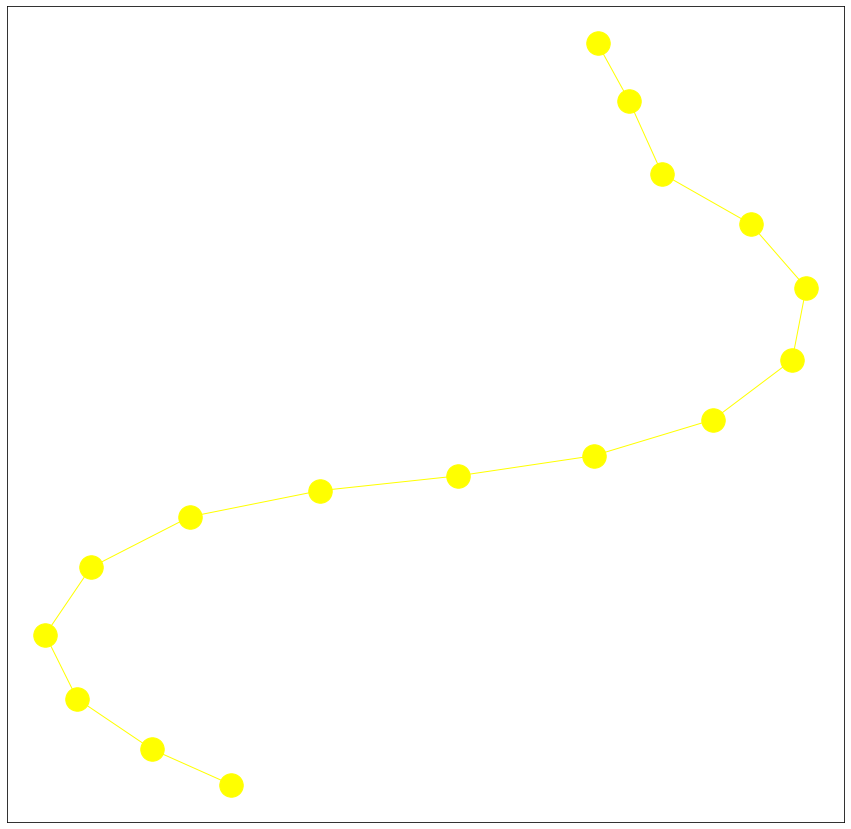

---Normalizing raw data---
----Processing data into windows----
Done---> Total 19 nodes formed
---User#:19 Activity#:2-----
Total nodes present in the graph are-->19
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Label:
Label of node-->2
Nodes of the graphs are:  ['179-green:0', '179-green:1', '179-green:2', '179-green:3', '179-green:4', '179-green:5', '179-green:6', '179-green:7', '179-green:8', '179-green:9', '179-green:10', '179-green:11', '179-green:12', '179-green:13', '179-green:14', '179-green:15', '179-green:16', '179-green:17', '179-green:18']
Edges of the graphs are:  [('179-green

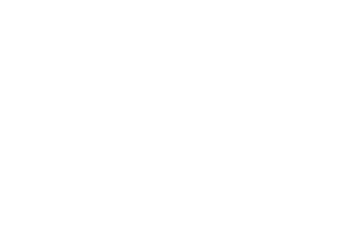

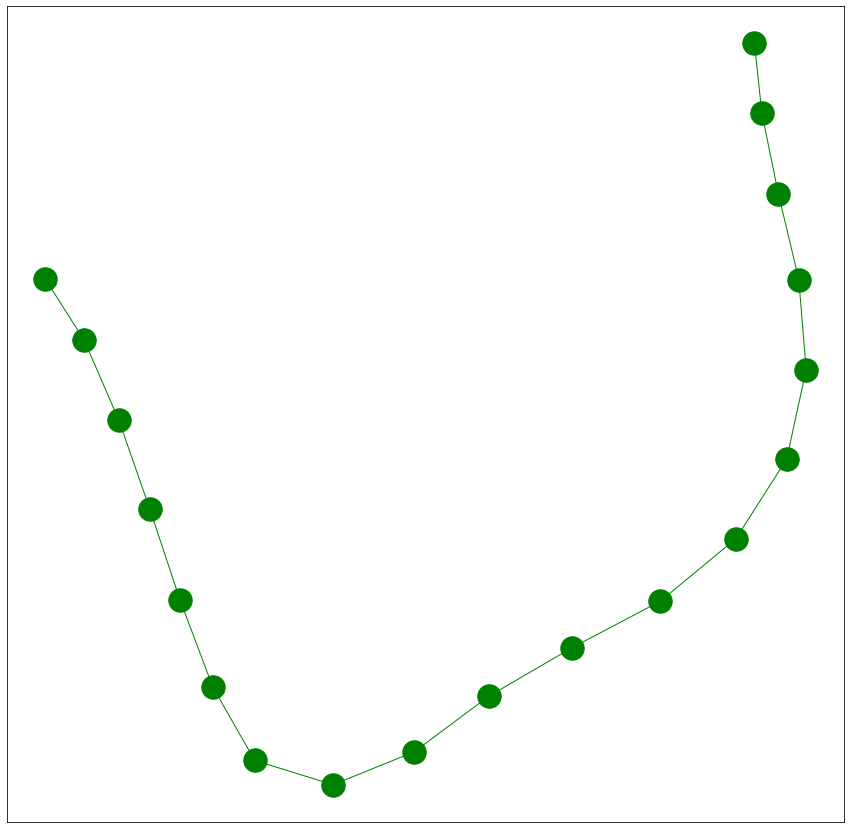

In [15]:
#creating graphs from all the segments given a threshold maximum number of segments for each graph
def update_graphs(df,threesold=600):

  global graph_label_list
  df_list=df.groupby('user-id')
  users=df['user-id'].unique()
  for user in users:
    df_user=df_list.get_group(user)

    activities=df_user['encoded-activity'].unique()
    df_slice_list=df_user.groupby('encoded-activity')

    for activity in activities:

      df_slice=df_slice_list.get_group(activity)

      segments,labels,nodes=segment_labeling_overall(df_slice,TIME_STEPS,TIME_STEPS,FEATURES)

            
      
      for i in range (0,labels.shape[0],threesold):
        print("---User#:"+str(user)+" Activity#:"+str(activity)+"-----")
        G=create_graph(labels[i:i+threesold],segments[i:i+threesold],colors)
        graph_label_list.append(activity)
      


update_graphs(df,600)

  

In [16]:
print(node_map)

{'1-blue:0': 1, '1-blue:1': 2, '1-blue:2': 3, '1-blue:3': 4, '1-blue:4': 5, '1-blue:5': 6, '1-blue:6': 7, '1-blue:7': 8, '1-blue:8': 9, '1-blue:9': 10, '1-blue:10': 11, '1-blue:11': 12, '1-blue:12': 13, '1-blue:13': 14, '1-blue:14': 15, '1-blue:15': 16, '1-blue:16': 17, '1-blue:17': 18, '1-blue:18': 19, '1-blue:19': 20, '1-blue:20': 21, '1-blue:21': 22, '1-blue:22': 23, '2-grey:0': 24, '2-grey:1': 25, '2-grey:2': 26, '2-grey:3': 27, '2-grey:4': 28, '2-grey:5': 29, '2-grey:6': 30, '2-grey:7': 31, '2-grey:8': 32, '2-grey:9': 33, '2-grey:10': 34, '2-grey:11': 35, '2-grey:12': 36, '2-grey:13': 37, '2-grey:14': 38, '2-grey:15': 39, '2-grey:16': 40, '2-grey:17': 41, '2-grey:18': 42, '2-grey:19': 43, '2-grey:20': 44, '2-grey:21': 45, '2-grey:22': 46, '2-grey:23': 47, '2-grey:24': 48, '2-grey:25': 49, '2-grey:26': 50, '2-grey:27': 51, '2-grey:28': 52, '2-grey:29': 53, '2-grey:30': 54, '2-grey:31': 55, '2-grey:32': 56, '2-grey:33': 57, '2-grey:34': 58, '2-grey:35': 59, '2-grey:36': 60, '2-grey:

In [17]:
print(graph_id_map)

{1: <networkx.classes.graph.Graph object at 0x7ff7949b5e48>, 2: <networkx.classes.graph.Graph object at 0x7ff7949b57f0>, 3: <networkx.classes.graph.Graph object at 0x7ff793626ba8>, 4: <networkx.classes.graph.Graph object at 0x7ff78f031a58>, 5: <networkx.classes.graph.Graph object at 0x7ff793672e48>, 6: <networkx.classes.graph.Graph object at 0x7ff78f062940>, 7: <networkx.classes.graph.Graph object at 0x7ff78efa4b38>, 8: <networkx.classes.graph.Graph object at 0x7ff7908a9f98>, 9: <networkx.classes.graph.Graph object at 0x7ff78edfd908>, 10: <networkx.classes.graph.Graph object at 0x7ff79095cd68>, 11: <networkx.classes.graph.Graph object at 0x7ff78edfd518>, 12: <networkx.classes.graph.Graph object at 0x7ff78ee222e8>, 13: <networkx.classes.graph.Graph object at 0x7ff78ed91e48>, 14: <networkx.classes.graph.Graph object at 0x7ff78eed9b70>, 15: <networkx.classes.graph.Graph object at 0x7ff78ee220b8>, 16: <networkx.classes.graph.Graph object at 0x7ff7936ab908>, 17: <networkx.classes.graph.Grap

In [18]:
print(segments_map)

{'1-blue:0': array([-0.32031038, -0.17260814,  0.19896583]), '1-blue:1': array([-0.35515745, -0.06872289,  0.02192648]), '1-blue:2': array([-0.35787987, -0.2665448 ,  0.10531655]), '1-blue:3': array([-0.390285  , -0.173718  ,  0.20908885]), '1-blue:4': array([-0.42371311, -0.16723269,  0.24184113]), '1-blue:5': array([ 0.04789375, -0.06283932,  0.11566655]), '1-blue:6': array([0.05990542, 0.04029712, 0.12000174]), '1-blue:7': array([0.11806636, 0.13073037, 0.04369324]), '1-blue:8': array([ 0.05863496, -0.12519186,  0.16793855]), '1-blue:9': array([-0.0213549 ,  0.06224019, -0.03724552]), '1-blue:10': array([ 1.12555512e-01,  1.01593390e-04, -1.13145470e-01]), '1-blue:11': array([ 0.1578468 ,  0.18147623, -0.09848298]), '1-blue:12': array([ 0.10885961,  0.09736782, -0.07807806]), '1-blue:13': array([ 0.06023542,  0.06285529, -0.08677115]), '1-blue:14': array([ 0.11234102, -0.03820852, -0.24056841]), '1-blue:15': array([ 0.12090429,  0.09611088, -0.01139324]), '1-blue:16': array([ 0.0241

In [19]:
print(list_of_nodes)

['1-blue:0', '1-blue:1', '1-blue:2', '1-blue:3', '1-blue:4', '1-blue:5', '1-blue:6', '1-blue:7', '1-blue:8', '1-blue:9', '1-blue:10', '1-blue:11', '1-blue:12', '1-blue:13', '1-blue:14', '1-blue:15', '1-blue:16', '1-blue:17', '1-blue:18', '1-blue:19', '1-blue:20', '1-blue:21', '1-blue:22', '2-grey:0', '2-grey:1', '2-grey:2', '2-grey:3', '2-grey:4', '2-grey:5', '2-grey:6', '2-grey:7', '2-grey:8', '2-grey:9', '2-grey:10', '2-grey:11', '2-grey:12', '2-grey:13', '2-grey:14', '2-grey:15', '2-grey:16', '2-grey:17', '2-grey:18', '2-grey:19', '2-grey:20', '2-grey:21', '2-grey:22', '2-grey:23', '2-grey:24', '2-grey:25', '2-grey:26', '2-grey:27', '2-grey:28', '2-grey:29', '2-grey:30', '2-grey:31', '2-grey:32', '2-grey:33', '2-grey:34', '2-grey:35', '2-grey:36', '2-grey:37', '2-grey:38', '2-grey:39', '2-grey:40', '2-grey:41', '2-grey:42', '2-grey:43', '2-grey:44', '2-grey:45', '2-grey:46', '2-grey:47', '2-grey:48', '2-grey:49', '2-grey:50', '2-grey:51', '2-grey:52', '2-grey:53', '2-grey:54', '2-gr

In [20]:
print(list_of_edges)

[('1-blue:0', '1-blue:1'), ('1-blue:1', '1-blue:2'), ('1-blue:2', '1-blue:3'), ('1-blue:3', '1-blue:4'), ('1-blue:4', '1-blue:5'), ('1-blue:5', '1-blue:6'), ('1-blue:6', '1-blue:7'), ('1-blue:7', '1-blue:8'), ('1-blue:8', '1-blue:9'), ('1-blue:9', '1-blue:10'), ('1-blue:10', '1-blue:11'), ('1-blue:11', '1-blue:12'), ('1-blue:12', '1-blue:13'), ('1-blue:13', '1-blue:14'), ('1-blue:14', '1-blue:15'), ('1-blue:15', '1-blue:16'), ('1-blue:16', '1-blue:17'), ('1-blue:17', '1-blue:18'), ('1-blue:18', '1-blue:19'), ('1-blue:19', '1-blue:20'), ('1-blue:20', '1-blue:21'), ('1-blue:21', '1-blue:22'), ('2-grey:0', '2-grey:1'), ('2-grey:1', '2-grey:2'), ('2-grey:2', '2-grey:3'), ('2-grey:3', '2-grey:4'), ('2-grey:4', '2-grey:5'), ('2-grey:5', '2-grey:6'), ('2-grey:6', '2-grey:7'), ('2-grey:7', '2-grey:8'), ('2-grey:8', '2-grey:9'), ('2-grey:9', '2-grey:10'), ('2-grey:10', '2-grey:11'), ('2-grey:11', '2-grey:12'), ('2-grey:12', '2-grey:13'), ('2-grey:13', '2-grey:14'), ('2-grey:14', '2-grey:15'), (

In [21]:
print(node_label_list)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 

In [22]:
print(graph_label_list)

[1, 5, 4, 0, 3, 2, 5, 1, 4, 0, 5, 1, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 1, 5, 4, 0, 1, 5, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 1, 5, 0, 4, 2, 3, 5, 1, 4, 0, 2, 3, 5, 1, 3, 2, 5, 4, 0, 1, 5, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 5, 1, 4, 0, 3, 5, 4, 0, 3, 5, 1, 4, 0, 5, 1, 0, 4, 5, 1, 4, 0, 3, 2, 5, 1, 2, 4, 0, 3, 5, 1, 4, 0, 5, 1, 0, 4, 2, 5, 4, 0, 2, 3, 5, 1, 3, 2, 4, 0, 5, 1, 4, 0, 2, 3, 5, 1, 4, 0, 2, 3, 5, 1, 2, 3, 4, 0, 5, 1, 2, 3, 4, 0, 5, 1, 4, 0, 5, 1, 4, 0, 5, 5, 1, 5, 1, 1, 5, 4, 0, 3, 2, 1, 5, 4, 0, 3, 2]


In [ ]:
print(len(node_map))
print(len(graph_id_map))
print(len(segments_map))
print(len(list_of_nodes))
print(len(list_of_edges))
print(len(node_label_list))
print(len(graph_label_list))

8490
649
8490
8490
7841
8490
649


In [ ]:
activity_map={}
activities=df['encoded-activity'].unique()
for activity in activities:
  name=df[df['encoded-activity']==activity]['activity'].unique()[0]
  activity_map[activity]=name

print(activity_map)

{1: 'Jogging', 5: 'Walking', 4: 'Upstairs', 0: 'Downstairs', 2: 'Sitting', 3: 'Standing'}


In [ ]:
print(node_id,graph_id)

8491 650


In [ ]:
df_A=pd.DataFrame()
df_node_label=pd.DataFrame()
df_graph_label=pd.DataFrame()
df_node_attr=pd.DataFrame()
df_graph_indicator=pd.DataFrame()

In [ ]:
def create_node_dataframes(node_map,list_of_nodes,node_label_list,segments_map,activity_map):
  df_node_label=pd.DataFrame(columns=["label",'activity-name'])
  df_node_attr=pd.DataFrame(columns=["mean_x","mean_y","mean_z"])
  df_graph_indicator=pd.DataFrame(columns=["graph-id"])
  cnt=len(node_label_list)
  print("Total node count--->"+str(cnt))
  for i in range(cnt):
    node=list_of_nodes[i]
    graph_id=node.split('-')[0]
    label=node_label_list[i]
    name=activity_map[label]
    segment=segments_map[node]
    df_node_label=df_node_label.append({"label":label+1,"activity-name":name},ignore_index=True)
    df_node_attr=df_node_attr.append({"mean_x":segment[0],"mean_y":segment[1],"mean_z":segment[2]},ignore_index=True)
    df_graph_indicator=df_graph_indicator.append({"graph-id":graph_id},ignore_index=True)
  
  df_node_label=df_node_label.astype({"label": int})
  df_graph_indicator=df_graph_indicator.astype({"graph-id": int})
  print("Dataframe creation done")
  return df_node_label,df_node_attr,df_graph_indicator

In [ ]:
df_node_label,df_node_attr,df_graph_indicator=create_node_dataframes(node_map,list_of_nodes,node_label_list,segments_map,activity_map)

Total node count--->8490
Dataframe creation done


In [ ]:
print(df_node_label)

      label activity-name
0         2       Jogging
1         2       Jogging
2         2       Jogging
3         2       Jogging
4         2       Jogging
...     ...           ...
8485      3       Sitting
8486      3       Sitting
8487      3       Sitting
8488      3       Sitting
8489      3       Sitting

[8490 rows x 2 columns]


In [ ]:
print(df_node_attr)

        mean_x    mean_y    mean_z
0    -0.320310 -0.172608  0.198966
1    -0.355157 -0.068723  0.021926
2    -0.357880 -0.266545  0.105317
3    -0.390285 -0.173718  0.209089
4    -0.423713 -0.167233  0.241841
...        ...       ...       ...
8485  0.084016  1.290969  0.624009
8486 -0.233208  0.577424  1.103131
8487  0.246944 -0.223209 -0.586293
8488  0.195153 -0.946633 -0.876551
8489 -0.058950 -2.052443 -0.930104

[8490 rows x 3 columns]


In [ ]:
print(df_graph_indicator)

      graph-id
0            1
1            1
2            1
3            1
4            1
...        ...
8485       648
8486       649
8487       649
8488       649
8489       649

[8490 rows x 1 columns]


In [ ]:
def create_edge_dataframe(edge_list,node_map):
  df=pd.DataFrame(columns=["node-1","node-2"])
  cnt=len(edge_list)
  print("Total edge count-->"+str(cnt))
  #id=1

  for i in range(cnt):
    edge=edge_list[i]
    node1=edge[0]
    node2=edge[1]
    print("node-1-->"+node1)
    print("node-2-->"+node2)
    id1=node_map[node1]
    id2=node_map[node2]
    df=df.append({"node-1":id1,"node-2":id2},ignore_index=True)
    df=df.append({"node-1":id2,"node-2":id1},ignore_index=True)
    
  df=df.astype({"node-1": int, "node-2": int})
    # id+=1
  
  return df

In [ ]:
df_A=create_edge_dataframe(list_of_edges,node_map)

Streaming output truncated to the last 5000 lines.
node-2-->443-blue:10
node-1-->443-blue:10
node-2-->443-blue:11
node-1-->443-blue:11
node-2-->443-blue:12
node-1-->443-blue:12
node-2-->443-blue:13
node-1-->443-blue:13
node-2-->443-blue:14
node-1-->444-blue:0
node-2-->444-blue:1
node-1-->444-blue:1
node-2-->444-blue:2
node-1-->444-blue:2
node-2-->444-blue:3
node-1-->444-blue:3
node-2-->444-blue:4
node-1-->444-blue:4
node-2-->444-blue:5
node-1-->444-blue:5
node-2-->444-blue:6
node-1-->444-blue:6
node-2-->444-blue:7
node-1-->444-blue:7
node-2-->444-blue:8
node-1-->444-blue:8
node-2-->444-blue:9
node-1-->444-blue:9
node-2-->444-blue:10
node-1-->444-blue:10
node-2-->444-blue:11
node-1-->444-blue:11
node-2-->444-blue:12
node-1-->444-blue:12
node-2-->444-blue:13
node-1-->444-blue:13
node-2-->444-blue:14
node-1-->445-blue:0
node-2-->445-blue:1
node-1-->445-blue:1
node-2-->445-blue:2
node-1-->445-blue:2
node-2-->445-blue:3
node-1-->445-blue:3
node-2-->445-blue:4
node-1-->445-blue:4
node-2-->44

In [ ]:
print(df_A)

       node-1  node-2
0           1       2
1           2       1
2           2       3
3           3       2
4           3       4
...       ...     ...
15677    8488    8487
15678    8488    8489
15679    8489    8488
15680    8489    8490
15681    8490    8489

[15682 rows x 2 columns]


In [ ]:
def create_graph_dataframe(graph_label_list,activity_map):
  df=pd.DataFrame(columns=["Label","Activity-Name"])
  cnt=len(graph_label_list)
  print("No of graphs--->"+str(cnt))
  for i in range(cnt):
    id=i+1
    label=graph_label_list[i]
    name=activity_map[label]
    df=df.append({"Label": label+1,"Activity-Name": name},ignore_index=True)
  df=df.astype({"Label": int})
  return df

In [ ]:
df_graph_label=create_graph_dataframe(graph_label_list,activity_map)
print(df_graph_label)

No of graphs--->649
     Label Activity-Name
0        2       Jogging
1        2       Jogging
2        6       Walking
3        6       Walking
4        6       Walking
..     ...           ...
644      1    Downstairs
645      4      Standing
646      4      Standing
647      3       Sitting
648      3       Sitting

[649 rows x 2 columns]


In [ ]:
for activity in activities:
  print("Activity Name---> "+str(activity_map[activity])+" No of graphs---> "+str(len(df_graph_label[df_graph_label['Activity-Name']==activity_map[activity]])))

Activity Name---> Jogging No of graphs---> 195
Activity Name---> Walking No of graphs---> 236
Activity Name---> Upstairs No of graphs---> 78
Activity Name---> Downstairs No of graphs---> 65
Activity Name---> Sitting No of graphs---> 42
Activity Name---> Standing No of graphs---> 33


In [ ]:
def save_dataframe_to_txt(df,filepath):
  df.to_csv(filepath,header=None,index=None,sep=',',mode='w')

In [ ]:
sourcepath='/content/drive/My Drive/Graph_WISDM_Dataset_Graph_Classification/raw/unbalanced'

In [ ]:
save_dataframe_to_txt(df_A,sourcepath+'/WISDM_A.txt')
save_dataframe_to_txt(df_graph_indicator,sourcepath+'/WISDM_graph_indicator.txt')
save_dataframe_to_txt(df_graph_label,sourcepath+'/WISDM_graph_label.txt')
save_dataframe_to_txt(df_node_attr,sourcepath+'/WISDM_node_attr.txt')
save_dataframe_to_txt(df_node_label,sourcepath+'/WISDM_node_label.txt')